# alpha beta gamma

In [1]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from keras.models import Model,Sequential
from sklearn.model_selection import train_test_split
from keras.layers import Flatten,Dense,Activation
from keras.optimizers import Adam


2024-01-06 10:35:28.255573: E tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:9342] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-01-06 10:35:28.255614: E tensorflow/compiler/xla/stream_executor/cuda/cuda_fft.cc:609] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-01-06 10:35:28.255631: E tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:1518] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-01-06 10:35:28.261326: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-01-06 10:35:28.978727: W tensorflow/compiler/

In [2]:
import numpy as np
from mealpy.optimizer import Optimizer
# from mealpy.optimizer import Optimizer

In [3]:
import pandas as pd
from sklearn.model_selection import train_test_split

In [4]:
# data = pd.read_csv("/home3/222it022/majorcode/major_dataset/data_arc.csv",sep= ',')
from scipy.io import arff
import pandas as pd

df= arff.loadarff('/home/student/major_code/cleaneddata/KC1.arff')
data = pd.DataFrame(df[0])


originalfeatures= data.columns
print('original features len', len(originalfeatures))
print('original features', (originalfeatures))
print(data.head())

original features len 22
original features Index(['LOC_BLANK', 'BRANCH_COUNT', 'LOC_CODE_AND_COMMENT', 'LOC_COMMENTS',
       'CYCLOMATIC_COMPLEXITY', 'DESIGN_COMPLEXITY', 'ESSENTIAL_COMPLEXITY',
       'LOC_EXECUTABLE', 'HALSTEAD_CONTENT', 'HALSTEAD_DIFFICULTY',
       'HALSTEAD_EFFORT', 'HALSTEAD_ERROR_EST', 'HALSTEAD_LENGTH',
       'HALSTEAD_LEVEL', 'HALSTEAD_PROG_TIME', 'HALSTEAD_VOLUME',
       'NUM_OPERANDS', 'NUM_OPERATORS', 'NUM_UNIQUE_OPERANDS',
       'NUM_UNIQUE_OPERATORS', 'LOC_TOTAL', 'Defective'],
      dtype='object')
   LOC_BLANK  BRANCH_COUNT  LOC_CODE_AND_COMMENT  LOC_COMMENTS  \
0        0.0           1.0                   0.0           0.0   
1        0.0           1.0                   0.0           0.0   
2        0.0           1.0                   0.0           0.0   
3        0.0           1.0                   0.0           0.0   
4        2.0           1.0                   0.0           0.0   

   CYCLOMATIC_COMPLEXITY  DESIGN_COMPLEXITY  ESSENTIAL_COMPLEXI

In [5]:
def map_to_int(value):
    if value == b'Y':
        return 1
    elif value == b'N':
        return 0
    else:
        return None

# Apply the mapping function to the 'object_column' and create a new column 'integer_column'
data['Defective'] = data['Defective'].apply(map_to_int)

In [6]:
X=data.drop(labels=['Defective'], axis=1)
y=data['Defective']

In [7]:
#check for non-numeric value in each column

for column in data.columns:
    numeric_column = pd.to_numeric(data[column], errors='coerce')
    non_numeric_indices = pd.isna(numeric_column)
    
    if non_numeric_indices.any():
        print(f"Column '{column}' contains non-numeric values at indices: {non_numeric_indices[non_numeric_indices].index.tolist()}")
    else:
        print(f"Column '{column}' contains only numeric values.")

Column 'LOC_BLANK' contains only numeric values.
Column 'BRANCH_COUNT' contains only numeric values.
Column 'LOC_CODE_AND_COMMENT' contains only numeric values.
Column 'LOC_COMMENTS' contains only numeric values.
Column 'CYCLOMATIC_COMPLEXITY' contains only numeric values.
Column 'DESIGN_COMPLEXITY' contains only numeric values.
Column 'ESSENTIAL_COMPLEXITY' contains only numeric values.
Column 'LOC_EXECUTABLE' contains only numeric values.
Column 'HALSTEAD_CONTENT' contains only numeric values.
Column 'HALSTEAD_DIFFICULTY' contains only numeric values.
Column 'HALSTEAD_EFFORT' contains only numeric values.
Column 'HALSTEAD_ERROR_EST' contains only numeric values.
Column 'HALSTEAD_LENGTH' contains only numeric values.
Column 'HALSTEAD_LEVEL' contains only numeric values.
Column 'HALSTEAD_PROG_TIME' contains only numeric values.
Column 'HALSTEAD_VOLUME' contains only numeric values.
Column 'NUM_OPERANDS' contains only numeric values.
Column 'NUM_OPERATORS' contains only numeric values.


mean_col1 = data['col1'].mean()
data['col1'].fillna(mean_col1, inplace=True)
data['']

In [8]:
data.describe()

,LOC_BLANK,BRANCH_COUNT,LOC_CODE_AND_COMMENT,LOC_COMMENTS,CYCLOMATIC_COMPLEXITY,DESIGN_COMPLEXITY,ESSENTIAL_COMPLEXITY,LOC_EXECUTABLE,HALSTEAD_CONTENT,HALSTEAD_DIFFICULTY,...,HALSTEAD_LENGTH,HALSTEAD_LEVEL,HALSTEAD_PROG_TIME,HALSTEAD_VOLUME,NUM_OPERANDS,NUM_OPERATORS,NUM_UNIQUE_OPERANDS,NUM_UNIQUE_OPERATORS,LOC_TOTAL,Defective
count,2095.000000,2095.000000,2095.000000,2095.000000,2095.000000,2095.000000,2095.000000,2095.000000,2095.000000,2095.000000,...,2095.000000,2095.000000,2095.000000,2095.000000,2095.000000,2095.000000,2095.000000,2095.000000,2095.000000,2095.000000
mean,1.769928,4.677804,0.132220,0.950835,2.843914,2.550358,1.678759,14.619570,21.366726,6.815093,...,50.157518,0.319857,293.189905,260.415513,18.908831,31.248687,9.598091,7.681146,20.375656,0.155131
std,3.867375,7.816286,0.704866,3.094650,3.912850,3.386475,2.207351,24.241343,21.506989,7.871427,...,83.781952,0.314928,972.106396,517.610651,32.146331,51.887825,12.213353,5.717189,29.838929,0.362116
min,0.000000,1.000000,0.000000,0.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000
25%,0.000000,1.000000,0.000000,0.000000,1.000000,1.000000,1.000000,0.000000,5.330000,1.500000,...,4.000000,0.080000,0.670000,8.000000,1.000000,3.000000,1.000000,3.000000,3.000000,0.000000
50%,0.000000,1.000000,0.000000,0.000000,1.000000,1.000000,1.000000,5.000000,14.450000,3.500000,...,17.000000,0.200000,12.270000,58.810000,6.000000,10.000000,5.000000,6.000000,9.000000,0.000000
75%,2.000000,5.000000,0.000000,0.000000,3.000000,3.000000,1.000000,17.000000,29.890000,9.320000,...,58.000000,0.670000,127.270000,270.510000,22.000000,36.000000,13.000000,11.000000,24.000000,0.000000
max,58.000000,89.000000,12.000000,44.000000,45.000000,45.000000,26.000000,262.000000,193.060000,53.750000,...,1106.000000,2.000000,18044.640000,7918.820000,428.000000,678.000000,120.000000,37.000000,288.000000,1.000000


In [9]:
import numpy as np
import pandas as pd

def find_outliers_IQR(df, column_name):
    """
    Identify and replace outliers in a specified column using the IQR method.

    Parameters:
    - df: pandas DataFrame
        The DataFrame containing the data.
    - column_name: str
        The name of the column for which outliers should be identified and replaced.

    Returns:
    - df: pandas DataFrame
        The DataFrame with outliers replaced in the specified column.
    """

    # Calculate the upper and lower limits
    upper_limit = df[column_name].mean() + 3 * df[column_name].std()
    lower_limit = df[column_name].mean() - 3 * df[column_name].std()

    # Replace outliers with the upper or lower limit
    df[column_name] = np.where(df[column_name] > upper_limit, upper_limit,
                               np.where(df[column_name] < lower_limit, lower_limit, df[column_name]))

    return df

# Example usage:
# Assuming 'data' is your DataFrame and 'LOC_BLANK' is the column to process
# data = find_outliers_IQR(data, 'LOC_BLANK')


In [10]:
import pandas as pd

# Assuming you have a DataFrame named 'data'
# You may need to import the find_outliers_IQR function from the previous response

def find_outliers_for_all_columns(df):
    """
    Identify and replace outliers in all columns of a DataFrame using the IQR method.

    Parameters:
    - df: pandas DataFrame
        The DataFrame containing the data.

    Returns:
    - df: pandas DataFrame
        The DataFrame with outliers replaced in all columns.
    """
    for column in df.columns:
        df = find_outliers_IQR(df, column)
    
    return df

# Example usage:
X = find_outliers_for_all_columns(X)
X.describe()

,LOC_BLANK,BRANCH_COUNT,LOC_CODE_AND_COMMENT,LOC_COMMENTS,CYCLOMATIC_COMPLEXITY,DESIGN_COMPLEXITY,ESSENTIAL_COMPLEXITY,LOC_EXECUTABLE,HALSTEAD_CONTENT,HALSTEAD_DIFFICULTY,...,HALSTEAD_ERROR_EST,HALSTEAD_LENGTH,HALSTEAD_LEVEL,HALSTEAD_PROG_TIME,HALSTEAD_VOLUME,NUM_OPERANDS,NUM_OPERATORS,NUM_UNIQUE_OPERANDS,NUM_UNIQUE_OPERATORS,LOC_TOTAL
count,2095.000000,2095.000000,2095.000000,2095.000000,2095.000000,2095.000000,2095.000000,2095.000000,2095.000000,2095.000000,...,2095.000000,2095.000000,2095.000000,2095.000000,2095.000000,2095.000000,2095.000000,2095.000000,2095.000000,2095.000000
mean,1.608647,4.368601,0.095299,0.796480,2.691664,2.424424,1.576440,13.844641,20.948210,6.648564,...,0.079479,47.287438,0.313156,244.085939,240.160058,17.778728,29.504699,9.323265,7.645577,19.352888
std,2.953558,6.296549,0.402634,2.041447,3.162751,2.737582,1.657313,20.381239,19.637787,7.208475,...,0.135756,69.325975,0.285586,613.487432,406.011946,26.490489,43.030529,11.041778,5.593011,24.876939
min,0.000000,1.000000,0.000000,0.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
25%,0.000000,1.000000,0.000000,0.000000,1.000000,1.000000,1.000000,0.000000,5.330000,1.500000,...,0.000000,4.000000,0.080000,0.670000,8.000000,1.000000,3.000000,1.000000,3.000000,3.000000
50%,0.000000,1.000000,0.000000,0.000000,1.000000,1.000000,1.000000,5.000000,14.450000,3.500000,...,0.020000,17.000000,0.200000,12.270000,58.810000,6.000000,10.000000,5.000000,6.000000,9.000000
75%,2.000000,5.000000,0.000000,0.000000,3.000000,3.000000,1.000000,17.000000,29.890000,9.320000,...,0.090000,58.000000,0.670000,127.270000,270.510000,22.000000,36.000000,13.000000,11.000000,24.000000
max,13.372055,28.126662,2.246818,10.234784,14.582463,12.709783,8.300813,87.343598,85.887693,30.429373,...,0.604656,301.503374,1.264641,3209.509092,1813.247466,115.347825,186.912164,46.238150,24.832712,109.892443


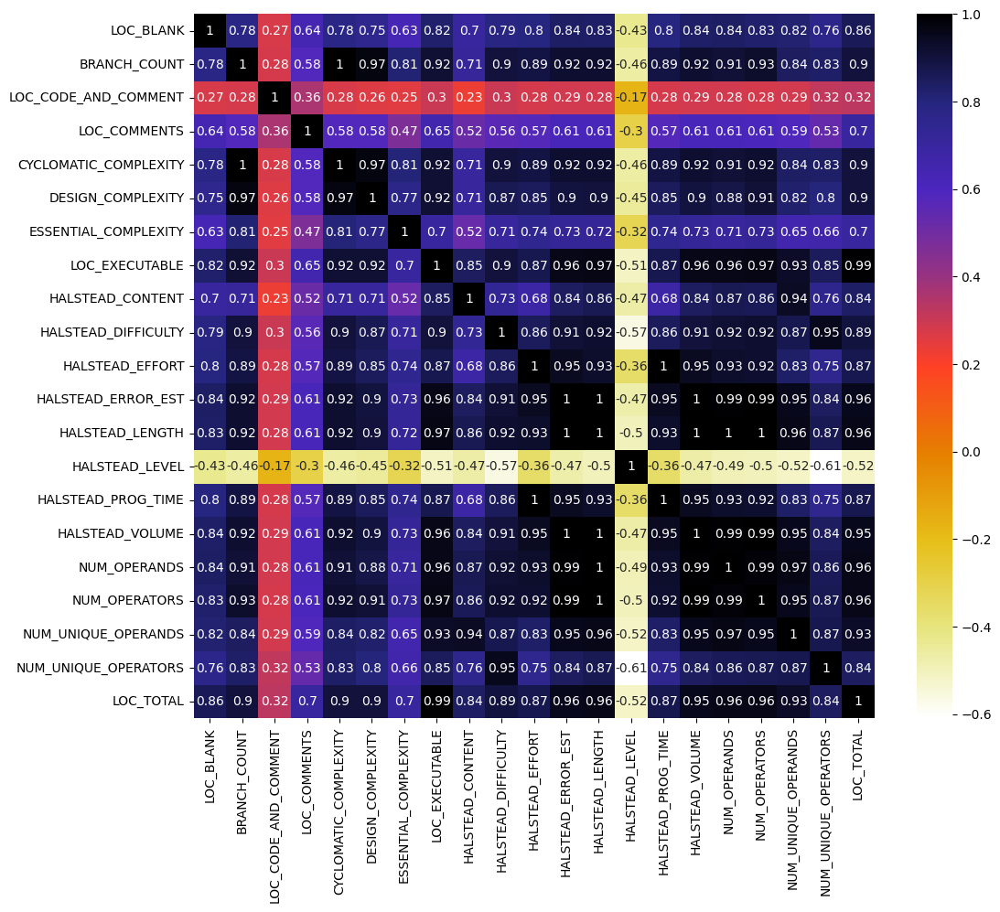

In [11]:
import seaborn as sns
#Using Pearson Correlation
plt.figure(figsize=(12,10))
cor = X.corr()
sns.heatmap(cor, annot=True, cmap=plt.cm.CMRmap_r)
plt.show()

In [12]:

def correlation(dataset, threshold):
    col_corr = set()  # Set of all the names of correlated columns
    corr_matrix = dataset.corr()
    for i in range(len(corr_matrix.columns)):
        for j in range(i):
            if abs(corr_matrix.iloc[i, j]) > threshold: # we are interested in absolute coeff value
                colname = corr_matrix.columns[i]  # getting the name of column
                col_corr.add(colname)
    return col_corr

corr_features = correlation(X, 0.97)
print(len(set(corr_features)))
print(corr_features)

7
{'CYCLOMATIC_COMPLEXITY', 'HALSTEAD_VOLUME', 'HALSTEAD_PROG_TIME', 'NUM_OPERATORS', 'LOC_TOTAL', 'NUM_OPERANDS', 'HALSTEAD_LENGTH'}


In [13]:
X=X.drop(['NUM_OPERATORS', 'HALSTEAD_VOLUME', 'NUM_OPERANDS', 'HALSTEAD_LENGTH', 'HALSTEAD_PROG_TIME', 'LOC_TOTAL', 'CYCLOMATIC_COMPLEXITY'],axis=1)

In [14]:
from sklearn.preprocessing import MinMaxScaler
from pandas import DataFrame
trans = MinMaxScaler()
X = trans.fit_transform(X)
# # convert the array back to a dataframe
X = DataFrame(X)
# summarize
print(X.describe())

                0            1            2            3            4   \
count  2095.000000  2095.000000  2095.000000  2095.000000  2095.000000   
mean      0.120299     0.124180     0.042415     0.077821     0.121644   
std       0.220875     0.232117     0.179202     0.199462     0.233786   
min       0.000000     0.000000     0.000000     0.000000     0.000000   
25%       0.000000     0.000000     0.000000     0.000000     0.000000   
50%       0.000000     0.000000     0.000000     0.000000     0.000000   
75%       0.149566     0.147456     0.000000     0.000000     0.170797   
max       1.000000     1.000000     1.000000     1.000000     1.000000   

                5            6            7            8            9   \
count  2095.000000  2095.000000  2095.000000  2095.000000  2095.000000   
mean      0.078956     0.158508     0.243902     0.218492     0.076051   
std       0.227004     0.233346     0.228645     0.236892     0.191147   
min       0.000000     0.000000     0

In [15]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3,  random_state = 100)

In [16]:
i= X_train.shape[1]

In [17]:
i

14

In [18]:
from mealpy import FloatVar
def fitness_function(position):
    learningrate,n1,n2,batch_size,epochs,_,_,_ = position
    n1,n2,batch_size,epochs=int(n1),int(n2),int(batch_size),int(epochs)
    print(learningrate,n1,n2,batch_size,epochs)
    classifier = Sequential()
    classifier.add(Dense(n1, activation='relu', kernel_initializer='glorot_uniform',input_dim=i))
    classifier.add(Dense(n2, activation='relu', kernel_initializer='glorot_uniform'))
    # classifier.add(Dense(n3, activation='relu', kernel_initializer='glorot_uniform'))
    classifier.add(Dense(1, activation='sigmoid', kernel_initializer='glorot_uniform'))
    opt = Adam(learning_rate=learningrate)
    classifier.compile(optimizer = opt, loss = 'binary_crossentropy', metrics = ['accuracy'])


    history = classifier.fit(X_train,y_train, epochs=int(epochs),batch_size=batch_size, validation_data=(X_test, y_test))
    return history.history['val_accuracy'][-1]

In [19]:
#!/usr/bin/env python
# Created by "Thieu" at 14:53, 17/03/2020 ----------%
#       Email: nguyenthieu2102@gmail.com            %
#       Github: https://github.com/thieu1995        %
# --------------------------------------------------%

import numpy as np
from mealpy.optimizer import Optimizer


class OriginalGOA(Optimizer):
    """
    The original version of: Grasshopper Optimization Algorithm (GOA)

    Links:
        1. https://dx.doi.org/10.1016/j.advengsoft.2017.01.004
        2. https://www.mathworks.com/matlabcentral/fileexchange/61421-grasshopper-optimisation-algorithm-goa

    Hyper-parameters should fine-tune in approximate range to get faster convergence toward the global optimum:
        + c_min (float): coefficient c min, default = 0.00004
        + c_max (float): coefficient c max, default = 2.0

    Examples
    ~~~~~~~~
    >>> import numpy as np
    >>> from mealpy import FloatVar, GOA
    >>>
    >>> def objective_function(solution):
    >>>     return np.sum(solution**2)
    >>>
    >>> problem_dict = {
    >>>     "bounds": FloatVar(n_vars=30, lb=(-10.,) * 30, ub=(10.,) * 30, name="delta"),
    >>>     "minmax": "min",
    >>>     "obj_func": objective_function
    >>> }
    >>>
    >>> model = GOA.OriginalGOA(epoch=1000, pop_size=50, c_min = 0.00004, c_max = 1.0)
    >>> g_best = model.solve(problem_dict)
    >>> print(f"Solution: {g_best.solution}, Fitness: {g_best.target.fitness}")
    >>> print(f"Solution: {model.g_best.solution}, Fitness: {model.g_best.target.fitness}")

    References
    ~~~~~~~~~~
    [1] Saremi, S., Mirjalili, S. and Lewis, A., 2017. Grasshopper optimisation algorithm:
    theory and application. Advances in Engineering Software, 105, pp.30-47.
    """

    def __init__(self, epoch: int = 10000, pop_size: int = 100, c_min: float = 0.00004, c_max: float = 2.0, **kwargs: object) -> None:
        """
        Args:
            epoch (int): maximum number of iterations, default = 10000
            pop_size (int): number of population size, default = 100
            c_min (float): coefficient c min, default=0.00004
            c_max (float): coefficient c max, default=2.0
        """
        super().__init__(**kwargs)
        self.epoch = self.validator.check_int("epoch", epoch, [1, 100000])
        self.pop_size = self.validator.check_int("pop_size", pop_size, [5, 10000])
        self.c_min = self.validator.check_float("c_min", c_min, [0.00001, 0.2])
        self.c_max = self.validator.check_float("c_max", c_max, [0.2, 5.0])
        self.set_parameters(["epoch", "pop_size", "c_min", "c_max"])
        self.sort_flag = False

    def s_function__(self, r_vector=None):
        f = 0.5
        l = 1.5
        # Eq.(2.3) in the paper
        return f * np.exp(-r_vector / l) - np.exp(-r_vector)

    def evolve(self, epoch):
        """
        The main operations (equations) of algorithm. Inherit from Optimizer class

        Args:
            epoch (int): The current iteration
        """
        # Eq.(2.8) in the paper
        c = self.c_max - epoch * ((self.c_max - self.c_min) / self.epoch)
        pop_new = []
        for idx in range(0, self.pop_size):
            S_i_total = np.zeros(self.problem.n_dims)
            for j in range(0, self.pop_size):
                dist = np.sqrt(np.sum((self.pop[idx].solution - self.pop[j].solution) ** 2))
                r_ij_vector = (self.pop[idx].solution - self.pop[j].solution) / (dist + self.EPSILON)  # xj - xi / dij in Eq.(2.7)
                xj_xi = 2 + np.remainder(dist, 2)  # |xjd - xid| in Eq. (2.7)
                ## The first part inside the big bracket in Eq. (2.7)   16 955 230 764    212 047 193 643
                ran = (c / 2) * (self.problem.ub - self.problem.lb)
                s_ij = ran * self.s_function__(xj_xi) * r_ij_vector
                S_i_total += s_ij
            x_new = c * self.generator.normal(0, 1, self.problem.n_dims) * S_i_total + self.g_best.solution  # Eq. (2.7) in the paper
            pos_new = self.correct_solution(x_new)
            agent = self.generate_empty_agent(pos_new)
            pop_new.append(agent)
            if self.mode not in self.AVAILABLE_MODES:
                agent.target = self.get_target(pos_new)
                self.pop[idx] = self.get_better_agent(agent, self.pop[idx], self.problem.minmax)
        if self.mode in self.AVAILABLE_MODES:
            pop_new = self.update_target_for_population(pop_new)
            self.pop = self.greedy_selection_population(self.pop, pop_new, self.problem.minmax)


from mealpy import FloatVar

problem_dict = {
    "bounds": FloatVar( lb=(0.001,8,6, 4, 10,1,1,1) , ub=(0.1, 10,10, 32,50,1,1,1) , name="delta"),
         "minmax": "max",
       "obj_func": fitness_function     }
model = OriginalGOA(epoch=100, pop_size=10)
g_best = model.solve(problem_dict)
print(f"Solution: {g_best.solution}, Fitness: {g_best.target.fitness}")
print(f"Solution: {model.g_best.solution}, Fitness: {model.g_best.target.fitness}")

0.07243411929439282 9 9 6 33
Epoch 1/33
245/245 [==============================] - 1s 2ms/step - loss: 0.4045 - accuracy: 0.8349 - val_loss: 0.3975 - val_accuracy: 0.8585
Epoch 2/33
245/245 [==============================] - 0s 1ms/step - loss: 0.3867 - accuracy: 0.8390 - val_loss: 0.3664 - val_accuracy: 0.8585
Epoch 3/33
245/245 [==============================] - 0s 1ms/step - loss: 0.3821 - accuracy: 0.8390 - val_loss: 0.3601 - val_accuracy: 0.8585
Epoch 4/33
245/245 [==============================] - 0s 1ms/step - loss: 0.3918 - accuracy: 0.8390 - val_loss: 0.3579 - val_accuracy: 0.8585
Epoch 5/33
245/245 [==============================] - 0s 1ms/step - loss: 0.3792 - accuracy: 0.8390 - val_loss: 0.3743 - val_accuracy: 0.8585
Epoch 6/33
245/245 [==============================] - 0s 1ms/step - loss: 0.3808 - accuracy: 0.8390 - val_loss: 0.3735 - val_accuracy: 0.8585
Epoch 7/33
245/245 [==============================] - 0s 1ms/step - loss: 0.3799 - accuracy: 0.8390 - val_loss: 0.3645 

2024/01/04 04:02:47 PM, INFO, __main__.OriginalGOA: Solving single objective optimization problem.


0.03389772371078712 8 7 20 20
Epoch 1/20
74/74 [==============================] - 1s 2ms/step - loss: 0.4180 - accuracy: 0.8390 - val_loss: 0.3346 - val_accuracy: 0.8585
Epoch 2/20
74/74 [==============================] - 0s 1ms/step - loss: 0.3764 - accuracy: 0.8390 - val_loss: 0.3367 - val_accuracy: 0.8585
Epoch 3/20
74/74 [==============================] - 0s 1ms/step - loss: 0.3686 - accuracy: 0.8390 - val_loss: 0.3598 - val_accuracy: 0.8585
Epoch 4/20
74/74 [==============================] - 0s 1ms/step - loss: 0.3730 - accuracy: 0.8390 - val_loss: 0.3396 - val_accuracy: 0.8585
Epoch 5/20
74/74 [==============================] - 0s 1ms/step - loss: 0.3648 - accuracy: 0.8390 - val_loss: 0.3467 - val_accuracy: 0.8585
Epoch 6/20
74/74 [==============================] - 0s 1ms/step - loss: 0.3691 - accuracy: 0.8390 - val_loss: 0.3688 - val_accuracy: 0.8585
Epoch 7/20
74/74 [==============================] - 0s 1ms/step - loss: 0.3687 - accuracy: 0.8390 - val_loss: 0.3428 - val_accurac

2024/01/04 04:04:02 PM, INFO, __main__.OriginalGOA: >>>Problem: P, Epoch: 1, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 20.52403 seconds


0.09569228003933072 8 6 30 16
Epoch 1/16
49/49 [==============================] - 1s 3ms/step - loss: 0.4407 - accuracy: 0.8322 - val_loss: 0.3563 - val_accuracy: 0.8585
Epoch 2/16
49/49 [==============================] - 0s 2ms/step - loss: 0.3790 - accuracy: 0.8390 - val_loss: 0.3446 - val_accuracy: 0.8585
Epoch 3/16
49/49 [==============================] - 0s 2ms/step - loss: 0.3791 - accuracy: 0.8390 - val_loss: 0.3518 - val_accuracy: 0.8585
Epoch 4/16
49/49 [==============================] - 0s 2ms/step - loss: 0.3771 - accuracy: 0.8390 - val_loss: 0.3578 - val_accuracy: 0.8585
Epoch 5/16
49/49 [==============================] - 0s 2ms/step - loss: 0.3725 - accuracy: 0.8390 - val_loss: 0.3521 - val_accuracy: 0.8585
Epoch 6/16
49/49 [==============================] - 0s 2ms/step - loss: 0.3773 - accuracy: 0.8390 - val_loss: 0.3525 - val_accuracy: 0.8585
Epoch 7/16
49/49 [==============================] - 0s 2ms/step - loss: 0.3796 - accuracy: 0.8390 - val_loss: 0.3495 - val_accurac

2024/01/04 04:04:18 PM, INFO, __main__.OriginalGOA: >>>Problem: P, Epoch: 2, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 16.18453 seconds


0.09541060157483994 8 6 32 16
Epoch 1/16
46/46 [==============================] - 0s 3ms/step - loss: 0.4212 - accuracy: 0.8240 - val_loss: 0.3432 - val_accuracy: 0.8617
Epoch 2/16
46/46 [==============================] - 0s 1ms/step - loss: 0.3785 - accuracy: 0.8424 - val_loss: 0.3437 - val_accuracy: 0.8728
Epoch 3/16
46/46 [==============================] - 0s 2ms/step - loss: 0.3629 - accuracy: 0.8431 - val_loss: 0.3509 - val_accuracy: 0.8680
Epoch 4/16
46/46 [==============================] - 0s 2ms/step - loss: 0.3643 - accuracy: 0.8479 - val_loss: 0.3309 - val_accuracy: 0.8585
Epoch 5/16
46/46 [==============================] - 0s 2ms/step - loss: 0.3632 - accuracy: 0.8486 - val_loss: 0.3359 - val_accuracy: 0.8680
Epoch 6/16
46/46 [==============================] - 0s 2ms/step - loss: 0.3746 - accuracy: 0.8370 - val_loss: 0.3541 - val_accuracy: 0.8649
Epoch 7/16
46/46 [==============================] - 0s 2ms/step - loss: 0.3653 - accuracy: 0.8465 - val_loss: 0.3375 - val_accurac

2024/01/04 04:04:36 PM, INFO, __main__.OriginalGOA: >>>Problem: P, Epoch: 3, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 18.17750 seconds


0.09554801973380463 8 6 27 19
Epoch 1/19
55/55 [==============================] - 1s 3ms/step - loss: 0.3928 - accuracy: 0.8390 - val_loss: 0.3527 - val_accuracy: 0.8585
Epoch 2/19
55/55 [==============================] - 0s 2ms/step - loss: 0.3778 - accuracy: 0.8390 - val_loss: 0.3619 - val_accuracy: 0.8585
Epoch 3/19
55/55 [==============================] - 0s 1ms/step - loss: 0.3725 - accuracy: 0.8390 - val_loss: 0.3445 - val_accuracy: 0.8585
Epoch 4/19
55/55 [==============================] - 0s 2ms/step - loss: 0.3753 - accuracy: 0.8390 - val_loss: 0.3463 - val_accuracy: 0.8585
Epoch 5/19
55/55 [==============================] - 0s 2ms/step - loss: 0.3689 - accuracy: 0.8390 - val_loss: 0.3636 - val_accuracy: 0.8585
Epoch 6/19
55/55 [==============================] - 0s 2ms/step - loss: 0.3659 - accuracy: 0.8390 - val_loss: 0.3621 - val_accuracy: 0.8585
Epoch 7/19
55/55 [==============================] - 0s 2ms/step - loss: 0.3670 - accuracy: 0.8390 - val_loss: 0.3540 - val_accurac

2024/01/04 04:04:57 PM, INFO, __main__.OriginalGOA: >>>Problem: P, Epoch: 4, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 20.81896 seconds


0.09553550688204356 8 6 32 24
Epoch 1/24
46/46 [==============================] - 1s 3ms/step - loss: 0.4196 - accuracy: 0.8377 - val_loss: 0.3421 - val_accuracy: 0.8585
Epoch 2/24
46/46 [==============================] - 0s 2ms/step - loss: 0.3806 - accuracy: 0.8390 - val_loss: 0.3597 - val_accuracy: 0.8585
Epoch 3/24
46/46 [==============================] - 0s 2ms/step - loss: 0.3811 - accuracy: 0.8390 - val_loss: 0.3669 - val_accuracy: 0.8585
Epoch 4/24
46/46 [==============================] - 0s 2ms/step - loss: 0.3744 - accuracy: 0.8390 - val_loss: 0.3418 - val_accuracy: 0.8585
Epoch 5/24
46/46 [==============================] - 0s 2ms/step - loss: 0.3720 - accuracy: 0.8390 - val_loss: 0.3802 - val_accuracy: 0.8585
Epoch 6/24
46/46 [==============================] - 0s 2ms/step - loss: 0.3756 - accuracy: 0.8390 - val_loss: 0.3576 - val_accuracy: 0.8585
Epoch 7/24
46/46 [==============================] - 0s 2ms/step - loss: 0.3744 - accuracy: 0.8390 - val_loss: 0.3867 - val_accurac

2024/01/04 04:05:14 PM, INFO, __main__.OriginalGOA: >>>Problem: P, Epoch: 5, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 17.59566 seconds


0.09554229820619985 8 6 32 15
Epoch 1/15
46/46 [==============================] - 1s 3ms/step - loss: 0.3891 - accuracy: 0.8267 - val_loss: 0.3808 - val_accuracy: 0.8585
Epoch 2/15
46/46 [==============================] - 0s 2ms/step - loss: 0.3771 - accuracy: 0.8370 - val_loss: 0.3643 - val_accuracy: 0.8633
Epoch 3/15
46/46 [==============================] - 0s 1ms/step - loss: 0.3775 - accuracy: 0.8424 - val_loss: 0.3310 - val_accuracy: 0.8680
Epoch 4/15
46/46 [==============================] - 0s 1ms/step - loss: 0.3660 - accuracy: 0.8424 - val_loss: 0.3396 - val_accuracy: 0.8617
Epoch 5/15
46/46 [==============================] - 0s 2ms/step - loss: 0.3649 - accuracy: 0.8431 - val_loss: 0.3388 - val_accuracy: 0.8728
Epoch 6/15
46/46 [==============================] - 0s 2ms/step - loss: 0.3845 - accuracy: 0.8445 - val_loss: 0.3463 - val_accuracy: 0.8601
Epoch 7/15
46/46 [==============================] - 0s 2ms/step - loss: 0.3682 - accuracy: 0.8411 - val_loss: 0.3391 - val_accurac

2024/01/04 04:05:31 PM, INFO, __main__.OriginalGOA: >>>Problem: P, Epoch: 6, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 16.83370 seconds


0.09554010060394606 8 6 32 14
Epoch 1/14
46/46 [==============================] - 1s 3ms/step - loss: 0.4016 - accuracy: 0.8315 - val_loss: 0.3453 - val_accuracy: 0.8585
Epoch 2/14
46/46 [==============================] - 0s 2ms/step - loss: 0.3727 - accuracy: 0.8390 - val_loss: 0.3392 - val_accuracy: 0.8585
Epoch 3/14
46/46 [==============================] - 0s 2ms/step - loss: 0.3719 - accuracy: 0.8390 - val_loss: 0.3533 - val_accuracy: 0.8585
Epoch 4/14
46/46 [==============================] - 0s 2ms/step - loss: 0.3750 - accuracy: 0.8390 - val_loss: 0.3538 - val_accuracy: 0.8585
Epoch 5/14
46/46 [==============================] - 0s 2ms/step - loss: 0.3693 - accuracy: 0.8390 - val_loss: 0.3445 - val_accuracy: 0.8585
Epoch 6/14
46/46 [==============================] - 0s 2ms/step - loss: 0.3702 - accuracy: 0.8390 - val_loss: 0.3599 - val_accuracy: 0.8585
Epoch 7/14
46/46 [==============================] - 0s 2ms/step - loss: 0.3756 - accuracy: 0.8390 - val_loss: 0.3359 - val_accurac

2024/01/04 04:05:49 PM, INFO, __main__.OriginalGOA: >>>Problem: P, Epoch: 7, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 18.05152 seconds


0.09552425024495718 8 6 32 10
Epoch 1/10
46/46 [==============================] - 0s 3ms/step - loss: 0.3944 - accuracy: 0.8288 - val_loss: 0.3382 - val_accuracy: 0.8585
Epoch 2/10
46/46 [==============================] - 0s 2ms/step - loss: 0.3673 - accuracy: 0.8431 - val_loss: 0.3491 - val_accuracy: 0.8617
Epoch 3/10
46/46 [==============================] - 0s 2ms/step - loss: 0.3649 - accuracy: 0.8520 - val_loss: 0.3507 - val_accuracy: 0.8585
Epoch 4/10
46/46 [==============================] - 0s 1ms/step - loss: 0.3680 - accuracy: 0.8424 - val_loss: 0.3377 - val_accuracy: 0.8585
Epoch 5/10
46/46 [==============================] - 0s 2ms/step - loss: 0.3642 - accuracy: 0.8486 - val_loss: 0.3334 - val_accuracy: 0.8585
Epoch 6/10
46/46 [==============================] - 0s 2ms/step - loss: 0.3696 - accuracy: 0.8438 - val_loss: 0.3567 - val_accuracy: 0.8665
Epoch 7/10
46/46 [==============================] - 0s 2ms/step - loss: 0.3681 - accuracy: 0.8445 - val_loss: 0.3315 - val_accurac

2024/01/04 04:06:07 PM, INFO, __main__.OriginalGOA: >>>Problem: P, Epoch: 8, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 17.41128 seconds


0.09553331717428211 8 6 32 18
Epoch 1/18
46/46 [==============================] - 1s 3ms/step - loss: 0.4076 - accuracy: 0.8329 - val_loss: 0.3537 - val_accuracy: 0.8585
Epoch 2/18
46/46 [==============================] - 0s 2ms/step - loss: 0.3734 - accuracy: 0.8390 - val_loss: 0.3501 - val_accuracy: 0.8585
Epoch 3/18
46/46 [==============================] - 0s 2ms/step - loss: 0.3742 - accuracy: 0.8390 - val_loss: 0.3408 - val_accuracy: 0.8585
Epoch 4/18
46/46 [==============================] - 0s 2ms/step - loss: 0.3715 - accuracy: 0.8390 - val_loss: 0.3459 - val_accuracy: 0.8585
Epoch 5/18
46/46 [==============================] - 0s 2ms/step - loss: 0.3717 - accuracy: 0.8431 - val_loss: 0.3447 - val_accuracy: 0.8585
Epoch 6/18
46/46 [==============================] - 0s 2ms/step - loss: 0.3703 - accuracy: 0.8390 - val_loss: 0.3460 - val_accuracy: 0.8585
Epoch 7/18
46/46 [==============================] - 0s 2ms/step - loss: 0.3727 - accuracy: 0.8390 - val_loss: 0.3360 - val_accurac

2024/01/04 04:06:25 PM, INFO, __main__.OriginalGOA: >>>Problem: P, Epoch: 9, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 18.21164 seconds


0.09555870597442755 8 6 32 13
Epoch 1/13
46/46 [==============================] - 0s 3ms/step - loss: 0.4066 - accuracy: 0.8267 - val_loss: 0.3722 - val_accuracy: 0.8585
Epoch 2/13
46/46 [==============================] - 0s 1ms/step - loss: 0.3772 - accuracy: 0.8390 - val_loss: 0.3397 - val_accuracy: 0.8585
Epoch 3/13
46/46 [==============================] - 0s 2ms/step - loss: 0.3708 - accuracy: 0.8390 - val_loss: 0.3421 - val_accuracy: 0.8585
Epoch 4/13
46/46 [==============================] - 0s 2ms/step - loss: 0.3740 - accuracy: 0.8390 - val_loss: 0.3510 - val_accuracy: 0.8585
Epoch 5/13
46/46 [==============================] - 0s 2ms/step - loss: 0.3663 - accuracy: 0.8390 - val_loss: 0.3775 - val_accuracy: 0.8585
Epoch 6/13
46/46 [==============================] - 0s 2ms/step - loss: 0.3750 - accuracy: 0.8390 - val_loss: 0.3521 - val_accuracy: 0.8585
Epoch 7/13
46/46 [==============================] - 0s 2ms/step - loss: 0.3749 - accuracy: 0.8390 - val_loss: 0.3464 - val_accurac

2024/01/04 04:06:42 PM, INFO, __main__.OriginalGOA: >>>Problem: P, Epoch: 10, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 17.51925 seconds


0.09555050690296275 8 6 32 23
Epoch 1/23
46/46 [==============================] - 1s 3ms/step - loss: 0.3909 - accuracy: 0.8377 - val_loss: 0.3367 - val_accuracy: 0.8633
Epoch 2/23
46/46 [==============================] - 0s 2ms/step - loss: 0.3721 - accuracy: 0.8424 - val_loss: 0.3393 - val_accuracy: 0.8585
Epoch 3/23
46/46 [==============================] - 0s 2ms/step - loss: 0.3752 - accuracy: 0.8438 - val_loss: 0.3299 - val_accuracy: 0.8728
Epoch 4/23
46/46 [==============================] - 0s 2ms/step - loss: 0.3656 - accuracy: 0.8492 - val_loss: 0.3385 - val_accuracy: 0.8585
Epoch 5/23
46/46 [==============================] - 0s 2ms/step - loss: 0.3692 - accuracy: 0.8452 - val_loss: 0.3313 - val_accuracy: 0.8696
Epoch 6/23
46/46 [==============================] - 0s 2ms/step - loss: 0.3614 - accuracy: 0.8472 - val_loss: 0.3485 - val_accuracy: 0.8696
Epoch 7/23
46/46 [==============================] - 0s 2ms/step - loss: 0.3673 - accuracy: 0.8417 - val_loss: 0.3894 - val_accurac

2024/01/04 04:07:01 PM, INFO, __main__.OriginalGOA: >>>Problem: P, Epoch: 11, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 18.82038 seconds


0.09555681649784267 8 6 26 16
Epoch 1/16
57/57 [==============================] - 1s 3ms/step - loss: 0.4093 - accuracy: 0.8288 - val_loss: 0.4120 - val_accuracy: 0.8585
Epoch 2/16
57/57 [==============================] - 0s 1ms/step - loss: 0.3835 - accuracy: 0.8390 - val_loss: 0.3750 - val_accuracy: 0.8585
Epoch 3/16
57/57 [==============================] - 0s 2ms/step - loss: 0.3803 - accuracy: 0.8390 - val_loss: 0.3555 - val_accuracy: 0.8585
Epoch 4/16
57/57 [==============================] - 0s 1ms/step - loss: 0.3824 - accuracy: 0.8390 - val_loss: 0.3632 - val_accuracy: 0.8585
Epoch 5/16
57/57 [==============================] - 0s 2ms/step - loss: 0.3743 - accuracy: 0.8390 - val_loss: 0.3471 - val_accuracy: 0.8585
Epoch 6/16
57/57 [==============================] - 0s 2ms/step - loss: 0.3700 - accuracy: 0.8390 - val_loss: 0.3691 - val_accuracy: 0.8585
Epoch 7/16
57/57 [==============================] - 0s 2ms/step - loss: 0.3816 - accuracy: 0.8390 - val_loss: 0.3515 - val_accurac

2024/01/04 04:07:20 PM, INFO, __main__.OriginalGOA: >>>Problem: P, Epoch: 12, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 18.39469 seconds


0.09554237903270832 8 6 32 27
Epoch 1/27
46/46 [==============================] - 1s 3ms/step - loss: 0.4127 - accuracy: 0.8315 - val_loss: 0.3514 - val_accuracy: 0.8585
Epoch 2/27
46/46 [==============================] - 0s 2ms/step - loss: 0.3765 - accuracy: 0.8390 - val_loss: 0.3401 - val_accuracy: 0.8585
Epoch 3/27
46/46 [==============================] - 0s 2ms/step - loss: 0.3720 - accuracy: 0.8390 - val_loss: 0.3415 - val_accuracy: 0.8585
Epoch 4/27
46/46 [==============================] - 0s 2ms/step - loss: 0.3808 - accuracy: 0.8390 - val_loss: 0.3420 - val_accuracy: 0.8585
Epoch 5/27
46/46 [==============================] - 0s 2ms/step - loss: 0.3824 - accuracy: 0.8390 - val_loss: 0.3431 - val_accuracy: 0.8585
Epoch 6/27
46/46 [==============================] - 0s 2ms/step - loss: 0.3694 - accuracy: 0.8390 - val_loss: 0.3561 - val_accuracy: 0.8585
Epoch 7/27
46/46 [==============================] - 0s 2ms/step - loss: 0.3653 - accuracy: 0.8390 - val_loss: 0.3382 - val_accurac

2024/01/04 04:07:38 PM, INFO, __main__.OriginalGOA: >>>Problem: P, Epoch: 13, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 17.83494 seconds


0.0955607155175252 8 6 32 23
Epoch 1/23
46/46 [==============================] - 0s 3ms/step - loss: 0.4110 - accuracy: 0.8397 - val_loss: 0.3621 - val_accuracy: 0.8585
Epoch 2/23
46/46 [==============================] - 0s 2ms/step - loss: 0.3746 - accuracy: 0.8390 - val_loss: 0.3397 - val_accuracy: 0.8585
Epoch 3/23
46/46 [==============================] - 0s 2ms/step - loss: 0.3735 - accuracy: 0.8390 - val_loss: 0.3411 - val_accuracy: 0.8585
Epoch 4/23
46/46 [==============================] - 0s 2ms/step - loss: 0.3854 - accuracy: 0.8390 - val_loss: 0.3539 - val_accuracy: 0.8585
Epoch 5/23
46/46 [==============================] - 0s 2ms/step - loss: 0.3773 - accuracy: 0.8390 - val_loss: 0.3397 - val_accuracy: 0.8585
Epoch 6/23
46/46 [==============================] - 0s 2ms/step - loss: 0.3762 - accuracy: 0.8390 - val_loss: 0.3533 - val_accuracy: 0.8585
Epoch 7/23
46/46 [==============================] - 0s 2ms/step - loss: 0.3742 - accuracy: 0.8390 - val_loss: 0.3670 - val_accuracy

2024/01/04 04:07:56 PM, INFO, __main__.OriginalGOA: >>>Problem: P, Epoch: 14, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 18.71904 seconds


0.09552901215961031 8 6 31 12
Epoch 1/12
48/48 [==============================] - 1s 3ms/step - loss: 0.4072 - accuracy: 0.8254 - val_loss: 0.3688 - val_accuracy: 0.8585
Epoch 2/12
48/48 [==============================] - 0s 2ms/step - loss: 0.3837 - accuracy: 0.8390 - val_loss: 0.3515 - val_accuracy: 0.8585
Epoch 3/12
48/48 [==============================] - 0s 2ms/step - loss: 0.3726 - accuracy: 0.8390 - val_loss: 0.3565 - val_accuracy: 0.8585
Epoch 4/12
48/48 [==============================] - 0s 2ms/step - loss: 0.3717 - accuracy: 0.8390 - val_loss: 0.3505 - val_accuracy: 0.8585
Epoch 5/12
48/48 [==============================] - 0s 2ms/step - loss: 0.3871 - accuracy: 0.8390 - val_loss: 0.3446 - val_accuracy: 0.8585
Epoch 6/12
48/48 [==============================] - 0s 2ms/step - loss: 0.3793 - accuracy: 0.8390 - val_loss: 0.3451 - val_accuracy: 0.8585
Epoch 7/12
48/48 [==============================] - 0s 2ms/step - loss: 0.3695 - accuracy: 0.8390 - val_loss: 0.3390 - val_accurac

2024/01/04 04:08:15 PM, INFO, __main__.OriginalGOA: >>>Problem: P, Epoch: 15, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 18.29429 seconds


0.09554532025478804 8 6 25 18
Epoch 1/18
59/59 [==============================] - 1s 3ms/step - loss: 0.4030 - accuracy: 0.8336 - val_loss: 0.3354 - val_accuracy: 0.8744
Epoch 2/18
59/59 [==============================] - 0s 2ms/step - loss: 0.3711 - accuracy: 0.8370 - val_loss: 0.3529 - val_accuracy: 0.8585
Epoch 3/18
59/59 [==============================] - 0s 2ms/step - loss: 0.3702 - accuracy: 0.8438 - val_loss: 0.3383 - val_accuracy: 0.8696
Epoch 4/18
59/59 [==============================] - 0s 2ms/step - loss: 0.3693 - accuracy: 0.8499 - val_loss: 0.3362 - val_accuracy: 0.8665
Epoch 5/18
59/59 [==============================] - 0s 2ms/step - loss: 0.3703 - accuracy: 0.8370 - val_loss: 0.3423 - val_accuracy: 0.8585
Epoch 6/18
59/59 [==============================] - 0s 2ms/step - loss: 0.3835 - accuracy: 0.8329 - val_loss: 0.3571 - val_accuracy: 0.8585
Epoch 7/18
59/59 [==============================] - 0s 2ms/step - loss: 0.3727 - accuracy: 0.8390 - val_loss: 0.3373 - val_accurac

2024/01/04 04:08:33 PM, INFO, __main__.OriginalGOA: >>>Problem: P, Epoch: 16, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 18.40406 seconds


0.09554769155323092 8 6 26 12
Epoch 1/12
57/57 [==============================] - 1s 3ms/step - loss: 0.3967 - accuracy: 0.8377 - val_loss: 0.3434 - val_accuracy: 0.8680
Epoch 2/12
57/57 [==============================] - 0s 1ms/step - loss: 0.3761 - accuracy: 0.8417 - val_loss: 0.3553 - val_accuracy: 0.8617
Epoch 3/12
57/57 [==============================] - 0s 1ms/step - loss: 0.3726 - accuracy: 0.8458 - val_loss: 0.3353 - val_accuracy: 0.8696
Epoch 4/12
57/57 [==============================] - 0s 2ms/step - loss: 0.3682 - accuracy: 0.8417 - val_loss: 0.3438 - val_accuracy: 0.8696
Epoch 5/12
57/57 [==============================] - 0s 2ms/step - loss: 0.3679 - accuracy: 0.8417 - val_loss: 0.3375 - val_accuracy: 0.8569
Epoch 6/12
57/57 [==============================] - 0s 2ms/step - loss: 0.3721 - accuracy: 0.8390 - val_loss: 0.3468 - val_accuracy: 0.8760
Epoch 7/12
57/57 [==============================] - 0s 2ms/step - loss: 0.3632 - accuracy: 0.8492 - val_loss: 0.3641 - val_accurac

2024/01/04 04:08:51 PM, INFO, __main__.OriginalGOA: >>>Problem: P, Epoch: 17, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 18.34366 seconds


0.09555512035533945 8 6 32 18
Epoch 1/18
46/46 [==============================] - 1s 3ms/step - loss: 0.4004 - accuracy: 0.8404 - val_loss: 0.3320 - val_accuracy: 0.8585
Epoch 2/18
46/46 [==============================] - 0s 1ms/step - loss: 0.3761 - accuracy: 0.8377 - val_loss: 0.3386 - val_accuracy: 0.8680
Epoch 3/18
46/46 [==============================] - 0s 2ms/step - loss: 0.3711 - accuracy: 0.8370 - val_loss: 0.3359 - val_accuracy: 0.8696
Epoch 4/18
46/46 [==============================] - 0s 2ms/step - loss: 0.3688 - accuracy: 0.8438 - val_loss: 0.3406 - val_accuracy: 0.8585
Epoch 5/18
46/46 [==============================] - 0s 2ms/step - loss: 0.3646 - accuracy: 0.8424 - val_loss: 0.3361 - val_accuracy: 0.8649
Epoch 6/18
46/46 [==============================] - 0s 2ms/step - loss: 0.3781 - accuracy: 0.8397 - val_loss: 0.3488 - val_accuracy: 0.8585
Epoch 7/18
46/46 [==============================] - 0s 2ms/step - loss: 0.3862 - accuracy: 0.8390 - val_loss: 0.3615 - val_accurac

2024/01/04 04:09:09 PM, INFO, __main__.OriginalGOA: >>>Problem: P, Epoch: 18, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 17.82005 seconds


0.09555306439781068 8 6 29 13
Epoch 1/13
51/51 [==============================] - 1s 3ms/step - loss: 0.3989 - accuracy: 0.8363 - val_loss: 0.3364 - val_accuracy: 0.8585
Epoch 2/13
51/51 [==============================] - 0s 2ms/step - loss: 0.3768 - accuracy: 0.8390 - val_loss: 0.3443 - val_accuracy: 0.8585
Epoch 3/13
51/51 [==============================] - 0s 1ms/step - loss: 0.3789 - accuracy: 0.8390 - val_loss: 0.3414 - val_accuracy: 0.8585
Epoch 4/13
51/51 [==============================] - 0s 1ms/step - loss: 0.3681 - accuracy: 0.8390 - val_loss: 0.3557 - val_accuracy: 0.8585
Epoch 5/13
51/51 [==============================] - 0s 2ms/step - loss: 0.3765 - accuracy: 0.8390 - val_loss: 0.3474 - val_accuracy: 0.8585
Epoch 6/13
51/51 [==============================] - 0s 1ms/step - loss: 0.3651 - accuracy: 0.8390 - val_loss: 0.3480 - val_accuracy: 0.8585
Epoch 7/13
51/51 [==============================] - 0s 2ms/step - loss: 0.3708 - accuracy: 0.8329 - val_loss: 0.3494 - val_accurac

2024/01/04 04:09:26 PM, INFO, __main__.OriginalGOA: >>>Problem: P, Epoch: 19, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 16.75506 seconds


0.09554965163267448 8 6 32 14
Epoch 1/14
46/46 [==============================] - 0s 3ms/step - loss: 0.3892 - accuracy: 0.8390 - val_loss: 0.3536 - val_accuracy: 0.8553
Epoch 2/14
46/46 [==============================] - 0s 1ms/step - loss: 0.3763 - accuracy: 0.8458 - val_loss: 0.3606 - val_accuracy: 0.8585
Epoch 3/14
46/46 [==============================] - 0s 1ms/step - loss: 0.3750 - accuracy: 0.8390 - val_loss: 0.3808 - val_accuracy: 0.8585
Epoch 4/14
46/46 [==============================] - 0s 2ms/step - loss: 0.3763 - accuracy: 0.8390 - val_loss: 0.3627 - val_accuracy: 0.8585
Epoch 5/14
46/46 [==============================] - 0s 2ms/step - loss: 0.3662 - accuracy: 0.8390 - val_loss: 0.3506 - val_accuracy: 0.8585
Epoch 6/14
46/46 [==============================] - 0s 2ms/step - loss: 0.3667 - accuracy: 0.8390 - val_loss: 0.3538 - val_accuracy: 0.8585
Epoch 7/14
46/46 [==============================] - 0s 2ms/step - loss: 0.3791 - accuracy: 0.8390 - val_loss: 0.3613 - val_accurac

2024/01/04 04:09:42 PM, INFO, __main__.OriginalGOA: >>>Problem: P, Epoch: 20, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 16.61325 seconds


0.09555869801887125 8 6 32 17
Epoch 1/17
46/46 [==============================] - 1s 3ms/step - loss: 0.4826 - accuracy: 0.8288 - val_loss: 0.3687 - val_accuracy: 0.8585
Epoch 2/17
46/46 [==============================] - 0s 1ms/step - loss: 0.3885 - accuracy: 0.8390 - val_loss: 0.3459 - val_accuracy: 0.8585
Epoch 3/17
46/46 [==============================] - 0s 2ms/step - loss: 0.3731 - accuracy: 0.8390 - val_loss: 0.3734 - val_accuracy: 0.8585
Epoch 4/17
46/46 [==============================] - 0s 2ms/step - loss: 0.3815 - accuracy: 0.8390 - val_loss: 0.3487 - val_accuracy: 0.8585
Epoch 5/17
46/46 [==============================] - 0s 2ms/step - loss: 0.3700 - accuracy: 0.8390 - val_loss: 0.3436 - val_accuracy: 0.8585
Epoch 6/17
46/46 [==============================] - 0s 2ms/step - loss: 0.3762 - accuracy: 0.8390 - val_loss: 0.3503 - val_accuracy: 0.8585
Epoch 7/17
46/46 [==============================] - 0s 2ms/step - loss: 0.3682 - accuracy: 0.8390 - val_loss: 0.3450 - val_accurac

2024/01/04 04:10:00 PM, INFO, __main__.OriginalGOA: >>>Problem: P, Epoch: 21, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 17.99249 seconds


0.09554670295586218 8 6 30 17
Epoch 1/17
49/49 [==============================] - 0s 3ms/step - loss: 0.4539 - accuracy: 0.8254 - val_loss: 0.3772 - val_accuracy: 0.8585
Epoch 2/17
49/49 [==============================] - 0s 1ms/step - loss: 0.3800 - accuracy: 0.8390 - val_loss: 0.3453 - val_accuracy: 0.8585
Epoch 3/17
49/49 [==============================] - 0s 1ms/step - loss: 0.3729 - accuracy: 0.8390 - val_loss: 0.3477 - val_accuracy: 0.8585
Epoch 4/17
49/49 [==============================] - 0s 1ms/step - loss: 0.3743 - accuracy: 0.8390 - val_loss: 0.3515 - val_accuracy: 0.8585
Epoch 5/17
49/49 [==============================] - 0s 1ms/step - loss: 0.3734 - accuracy: 0.8390 - val_loss: 0.3595 - val_accuracy: 0.8585
Epoch 6/17
49/49 [==============================] - 0s 1ms/step - loss: 0.3800 - accuracy: 0.8390 - val_loss: 0.3494 - val_accuracy: 0.8585
Epoch 7/17
49/49 [==============================] - 0s 2ms/step - loss: 0.3737 - accuracy: 0.8390 - val_loss: 0.3523 - val_accurac

2024/01/04 04:10:18 PM, INFO, __main__.OriginalGOA: >>>Problem: P, Epoch: 22, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 17.90811 seconds


0.09554557364403828 8 6 32 15
Epoch 1/15
46/46 [==============================] - 0s 3ms/step - loss: 0.4231 - accuracy: 0.8295 - val_loss: 0.3394 - val_accuracy: 0.8585
Epoch 2/15
46/46 [==============================] - 0s 1ms/step - loss: 0.3803 - accuracy: 0.8390 - val_loss: 0.3714 - val_accuracy: 0.8585
Epoch 3/15
46/46 [==============================] - 0s 2ms/step - loss: 0.3765 - accuracy: 0.8390 - val_loss: 0.3464 - val_accuracy: 0.8585
Epoch 4/15
46/46 [==============================] - 0s 2ms/step - loss: 0.3873 - accuracy: 0.8390 - val_loss: 0.3559 - val_accuracy: 0.8585
Epoch 5/15
46/46 [==============================] - 0s 2ms/step - loss: 0.3703 - accuracy: 0.8390 - val_loss: 0.3577 - val_accuracy: 0.8585
Epoch 6/15
46/46 [==============================] - 0s 2ms/step - loss: 0.3792 - accuracy: 0.8390 - val_loss: 0.3665 - val_accuracy: 0.8585
Epoch 7/15
46/46 [==============================] - 0s 2ms/step - loss: 0.3780 - accuracy: 0.8390 - val_loss: 0.3550 - val_accurac

2024/01/04 04:10:36 PM, INFO, __main__.OriginalGOA: >>>Problem: P, Epoch: 23, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 17.36527 seconds


0.09554898599443211 8 6 30 13
Epoch 1/13
49/49 [==============================] - 0s 3ms/step - loss: 0.4200 - accuracy: 0.8302 - val_loss: 0.3460 - val_accuracy: 0.8585
Epoch 2/13
49/49 [==============================] - 0s 1ms/step - loss: 0.3716 - accuracy: 0.8390 - val_loss: 0.3405 - val_accuracy: 0.8585
Epoch 3/13
49/49 [==============================] - 0s 2ms/step - loss: 0.3683 - accuracy: 0.8370 - val_loss: 0.3552 - val_accuracy: 0.8585
Epoch 4/13
49/49 [==============================] - 0s 2ms/step - loss: 0.3727 - accuracy: 0.8390 - val_loss: 0.3446 - val_accuracy: 0.8585
Epoch 5/13
49/49 [==============================] - 0s 2ms/step - loss: 0.3674 - accuracy: 0.8390 - val_loss: 0.3433 - val_accuracy: 0.8585
Epoch 6/13
49/49 [==============================] - 0s 2ms/step - loss: 0.3696 - accuracy: 0.8390 - val_loss: 0.3486 - val_accuracy: 0.8585
Epoch 7/13
49/49 [==============================] - 0s 1ms/step - loss: 0.3675 - accuracy: 0.8390 - val_loss: 0.3392 - val_accurac

2024/01/04 04:10:54 PM, INFO, __main__.OriginalGOA: >>>Problem: P, Epoch: 24, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 18.05717 seconds


0.09554178933602345 8 6 29 12
Epoch 1/12
51/51 [==============================] - 0s 3ms/step - loss: 0.4039 - accuracy: 0.8349 - val_loss: 0.3390 - val_accuracy: 0.8585
Epoch 2/12
51/51 [==============================] - 0s 1ms/step - loss: 0.3759 - accuracy: 0.8390 - val_loss: 0.3362 - val_accuracy: 0.8585
Epoch 3/12
51/51 [==============================] - 0s 1ms/step - loss: 0.3693 - accuracy: 0.8390 - val_loss: 0.3699 - val_accuracy: 0.8585
Epoch 4/12
51/51 [==============================] - 0s 1ms/step - loss: 0.3684 - accuracy: 0.8390 - val_loss: 0.3441 - val_accuracy: 0.8585
Epoch 5/12
51/51 [==============================] - 0s 2ms/step - loss: 0.3728 - accuracy: 0.8390 - val_loss: 0.3622 - val_accuracy: 0.8585
Epoch 6/12
51/51 [==============================] - 0s 1ms/step - loss: 0.3712 - accuracy: 0.8390 - val_loss: 0.3407 - val_accuracy: 0.8585
Epoch 7/12
51/51 [==============================] - 0s 1ms/step - loss: 0.3760 - accuracy: 0.8390 - val_loss: 0.3401 - val_accurac

2024/01/04 04:11:12 PM, INFO, __main__.OriginalGOA: >>>Problem: P, Epoch: 25, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 17.88240 seconds


0.09554061477197523 8 6 30 17
Epoch 1/17
49/49 [==============================] - 0s 3ms/step - loss: 0.4052 - accuracy: 0.8274 - val_loss: 0.3461 - val_accuracy: 0.8585
Epoch 2/17
49/49 [==============================] - 0s 1ms/step - loss: 0.3877 - accuracy: 0.8390 - val_loss: 0.3482 - val_accuracy: 0.8585
Epoch 3/17
49/49 [==============================] - 0s 1ms/step - loss: 0.3777 - accuracy: 0.8390 - val_loss: 0.3360 - val_accuracy: 0.8585
Epoch 4/17
49/49 [==============================] - 0s 1ms/step - loss: 0.3706 - accuracy: 0.8390 - val_loss: 0.3435 - val_accuracy: 0.8585
Epoch 5/17
49/49 [==============================] - 0s 1ms/step - loss: 0.3635 - accuracy: 0.8390 - val_loss: 0.3582 - val_accuracy: 0.8585
Epoch 6/17
49/49 [==============================] - 0s 1ms/step - loss: 0.3747 - accuracy: 0.8390 - val_loss: 0.3587 - val_accuracy: 0.8585
Epoch 7/17
49/49 [==============================] - 0s 2ms/step - loss: 0.3702 - accuracy: 0.8390 - val_loss: 0.3510 - val_accurac

2024/01/04 04:11:31 PM, INFO, __main__.OriginalGOA: >>>Problem: P, Epoch: 26, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 19.06405 seconds


0.09555749941310132 8 6 32 14
Epoch 1/14
46/46 [==============================] - 1s 3ms/step - loss: 0.4102 - accuracy: 0.8288 - val_loss: 0.3697 - val_accuracy: 0.8490
Epoch 2/14
46/46 [==============================] - 0s 1ms/step - loss: 0.3821 - accuracy: 0.8397 - val_loss: 0.3328 - val_accuracy: 0.8585
Epoch 3/14
46/46 [==============================] - 0s 2ms/step - loss: 0.3652 - accuracy: 0.8424 - val_loss: 0.3463 - val_accuracy: 0.8585
Epoch 4/14
46/46 [==============================] - 0s 2ms/step - loss: 0.3678 - accuracy: 0.8445 - val_loss: 0.3402 - val_accuracy: 0.8776
Epoch 5/14
46/46 [==============================] - 0s 2ms/step - loss: 0.3673 - accuracy: 0.8431 - val_loss: 0.3507 - val_accuracy: 0.8649
Epoch 6/14
46/46 [==============================] - 0s 2ms/step - loss: 0.3671 - accuracy: 0.8472 - val_loss: 0.3360 - val_accuracy: 0.8728
Epoch 7/14
46/46 [==============================] - 0s 2ms/step - loss: 0.3731 - accuracy: 0.8424 - val_loss: 0.3488 - val_accurac

2024/01/04 04:11:48 PM, INFO, __main__.OriginalGOA: >>>Problem: P, Epoch: 27, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 16.96981 seconds


0.09555334534608395 8 6 30 13
Epoch 1/13
49/49 [==============================] - 0s 3ms/step - loss: 0.4068 - accuracy: 0.8363 - val_loss: 0.3454 - val_accuracy: 0.8585
Epoch 2/13
49/49 [==============================] - 0s 1ms/step - loss: 0.3755 - accuracy: 0.8390 - val_loss: 0.3384 - val_accuracy: 0.8585
Epoch 3/13
49/49 [==============================] - 0s 1ms/step - loss: 0.3758 - accuracy: 0.8390 - val_loss: 0.3389 - val_accuracy: 0.8585
Epoch 4/13
49/49 [==============================] - 0s 1ms/step - loss: 0.3718 - accuracy: 0.8390 - val_loss: 0.3426 - val_accuracy: 0.8585
Epoch 5/13
49/49 [==============================] - 0s 2ms/step - loss: 0.3831 - accuracy: 0.8390 - val_loss: 0.4309 - val_accuracy: 0.8585
Epoch 6/13
49/49 [==============================] - 0s 1ms/step - loss: 0.3781 - accuracy: 0.8390 - val_loss: 0.3541 - val_accuracy: 0.8585
Epoch 7/13
49/49 [==============================] - 0s 1ms/step - loss: 0.3717 - accuracy: 0.8390 - val_loss: 0.3808 - val_accurac

2024/01/04 04:12:05 PM, INFO, __main__.OriginalGOA: >>>Problem: P, Epoch: 28, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 16.96928 seconds


0.09555553645771189 8 6 32 14
Epoch 1/14
46/46 [==============================] - 0s 3ms/step - loss: 0.4079 - accuracy: 0.8247 - val_loss: 0.3394 - val_accuracy: 0.8585
Epoch 2/14
46/46 [==============================] - 0s 1ms/step - loss: 0.3809 - accuracy: 0.8390 - val_loss: 0.3535 - val_accuracy: 0.8585
Epoch 3/14
46/46 [==============================] - 0s 1ms/step - loss: 0.3766 - accuracy: 0.8390 - val_loss: 0.3646 - val_accuracy: 0.8585
Epoch 4/14
46/46 [==============================] - 0s 2ms/step - loss: 0.3720 - accuracy: 0.8390 - val_loss: 0.3599 - val_accuracy: 0.8585
Epoch 5/14
46/46 [==============================] - 0s 2ms/step - loss: 0.3761 - accuracy: 0.8390 - val_loss: 0.3708 - val_accuracy: 0.8585
Epoch 6/14
46/46 [==============================] - 0s 2ms/step - loss: 0.3701 - accuracy: 0.8390 - val_loss: 0.3546 - val_accuracy: 0.8585
Epoch 7/14
46/46 [==============================] - 0s 2ms/step - loss: 0.3685 - accuracy: 0.8390 - val_loss: 0.3478 - val_accurac

2024/01/04 04:12:21 PM, INFO, __main__.OriginalGOA: >>>Problem: P, Epoch: 29, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 15.98272 seconds


0.0955487384229412 8 6 32 13
Epoch 1/13
46/46 [==============================] - 1s 3ms/step - loss: 0.4133 - accuracy: 0.8322 - val_loss: 0.3388 - val_accuracy: 0.8649
Epoch 2/13
46/46 [==============================] - 0s 1ms/step - loss: 0.3887 - accuracy: 0.8356 - val_loss: 0.3461 - val_accuracy: 0.8680
Epoch 3/13
46/46 [==============================] - 0s 1ms/step - loss: 0.3857 - accuracy: 0.8411 - val_loss: 0.3593 - val_accuracy: 0.8585
Epoch 4/13
46/46 [==============================] - 0s 2ms/step - loss: 0.3764 - accuracy: 0.8411 - val_loss: 0.3285 - val_accuracy: 0.8728
Epoch 5/13
46/46 [==============================] - 0s 2ms/step - loss: 0.3639 - accuracy: 0.8417 - val_loss: 0.3385 - val_accuracy: 0.8680
Epoch 6/13
46/46 [==============================] - 0s 2ms/step - loss: 0.3717 - accuracy: 0.8424 - val_loss: 0.3456 - val_accuracy: 0.8585
Epoch 7/13
46/46 [==============================] - 0s 2ms/step - loss: 0.3632 - accuracy: 0.8472 - val_loss: 0.3570 - val_accuracy

2024/01/04 04:12:37 PM, INFO, __main__.OriginalGOA: >>>Problem: P, Epoch: 30, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 16.08147 seconds


0.09554375340527771 8 6 31 19
Epoch 1/19
48/48 [==============================] - 0s 3ms/step - loss: 0.4768 - accuracy: 0.8226 - val_loss: 0.4077 - val_accuracy: 0.8585
Epoch 2/19
48/48 [==============================] - 0s 1ms/step - loss: 0.4428 - accuracy: 0.8390 - val_loss: 0.4101 - val_accuracy: 0.8585
Epoch 3/19
48/48 [==============================] - 0s 1ms/step - loss: 0.4418 - accuracy: 0.8390 - val_loss: 0.4083 - val_accuracy: 0.8585
Epoch 4/19
48/48 [==============================] - 0s 2ms/step - loss: 0.4425 - accuracy: 0.8390 - val_loss: 0.4100 - val_accuracy: 0.8585
Epoch 5/19
48/48 [==============================] - 0s 2ms/step - loss: 0.4424 - accuracy: 0.8390 - val_loss: 0.4081 - val_accuracy: 0.8585
Epoch 6/19
48/48 [==============================] - 0s 1ms/step - loss: 0.4418 - accuracy: 0.8390 - val_loss: 0.4104 - val_accuracy: 0.8585
Epoch 7/19
48/48 [==============================] - 0s 2ms/step - loss: 0.4450 - accuracy: 0.8390 - val_loss: 0.4093 - val_accurac

2024/01/04 04:12:53 PM, INFO, __main__.OriginalGOA: >>>Problem: P, Epoch: 31, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 16.33885 seconds


0.0955572778461767 8 6 31 18
Epoch 1/18
48/48 [==============================] - 0s 3ms/step - loss: 0.4092 - accuracy: 0.8254 - val_loss: 0.3482 - val_accuracy: 0.8585
Epoch 2/18
48/48 [==============================] - 0s 1ms/step - loss: 0.3862 - accuracy: 0.8390 - val_loss: 0.3553 - val_accuracy: 0.8585
Epoch 3/18
48/48 [==============================] - 0s 1ms/step - loss: 0.3773 - accuracy: 0.8390 - val_loss: 0.3487 - val_accuracy: 0.8585
Epoch 4/18
48/48 [==============================] - 0s 1ms/step - loss: 0.3712 - accuracy: 0.8390 - val_loss: 0.3580 - val_accuracy: 0.8585
Epoch 5/18
48/48 [==============================] - 0s 2ms/step - loss: 0.3697 - accuracy: 0.8390 - val_loss: 0.3516 - val_accuracy: 0.8585
Epoch 6/18
48/48 [==============================] - 0s 1ms/step - loss: 0.3881 - accuracy: 0.8390 - val_loss: 0.3507 - val_accuracy: 0.8585
Epoch 7/18
48/48 [==============================] - 0s 1ms/step - loss: 0.3698 - accuracy: 0.8390 - val_loss: 0.3467 - val_accuracy

2024/01/04 04:13:11 PM, INFO, __main__.OriginalGOA: >>>Problem: P, Epoch: 32, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 17.87990 seconds


0.09556152036616379 8 6 30 14
Epoch 1/14
49/49 [==============================] - 1s 3ms/step - loss: 0.3989 - accuracy: 0.8274 - val_loss: 0.3347 - val_accuracy: 0.8569
Epoch 2/14
49/49 [==============================] - 0s 1ms/step - loss: 0.3839 - accuracy: 0.8411 - val_loss: 0.3444 - val_accuracy: 0.8585
Epoch 3/14
49/49 [==============================] - 0s 2ms/step - loss: 0.3784 - accuracy: 0.8390 - val_loss: 0.3562 - val_accuracy: 0.8585
Epoch 4/14
49/49 [==============================] - 0s 1ms/step - loss: 0.3763 - accuracy: 0.8390 - val_loss: 0.3815 - val_accuracy: 0.8585
Epoch 5/14
49/49 [==============================] - 0s 2ms/step - loss: 0.3685 - accuracy: 0.8390 - val_loss: 0.3470 - val_accuracy: 0.8585
Epoch 6/14
49/49 [==============================] - 0s 2ms/step - loss: 0.3737 - accuracy: 0.8390 - val_loss: 0.3543 - val_accuracy: 0.8585
Epoch 7/14
49/49 [==============================] - 0s 1ms/step - loss: 0.3759 - accuracy: 0.8390 - val_loss: 0.3407 - val_accurac

2024/01/04 04:13:27 PM, INFO, __main__.OriginalGOA: >>>Problem: P, Epoch: 33, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 16.35237 seconds


0.09554551893159156 8 6 30 14
Epoch 1/14
49/49 [==============================] - 1s 3ms/step - loss: 0.4152 - accuracy: 0.8281 - val_loss: 0.3417 - val_accuracy: 0.8585
Epoch 2/14
49/49 [==============================] - 0s 1ms/step - loss: 0.3805 - accuracy: 0.8336 - val_loss: 0.3414 - val_accuracy: 0.8585
Epoch 3/14
49/49 [==============================] - 0s 1ms/step - loss: 0.3783 - accuracy: 0.8424 - val_loss: 0.3408 - val_accuracy: 0.8585
Epoch 4/14
49/49 [==============================] - 0s 1ms/step - loss: 0.3718 - accuracy: 0.8383 - val_loss: 0.3401 - val_accuracy: 0.8665
Epoch 5/14
49/49 [==============================] - 0s 1ms/step - loss: 0.3658 - accuracy: 0.8452 - val_loss: 0.3716 - val_accuracy: 0.8617
Epoch 6/14
49/49 [==============================] - 0s 2ms/step - loss: 0.3695 - accuracy: 0.8479 - val_loss: 0.3293 - val_accuracy: 0.8696
Epoch 7/14
49/49 [==============================] - 0s 2ms/step - loss: 0.3614 - accuracy: 0.8492 - val_loss: 0.3349 - val_accurac

2024/01/04 04:13:44 PM, INFO, __main__.OriginalGOA: >>>Problem: P, Epoch: 34, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 16.66096 seconds


0.09555302354062446 8 6 31 14
Epoch 1/14
48/48 [==============================] - 0s 3ms/step - loss: 0.3944 - accuracy: 0.8377 - val_loss: 0.3598 - val_accuracy: 0.8585
Epoch 2/14
48/48 [==============================] - 0s 1ms/step - loss: 0.3745 - accuracy: 0.8390 - val_loss: 0.3319 - val_accuracy: 0.8680
Epoch 3/14
48/48 [==============================] - 0s 2ms/step - loss: 0.3721 - accuracy: 0.8363 - val_loss: 0.3431 - val_accuracy: 0.8585
Epoch 4/14
48/48 [==============================] - 0s 1ms/step - loss: 0.3669 - accuracy: 0.8390 - val_loss: 0.3570 - val_accuracy: 0.8585
Epoch 5/14
48/48 [==============================] - 0s 1ms/step - loss: 0.3684 - accuracy: 0.8390 - val_loss: 0.3547 - val_accuracy: 0.8585
Epoch 6/14
48/48 [==============================] - 0s 1ms/step - loss: 0.3662 - accuracy: 0.8390 - val_loss: 0.3508 - val_accuracy: 0.8585
Epoch 7/14
48/48 [==============================] - 0s 2ms/step - loss: 0.3667 - accuracy: 0.8390 - val_loss: 0.3522 - val_accurac

2024/01/04 04:14:00 PM, INFO, __main__.OriginalGOA: >>>Problem: P, Epoch: 35, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 15.68841 seconds


0.09555205524757589 8 6 31 14
Epoch 1/14
48/48 [==============================] - 0s 3ms/step - loss: 0.3963 - accuracy: 0.8390 - val_loss: 0.3459 - val_accuracy: 0.8585
Epoch 2/14
48/48 [==============================] - 0s 1ms/step - loss: 0.3727 - accuracy: 0.8390 - val_loss: 0.3744 - val_accuracy: 0.8585
Epoch 3/14
48/48 [==============================] - 0s 1ms/step - loss: 0.3804 - accuracy: 0.8390 - val_loss: 0.3425 - val_accuracy: 0.8617
Epoch 4/14
48/48 [==============================] - 0s 1ms/step - loss: 0.3686 - accuracy: 0.8390 - val_loss: 0.3441 - val_accuracy: 0.8585
Epoch 5/14
48/48 [==============================] - 0s 2ms/step - loss: 0.3660 - accuracy: 0.8390 - val_loss: 0.3529 - val_accuracy: 0.8585
Epoch 6/14
48/48 [==============================] - 0s 1ms/step - loss: 0.3674 - accuracy: 0.8356 - val_loss: 0.3467 - val_accuracy: 0.8585
Epoch 7/14
48/48 [==============================] - 0s 1ms/step - loss: 0.3771 - accuracy: 0.8390 - val_loss: 0.3345 - val_accurac

2024/01/04 04:14:17 PM, INFO, __main__.OriginalGOA: >>>Problem: P, Epoch: 36, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 17.24403 seconds


0.09555212500286224 8 6 31 10
Epoch 1/10
48/48 [==============================] - 0s 3ms/step - loss: 0.4071 - accuracy: 0.8240 - val_loss: 0.3366 - val_accuracy: 0.8585
Epoch 2/10
48/48 [==============================] - 0s 1ms/step - loss: 0.3743 - accuracy: 0.8390 - val_loss: 0.3513 - val_accuracy: 0.8585
Epoch 3/10
48/48 [==============================] - 0s 1ms/step - loss: 0.3755 - accuracy: 0.8390 - val_loss: 0.3533 - val_accuracy: 0.8585
Epoch 4/10
48/48 [==============================] - 0s 2ms/step - loss: 0.3778 - accuracy: 0.8390 - val_loss: 0.3634 - val_accuracy: 0.8585
Epoch 5/10
48/48 [==============================] - 0s 2ms/step - loss: 0.3694 - accuracy: 0.8390 - val_loss: 0.3435 - val_accuracy: 0.8585
Epoch 6/10
48/48 [==============================] - 0s 1ms/step - loss: 0.3689 - accuracy: 0.8390 - val_loss: 0.3718 - val_accuracy: 0.8585
Epoch 7/10
48/48 [==============================] - 0s 1ms/step - loss: 0.3660 - accuracy: 0.8390 - val_loss: 0.3452 - val_accurac

2024/01/04 04:14:33 PM, INFO, __main__.OriginalGOA: >>>Problem: P, Epoch: 37, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 16.16923 seconds


0.09555415878661504 8 6 31 18
Epoch 1/18
48/48 [==============================] - 0s 3ms/step - loss: 0.3930 - accuracy: 0.8397 - val_loss: 0.3399 - val_accuracy: 0.8585
Epoch 2/18
48/48 [==============================] - 0s 1ms/step - loss: 0.3793 - accuracy: 0.8390 - val_loss: 0.3872 - val_accuracy: 0.8585
Epoch 3/18
48/48 [==============================] - 0s 1ms/step - loss: 0.3781 - accuracy: 0.8390 - val_loss: 0.3492 - val_accuracy: 0.8585
Epoch 4/18
48/48 [==============================] - 0s 1ms/step - loss: 0.3755 - accuracy: 0.8390 - val_loss: 0.3703 - val_accuracy: 0.8585
Epoch 5/18
48/48 [==============================] - 0s 1ms/step - loss: 0.3725 - accuracy: 0.8390 - val_loss: 0.3827 - val_accuracy: 0.8585
Epoch 6/18
48/48 [==============================] - 0s 1ms/step - loss: 0.3755 - accuracy: 0.8390 - val_loss: 0.3562 - val_accuracy: 0.8585
Epoch 7/18
48/48 [==============================] - 0s 1ms/step - loss: 0.3756 - accuracy: 0.8390 - val_loss: 0.3491 - val_accurac

2024/01/04 04:14:51 PM, INFO, __main__.OriginalGOA: >>>Problem: P, Epoch: 38, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 17.93027 seconds


0.09554612127289856 8 6 31 17
Epoch 1/17
48/48 [==============================] - 1s 3ms/step - loss: 0.4253 - accuracy: 0.8322 - val_loss: 0.3367 - val_accuracy: 0.8585
Epoch 2/17
48/48 [==============================] - 0s 1ms/step - loss: 0.3793 - accuracy: 0.8390 - val_loss: 0.3847 - val_accuracy: 0.8585
Epoch 3/17
48/48 [==============================] - 0s 2ms/step - loss: 0.3747 - accuracy: 0.8390 - val_loss: 0.3416 - val_accuracy: 0.8585
Epoch 4/17
48/48 [==============================] - 0s 2ms/step - loss: 0.3726 - accuracy: 0.8390 - val_loss: 0.3443 - val_accuracy: 0.8585
Epoch 5/17
48/48 [==============================] - 0s 2ms/step - loss: 0.3885 - accuracy: 0.8390 - val_loss: 0.3470 - val_accuracy: 0.8585
Epoch 6/17
48/48 [==============================] - 0s 2ms/step - loss: 0.3720 - accuracy: 0.8390 - val_loss: 0.3483 - val_accuracy: 0.8585
Epoch 7/17
48/48 [==============================] - 0s 2ms/step - loss: 0.3695 - accuracy: 0.8390 - val_loss: 0.3414 - val_accurac

2024/01/04 04:15:08 PM, INFO, __main__.OriginalGOA: >>>Problem: P, Epoch: 39, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 17.17089 seconds


0.0955469703529505 8 6 31 16
Epoch 1/16
48/48 [==============================] - 0s 3ms/step - loss: 0.4256 - accuracy: 0.8349 - val_loss: 0.3335 - val_accuracy: 0.8585
Epoch 2/16
48/48 [==============================] - 0s 1ms/step - loss: 0.3768 - accuracy: 0.8390 - val_loss: 0.3498 - val_accuracy: 0.8585
Epoch 3/16
48/48 [==============================] - 0s 2ms/step - loss: 0.3723 - accuracy: 0.8390 - val_loss: 0.3433 - val_accuracy: 0.8585
Epoch 4/16
48/48 [==============================] - 0s 2ms/step - loss: 0.3739 - accuracy: 0.8390 - val_loss: 0.3464 - val_accuracy: 0.8585
Epoch 5/16
48/48 [==============================] - 0s 2ms/step - loss: 0.3744 - accuracy: 0.8390 - val_loss: 0.3523 - val_accuracy: 0.8585
Epoch 6/16
48/48 [==============================] - 0s 2ms/step - loss: 0.3758 - accuracy: 0.8390 - val_loss: 0.3582 - val_accuracy: 0.8585
Epoch 7/16
48/48 [==============================] - 0s 1ms/step - loss: 0.3653 - accuracy: 0.8390 - val_loss: 0.3929 - val_accuracy

2024/01/04 04:15:24 PM, INFO, __main__.OriginalGOA: >>>Problem: P, Epoch: 40, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 16.18583 seconds


0.09554871063198432 8 6 31 17
Epoch 1/17
48/48 [==============================] - 0s 3ms/step - loss: 0.4203 - accuracy: 0.8356 - val_loss: 0.3301 - val_accuracy: 0.8585
Epoch 2/17
48/48 [==============================] - 0s 1ms/step - loss: 0.3751 - accuracy: 0.8404 - val_loss: 0.3531 - val_accuracy: 0.8553
Epoch 3/17
48/48 [==============================] - 0s 1ms/step - loss: 0.3723 - accuracy: 0.8417 - val_loss: 0.3349 - val_accuracy: 0.8585
Epoch 4/17
48/48 [==============================] - 0s 2ms/step - loss: 0.3697 - accuracy: 0.8411 - val_loss: 0.3474 - val_accuracy: 0.8585
Epoch 5/17
48/48 [==============================] - 0s 2ms/step - loss: 0.3779 - accuracy: 0.8390 - val_loss: 0.3525 - val_accuracy: 0.8569
Epoch 6/17
48/48 [==============================] - 0s 1ms/step - loss: 0.3712 - accuracy: 0.8492 - val_loss: 0.3839 - val_accuracy: 0.8585
Epoch 7/17
48/48 [==============================] - 0s 2ms/step - loss: 0.3805 - accuracy: 0.8390 - val_loss: 0.3396 - val_accurac

2024/01/04 04:15:41 PM, INFO, __main__.OriginalGOA: >>>Problem: P, Epoch: 41, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 16.31763 seconds


0.09555575107403758 8 6 30 19
Epoch 1/19
49/49 [==============================] - 0s 3ms/step - loss: 0.4052 - accuracy: 0.8383 - val_loss: 0.3385 - val_accuracy: 0.8585
Epoch 2/19
49/49 [==============================] - 0s 1ms/step - loss: 0.3776 - accuracy: 0.8390 - val_loss: 0.3490 - val_accuracy: 0.8585
Epoch 3/19
49/49 [==============================] - 0s 1ms/step - loss: 0.3722 - accuracy: 0.8390 - val_loss: 0.3418 - val_accuracy: 0.8585
Epoch 4/19
49/49 [==============================] - 0s 1ms/step - loss: 0.3710 - accuracy: 0.8390 - val_loss: 0.3796 - val_accuracy: 0.8585
Epoch 5/19
49/49 [==============================] - 0s 1ms/step - loss: 0.3769 - accuracy: 0.8390 - val_loss: 0.3481 - val_accuracy: 0.8585
Epoch 6/19
49/49 [==============================] - 0s 1ms/step - loss: 0.3713 - accuracy: 0.8390 - val_loss: 0.3466 - val_accuracy: 0.8585
Epoch 7/19
49/49 [==============================] - 0s 1ms/step - loss: 0.3837 - accuracy: 0.8390 - val_loss: 0.3589 - val_accurac

2024/01/04 04:15:58 PM, INFO, __main__.OriginalGOA: >>>Problem: P, Epoch: 42, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 17.03803 seconds


0.0955547341999673 8 6 30 20
Epoch 1/20
49/49 [==============================] - 0s 3ms/step - loss: 0.4153 - accuracy: 0.8308 - val_loss: 0.3540 - val_accuracy: 0.8585
Epoch 2/20
49/49 [==============================] - 0s 1ms/step - loss: 0.3758 - accuracy: 0.8390 - val_loss: 0.3434 - val_accuracy: 0.8585
Epoch 3/20
49/49 [==============================] - 0s 1ms/step - loss: 0.3772 - accuracy: 0.8390 - val_loss: 0.3392 - val_accuracy: 0.8585
Epoch 4/20
49/49 [==============================] - 0s 1ms/step - loss: 0.3754 - accuracy: 0.8390 - val_loss: 0.3490 - val_accuracy: 0.8585
Epoch 5/20
49/49 [==============================] - 0s 1ms/step - loss: 0.3733 - accuracy: 0.8390 - val_loss: 0.3427 - val_accuracy: 0.8585
Epoch 6/20
49/49 [==============================] - 0s 1ms/step - loss: 0.3706 - accuracy: 0.8390 - val_loss: 0.3357 - val_accuracy: 0.8585
Epoch 7/20
49/49 [==============================] - 0s 1ms/step - loss: 0.3634 - accuracy: 0.8390 - val_loss: 0.3452 - val_accuracy

2024/01/04 04:16:14 PM, INFO, __main__.OriginalGOA: >>>Problem: P, Epoch: 43, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 16.45397 seconds


0.09555224099457764 8 6 31 15
Epoch 1/15
48/48 [==============================] - 0s 3ms/step - loss: 0.4113 - accuracy: 0.8254 - val_loss: 0.3559 - val_accuracy: 0.8585
Epoch 2/15
48/48 [==============================] - 0s 1ms/step - loss: 0.3758 - accuracy: 0.8390 - val_loss: 0.3423 - val_accuracy: 0.8585
Epoch 3/15
48/48 [==============================] - 0s 1ms/step - loss: 0.3744 - accuracy: 0.8390 - val_loss: 0.3585 - val_accuracy: 0.8585
Epoch 4/15
48/48 [==============================] - 0s 2ms/step - loss: 0.3719 - accuracy: 0.8390 - val_loss: 0.3470 - val_accuracy: 0.8585
Epoch 5/15
48/48 [==============================] - 0s 2ms/step - loss: 0.3751 - accuracy: 0.8390 - val_loss: 0.3401 - val_accuracy: 0.8585
Epoch 6/15
48/48 [==============================] - 0s 1ms/step - loss: 0.3705 - accuracy: 0.8390 - val_loss: 0.3438 - val_accuracy: 0.8585
Epoch 7/15
48/48 [==============================] - 0s 1ms/step - loss: 0.3725 - accuracy: 0.8390 - val_loss: 0.3628 - val_accurac

2024/01/04 04:16:31 PM, INFO, __main__.OriginalGOA: >>>Problem: P, Epoch: 44, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 16.93866 seconds


0.09555084731947666 8 6 31 19
Epoch 1/19
48/48 [==============================] - 0s 3ms/step - loss: 0.4018 - accuracy: 0.8295 - val_loss: 0.3556 - val_accuracy: 0.8585
Epoch 2/19
48/48 [==============================] - 0s 1ms/step - loss: 0.3900 - accuracy: 0.8390 - val_loss: 0.3416 - val_accuracy: 0.8585
Epoch 3/19
48/48 [==============================] - 0s 1ms/step - loss: 0.3736 - accuracy: 0.8390 - val_loss: 0.3536 - val_accuracy: 0.8585
Epoch 4/19
48/48 [==============================] - 0s 2ms/step - loss: 0.3670 - accuracy: 0.8390 - val_loss: 0.3595 - val_accuracy: 0.8585
Epoch 5/19
48/48 [==============================] - 0s 1ms/step - loss: 0.3727 - accuracy: 0.8390 - val_loss: 0.3421 - val_accuracy: 0.8585
Epoch 6/19
48/48 [==============================] - 0s 1ms/step - loss: 0.3756 - accuracy: 0.8390 - val_loss: 0.3551 - val_accuracy: 0.8585
Epoch 7/19
48/48 [==============================] - 0s 1ms/step - loss: 0.3674 - accuracy: 0.8390 - val_loss: 0.3695 - val_accurac

2024/01/04 04:16:50 PM, INFO, __main__.OriginalGOA: >>>Problem: P, Epoch: 45, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 18.54466 seconds


0.0955508794829548 8 6 31 15
Epoch 1/15
48/48 [==============================] - 1s 3ms/step - loss: 0.3974 - accuracy: 0.8315 - val_loss: 0.3419 - val_accuracy: 0.8696
Epoch 2/15
48/48 [==============================] - 0s 1ms/step - loss: 0.3756 - accuracy: 0.8499 - val_loss: 0.3545 - val_accuracy: 0.8553
Epoch 3/15
48/48 [==============================] - 0s 2ms/step - loss: 0.3631 - accuracy: 0.8445 - val_loss: 0.3417 - val_accuracy: 0.8585
Epoch 4/15
48/48 [==============================] - 0s 2ms/step - loss: 0.3703 - accuracy: 0.8445 - val_loss: 0.3459 - val_accuracy: 0.8585
Epoch 5/15
48/48 [==============================] - 0s 2ms/step - loss: 0.3774 - accuracy: 0.8390 - val_loss: 0.3382 - val_accuracy: 0.8585
Epoch 6/15
48/48 [==============================] - 0s 2ms/step - loss: 0.3627 - accuracy: 0.8472 - val_loss: 0.3342 - val_accuracy: 0.8712
Epoch 7/15
48/48 [==============================] - 0s 2ms/step - loss: 0.3652 - accuracy: 0.8492 - val_loss: 0.3582 - val_accuracy

2024/01/04 04:17:07 PM, INFO, __main__.OriginalGOA: >>>Problem: P, Epoch: 46, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 16.87768 seconds


0.09555087857422925 8 6 30 17
Epoch 1/17
49/49 [==============================] - 0s 3ms/step - loss: 0.3957 - accuracy: 0.8390 - val_loss: 0.3514 - val_accuracy: 0.8585
Epoch 2/17
49/49 [==============================] - 0s 1ms/step - loss: 0.3781 - accuracy: 0.8390 - val_loss: 0.3652 - val_accuracy: 0.8585
Epoch 3/17
49/49 [==============================] - 0s 1ms/step - loss: 0.3737 - accuracy: 0.8390 - val_loss: 0.3731 - val_accuracy: 0.8585
Epoch 4/17
49/49 [==============================] - 0s 2ms/step - loss: 0.3819 - accuracy: 0.8390 - val_loss: 0.3378 - val_accuracy: 0.8585
Epoch 5/17
49/49 [==============================] - 0s 1ms/step - loss: 0.3755 - accuracy: 0.8390 - val_loss: 0.3483 - val_accuracy: 0.8585
Epoch 6/17
49/49 [==============================] - 0s 1ms/step - loss: 0.3689 - accuracy: 0.8390 - val_loss: 0.3501 - val_accuracy: 0.8585
Epoch 7/17
49/49 [==============================] - 0s 1ms/step - loss: 0.3797 - accuracy: 0.8390 - val_loss: 0.3468 - val_accurac

2024/01/04 04:17:23 PM, INFO, __main__.OriginalGOA: >>>Problem: P, Epoch: 47, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 16.67017 seconds


0.09555087794511366 8 6 31 14
Epoch 1/14
48/48 [==============================] - 0s 3ms/step - loss: 0.3961 - accuracy: 0.8377 - val_loss: 0.3435 - val_accuracy: 0.8585
Epoch 2/14
48/48 [==============================] - 0s 1ms/step - loss: 0.3743 - accuracy: 0.8390 - val_loss: 0.3373 - val_accuracy: 0.8585
Epoch 3/14
48/48 [==============================] - 0s 2ms/step - loss: 0.3734 - accuracy: 0.8390 - val_loss: 0.3399 - val_accuracy: 0.8585
Epoch 4/14
48/48 [==============================] - 0s 2ms/step - loss: 0.3776 - accuracy: 0.8390 - val_loss: 0.3609 - val_accuracy: 0.8585
Epoch 5/14
48/48 [==============================] - 0s 1ms/step - loss: 0.3862 - accuracy: 0.8390 - val_loss: 0.3629 - val_accuracy: 0.8585
Epoch 6/14
48/48 [==============================] - 0s 2ms/step - loss: 0.3840 - accuracy: 0.8390 - val_loss: 0.4007 - val_accuracy: 0.8585
Epoch 7/14
48/48 [==============================] - 0s 2ms/step - loss: 0.3847 - accuracy: 0.8390 - val_loss: 0.3480 - val_accurac

2024/01/04 04:17:40 PM, INFO, __main__.OriginalGOA: >>>Problem: P, Epoch: 48, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 16.77149 seconds


0.09555087872959718 8 6 31 14
Epoch 1/14
48/48 [==============================] - 0s 3ms/step - loss: 0.4053 - accuracy: 0.8397 - val_loss: 0.3377 - val_accuracy: 0.8585
Epoch 2/14
48/48 [==============================] - 0s 1ms/step - loss: 0.3689 - accuracy: 0.8458 - val_loss: 0.3707 - val_accuracy: 0.8585
Epoch 3/14
48/48 [==============================] - 0s 1ms/step - loss: 0.3820 - accuracy: 0.8390 - val_loss: 0.3515 - val_accuracy: 0.8585
Epoch 4/14
48/48 [==============================] - 0s 1ms/step - loss: 0.3700 - accuracy: 0.8404 - val_loss: 0.3436 - val_accuracy: 0.8585
Epoch 5/14
48/48 [==============================] - 0s 1ms/step - loss: 0.3634 - accuracy: 0.8424 - val_loss: 0.3530 - val_accuracy: 0.8585
Epoch 6/14
48/48 [==============================] - 0s 2ms/step - loss: 0.3724 - accuracy: 0.8390 - val_loss: 0.3455 - val_accuracy: 0.8585
Epoch 7/14
48/48 [==============================] - 0s 1ms/step - loss: 0.3693 - accuracy: 0.8390 - val_loss: 0.3505 - val_accurac

2024/01/04 04:17:57 PM, INFO, __main__.OriginalGOA: >>>Problem: P, Epoch: 49, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 16.63651 seconds


0.09555087735266028 8 6 31 17
Epoch 1/17
48/48 [==============================] - 0s 3ms/step - loss: 0.4170 - accuracy: 0.8247 - val_loss: 0.3350 - val_accuracy: 0.8617
Epoch 2/17
48/48 [==============================] - 0s 1ms/step - loss: 0.3693 - accuracy: 0.8424 - val_loss: 0.3489 - val_accuracy: 0.8569
Epoch 3/17
48/48 [==============================] - 0s 1ms/step - loss: 0.3749 - accuracy: 0.8390 - val_loss: 0.3966 - val_accuracy: 0.8585
Epoch 4/17
48/48 [==============================] - 0s 1ms/step - loss: 0.3761 - accuracy: 0.8377 - val_loss: 0.3389 - val_accuracy: 0.8585
Epoch 5/17
48/48 [==============================] - 0s 1ms/step - loss: 0.3669 - accuracy: 0.8383 - val_loss: 0.3449 - val_accuracy: 0.8617
Epoch 6/17
48/48 [==============================] - 0s 2ms/step - loss: 0.3646 - accuracy: 0.8390 - val_loss: 0.3525 - val_accuracy: 0.8585
Epoch 7/17
48/48 [==============================] - 0s 1ms/step - loss: 0.3699 - accuracy: 0.8397 - val_loss: 0.3396 - val_accurac

2024/01/04 04:18:14 PM, INFO, __main__.OriginalGOA: >>>Problem: P, Epoch: 50, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 17.21735 seconds


0.09555087838348235 8 6 31 16
Epoch 1/16
48/48 [==============================] - 0s 3ms/step - loss: 0.4023 - accuracy: 0.8363 - val_loss: 0.3574 - val_accuracy: 0.8585
Epoch 2/16
48/48 [==============================] - 0s 1ms/step - loss: 0.3743 - accuracy: 0.8438 - val_loss: 0.3361 - val_accuracy: 0.8696
Epoch 3/16
48/48 [==============================] - 0s 1ms/step - loss: 0.3708 - accuracy: 0.8438 - val_loss: 0.3623 - val_accuracy: 0.8712
Epoch 4/16
48/48 [==============================] - 0s 2ms/step - loss: 0.3630 - accuracy: 0.8479 - val_loss: 0.3406 - val_accuracy: 0.8585
Epoch 5/16
48/48 [==============================] - 0s 1ms/step - loss: 0.3672 - accuracy: 0.8397 - val_loss: 0.3290 - val_accuracy: 0.8696
Epoch 6/16
48/48 [==============================] - 0s 1ms/step - loss: 0.3618 - accuracy: 0.8492 - val_loss: 0.3533 - val_accuracy: 0.8665
Epoch 7/16
48/48 [==============================] - 0s 1ms/step - loss: 0.3748 - accuracy: 0.8411 - val_loss: 0.3378 - val_accurac

2024/01/04 04:18:31 PM, INFO, __main__.OriginalGOA: >>>Problem: P, Epoch: 51, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 16.94982 seconds


0.09555087752240497 8 6 31 15
Epoch 1/15
48/48 [==============================] - 0s 3ms/step - loss: 0.4153 - accuracy: 0.8295 - val_loss: 0.3387 - val_accuracy: 0.8680
Epoch 2/15
48/48 [==============================] - 0s 1ms/step - loss: 0.3743 - accuracy: 0.8397 - val_loss: 0.3557 - val_accuracy: 0.8633
Epoch 3/15
48/48 [==============================] - 0s 2ms/step - loss: 0.3708 - accuracy: 0.8411 - val_loss: 0.3359 - val_accuracy: 0.8585
Epoch 4/15
48/48 [==============================] - 0s 2ms/step - loss: 0.3696 - accuracy: 0.8397 - val_loss: 0.3463 - val_accuracy: 0.8585
Epoch 5/15
48/48 [==============================] - 0s 1ms/step - loss: 0.3741 - accuracy: 0.8390 - val_loss: 0.3723 - val_accuracy: 0.8585
Epoch 6/15
48/48 [==============================] - 0s 1ms/step - loss: 0.3740 - accuracy: 0.8390 - val_loss: 0.3492 - val_accuracy: 0.8585
Epoch 7/15
48/48 [==============================] - 0s 1ms/step - loss: 0.3758 - accuracy: 0.8390 - val_loss: 0.3493 - val_accurac

2024/01/04 04:18:47 PM, INFO, __main__.OriginalGOA: >>>Problem: P, Epoch: 52, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 16.55846 seconds


0.09555088128182757 8 6 30 18
Epoch 1/18
49/49 [==============================] - 0s 3ms/step - loss: 0.4179 - accuracy: 0.8206 - val_loss: 0.3336 - val_accuracy: 0.8601
Epoch 2/18
49/49 [==============================] - 0s 1ms/step - loss: 0.3767 - accuracy: 0.8390 - val_loss: 0.3607 - val_accuracy: 0.8617
Epoch 3/18
49/49 [==============================] - 0s 1ms/step - loss: 0.3740 - accuracy: 0.8404 - val_loss: 0.3349 - val_accuracy: 0.8601
Epoch 4/18
49/49 [==============================] - 0s 1ms/step - loss: 0.3715 - accuracy: 0.8411 - val_loss: 0.3400 - val_accuracy: 0.8585
Epoch 5/18
49/49 [==============================] - 0s 1ms/step - loss: 0.3726 - accuracy: 0.8445 - val_loss: 0.3408 - val_accuracy: 0.8585
Epoch 6/18
49/49 [==============================] - 0s 1ms/step - loss: 0.3619 - accuracy: 0.8472 - val_loss: 0.3416 - val_accuracy: 0.8712
Epoch 7/18
49/49 [==============================] - 0s 1ms/step - loss: 0.3665 - accuracy: 0.8458 - val_loss: 0.3443 - val_accurac

2024/01/04 04:19:06 PM, INFO, __main__.OriginalGOA: >>>Problem: P, Epoch: 53, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 18.87112 seconds


0.09555087461999644 8 6 31 15
Epoch 1/15
48/48 [==============================] - 1s 3ms/step - loss: 0.4105 - accuracy: 0.8240 - val_loss: 0.3386 - val_accuracy: 0.8585
Epoch 2/15
48/48 [==============================] - 0s 1ms/step - loss: 0.3821 - accuracy: 0.8390 - val_loss: 0.3411 - val_accuracy: 0.8585
Epoch 3/15
48/48 [==============================] - 0s 2ms/step - loss: 0.3729 - accuracy: 0.8390 - val_loss: 0.3435 - val_accuracy: 0.8585
Epoch 4/15
48/48 [==============================] - 0s 2ms/step - loss: 0.3688 - accuracy: 0.8390 - val_loss: 0.3439 - val_accuracy: 0.8585
Epoch 5/15
48/48 [==============================] - 0s 2ms/step - loss: 0.3678 - accuracy: 0.8390 - val_loss: 0.3900 - val_accuracy: 0.8585
Epoch 6/15
48/48 [==============================] - 0s 2ms/step - loss: 0.3782 - accuracy: 0.8390 - val_loss: 0.3520 - val_accuracy: 0.8585
Epoch 7/15
48/48 [==============================] - 0s 2ms/step - loss: 0.3672 - accuracy: 0.8390 - val_loss: 0.3473 - val_accurac

2024/01/04 04:19:23 PM, INFO, __main__.OriginalGOA: >>>Problem: P, Epoch: 54, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 17.10701 seconds


0.09555088223597635 8 6 30 15
Epoch 1/15
49/49 [==============================] - 0s 3ms/step - loss: 0.4133 - accuracy: 0.8390 - val_loss: 0.3433 - val_accuracy: 0.8585
Epoch 2/15
49/49 [==============================] - 0s 1ms/step - loss: 0.3714 - accuracy: 0.8390 - val_loss: 0.3491 - val_accuracy: 0.8585
Epoch 3/15
49/49 [==============================] - 0s 2ms/step - loss: 0.3741 - accuracy: 0.8390 - val_loss: 0.3968 - val_accuracy: 0.8585
Epoch 4/15
49/49 [==============================] - 0s 1ms/step - loss: 0.3897 - accuracy: 0.8390 - val_loss: 0.3592 - val_accuracy: 0.8585
Epoch 5/15
49/49 [==============================] - 0s 2ms/step - loss: 0.3748 - accuracy: 0.8390 - val_loss: 0.3566 - val_accuracy: 0.8585
Epoch 6/15
49/49 [==============================] - 0s 2ms/step - loss: 0.3659 - accuracy: 0.8390 - val_loss: 0.3620 - val_accuracy: 0.8585
Epoch 7/15
49/49 [==============================] - 0s 2ms/step - loss: 0.3714 - accuracy: 0.8390 - val_loss: 0.3489 - val_accurac

2024/01/04 04:19:40 PM, INFO, __main__.OriginalGOA: >>>Problem: P, Epoch: 55, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 17.03254 seconds


0.09555087852721357 8 6 30 16
Epoch 1/16
49/49 [==============================] - 1s 3ms/step - loss: 0.4031 - accuracy: 0.8349 - val_loss: 0.3354 - val_accuracy: 0.8585
Epoch 2/16
49/49 [==============================] - 0s 1ms/step - loss: 0.3693 - accuracy: 0.8465 - val_loss: 0.4474 - val_accuracy: 0.7917
Epoch 3/16
49/49 [==============================] - 0s 1ms/step - loss: 0.3807 - accuracy: 0.8342 - val_loss: 0.3501 - val_accuracy: 0.8585
Epoch 4/16
49/49 [==============================] - 0s 2ms/step - loss: 0.3862 - accuracy: 0.8390 - val_loss: 0.3472 - val_accuracy: 0.8585
Epoch 5/16
49/49 [==============================] - 0s 1ms/step - loss: 0.3701 - accuracy: 0.8390 - val_loss: 0.3719 - val_accuracy: 0.8585
Epoch 6/16
49/49 [==============================] - 0s 1ms/step - loss: 0.3783 - accuracy: 0.8390 - val_loss: 0.3494 - val_accuracy: 0.8585
Epoch 7/16
49/49 [==============================] - 0s 1ms/step - loss: 0.3713 - accuracy: 0.8390 - val_loss: 0.3600 - val_accurac

2024/01/04 04:19:57 PM, INFO, __main__.OriginalGOA: >>>Problem: P, Epoch: 56, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 16.62343 seconds


0.09555087684291576 8 6 30 16
Epoch 1/16
49/49 [==============================] - 0s 3ms/step - loss: 0.4132 - accuracy: 0.8295 - val_loss: 0.3461 - val_accuracy: 0.8680
Epoch 2/16
49/49 [==============================] - 0s 1ms/step - loss: 0.3717 - accuracy: 0.8458 - val_loss: 0.3480 - val_accuracy: 0.8585
Epoch 3/16
49/49 [==============================] - 0s 1ms/step - loss: 0.3675 - accuracy: 0.8424 - val_loss: 0.3587 - val_accuracy: 0.8665
Epoch 4/16
49/49 [==============================] - 0s 1ms/step - loss: 0.3794 - accuracy: 0.8397 - val_loss: 0.3481 - val_accuracy: 0.8585
Epoch 5/16
49/49 [==============================] - 0s 1ms/step - loss: 0.3873 - accuracy: 0.8390 - val_loss: 0.3432 - val_accuracy: 0.8585
Epoch 6/16
49/49 [==============================] - 0s 1ms/step - loss: 0.3777 - accuracy: 0.8390 - val_loss: 0.3831 - val_accuracy: 0.8585
Epoch 7/16
49/49 [==============================] - 0s 2ms/step - loss: 0.3719 - accuracy: 0.8390 - val_loss: 0.3442 - val_accurac

2024/01/04 04:20:13 PM, INFO, __main__.OriginalGOA: >>>Problem: P, Epoch: 57, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 16.34762 seconds


0.09555087765576778 8 6 30 14
Epoch 1/14
49/49 [==============================] - 0s 3ms/step - loss: 0.4166 - accuracy: 0.8342 - val_loss: 0.3361 - val_accuracy: 0.8585
Epoch 2/14
49/49 [==============================] - 0s 1ms/step - loss: 0.3742 - accuracy: 0.8390 - val_loss: 0.3484 - val_accuracy: 0.8585
Epoch 3/14
49/49 [==============================] - 0s 1ms/step - loss: 0.3703 - accuracy: 0.8390 - val_loss: 0.3637 - val_accuracy: 0.8585
Epoch 4/14
49/49 [==============================] - 0s 1ms/step - loss: 0.3727 - accuracy: 0.8390 - val_loss: 0.3470 - val_accuracy: 0.8585
Epoch 5/14
49/49 [==============================] - 0s 1ms/step - loss: 0.3806 - accuracy: 0.8390 - val_loss: 0.3469 - val_accuracy: 0.8585
Epoch 6/14
49/49 [==============================] - 0s 2ms/step - loss: 0.3720 - accuracy: 0.8390 - val_loss: 0.3477 - val_accuracy: 0.8585
Epoch 7/14
49/49 [==============================] - 0s 1ms/step - loss: 0.3681 - accuracy: 0.8390 - val_loss: 0.3429 - val_accurac

2024/01/04 04:20:30 PM, INFO, __main__.OriginalGOA: >>>Problem: P, Epoch: 58, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 16.37616 seconds


0.09555087646954738 8 6 30 16
Epoch 1/16
49/49 [==============================] - 0s 3ms/step - loss: 0.4128 - accuracy: 0.8308 - val_loss: 0.3489 - val_accuracy: 0.8585
Epoch 2/16
49/49 [==============================] - 0s 1ms/step - loss: 0.3769 - accuracy: 0.8390 - val_loss: 0.3497 - val_accuracy: 0.8585
Epoch 3/16
49/49 [==============================] - 0s 1ms/step - loss: 0.3781 - accuracy: 0.8390 - val_loss: 0.3517 - val_accuracy: 0.8585
Epoch 4/16
49/49 [==============================] - 0s 1ms/step - loss: 0.3728 - accuracy: 0.8390 - val_loss: 0.3577 - val_accuracy: 0.8585
Epoch 5/16
49/49 [==============================] - 0s 2ms/step - loss: 0.3704 - accuracy: 0.8390 - val_loss: 0.3501 - val_accuracy: 0.8585
Epoch 6/16
49/49 [==============================] - 0s 1ms/step - loss: 0.3697 - accuracy: 0.8390 - val_loss: 0.3531 - val_accuracy: 0.8585
Epoch 7/16
49/49 [==============================] - 0s 1ms/step - loss: 0.3775 - accuracy: 0.8390 - val_loss: 0.3521 - val_accurac

2024/01/04 04:20:46 PM, INFO, __main__.OriginalGOA: >>>Problem: P, Epoch: 59, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 16.67437 seconds


0.0955508779362792 8 6 30 17
Epoch 1/17
49/49 [==============================] - 0s 3ms/step - loss: 0.4140 - accuracy: 0.8295 - val_loss: 0.3411 - val_accuracy: 0.8585
Epoch 2/17
49/49 [==============================] - 0s 1ms/step - loss: 0.3866 - accuracy: 0.8390 - val_loss: 0.3439 - val_accuracy: 0.8585
Epoch 3/17
49/49 [==============================] - 0s 1ms/step - loss: 0.3755 - accuracy: 0.8390 - val_loss: 0.3518 - val_accuracy: 0.8585
Epoch 4/17
49/49 [==============================] - 0s 1ms/step - loss: 0.3816 - accuracy: 0.8390 - val_loss: 0.3470 - val_accuracy: 0.8585
Epoch 5/17
49/49 [==============================] - 0s 1ms/step - loss: 0.3711 - accuracy: 0.8390 - val_loss: 0.3484 - val_accuracy: 0.8585
Epoch 6/17
49/49 [==============================] - 0s 2ms/step - loss: 0.3808 - accuracy: 0.8390 - val_loss: 0.3600 - val_accuracy: 0.8585
Epoch 7/17
49/49 [==============================] - 0s 1ms/step - loss: 0.3748 - accuracy: 0.8390 - val_loss: 0.3525 - val_accuracy

2024/01/04 04:21:03 PM, INFO, __main__.OriginalGOA: >>>Problem: P, Epoch: 60, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 16.65467 seconds


0.0955508790320426 8 6 31 15
Epoch 1/15
48/48 [==============================] - 0s 3ms/step - loss: 0.4125 - accuracy: 0.8383 - val_loss: 0.3416 - val_accuracy: 0.8585
Epoch 2/15
48/48 [==============================] - 0s 1ms/step - loss: 0.3811 - accuracy: 0.8390 - val_loss: 0.3488 - val_accuracy: 0.8585
Epoch 3/15
48/48 [==============================] - 0s 1ms/step - loss: 0.3719 - accuracy: 0.8390 - val_loss: 0.3474 - val_accuracy: 0.8585
Epoch 4/15
48/48 [==============================] - 0s 1ms/step - loss: 0.3738 - accuracy: 0.8390 - val_loss: 0.3441 - val_accuracy: 0.8585
Epoch 5/15
48/48 [==============================] - 0s 1ms/step - loss: 0.3820 - accuracy: 0.8390 - val_loss: 0.3464 - val_accuracy: 0.8585
Epoch 6/15
48/48 [==============================] - 0s 2ms/step - loss: 0.3809 - accuracy: 0.8390 - val_loss: 0.3469 - val_accuracy: 0.8585
Epoch 7/15
48/48 [==============================] - 0s 1ms/step - loss: 0.3710 - accuracy: 0.8390 - val_loss: 0.3530 - val_accuracy

2024/01/04 04:21:19 PM, INFO, __main__.OriginalGOA: >>>Problem: P, Epoch: 61, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 16.45795 seconds


0.09555087989180781 8 6 31 18
Epoch 1/18
48/48 [==============================] - 0s 3ms/step - loss: 0.3992 - accuracy: 0.8377 - val_loss: 0.3386 - val_accuracy: 0.8585
Epoch 2/18
48/48 [==============================] - 0s 1ms/step - loss: 0.3775 - accuracy: 0.8390 - val_loss: 0.3361 - val_accuracy: 0.8585
Epoch 3/18
48/48 [==============================] - 0s 1ms/step - loss: 0.3713 - accuracy: 0.8390 - val_loss: 0.3376 - val_accuracy: 0.8585
Epoch 4/18
48/48 [==============================] - 0s 1ms/step - loss: 0.3748 - accuracy: 0.8390 - val_loss: 0.3391 - val_accuracy: 0.8585
Epoch 5/18
48/48 [==============================] - 0s 2ms/step - loss: 0.3679 - accuracy: 0.8390 - val_loss: 0.3436 - val_accuracy: 0.8585
Epoch 6/18
48/48 [==============================] - 0s 1ms/step - loss: 0.3643 - accuracy: 0.8390 - val_loss: 0.3414 - val_accuracy: 0.8585
Epoch 7/18
48/48 [==============================] - 0s 1ms/step - loss: 0.3648 - accuracy: 0.8424 - val_loss: 0.3580 - val_accurac

2024/01/04 04:21:36 PM, INFO, __main__.OriginalGOA: >>>Problem: P, Epoch: 62, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 16.90417 seconds


0.09555087657674335 8 6 31 17
Epoch 1/17
48/48 [==============================] - 0s 3ms/step - loss: 0.4137 - accuracy: 0.8295 - val_loss: 0.3409 - val_accuracy: 0.8585
Epoch 2/17
48/48 [==============================] - 0s 1ms/step - loss: 0.3815 - accuracy: 0.8390 - val_loss: 0.3431 - val_accuracy: 0.8585
Epoch 3/17
48/48 [==============================] - 0s 1ms/step - loss: 0.3753 - accuracy: 0.8390 - val_loss: 0.3801 - val_accuracy: 0.8585
Epoch 4/17
48/48 [==============================] - 0s 1ms/step - loss: 0.3758 - accuracy: 0.8390 - val_loss: 0.3574 - val_accuracy: 0.8585
Epoch 5/17
48/48 [==============================] - 0s 2ms/step - loss: 0.3739 - accuracy: 0.8390 - val_loss: 0.3501 - val_accuracy: 0.8585
Epoch 6/17
48/48 [==============================] - 0s 1ms/step - loss: 0.3681 - accuracy: 0.8390 - val_loss: 0.3419 - val_accuracy: 0.8585
Epoch 7/17
48/48 [==============================] - 0s 1ms/step - loss: 0.3685 - accuracy: 0.8377 - val_loss: 0.3545 - val_accurac

2024/01/04 04:21:56 PM, INFO, __main__.OriginalGOA: >>>Problem: P, Epoch: 63, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 19.21118 seconds


0.09555087547940155 8 6 31 16
Epoch 1/16
48/48 [==============================] - 1s 3ms/step - loss: 0.4021 - accuracy: 0.8336 - val_loss: 0.3475 - val_accuracy: 0.8585
Epoch 2/16
48/48 [==============================] - 0s 1ms/step - loss: 0.3782 - accuracy: 0.8390 - val_loss: 0.3630 - val_accuracy: 0.8585
Epoch 3/16
48/48 [==============================] - 0s 2ms/step - loss: 0.3792 - accuracy: 0.8390 - val_loss: 0.3362 - val_accuracy: 0.8585
Epoch 4/16
48/48 [==============================] - 0s 2ms/step - loss: 0.3669 - accuracy: 0.8390 - val_loss: 0.3414 - val_accuracy: 0.8585
Epoch 5/16
48/48 [==============================] - 0s 2ms/step - loss: 0.3708 - accuracy: 0.8390 - val_loss: 0.3536 - val_accuracy: 0.8585
Epoch 6/16
48/48 [==============================] - 0s 2ms/step - loss: 0.3645 - accuracy: 0.8390 - val_loss: 0.3460 - val_accuracy: 0.8585
Epoch 7/16
48/48 [==============================] - 0s 2ms/step - loss: 0.3664 - accuracy: 0.8390 - val_loss: 0.3518 - val_accurac

2024/01/04 04:22:13 PM, INFO, __main__.OriginalGOA: >>>Problem: P, Epoch: 64, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 16.90370 seconds


0.09555088005608135 8 6 31 17
Epoch 1/17
48/48 [==============================] - 1s 3ms/step - loss: 0.4070 - accuracy: 0.8281 - val_loss: 0.3452 - val_accuracy: 0.8585
Epoch 2/17
48/48 [==============================] - 0s 1ms/step - loss: 0.3733 - accuracy: 0.8390 - val_loss: 0.3460 - val_accuracy: 0.8585
Epoch 3/17
48/48 [==============================] - 0s 2ms/step - loss: 0.3694 - accuracy: 0.8390 - val_loss: 0.3507 - val_accuracy: 0.8585
Epoch 4/17
48/48 [==============================] - 0s 2ms/step - loss: 0.3790 - accuracy: 0.8390 - val_loss: 0.3486 - val_accuracy: 0.8585
Epoch 5/17
48/48 [==============================] - 0s 2ms/step - loss: 0.3861 - accuracy: 0.8390 - val_loss: 0.3486 - val_accuracy: 0.8585
Epoch 6/17
48/48 [==============================] - 0s 1ms/step - loss: 0.3713 - accuracy: 0.8390 - val_loss: 0.3613 - val_accuracy: 0.8585
Epoch 7/17
48/48 [==============================] - 0s 1ms/step - loss: 0.3730 - accuracy: 0.8390 - val_loss: 0.3491 - val_accurac

2024/01/04 04:22:29 PM, INFO, __main__.OriginalGOA: >>>Problem: P, Epoch: 65, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 16.92851 seconds


0.09555087255967394 8 6 31 18
Epoch 1/18
48/48 [==============================] - 0s 3ms/step - loss: 0.3940 - accuracy: 0.8417 - val_loss: 0.3365 - val_accuracy: 0.8617
Epoch 2/18
48/48 [==============================] - 0s 1ms/step - loss: 0.3705 - accuracy: 0.8397 - val_loss: 0.3362 - val_accuracy: 0.8585
Epoch 3/18
48/48 [==============================] - 0s 2ms/step - loss: 0.3682 - accuracy: 0.8431 - val_loss: 0.3536 - val_accuracy: 0.8585
Epoch 4/18
48/48 [==============================] - 0s 1ms/step - loss: 0.3735 - accuracy: 0.8390 - val_loss: 0.3630 - val_accuracy: 0.8585
Epoch 5/18
48/48 [==============================] - 0s 1ms/step - loss: 0.3846 - accuracy: 0.8390 - val_loss: 0.3386 - val_accuracy: 0.8585
Epoch 6/18
48/48 [==============================] - 0s 2ms/step - loss: 0.3708 - accuracy: 0.8390 - val_loss: 0.3435 - val_accuracy: 0.8585
Epoch 7/18
48/48 [==============================] - 0s 2ms/step - loss: 0.3732 - accuracy: 0.8356 - val_loss: 0.3330 - val_accurac

2024/01/04 04:22:47 PM, INFO, __main__.OriginalGOA: >>>Problem: P, Epoch: 66, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 17.17125 seconds


0.09555087634320454 8 6 31 17
Epoch 1/17
48/48 [==============================] - 0s 3ms/step - loss: 0.3933 - accuracy: 0.8458 - val_loss: 0.3414 - val_accuracy: 0.8585
Epoch 2/17
48/48 [==============================] - 0s 1ms/step - loss: 0.3753 - accuracy: 0.8417 - val_loss: 0.3343 - val_accuracy: 0.8585
Epoch 3/17
48/48 [==============================] - 0s 1ms/step - loss: 0.3697 - accuracy: 0.8390 - val_loss: 0.3370 - val_accuracy: 0.8585
Epoch 4/17
48/48 [==============================] - 0s 1ms/step - loss: 0.3639 - accuracy: 0.8486 - val_loss: 0.3469 - val_accuracy: 0.8585
Epoch 5/17
48/48 [==============================] - 0s 2ms/step - loss: 0.3813 - accuracy: 0.8390 - val_loss: 0.3621 - val_accuracy: 0.8585
Epoch 6/17
48/48 [==============================] - 0s 2ms/step - loss: 0.3713 - accuracy: 0.8465 - val_loss: 0.3395 - val_accuracy: 0.8665
Epoch 7/17
48/48 [==============================] - 0s 2ms/step - loss: 0.3629 - accuracy: 0.8520 - val_loss: 0.3439 - val_accurac

2024/01/04 04:23:03 PM, INFO, __main__.OriginalGOA: >>>Problem: P, Epoch: 67, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 16.80450 seconds


0.09555087824527962 8 6 31 16
Epoch 1/16
48/48 [==============================] - 0s 3ms/step - loss: 0.4325 - accuracy: 0.8247 - val_loss: 0.3511 - val_accuracy: 0.8585
Epoch 2/16
48/48 [==============================] - 0s 1ms/step - loss: 0.3815 - accuracy: 0.8390 - val_loss: 0.3457 - val_accuracy: 0.8585
Epoch 3/16
48/48 [==============================] - 0s 1ms/step - loss: 0.3800 - accuracy: 0.8390 - val_loss: 0.3461 - val_accuracy: 0.8585
Epoch 4/16
48/48 [==============================] - 0s 2ms/step - loss: 0.3847 - accuracy: 0.8390 - val_loss: 0.3626 - val_accuracy: 0.8585
Epoch 5/16
48/48 [==============================] - 0s 2ms/step - loss: 0.3747 - accuracy: 0.8390 - val_loss: 0.3613 - val_accuracy: 0.8585
Epoch 6/16
48/48 [==============================] - 0s 2ms/step - loss: 0.3755 - accuracy: 0.8390 - val_loss: 0.3633 - val_accuracy: 0.8585
Epoch 7/16
48/48 [==============================] - 0s 1ms/step - loss: 0.3699 - accuracy: 0.8390 - val_loss: 0.3456 - val_accurac

2024/01/04 04:23:20 PM, INFO, __main__.OriginalGOA: >>>Problem: P, Epoch: 68, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 16.72195 seconds


0.09555087821402918 8 6 31 17
Epoch 1/17
48/48 [==============================] - 0s 3ms/step - loss: 0.4148 - accuracy: 0.8233 - val_loss: 0.3441 - val_accuracy: 0.8585
Epoch 2/17
48/48 [==============================] - 0s 1ms/step - loss: 0.3752 - accuracy: 0.8390 - val_loss: 0.3422 - val_accuracy: 0.8585
Epoch 3/17
48/48 [==============================] - 0s 2ms/step - loss: 0.3732 - accuracy: 0.8390 - val_loss: 0.3600 - val_accuracy: 0.8585
Epoch 4/17
48/48 [==============================] - 0s 1ms/step - loss: 0.3783 - accuracy: 0.8390 - val_loss: 0.3502 - val_accuracy: 0.8585
Epoch 5/17
48/48 [==============================] - 0s 2ms/step - loss: 0.3672 - accuracy: 0.8390 - val_loss: 0.3695 - val_accuracy: 0.8585
Epoch 6/17
48/48 [==============================] - 0s 2ms/step - loss: 0.3704 - accuracy: 0.8390 - val_loss: 0.3661 - val_accuracy: 0.8585
Epoch 7/17
48/48 [==============================] - 0s 1ms/step - loss: 0.3691 - accuracy: 0.8390 - val_loss: 0.3855 - val_accurac

2024/01/04 04:23:37 PM, INFO, __main__.OriginalGOA: >>>Problem: P, Epoch: 69, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 16.51415 seconds


0.09555087705718557 8 6 31 16
Epoch 1/16
48/48 [==============================] - 0s 3ms/step - loss: 0.4009 - accuracy: 0.8356 - val_loss: 0.3394 - val_accuracy: 0.8585
Epoch 2/16
48/48 [==============================] - 0s 1ms/step - loss: 0.3794 - accuracy: 0.8411 - val_loss: 0.3584 - val_accuracy: 0.8458
Epoch 3/16
48/48 [==============================] - 0s 1ms/step - loss: 0.3676 - accuracy: 0.8438 - val_loss: 0.3742 - val_accuracy: 0.8474
Epoch 4/16
48/48 [==============================] - 0s 1ms/step - loss: 0.3836 - accuracy: 0.8370 - val_loss: 0.3435 - val_accuracy: 0.8585
Epoch 5/16
48/48 [==============================] - 0s 1ms/step - loss: 0.3677 - accuracy: 0.8390 - val_loss: 0.3425 - val_accuracy: 0.8585
Epoch 6/16
48/48 [==============================] - 0s 2ms/step - loss: 0.3648 - accuracy: 0.8383 - val_loss: 0.3626 - val_accuracy: 0.8585
Epoch 7/16
48/48 [==============================] - 0s 1ms/step - loss: 0.3748 - accuracy: 0.8390 - val_loss: 0.3552 - val_accurac

2024/01/04 04:23:53 PM, INFO, __main__.OriginalGOA: >>>Problem: P, Epoch: 70, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 16.52827 seconds


0.09555087792800938 8 6 31 16
Epoch 1/16
48/48 [==============================] - 0s 3ms/step - loss: 0.4016 - accuracy: 0.8302 - val_loss: 0.3455 - val_accuracy: 0.8585
Epoch 2/16
48/48 [==============================] - 0s 1ms/step - loss: 0.3773 - accuracy: 0.8390 - val_loss: 0.3576 - val_accuracy: 0.8585
Epoch 3/16
48/48 [==============================] - 0s 1ms/step - loss: 0.3757 - accuracy: 0.8390 - val_loss: 0.3434 - val_accuracy: 0.8585
Epoch 4/16
48/48 [==============================] - 0s 1ms/step - loss: 0.3844 - accuracy: 0.8390 - val_loss: 0.3480 - val_accuracy: 0.8585
Epoch 5/16
48/48 [==============================] - 0s 2ms/step - loss: 0.3729 - accuracy: 0.8390 - val_loss: 0.3375 - val_accuracy: 0.8585
Epoch 6/16
48/48 [==============================] - 0s 1ms/step - loss: 0.3658 - accuracy: 0.8390 - val_loss: 0.3573 - val_accuracy: 0.8585
Epoch 7/16
48/48 [==============================] - 0s 1ms/step - loss: 0.3667 - accuracy: 0.8390 - val_loss: 0.3399 - val_accurac

2024/01/04 04:24:09 PM, INFO, __main__.OriginalGOA: >>>Problem: P, Epoch: 71, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 16.17456 seconds


0.09555088346866474 8 6 31 16
Epoch 1/16
48/48 [==============================] - 0s 3ms/step - loss: 0.4022 - accuracy: 0.8363 - val_loss: 0.3384 - val_accuracy: 0.8585
Epoch 2/16
48/48 [==============================] - 0s 1ms/step - loss: 0.3823 - accuracy: 0.8390 - val_loss: 0.3764 - val_accuracy: 0.8585
Epoch 3/16
48/48 [==============================] - 0s 1ms/step - loss: 0.3713 - accuracy: 0.8390 - val_loss: 0.3382 - val_accuracy: 0.8585
Epoch 4/16
48/48 [==============================] - 0s 1ms/step - loss: 0.3710 - accuracy: 0.8390 - val_loss: 0.3468 - val_accuracy: 0.8585
Epoch 5/16
48/48 [==============================] - 0s 1ms/step - loss: 0.3741 - accuracy: 0.8390 - val_loss: 0.3418 - val_accuracy: 0.8585
Epoch 6/16
48/48 [==============================] - 0s 1ms/step - loss: 0.3692 - accuracy: 0.8390 - val_loss: 0.3432 - val_accuracy: 0.8585
Epoch 7/16
48/48 [==============================] - 0s 1ms/step - loss: 0.3672 - accuracy: 0.8390 - val_loss: 0.3479 - val_accurac

2024/01/04 04:24:26 PM, INFO, __main__.OriginalGOA: >>>Problem: P, Epoch: 72, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 16.68949 seconds


0.09555087589943786 8 6 31 17
Epoch 1/17
48/48 [==============================] - 0s 3ms/step - loss: 0.4069 - accuracy: 0.8213 - val_loss: 0.3439 - val_accuracy: 0.8585
Epoch 2/17
48/48 [==============================] - 0s 1ms/step - loss: 0.3785 - accuracy: 0.8390 - val_loss: 0.3372 - val_accuracy: 0.8585
Epoch 3/17
48/48 [==============================] - 0s 1ms/step - loss: 0.3707 - accuracy: 0.8390 - val_loss: 0.3486 - val_accuracy: 0.8585
Epoch 4/17
48/48 [==============================] - 0s 2ms/step - loss: 0.3819 - accuracy: 0.8390 - val_loss: 0.3570 - val_accuracy: 0.8585
Epoch 5/17
48/48 [==============================] - 0s 1ms/step - loss: 0.3766 - accuracy: 0.8390 - val_loss: 0.3457 - val_accuracy: 0.8585
Epoch 6/17
48/48 [==============================] - 0s 1ms/step - loss: 0.3668 - accuracy: 0.8390 - val_loss: 0.3441 - val_accuracy: 0.8585
Epoch 7/17
48/48 [==============================] - 0s 2ms/step - loss: 0.3743 - accuracy: 0.8390 - val_loss: 0.3520 - val_accurac

2024/01/04 04:24:43 PM, INFO, __main__.OriginalGOA: >>>Problem: P, Epoch: 73, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 16.65513 seconds


0.09555087528570223 8 6 31 16
Epoch 1/16
48/48 [==============================] - 0s 3ms/step - loss: 0.4113 - accuracy: 0.8254 - val_loss: 0.3400 - val_accuracy: 0.8585
Epoch 2/16
48/48 [==============================] - 0s 1ms/step - loss: 0.3775 - accuracy: 0.8390 - val_loss: 0.3350 - val_accuracy: 0.8585
Epoch 3/16
48/48 [==============================] - 0s 1ms/step - loss: 0.3719 - accuracy: 0.8390 - val_loss: 0.3370 - val_accuracy: 0.8585
Epoch 4/16
48/48 [==============================] - 0s 2ms/step - loss: 0.3681 - accuracy: 0.8390 - val_loss: 0.3687 - val_accuracy: 0.8585
Epoch 5/16
48/48 [==============================] - 0s 1ms/step - loss: 0.3696 - accuracy: 0.8390 - val_loss: 0.3430 - val_accuracy: 0.8585
Epoch 6/16
48/48 [==============================] - 0s 1ms/step - loss: 0.3791 - accuracy: 0.8390 - val_loss: 0.3617 - val_accuracy: 0.8585
Epoch 7/16
48/48 [==============================] - 0s 1ms/step - loss: 0.3706 - accuracy: 0.8390 - val_loss: 0.3780 - val_accurac

2024/01/04 04:25:02 PM, INFO, __main__.OriginalGOA: >>>Problem: P, Epoch: 74, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 19.20274 seconds


0.09555087725254102 8 6 31 16
Epoch 1/16
48/48 [==============================] - 1s 3ms/step - loss: 0.4378 - accuracy: 0.8233 - val_loss: 0.3399 - val_accuracy: 0.8585
Epoch 2/16
48/48 [==============================] - 0s 1ms/step - loss: 0.3846 - accuracy: 0.8390 - val_loss: 0.3384 - val_accuracy: 0.8585
Epoch 3/16
48/48 [==============================] - 0s 1ms/step - loss: 0.3742 - accuracy: 0.8390 - val_loss: 0.3487 - val_accuracy: 0.8585
Epoch 4/16
48/48 [==============================] - 0s 2ms/step - loss: 0.3696 - accuracy: 0.8390 - val_loss: 0.3376 - val_accuracy: 0.8585
Epoch 5/16
48/48 [==============================] - 0s 1ms/step - loss: 0.3701 - accuracy: 0.8390 - val_loss: 0.3452 - val_accuracy: 0.8585
Epoch 6/16
48/48 [==============================] - 0s 2ms/step - loss: 0.3664 - accuracy: 0.8390 - val_loss: 0.3401 - val_accuracy: 0.8585
Epoch 7/16
48/48 [==============================] - 0s 2ms/step - loss: 0.3703 - accuracy: 0.8390 - val_loss: 0.3392 - val_accurac

2024/01/04 04:25:19 PM, INFO, __main__.OriginalGOA: >>>Problem: P, Epoch: 75, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 16.97656 seconds


0.09555087800621698 8 6 31 16
Epoch 1/16
48/48 [==============================] - 0s 3ms/step - loss: 0.4121 - accuracy: 0.8390 - val_loss: 0.3350 - val_accuracy: 0.8585
Epoch 2/16
48/48 [==============================] - 0s 1ms/step - loss: 0.3765 - accuracy: 0.8377 - val_loss: 0.3578 - val_accuracy: 0.8585
Epoch 3/16
48/48 [==============================] - 0s 2ms/step - loss: 0.3744 - accuracy: 0.8390 - val_loss: 0.3472 - val_accuracy: 0.8585
Epoch 4/16
48/48 [==============================] - 0s 2ms/step - loss: 0.3726 - accuracy: 0.8390 - val_loss: 0.3381 - val_accuracy: 0.8585
Epoch 5/16
48/48 [==============================] - 0s 2ms/step - loss: 0.3764 - accuracy: 0.8390 - val_loss: 0.3418 - val_accuracy: 0.8585
Epoch 6/16
48/48 [==============================] - 0s 2ms/step - loss: 0.3802 - accuracy: 0.8390 - val_loss: 0.3538 - val_accuracy: 0.8585
Epoch 7/16
48/48 [==============================] - 0s 2ms/step - loss: 0.3649 - accuracy: 0.8390 - val_loss: 0.3612 - val_accurac

2024/01/04 04:25:36 PM, INFO, __main__.OriginalGOA: >>>Problem: P, Epoch: 76, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 16.88481 seconds


0.095550877898653 8 6 31 17
Epoch 1/17
48/48 [==============================] - 0s 3ms/step - loss: 0.4024 - accuracy: 0.8349 - val_loss: 0.3271 - val_accuracy: 0.8776
Epoch 2/17
48/48 [==============================] - 0s 1ms/step - loss: 0.3695 - accuracy: 0.8411 - val_loss: 0.3535 - val_accuracy: 0.8665
Epoch 3/17
48/48 [==============================] - 0s 1ms/step - loss: 0.3746 - accuracy: 0.8431 - val_loss: 0.3447 - val_accuracy: 0.8680
Epoch 4/17
48/48 [==============================] - 0s 2ms/step - loss: 0.3737 - accuracy: 0.8377 - val_loss: 0.3419 - val_accuracy: 0.8601
Epoch 5/17
48/48 [==============================] - 0s 2ms/step - loss: 0.3697 - accuracy: 0.8404 - val_loss: 0.3376 - val_accuracy: 0.8696
Epoch 6/17
48/48 [==============================] - 0s 2ms/step - loss: 0.3697 - accuracy: 0.8424 - val_loss: 0.3646 - val_accuracy: 0.8585
Epoch 7/17
48/48 [==============================] - 0s 2ms/step - loss: 0.3738 - accuracy: 0.8377 - val_loss: 0.3367 - val_accuracy:

2024/01/04 04:25:52 PM, INFO, __main__.OriginalGOA: >>>Problem: P, Epoch: 77, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 16.68057 seconds


0.095550877675316 8 6 31 16
Epoch 1/16
48/48 [==============================] - 0s 3ms/step - loss: 0.4079 - accuracy: 0.8220 - val_loss: 0.3486 - val_accuracy: 0.8585
Epoch 2/16
48/48 [==============================] - 0s 1ms/step - loss: 0.3770 - accuracy: 0.8390 - val_loss: 0.3367 - val_accuracy: 0.8585
Epoch 3/16
48/48 [==============================] - 0s 2ms/step - loss: 0.3752 - accuracy: 0.8390 - val_loss: 0.3564 - val_accuracy: 0.8585
Epoch 4/16
48/48 [==============================] - 0s 2ms/step - loss: 0.3732 - accuracy: 0.8390 - val_loss: 0.3580 - val_accuracy: 0.8585
Epoch 5/16
48/48 [==============================] - 0s 2ms/step - loss: 0.3708 - accuracy: 0.8390 - val_loss: 0.3675 - val_accuracy: 0.8585
Epoch 6/16
48/48 [==============================] - 0s 2ms/step - loss: 0.3690 - accuracy: 0.8370 - val_loss: 0.3627 - val_accuracy: 0.8585
Epoch 7/16
48/48 [==============================] - 0s 2ms/step - loss: 0.3739 - accuracy: 0.8295 - val_loss: 0.3692 - val_accuracy:

2024/01/04 04:26:09 PM, INFO, __main__.OriginalGOA: >>>Problem: P, Epoch: 78, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 16.80012 seconds


0.09555087779340078 8 6 31 16
Epoch 1/16
48/48 [==============================] - 1s 3ms/step - loss: 0.3957 - accuracy: 0.8390 - val_loss: 0.3465 - val_accuracy: 0.8585
Epoch 2/16
48/48 [==============================] - 0s 1ms/step - loss: 0.3804 - accuracy: 0.8390 - val_loss: 0.4018 - val_accuracy: 0.8585
Epoch 3/16
48/48 [==============================] - 0s 1ms/step - loss: 0.3839 - accuracy: 0.8390 - val_loss: 0.3492 - val_accuracy: 0.8585
Epoch 4/16
48/48 [==============================] - 0s 2ms/step - loss: 0.3705 - accuracy: 0.8370 - val_loss: 0.3393 - val_accuracy: 0.8585
Epoch 5/16
48/48 [==============================] - 0s 2ms/step - loss: 0.3683 - accuracy: 0.8390 - val_loss: 0.3687 - val_accuracy: 0.8585
Epoch 6/16
48/48 [==============================] - 0s 2ms/step - loss: 0.3717 - accuracy: 0.8390 - val_loss: 0.3494 - val_accuracy: 0.8585
Epoch 7/16
48/48 [==============================] - 0s 2ms/step - loss: 0.3651 - accuracy: 0.8390 - val_loss: 0.3426 - val_accurac

2024/01/04 04:26:26 PM, INFO, __main__.OriginalGOA: >>>Problem: P, Epoch: 79, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 16.59913 seconds


0.09555087971065711 8 6 31 16
Epoch 1/16
48/48 [==============================] - 0s 3ms/step - loss: 0.4163 - accuracy: 0.8322 - val_loss: 0.3564 - val_accuracy: 0.8585
Epoch 2/16
48/48 [==============================] - 0s 1ms/step - loss: 0.3703 - accuracy: 0.8390 - val_loss: 0.3409 - val_accuracy: 0.8585
Epoch 3/16
48/48 [==============================] - 0s 2ms/step - loss: 0.4008 - accuracy: 0.8308 - val_loss: 0.3438 - val_accuracy: 0.8585
Epoch 4/16
48/48 [==============================] - 0s 1ms/step - loss: 0.3697 - accuracy: 0.8390 - val_loss: 0.3585 - val_accuracy: 0.8585
Epoch 5/16
48/48 [==============================] - 0s 2ms/step - loss: 0.3659 - accuracy: 0.8315 - val_loss: 0.3417 - val_accuracy: 0.8585
Epoch 6/16
48/48 [==============================] - 0s 2ms/step - loss: 0.3752 - accuracy: 0.8390 - val_loss: 0.3600 - val_accuracy: 0.8585
Epoch 7/16
48/48 [==============================] - 0s 2ms/step - loss: 0.3676 - accuracy: 0.8390 - val_loss: 0.3541 - val_accurac

2024/01/04 04:26:42 PM, INFO, __main__.OriginalGOA: >>>Problem: P, Epoch: 80, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 16.38533 seconds


0.09555087772428114 8 6 31 17
Epoch 1/17
48/48 [==============================] - 0s 3ms/step - loss: 0.4191 - accuracy: 0.8356 - val_loss: 0.3408 - val_accuracy: 0.8585
Epoch 2/17
48/48 [==============================] - 0s 1ms/step - loss: 0.3738 - accuracy: 0.8390 - val_loss: 0.3395 - val_accuracy: 0.8585
Epoch 3/17
48/48 [==============================] - 0s 1ms/step - loss: 0.3741 - accuracy: 0.8390 - val_loss: 0.3479 - val_accuracy: 0.8585
Epoch 4/17
48/48 [==============================] - 0s 1ms/step - loss: 0.3719 - accuracy: 0.8390 - val_loss: 0.3374 - val_accuracy: 0.8585
Epoch 5/17
48/48 [==============================] - 0s 1ms/step - loss: 0.3683 - accuracy: 0.8390 - val_loss: 0.3390 - val_accuracy: 0.8585
Epoch 6/17
48/48 [==============================] - 0s 1ms/step - loss: 0.3764 - accuracy: 0.8390 - val_loss: 0.3404 - val_accuracy: 0.8585
Epoch 7/17
48/48 [==============================] - 0s 2ms/step - loss: 0.3676 - accuracy: 0.8390 - val_loss: 0.3660 - val_accurac

2024/01/04 04:26:59 PM, INFO, __main__.OriginalGOA: >>>Problem: P, Epoch: 81, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 16.44615 seconds


0.0955508765214541 8 6 31 16
Epoch 1/16
48/48 [==============================] - 0s 3ms/step - loss: 0.4143 - accuracy: 0.8322 - val_loss: 0.3400 - val_accuracy: 0.8585
Epoch 2/16
48/48 [==============================] - 0s 1ms/step - loss: 0.3793 - accuracy: 0.8390 - val_loss: 0.3402 - val_accuracy: 0.8585
Epoch 3/16
48/48 [==============================] - 0s 1ms/step - loss: 0.3729 - accuracy: 0.8390 - val_loss: 0.3465 - val_accuracy: 0.8585
Epoch 4/16
48/48 [==============================] - 0s 1ms/step - loss: 0.3728 - accuracy: 0.8390 - val_loss: 0.3545 - val_accuracy: 0.8585
Epoch 5/16
48/48 [==============================] - 0s 1ms/step - loss: 0.3694 - accuracy: 0.8390 - val_loss: 0.3612 - val_accuracy: 0.8585
Epoch 6/16
48/48 [==============================] - 0s 1ms/step - loss: 0.3755 - accuracy: 0.8390 - val_loss: 0.3466 - val_accuracy: 0.8585
Epoch 7/16
48/48 [==============================] - 0s 1ms/step - loss: 0.3687 - accuracy: 0.8390 - val_loss: 0.3530 - val_accuracy

2024/01/04 04:27:15 PM, INFO, __main__.OriginalGOA: >>>Problem: P, Epoch: 82, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 16.34622 seconds


0.09555087763044912 8 6 31 16
Epoch 1/16
48/48 [==============================] - 0s 3ms/step - loss: 0.4071 - accuracy: 0.8363 - val_loss: 0.3690 - val_accuracy: 0.8585
Epoch 2/16
48/48 [==============================] - 0s 1ms/step - loss: 0.3714 - accuracy: 0.8390 - val_loss: 0.3472 - val_accuracy: 0.8585
Epoch 3/16
48/48 [==============================] - 0s 1ms/step - loss: 0.3806 - accuracy: 0.8390 - val_loss: 0.3766 - val_accuracy: 0.8585
Epoch 4/16
48/48 [==============================] - 0s 1ms/step - loss: 0.3739 - accuracy: 0.8390 - val_loss: 0.3449 - val_accuracy: 0.8585
Epoch 5/16
48/48 [==============================] - 0s 1ms/step - loss: 0.3761 - accuracy: 0.8390 - val_loss: 0.3490 - val_accuracy: 0.8585
Epoch 6/16
48/48 [==============================] - 0s 1ms/step - loss: 0.3788 - accuracy: 0.8390 - val_loss: 0.3685 - val_accuracy: 0.8585
Epoch 7/16
48/48 [==============================] - 0s 2ms/step - loss: 0.3755 - accuracy: 0.8390 - val_loss: 0.3590 - val_accurac

2024/01/04 04:27:31 PM, INFO, __main__.OriginalGOA: >>>Problem: P, Epoch: 83, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 16.24258 seconds


0.0955508772689144 8 6 31 17
Epoch 1/17
48/48 [==============================] - 0s 3ms/step - loss: 0.4131 - accuracy: 0.8213 - val_loss: 0.3699 - val_accuracy: 0.8585
Epoch 2/17
48/48 [==============================] - 0s 1ms/step - loss: 0.3767 - accuracy: 0.8424 - val_loss: 0.3261 - val_accuracy: 0.8633
Epoch 3/17
48/48 [==============================] - 0s 1ms/step - loss: 0.3684 - accuracy: 0.8479 - val_loss: 0.3430 - val_accuracy: 0.8728
Epoch 4/17
48/48 [==============================] - 0s 2ms/step - loss: 0.3697 - accuracy: 0.8486 - val_loss: 0.3356 - val_accuracy: 0.8665
Epoch 5/17
48/48 [==============================] - 0s 2ms/step - loss: 0.3662 - accuracy: 0.8431 - val_loss: 0.3310 - val_accuracy: 0.8744
Epoch 6/17
48/48 [==============================] - 0s 1ms/step - loss: 0.3729 - accuracy: 0.8431 - val_loss: 0.3668 - val_accuracy: 0.8585
Epoch 7/17
48/48 [==============================] - 0s 1ms/step - loss: 0.3749 - accuracy: 0.8390 - val_loss: 0.3607 - val_accuracy

2024/01/04 04:27:48 PM, INFO, __main__.OriginalGOA: >>>Problem: P, Epoch: 84, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 16.33078 seconds


0.0955508785666953 8 6 31 16
Epoch 1/16
48/48 [==============================] - 0s 3ms/step - loss: 0.4197 - accuracy: 0.8390 - val_loss: 0.3373 - val_accuracy: 0.8585
Epoch 2/16
48/48 [==============================] - 0s 1ms/step - loss: 0.3704 - accuracy: 0.8390 - val_loss: 0.3429 - val_accuracy: 0.8585
Epoch 3/16
48/48 [==============================] - 0s 1ms/step - loss: 0.3676 - accuracy: 0.8390 - val_loss: 0.3602 - val_accuracy: 0.8696
Epoch 4/16
48/48 [==============================] - 0s 1ms/step - loss: 0.3694 - accuracy: 0.8383 - val_loss: 0.3420 - val_accuracy: 0.8680
Epoch 5/16
48/48 [==============================] - 0s 2ms/step - loss: 0.3737 - accuracy: 0.8390 - val_loss: 0.3484 - val_accuracy: 0.8585
Epoch 6/16
48/48 [==============================] - 0s 2ms/step - loss: 0.3744 - accuracy: 0.8390 - val_loss: 0.3774 - val_accuracy: 0.8585
Epoch 7/16
48/48 [==============================] - 0s 1ms/step - loss: 0.3665 - accuracy: 0.8390 - val_loss: 0.3570 - val_accuracy

2024/01/04 04:28:04 PM, INFO, __main__.OriginalGOA: >>>Problem: P, Epoch: 85, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 16.29987 seconds


0.0955508779900002 8 6 31 16
Epoch 1/16
48/48 [==============================] - 0s 3ms/step - loss: 0.4053 - accuracy: 0.8390 - val_loss: 0.3515 - val_accuracy: 0.8585
Epoch 2/16
48/48 [==============================] - 0s 1ms/step - loss: 0.3812 - accuracy: 0.8390 - val_loss: 0.3469 - val_accuracy: 0.8585
Epoch 3/16
48/48 [==============================] - 0s 1ms/step - loss: 0.3815 - accuracy: 0.8390 - val_loss: 0.3593 - val_accuracy: 0.8585
Epoch 4/16
48/48 [==============================] - 0s 1ms/step - loss: 0.3755 - accuracy: 0.8390 - val_loss: 0.3477 - val_accuracy: 0.8585
Epoch 5/16
48/48 [==============================] - 0s 2ms/step - loss: 0.3717 - accuracy: 0.8390 - val_loss: 0.3836 - val_accuracy: 0.8585
Epoch 6/16
48/48 [==============================] - 0s 1ms/step - loss: 0.3770 - accuracy: 0.8390 - val_loss: 0.3598 - val_accuracy: 0.8585
Epoch 7/16
48/48 [==============================] - 0s 1ms/step - loss: 0.3709 - accuracy: 0.8390 - val_loss: 0.3682 - val_accuracy

2024/01/04 04:28:23 PM, INFO, __main__.OriginalGOA: >>>Problem: P, Epoch: 86, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 18.78399 seconds


0.09555087828770024 8 6 31 16
Epoch 1/16
48/48 [==============================] - 1s 3ms/step - loss: 0.4127 - accuracy: 0.8329 - val_loss: 0.3344 - val_accuracy: 0.8585
Epoch 2/16
48/48 [==============================] - 0s 1ms/step - loss: 0.3780 - accuracy: 0.8390 - val_loss: 0.3478 - val_accuracy: 0.8585
Epoch 3/16
48/48 [==============================] - 0s 2ms/step - loss: 0.3692 - accuracy: 0.8390 - val_loss: 0.3566 - val_accuracy: 0.8585
Epoch 4/16
48/48 [==============================] - 0s 2ms/step - loss: 0.3686 - accuracy: 0.8390 - val_loss: 0.3457 - val_accuracy: 0.8585
Epoch 5/16
48/48 [==============================] - 0s 2ms/step - loss: 0.3749 - accuracy: 0.8390 - val_loss: 0.3483 - val_accuracy: 0.8585
Epoch 6/16
48/48 [==============================] - 0s 2ms/step - loss: 0.3731 - accuracy: 0.8390 - val_loss: 0.3639 - val_accuracy: 0.8585
Epoch 7/16
48/48 [==============================] - 0s 2ms/step - loss: 0.3691 - accuracy: 0.8390 - val_loss: 0.3537 - val_accurac

2024/01/04 04:28:40 PM, INFO, __main__.OriginalGOA: >>>Problem: P, Epoch: 87, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 17.19267 seconds


0.09555087816517654 8 6 31 17
Epoch 1/17
48/48 [==============================] - 1s 3ms/step - loss: 0.4127 - accuracy: 0.8390 - val_loss: 0.3430 - val_accuracy: 0.8585
Epoch 2/17
48/48 [==============================] - 0s 1ms/step - loss: 0.3817 - accuracy: 0.8390 - val_loss: 0.3607 - val_accuracy: 0.8585
Epoch 3/17
48/48 [==============================] - 0s 2ms/step - loss: 0.3760 - accuracy: 0.8390 - val_loss: 0.3602 - val_accuracy: 0.8585
Epoch 4/17
48/48 [==============================] - 0s 1ms/step - loss: 0.3770 - accuracy: 0.8390 - val_loss: 0.3444 - val_accuracy: 0.8585
Epoch 5/17
48/48 [==============================] - 0s 2ms/step - loss: 0.3788 - accuracy: 0.8390 - val_loss: 0.3530 - val_accuracy: 0.8585
Epoch 6/17
48/48 [==============================] - 0s 2ms/step - loss: 0.3704 - accuracy: 0.8390 - val_loss: 0.3783 - val_accuracy: 0.8585
Epoch 7/17
48/48 [==============================] - 0s 2ms/step - loss: 0.3847 - accuracy: 0.8390 - val_loss: 0.3437 - val_accurac

2024/01/04 04:28:57 PM, INFO, __main__.OriginalGOA: >>>Problem: P, Epoch: 88, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 16.94452 seconds


0.0955508783559351 8 6 31 16
Epoch 1/16
48/48 [==============================] - 1s 3ms/step - loss: 0.4087 - accuracy: 0.8383 - val_loss: 0.3446 - val_accuracy: 0.8585
Epoch 2/16
48/48 [==============================] - 0s 1ms/step - loss: 0.3759 - accuracy: 0.8390 - val_loss: 0.3403 - val_accuracy: 0.8585
Epoch 3/16
48/48 [==============================] - 0s 1ms/step - loss: 0.3721 - accuracy: 0.8390 - val_loss: 0.3399 - val_accuracy: 0.8585
Epoch 4/16
48/48 [==============================] - 0s 2ms/step - loss: 0.3756 - accuracy: 0.8390 - val_loss: 0.3506 - val_accuracy: 0.8585
Epoch 5/16
48/48 [==============================] - 0s 2ms/step - loss: 0.3719 - accuracy: 0.8390 - val_loss: 0.3676 - val_accuracy: 0.8585
Epoch 6/16
48/48 [==============================] - 0s 2ms/step - loss: 0.3705 - accuracy: 0.8390 - val_loss: 0.3499 - val_accuracy: 0.8585
Epoch 7/16
48/48 [==============================] - 0s 2ms/step - loss: 0.3621 - accuracy: 0.8417 - val_loss: 0.3593 - val_accuracy

2024/01/04 04:29:14 PM, INFO, __main__.OriginalGOA: >>>Problem: P, Epoch: 89, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 16.77780 seconds


0.09555087807413647 8 6 31 16
Epoch 1/16
48/48 [==============================] - 0s 3ms/step - loss: 0.4094 - accuracy: 0.8370 - val_loss: 0.3436 - val_accuracy: 0.8585
Epoch 2/16
48/48 [==============================] - 0s 1ms/step - loss: 0.3875 - accuracy: 0.8411 - val_loss: 0.3414 - val_accuracy: 0.8680
Epoch 3/16
48/48 [==============================] - 0s 1ms/step - loss: 0.3692 - accuracy: 0.8445 - val_loss: 0.3662 - val_accuracy: 0.8585
Epoch 4/16
48/48 [==============================] - 0s 2ms/step - loss: 0.3714 - accuracy: 0.8390 - val_loss: 0.3401 - val_accuracy: 0.8585
Epoch 5/16
48/48 [==============================] - 0s 1ms/step - loss: 0.3749 - accuracy: 0.8390 - val_loss: 0.3852 - val_accuracy: 0.8585
Epoch 6/16
48/48 [==============================] - 0s 2ms/step - loss: 0.3721 - accuracy: 0.8390 - val_loss: 0.3730 - val_accuracy: 0.8585
Epoch 7/16
48/48 [==============================] - 0s 2ms/step - loss: 0.3658 - accuracy: 0.8390 - val_loss: 0.3834 - val_accurac

2024/01/04 04:29:30 PM, INFO, __main__.OriginalGOA: >>>Problem: P, Epoch: 90, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 16.57091 seconds


0.09555087765193321 8 6 31 16
Epoch 1/16
48/48 [==============================] - 0s 3ms/step - loss: 0.4029 - accuracy: 0.8267 - val_loss: 0.3739 - val_accuracy: 0.8585
Epoch 2/16
48/48 [==============================] - 0s 1ms/step - loss: 0.3735 - accuracy: 0.8390 - val_loss: 0.3403 - val_accuracy: 0.8585
Epoch 3/16
48/48 [==============================] - 0s 1ms/step - loss: 0.3737 - accuracy: 0.8390 - val_loss: 0.3371 - val_accuracy: 0.8585
Epoch 4/16
48/48 [==============================] - 0s 2ms/step - loss: 0.3796 - accuracy: 0.8390 - val_loss: 0.3484 - val_accuracy: 0.8585
Epoch 5/16
48/48 [==============================] - 0s 2ms/step - loss: 0.3707 - accuracy: 0.8390 - val_loss: 0.3353 - val_accuracy: 0.8585
Epoch 6/16
48/48 [==============================] - 0s 1ms/step - loss: 0.3694 - accuracy: 0.8390 - val_loss: 0.3521 - val_accuracy: 0.8585
Epoch 7/16
48/48 [==============================] - 0s 1ms/step - loss: 0.3682 - accuracy: 0.8363 - val_loss: 0.3420 - val_accurac

2024/01/04 04:29:47 PM, INFO, __main__.OriginalGOA: >>>Problem: P, Epoch: 91, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 16.56534 seconds


0.09555087780540586 8 6 31 16
Epoch 1/16
48/48 [==============================] - 0s 3ms/step - loss: 0.4322 - accuracy: 0.8213 - val_loss: 0.3464 - val_accuracy: 0.8585
Epoch 2/16
48/48 [==============================] - 0s 1ms/step - loss: 0.3721 - accuracy: 0.8431 - val_loss: 0.3685 - val_accuracy: 0.8585
Epoch 3/16
48/48 [==============================] - 0s 1ms/step - loss: 0.3786 - accuracy: 0.8363 - val_loss: 0.3393 - val_accuracy: 0.8585
Epoch 4/16
48/48 [==============================] - 0s 1ms/step - loss: 0.3650 - accuracy: 0.8452 - val_loss: 0.3332 - val_accuracy: 0.8649
Epoch 5/16
48/48 [==============================] - 0s 2ms/step - loss: 0.3843 - accuracy: 0.8424 - val_loss: 0.3399 - val_accuracy: 0.8585
Epoch 6/16
48/48 [==============================] - 0s 1ms/step - loss: 0.3720 - accuracy: 0.8390 - val_loss: 0.3465 - val_accuracy: 0.8585
Epoch 7/16
48/48 [==============================] - 0s 1ms/step - loss: 0.3707 - accuracy: 0.8390 - val_loss: 0.3592 - val_accurac

2024/01/04 04:30:03 PM, INFO, __main__.OriginalGOA: >>>Problem: P, Epoch: 92, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 16.38715 seconds


0.09555087817325264 8 6 31 16
Epoch 1/16
48/48 [==============================] - 0s 3ms/step - loss: 0.4164 - accuracy: 0.8390 - val_loss: 0.3814 - val_accuracy: 0.8585
Epoch 2/16
48/48 [==============================] - 0s 1ms/step - loss: 0.3717 - accuracy: 0.8390 - val_loss: 0.3734 - val_accuracy: 0.8585
Epoch 3/16
48/48 [==============================] - 0s 1ms/step - loss: 0.3839 - accuracy: 0.8390 - val_loss: 0.3400 - val_accuracy: 0.8585
Epoch 4/16
48/48 [==============================] - 0s 1ms/step - loss: 0.3773 - accuracy: 0.8390 - val_loss: 0.3461 - val_accuracy: 0.8585
Epoch 5/16
48/48 [==============================] - 0s 1ms/step - loss: 0.3784 - accuracy: 0.8390 - val_loss: 0.3750 - val_accuracy: 0.8585
Epoch 6/16
48/48 [==============================] - 0s 1ms/step - loss: 0.3731 - accuracy: 0.8390 - val_loss: 0.3465 - val_accuracy: 0.8585
Epoch 7/16
48/48 [==============================] - 0s 1ms/step - loss: 0.3718 - accuracy: 0.8390 - val_loss: 0.3415 - val_accurac

2024/01/04 04:30:19 PM, INFO, __main__.OriginalGOA: >>>Problem: P, Epoch: 93, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 16.32310 seconds


0.09555087796727772 8 6 31 16
Epoch 1/16
48/48 [==============================] - 0s 3ms/step - loss: 0.4050 - accuracy: 0.8356 - val_loss: 0.3641 - val_accuracy: 0.8585
Epoch 2/16
48/48 [==============================] - 0s 1ms/step - loss: 0.3831 - accuracy: 0.8390 - val_loss: 0.3478 - val_accuracy: 0.8585
Epoch 3/16
48/48 [==============================] - 0s 1ms/step - loss: 0.3736 - accuracy: 0.8390 - val_loss: 0.3452 - val_accuracy: 0.8585
Epoch 4/16
48/48 [==============================] - 0s 2ms/step - loss: 0.3697 - accuracy: 0.8390 - val_loss: 0.3422 - val_accuracy: 0.8585
Epoch 5/16
48/48 [==============================] - 0s 2ms/step - loss: 0.3705 - accuracy: 0.8390 - val_loss: 0.3642 - val_accuracy: 0.8585
Epoch 6/16
48/48 [==============================] - 0s 2ms/step - loss: 0.3698 - accuracy: 0.8390 - val_loss: 0.3569 - val_accuracy: 0.8585
Epoch 7/16
48/48 [==============================] - 0s 1ms/step - loss: 0.3685 - accuracy: 0.8390 - val_loss: 0.3608 - val_accurac

2024/01/04 04:30:36 PM, INFO, __main__.OriginalGOA: >>>Problem: P, Epoch: 94, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 16.33857 seconds


0.0955508777982322 8 6 31 16
Epoch 1/16
48/48 [==============================] - 0s 3ms/step - loss: 0.4052 - accuracy: 0.8383 - val_loss: 0.3877 - val_accuracy: 0.8585
Epoch 2/16
48/48 [==============================] - 0s 1ms/step - loss: 0.3802 - accuracy: 0.8390 - val_loss: 0.3695 - val_accuracy: 0.8585
Epoch 3/16
48/48 [==============================] - 0s 1ms/step - loss: 0.3807 - accuracy: 0.8390 - val_loss: 0.3496 - val_accuracy: 0.8585
Epoch 4/16
48/48 [==============================] - 0s 2ms/step - loss: 0.3825 - accuracy: 0.8390 - val_loss: 0.3773 - val_accuracy: 0.8585
Epoch 5/16
48/48 [==============================] - 0s 2ms/step - loss: 0.3734 - accuracy: 0.8390 - val_loss: 0.3490 - val_accuracy: 0.8585
Epoch 6/16
48/48 [==============================] - 0s 1ms/step - loss: 0.3724 - accuracy: 0.8390 - val_loss: 0.3443 - val_accuracy: 0.8585
Epoch 7/16
48/48 [==============================] - 0s 1ms/step - loss: 0.3681 - accuracy: 0.8390 - val_loss: 0.3554 - val_accuracy

2024/01/04 04:30:52 PM, INFO, __main__.OriginalGOA: >>>Problem: P, Epoch: 95, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 16.29938 seconds


0.09555087792424796 8 6 31 16
Epoch 1/16
48/48 [==============================] - 0s 3ms/step - loss: 0.3973 - accuracy: 0.8274 - val_loss: 0.3658 - val_accuracy: 0.8585
Epoch 2/16
48/48 [==============================] - 0s 1ms/step - loss: 0.3822 - accuracy: 0.8390 - val_loss: 0.3519 - val_accuracy: 0.8585
Epoch 3/16
48/48 [==============================] - 0s 1ms/step - loss: 0.3706 - accuracy: 0.8390 - val_loss: 0.3493 - val_accuracy: 0.8585
Epoch 4/16
48/48 [==============================] - 0s 2ms/step - loss: 0.3722 - accuracy: 0.8390 - val_loss: 0.3737 - val_accuracy: 0.8585
Epoch 5/16
48/48 [==============================] - 0s 1ms/step - loss: 0.3797 - accuracy: 0.8390 - val_loss: 0.3439 - val_accuracy: 0.8585
Epoch 6/16
48/48 [==============================] - 0s 2ms/step - loss: 0.3795 - accuracy: 0.8390 - val_loss: 0.3589 - val_accuracy: 0.8585
Epoch 7/16
48/48 [==============================] - 0s 1ms/step - loss: 0.3758 - accuracy: 0.8390 - val_loss: 0.3597 - val_accurac

2024/01/04 04:31:08 PM, INFO, __main__.OriginalGOA: >>>Problem: P, Epoch: 96, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 16.25770 seconds


0.09555087788593458 8 6 31 16
Epoch 1/16
48/48 [==============================] - 0s 3ms/step - loss: 0.4116 - accuracy: 0.8131 - val_loss: 0.3508 - val_accuracy: 0.8585
Epoch 2/16
48/48 [==============================] - 0s 1ms/step - loss: 0.3831 - accuracy: 0.8390 - val_loss: 0.3442 - val_accuracy: 0.8585
Epoch 3/16
48/48 [==============================] - 0s 1ms/step - loss: 0.3788 - accuracy: 0.8390 - val_loss: 0.3432 - val_accuracy: 0.8585
Epoch 4/16
48/48 [==============================] - 0s 2ms/step - loss: 0.3807 - accuracy: 0.8390 - val_loss: 0.3672 - val_accuracy: 0.8585
Epoch 5/16
48/48 [==============================] - 0s 1ms/step - loss: 0.3668 - accuracy: 0.8390 - val_loss: 0.3667 - val_accuracy: 0.8585
Epoch 6/16
48/48 [==============================] - 0s 2ms/step - loss: 0.3786 - accuracy: 0.8390 - val_loss: 0.3484 - val_accuracy: 0.8585
Epoch 7/16
48/48 [==============================] - 0s 1ms/step - loss: 0.3680 - accuracy: 0.8390 - val_loss: 0.3732 - val_accurac

2024/01/04 04:31:25 PM, INFO, __main__.OriginalGOA: >>>Problem: P, Epoch: 97, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 16.23038 seconds


0.09555087793225846 8 6 31 16
Epoch 1/16
48/48 [==============================] - 0s 3ms/step - loss: 0.4398 - accuracy: 0.8322 - val_loss: 0.3365 - val_accuracy: 0.8585
Epoch 2/16
48/48 [==============================] - 0s 1ms/step - loss: 0.3866 - accuracy: 0.8390 - val_loss: 0.3582 - val_accuracy: 0.8585
Epoch 3/16
48/48 [==============================] - 0s 1ms/step - loss: 0.3724 - accuracy: 0.8390 - val_loss: 0.3577 - val_accuracy: 0.8585
Epoch 4/16
48/48 [==============================] - 0s 2ms/step - loss: 0.3750 - accuracy: 0.8390 - val_loss: 0.3525 - val_accuracy: 0.8585
Epoch 5/16
48/48 [==============================] - 0s 1ms/step - loss: 0.3714 - accuracy: 0.8390 - val_loss: 0.3590 - val_accuracy: 0.8585
Epoch 6/16
48/48 [==============================] - 0s 1ms/step - loss: 0.3791 - accuracy: 0.8390 - val_loss: 0.3526 - val_accuracy: 0.8585
Epoch 7/16
48/48 [==============================] - 0s 1ms/step - loss: 0.3718 - accuracy: 0.8390 - val_loss: 0.3463 - val_accurac

2024/01/04 04:31:41 PM, INFO, __main__.OriginalGOA: >>>Problem: P, Epoch: 98, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 16.25954 seconds


0.09555087792849545 8 6 31 16
Epoch 1/16
48/48 [==============================] - 0s 3ms/step - loss: 0.3972 - accuracy: 0.8397 - val_loss: 0.3432 - val_accuracy: 0.8585
Epoch 2/16
48/48 [==============================] - 0s 1ms/step - loss: 0.3673 - accuracy: 0.8472 - val_loss: 0.3553 - val_accuracy: 0.8585
Epoch 3/16
48/48 [==============================] - 0s 1ms/step - loss: 0.3796 - accuracy: 0.8431 - val_loss: 0.3517 - val_accuracy: 0.8537
Epoch 4/16
48/48 [==============================] - 0s 2ms/step - loss: 0.3656 - accuracy: 0.8486 - val_loss: 0.3394 - val_accuracy: 0.8633
Epoch 5/16
48/48 [==============================] - 0s 2ms/step - loss: 0.3656 - accuracy: 0.8465 - val_loss: 0.3304 - val_accuracy: 0.8744
Epoch 6/16
48/48 [==============================] - 0s 2ms/step - loss: 0.3687 - accuracy: 0.8452 - val_loss: 0.3732 - val_accuracy: 0.8680
Epoch 7/16
48/48 [==============================] - 0s 1ms/step - loss: 0.3694 - accuracy: 0.8465 - val_loss: 0.3529 - val_accurac

2024/01/04 04:31:57 PM, INFO, __main__.OriginalGOA: >>>Problem: P, Epoch: 99, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 16.27683 seconds


0.09555087793029472 8 6 31 16
Epoch 1/16
48/48 [==============================] - 0s 3ms/step - loss: 0.4135 - accuracy: 0.8336 - val_loss: 0.3300 - val_accuracy: 0.8696
Epoch 2/16
48/48 [==============================] - 0s 1ms/step - loss: 0.3730 - accuracy: 0.8465 - val_loss: 0.3566 - val_accuracy: 0.8712
Epoch 3/16
48/48 [==============================] - 0s 1ms/step - loss: 0.3683 - accuracy: 0.8431 - val_loss: 0.3327 - val_accuracy: 0.8585
Epoch 4/16
48/48 [==============================] - 0s 1ms/step - loss: 0.3654 - accuracy: 0.8424 - val_loss: 0.3340 - val_accuracy: 0.8585
Epoch 5/16
48/48 [==============================] - 0s 1ms/step - loss: 0.3657 - accuracy: 0.8417 - val_loss: 0.3438 - val_accuracy: 0.8585
Epoch 6/16
48/48 [==============================] - 0s 2ms/step - loss: 0.3644 - accuracy: 0.8452 - val_loss: 0.3460 - val_accuracy: 0.8585
Epoch 7/16
48/48 [==============================] - 0s 1ms/step - loss: 0.3712 - accuracy: 0.8417 - val_loss: 0.3432 - val_accurac

2024/01/04 04:32:13 PM, INFO, __main__.OriginalGOA: >>>Problem: P, Epoch: 100, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 16.30531 seconds


Solution: [ 0.09555088  8.39850523  6.48068272 31.0640792  16.86634884  1.
  1.          1.        ], Fitness: 0.8807631134986877
Solution: [ 0.09555088  8.39850523  6.48068272 31.0640792  16.86634884  1.
  1.          1.        ], Fitness: 0.8807631134986877


In [19]:
#!/usr/bin/env python
# Created by "Thieu" at 14:53, 17/03/2020 ----------%
#       Email: nguyenthieu2102@gmail.com            %
#       Github: https://github.com/thieu1995        %
# --------------------------------------------------%

import numpy as np
from mealpy.optimizer import Optimizer
from math import gamma


class HybridGOA(Optimizer):
    """
    The original version of: Grasshopper Optimization Algorithm (GOA)

    Links:
        1. https://dx.doi.org/10.1016/j.advengsoft.2017.01.004
        2. https://www.mathworks.com/matlabcentral/fileexchange/61421-grasshopper-optimisation-algorithm-goa

    Hyper-parameters should fine-tune in approximate range to get faster convergence toward the global optimum:
        + c_min (float): coefficient c min, default = 0.00004
        + c_max (float): coefficient c max, default = 2.0

    Examples
    ~~~~~~~~
    >>> import numpy as np
    >>> from mealpy import FloatVar, GOA
    >>>
    >>> def objective_function(solution):
    >>>     return np.sum(solution**2)
    >>>
    >>> problem_dict = {
    >>>     "bounds": FloatVar(n_vars=30, lb=(-10.,) * 30, ub=(10.,) * 30, name="delta"),
    >>>     "minmax": "min",
    >>>     "obj_func": objective_function
    >>> }
    >>>
    >>> model = GOA.OriginalGOA(epoch=1000, pop_size=50, c_min = 0.00004, c_max = 1.0)
    >>> g_best = model.solve(problem_dict)
    >>> print(f"Solution: {g_best.solution}, Fitness: {g_best.target.fitness}")
    >>> print(f"Solution: {model.g_best.solution}, Fitness: {model.g_best.target.fitness}")

    References
    ~~~~~~~~~~
    [1] Saremi, S., Mirjalili, S. and Lewis, A., 2017. Grasshopper optimisation algorithm:
    theory and application. Advances in Engineering Software, 105, pp.30-47.
    """

    def __init__(self, epoch: int = 10000, pop_size: int = 100, c_min: float = 0.00004,n=2, c_max: float = 2.0, ST: float = 0.8, PD: float = 0.2, SD: float = 0.1,**kwargs: object) -> None:
        """
        Args:
            epoch (int): maximum number of iterations, default = 10000
            pop_size (int): number of population size, default = 100
            c_min (float): coefficient c min, default=0.00004
            c_max (float): coefficient c max, default=2.0
        """
        super().__init__(**kwargs)
        self.epoch = self.validator.check_int("epoch", epoch, [1, 100000])
        self.pop_size = self.validator.check_int("pop_size", pop_size, [5, 10000])
        self.c_min = self.validator.check_float("c_min", c_min, [0.00001, 0.2])
        self.c_max = self.validator.check_float("c_max", c_max, [0.2, 5.0])
        self.set_parameters(["epoch", "pop_size", "c_min", "c_max"])
        self.sort_flag = False
        self.beta=1.5
        self.ST = self.validator.check_float("ST", ST, (0, 1.0))
        self.PD = self.validator.check_float("PD", PD, (0, 1.0))
        self.SD = self.validator.check_float("SD", SD, (0, 1.0))
        self.set_parameters(["epoch", "pop_size", "ST", "PD", "SD"])
        self.n1 = int(self.PD * self.pop_size)
        self.n2 = int(self.SD * self.pop_size)
        self.n= n
        self.sort_flag = True

    def s_function__(self, r_vector=None):
        f = 0.5
        l = 1.5
        # Eq.(2.3) in the paper
        return f * np.exp(-r_vector / l) - np.exp(-r_vector)

    def evolve(self, epoch):
        """
        The main operations (equations) of algorithm. Inherit from Optimizer class

        Args:
            epoch (int): The current iteration
        """
        # Eq.(2.8) in the paper
        c = self.c_max - epoch * ((self.c_max - self.c_min) / self.epoch)
        
        pop_new = []
        num = gamma(1+self.beta)*np.sin(np.pi*self.beta/2)
        den = gamma((1+self.beta)/2)*self.beta*(2**((self.beta-1)/2))
        σu = (num/den)**(1/self.beta)
        σv = 1
        u = np.random.normal(0, σu, self.problem.n_dims)
        v = np.random.normal(0, σv, self.problem.n_dims)
        levy = u/(np.abs(v)**(1/self.beta))
        g=0.9
        r2 = self.generator.uniform() 
        for idx in range(0, self.pop_size):
            if np.random.rand()<0.5:
                
                S_i_total = np.zeros(self.problem.n_dims)
                for j in range(0, self.pop_size):
                    dist = np.sqrt(np.sum((self.pop[idx].solution - self.pop[j].solution) ** 2))
                    r_ij_vector = (self.pop[idx].solution - self.pop[j].solution) / (dist + self.EPSILON)  # xj - xi / dij in Eq.(2.7)
                    xj_xi = 2 + np.remainder(dist, 2)  # |xjd - xid| in Eq. (2.7)
                    ## The first part inside the big bracket in Eq. (2.7)   16 955 230 764    212 047 193 643
                    ran = (c / 2) * (self.problem.ub - self.problem.lb)
                    s_ij = ran * self.s_function__(xj_xi) * r_ij_vector
                    G= g*r_ij_vector
                    S_i_total = S_i_total+s_ij-G
                x_new = (levy* c) * self.generator.normal(0, 1, self.problem.n_dims) * S_i_total + self.g_best.solution  # Eq. (2.7) in the paper g_best- T_d
            else:
                # Using equation (3) update the sparrow’s location;
                if idx < self.n1:
                    if r2 < self.ST:
                        des = (idx + 1) / (self.generator.uniform() * self.epoch + self.EPSILON)
                        if des > 5:
                            des = self.generator.uniform()
                        x_new = self.pop[idx].solution * np.exp(des)
                    else:
                        x_new = self.pop[idx].solution + self.generator.normal() * np.ones(self.problem.n_dims)
                else:
                    # Using equation (4) update the sparrow’s location;
                    _, x_p, worst = self.get_special_agents(self.pop, n_best=1, n_worst=1, minmax=self.problem.minmax)
                    g_best, g_worst = x_p[0], worst[0]
                    if idx > int(self.pop_size / 2):
                        x_new = self.generator.normal() * np.exp((g_worst.solution - self.pop[idx].solution) / (idx + 1) ** 2)
                    else:
                        L = np.ones((1, self.problem.n_dims))
                        A = np.sign(self.generator.uniform(-1, 1, (1, self.problem.n_dims)))
                        A1 = A.T * np.linalg.inv(np.matmul(A, A.T)) * L
                        x_new = g_best.solution + np.matmul(np.abs(self.pop[idx].solution - g_best.solution), A1)
                
            pos_new = self.correct_solution(x_new)
            agent = self.generate_empty_agent(pos_new)
            pop_new.append(agent)
            if self.mode not in self.AVAILABLE_MODES:
                agent.target = self.get_target(pos_new)
                self.pop[idx] = self.get_better_agent(agent, self.pop[idx], self.problem.minmax)
        if self.mode in self.AVAILABLE_MODES:
            pop_new = self.update_target_for_population(pop_new)
            self.pop = self.greedy_selection_population(self.pop, pop_new, self.problem.minmax)


from mealpy import FloatVar

problem_dict = {
    "bounds": FloatVar( lb=(0.001,8,6, 4, 10,1,1,1) , ub=(0.1, 10,10, 32,50,1,1,1) , name="delta"),
         "minmax": "max",
       "obj_func": fitness_function     }

model = HybridGOA(epoch=100, pop_size=10)
g_best = model.solve(problem_dict)
print(f"Solution: {g_best.solution}, Fitness: {g_best.target.fitness}")
print(f"Solution: {model.g_best.solution}, Fitness: {model.g_best.target.fitness}")

0.05618890481309037 8 6 6 35
Epoch 1/35
245/245 [==============================] - 1s 2ms/step - loss: 0.4034 - accuracy: 0.8356 - val_loss: 0.3482 - val_accuracy: 0.8585
Epoch 2/35
245/245 [==============================] - 0s 1ms/step - loss: 0.3814 - accuracy: 0.8390 - val_loss: 0.3362 - val_accuracy: 0.8585
Epoch 3/35
245/245 [==============================] - 0s 1ms/step - loss: 0.3780 - accuracy: 0.8390 - val_loss: 0.3484 - val_accuracy: 0.8585
Epoch 4/35
245/245 [==============================] - 0s 1ms/step - loss: 0.3755 - accuracy: 0.8390 - val_loss: 0.3428 - val_accuracy: 0.8585
Epoch 5/35
245/245 [==============================] - 0s 1ms/step - loss: 0.3734 - accuracy: 0.8390 - val_loss: 0.3407 - val_accuracy: 0.8585
Epoch 6/35
245/245 [==============================] - 0s 1ms/step - loss: 0.3726 - accuracy: 0.8356 - val_loss: 0.3492 - val_accuracy: 0.8585
Epoch 7/35
245/245 [==============================] - 0s 1ms/step - loss: 0.3791 - accuracy: 0.8390 - val_loss: 0.3363 

2024/01/06 10:40:41 AM, INFO, __main__.HybridGOA: Solving single objective optimization problem.


0.021504757670790686 9 9 5 10
Epoch 1/10
294/294 [==============================] - 1s 2ms/step - loss: 0.3986 - accuracy: 0.8383 - val_loss: 0.3339 - val_accuracy: 0.8585
Epoch 2/10
294/294 [==============================] - 0s 1ms/step - loss: 0.3791 - accuracy: 0.8383 - val_loss: 0.3375 - val_accuracy: 0.8585
Epoch 3/10
294/294 [==============================] - 0s 1ms/step - loss: 0.3734 - accuracy: 0.8390 - val_loss: 0.3409 - val_accuracy: 0.8585
Epoch 4/10
294/294 [==============================] - 0s 1ms/step - loss: 0.3718 - accuracy: 0.8390 - val_loss: 0.3467 - val_accuracy: 0.8585
Epoch 5/10
294/294 [==============================] - 0s 1ms/step - loss: 0.3739 - accuracy: 0.8390 - val_loss: 0.3638 - val_accuracy: 0.8585
Epoch 6/10
294/294 [==============================] - 0s 1ms/step - loss: 0.3684 - accuracy: 0.8390 - val_loss: 0.3373 - val_accuracy: 0.8585
Epoch 7/10
294/294 [==============================] - 0s 2ms/step - loss: 0.3657 - accuracy: 0.8390 - val_loss: 0.3550

2024/01/06 10:42:48 AM, INFO, __main__.HybridGOA: >>>Problem: P, Epoch: 1, Current best: 0.8728139996528625, Global best: 0.8728139996528625, Runtime: 57.25843 seconds


0.08268656490553639 9 10 26 48
Epoch 1/48
57/57 [==============================] - 1s 3ms/step - loss: 0.4046 - accuracy: 0.8240 - val_loss: 0.3606 - val_accuracy: 0.8601
Epoch 2/48
57/57 [==============================] - 0s 2ms/step - loss: 0.3684 - accuracy: 0.8411 - val_loss: 0.3469 - val_accuracy: 0.8633
Epoch 3/48
57/57 [==============================] - 0s 2ms/step - loss: 0.3762 - accuracy: 0.8486 - val_loss: 0.3500 - val_accuracy: 0.8585
Epoch 4/48
57/57 [==============================] - 0s 2ms/step - loss: 0.3704 - accuracy: 0.8397 - val_loss: 0.3387 - val_accuracy: 0.8537
Epoch 5/48
57/57 [==============================] - 0s 2ms/step - loss: 0.3772 - accuracy: 0.8390 - val_loss: 0.3581 - val_accuracy: 0.8617
Epoch 6/48
57/57 [==============================] - 0s 2ms/step - loss: 0.3594 - accuracy: 0.8411 - val_loss: 0.3424 - val_accuracy: 0.8585
Epoch 7/48
57/57 [==============================] - 0s 2ms/step - loss: 0.3615 - accuracy: 0.8472 - val_loss: 0.3766 - val_accura

2024/01/06 10:43:45 AM, INFO, __main__.HybridGOA: >>>Problem: P, Epoch: 2, Current best: 0.8791732788085938, Global best: 0.8791732788085938, Runtime: 57.26256 seconds


0.1 8 6 18 43
Epoch 1/43
82/82 [==============================] - 1s 3ms/step - loss: 0.4001 - accuracy: 0.8424 - val_loss: 0.3699 - val_accuracy: 0.8585
Epoch 2/43
82/82 [==============================] - 0s 1ms/step - loss: 0.3754 - accuracy: 0.8404 - val_loss: 0.3567 - val_accuracy: 0.8585
Epoch 3/43
82/82 [==============================] - 0s 2ms/step - loss: 0.3673 - accuracy: 0.8383 - val_loss: 0.3923 - val_accuracy: 0.8092
Epoch 4/43
82/82 [==============================] - 0s 2ms/step - loss: 0.3728 - accuracy: 0.8383 - val_loss: 0.3457 - val_accuracy: 0.8585
Epoch 5/43
82/82 [==============================] - 0s 2ms/step - loss: 0.3812 - accuracy: 0.8390 - val_loss: 0.3569 - val_accuracy: 0.8585
Epoch 6/43
82/82 [==============================] - 0s 1ms/step - loss: 0.3736 - accuracy: 0.8390 - val_loss: 0.3493 - val_accuracy: 0.8585
Epoch 7/43
82/82 [==============================] - 0s 1ms/step - loss: 0.3771 - accuracy: 0.8390 - val_loss: 0.3443 - val_accuracy: 0.8585
Epoch 

2024/01/06 10:44:46 AM, INFO, __main__.HybridGOA: >>>Problem: P, Epoch: 3, Current best: 0.8791732788085938, Global best: 0.8791732788085938, Runtime: 61.16999 seconds


0.0023882813391180994 8 8 14 41
Epoch 1/41
105/105 [==============================] - 1s 2ms/step - loss: 0.5434 - accuracy: 0.8158 - val_loss: 0.3906 - val_accuracy: 0.8585
Epoch 2/41
105/105 [==============================] - 0s 1ms/step - loss: 0.3944 - accuracy: 0.8424 - val_loss: 0.3409 - val_accuracy: 0.8665
Epoch 3/41
105/105 [==============================] - 0s 2ms/step - loss: 0.3743 - accuracy: 0.8458 - val_loss: 0.3330 - val_accuracy: 0.8728
Epoch 4/41
105/105 [==============================] - 0s 1ms/step - loss: 0.3682 - accuracy: 0.8438 - val_loss: 0.3270 - val_accuracy: 0.8680
Epoch 5/41
105/105 [==============================] - 0s 1ms/step - loss: 0.3683 - accuracy: 0.8445 - val_loss: 0.3310 - val_accuracy: 0.8728
Epoch 6/41
105/105 [==============================] - 0s 1ms/step - loss: 0.3640 - accuracy: 0.8486 - val_loss: 0.3255 - val_accuracy: 0.8728
Epoch 7/41
105/105 [==============================] - 0s 1ms/step - loss: 0.3629 - accuracy: 0.8458 - val_loss: 0.32

2024/01/06 10:45:50 AM, INFO, __main__.HybridGOA: >>>Problem: P, Epoch: 4, Current best: 0.8791732788085938, Global best: 0.8791732788085938, Runtime: 64.01699 seconds


0.001 8 6 17 41
Epoch 1/41
87/87 [==============================] - 1s 3ms/step - loss: 0.6793 - accuracy: 0.7510 - val_loss: 0.6554 - val_accuracy: 0.8569
Epoch 2/41
87/87 [==============================] - 0s 1ms/step - loss: 0.6362 - accuracy: 0.8397 - val_loss: 0.6098 - val_accuracy: 0.8585
Epoch 3/41
87/87 [==============================] - 0s 1ms/step - loss: 0.5943 - accuracy: 0.8390 - val_loss: 0.5653 - val_accuracy: 0.8585
Epoch 4/41
87/87 [==============================] - 0s 1ms/step - loss: 0.5547 - accuracy: 0.8390 - val_loss: 0.5248 - val_accuracy: 0.8585
Epoch 5/41
87/87 [==============================] - 0s 2ms/step - loss: 0.5189 - accuracy: 0.8390 - val_loss: 0.4887 - val_accuracy: 0.8585
Epoch 6/41
87/87 [==============================] - 0s 1ms/step - loss: 0.4886 - accuracy: 0.8390 - val_loss: 0.4574 - val_accuracy: 0.8585
Epoch 7/41
87/87 [==============================] - 0s 1ms/step - loss: 0.4623 - accuracy: 0.8397 - val_loss: 0.4309 - val_accuracy: 0.8633
Epoc

2024/01/06 10:46:50 AM, INFO, __main__.HybridGOA: >>>Problem: P, Epoch: 5, Current best: 0.8791732788085938, Global best: 0.8791732788085938, Runtime: 59.57750 seconds


0.001 8 6 17 50
Epoch 1/50
87/87 [==============================] - 1s 2ms/step - loss: 0.6154 - accuracy: 0.8254 - val_loss: 0.5221 - val_accuracy: 0.8585
Epoch 2/50
87/87 [==============================] - 0s 1ms/step - loss: 0.4874 - accuracy: 0.8390 - val_loss: 0.4185 - val_accuracy: 0.8585
Epoch 3/50
87/87 [==============================] - 0s 1ms/step - loss: 0.4201 - accuracy: 0.8390 - val_loss: 0.3689 - val_accuracy: 0.8585
Epoch 4/50
87/87 [==============================] - 0s 2ms/step - loss: 0.3946 - accuracy: 0.8390 - val_loss: 0.3522 - val_accuracy: 0.8585
Epoch 5/50
87/87 [==============================] - 0s 2ms/step - loss: 0.3840 - accuracy: 0.8390 - val_loss: 0.3441 - val_accuracy: 0.8585
Epoch 6/50
87/87 [==============================] - 0s 1ms/step - loss: 0.3789 - accuracy: 0.8390 - val_loss: 0.3432 - val_accuracy: 0.8585
Epoch 7/50
87/87 [==============================] - 0s 1ms/step - loss: 0.3758 - accuracy: 0.8390 - val_loss: 0.3374 - val_accuracy: 0.8585
Epoc

2024/01/06 10:47:48 AM, INFO, __main__.HybridGOA: >>>Problem: P, Epoch: 6, Current best: 0.8791732788085938, Global best: 0.8791732788085938, Runtime: 57.83785 seconds


0.001394095981270521 10 6 17 41
Epoch 1/41
87/87 [==============================] - 1s 2ms/step - loss: 0.6082 - accuracy: 0.8165 - val_loss: 0.5121 - val_accuracy: 0.8585
Epoch 2/41
87/87 [==============================] - 0s 2ms/step - loss: 0.4706 - accuracy: 0.8390 - val_loss: 0.3937 - val_accuracy: 0.8585
Epoch 3/41
87/87 [==============================] - 0s 2ms/step - loss: 0.4014 - accuracy: 0.8411 - val_loss: 0.3472 - val_accuracy: 0.8696
Epoch 4/41
87/87 [==============================] - 0s 1ms/step - loss: 0.3775 - accuracy: 0.8486 - val_loss: 0.3331 - val_accuracy: 0.8680
Epoch 5/41
87/87 [==============================] - 0s 2ms/step - loss: 0.3731 - accuracy: 0.8424 - val_loss: 0.3329 - val_accuracy: 0.8649
Epoch 6/41
87/87 [==============================] - 0s 1ms/step - loss: 0.3678 - accuracy: 0.8479 - val_loss: 0.3271 - val_accuracy: 0.8712
Epoch 7/41
87/87 [==============================] - 0s 1ms/step - loss: 0.3658 - accuracy: 0.8554 - val_loss: 0.3334 - val_accur

2024/01/06 10:48:54 AM, INFO, __main__.HybridGOA: >>>Problem: P, Epoch: 7, Current best: 0.8791732788085938, Global best: 0.8791732788085938, Runtime: 66.33788 seconds


0.001 10 6 17 42
Epoch 1/42
87/87 [==============================] - 1s 2ms/step - loss: 0.6449 - accuracy: 0.7544 - val_loss: 0.5735 - val_accuracy: 0.8585
Epoch 2/42
87/87 [==============================] - 0s 1ms/step - loss: 0.5429 - accuracy: 0.8390 - val_loss: 0.4877 - val_accuracy: 0.8585
Epoch 3/42
87/87 [==============================] - 0s 2ms/step - loss: 0.4774 - accuracy: 0.8390 - val_loss: 0.4256 - val_accuracy: 0.8585
Epoch 4/42
87/87 [==============================] - 0s 2ms/step - loss: 0.4341 - accuracy: 0.8438 - val_loss: 0.3860 - val_accuracy: 0.8569
Epoch 5/42
87/87 [==============================] - 0s 1ms/step - loss: 0.4099 - accuracy: 0.8445 - val_loss: 0.3665 - val_accuracy: 0.8649
Epoch 6/42
87/87 [==============================] - 0s 1ms/step - loss: 0.3975 - accuracy: 0.8438 - val_loss: 0.3558 - val_accuracy: 0.8569
Epoch 7/42
87/87 [==============================] - 0s 2ms/step - loss: 0.3893 - accuracy: 0.8417 - val_loss: 0.3479 - val_accuracy: 0.8617
Epo

2024/01/06 10:50:08 AM, INFO, __main__.HybridGOA: >>>Problem: P, Epoch: 8, Current best: 0.8791732788085938, Global best: 0.8791732788085938, Runtime: 73.55462 seconds


0.0010114196105207264 8 6 17 42
Epoch 1/42
87/87 [==============================] - 1s 2ms/step - loss: 0.6132 - accuracy: 0.8370 - val_loss: 0.5397 - val_accuracy: 0.8585
Epoch 2/42
87/87 [==============================] - 0s 1ms/step - loss: 0.5042 - accuracy: 0.8390 - val_loss: 0.4408 - val_accuracy: 0.8585
Epoch 3/42
87/87 [==============================] - 0s 1ms/step - loss: 0.4376 - accuracy: 0.8390 - val_loss: 0.3876 - val_accuracy: 0.8585
Epoch 4/42
87/87 [==============================] - 0s 2ms/step - loss: 0.4046 - accuracy: 0.8390 - val_loss: 0.3636 - val_accuracy: 0.8585
Epoch 5/42
87/87 [==============================] - 0s 1ms/step - loss: 0.3902 - accuracy: 0.8390 - val_loss: 0.3519 - val_accuracy: 0.8585
Epoch 6/42
87/87 [==============================] - 0s 1ms/step - loss: 0.3835 - accuracy: 0.8390 - val_loss: 0.3471 - val_accuracy: 0.8585
Epoch 7/42
87/87 [==============================] - 0s 1ms/step - loss: 0.3797 - accuracy: 0.8390 - val_loss: 0.3440 - val_accur

2024/01/06 10:51:08 AM, INFO, __main__.HybridGOA: >>>Problem: P, Epoch: 9, Current best: 0.8791732788085938, Global best: 0.8791732788085938, Runtime: 60.64324 seconds


0.001 9 6 12 41
Epoch 1/41
123/123 [==============================] - 1s 2ms/step - loss: 0.5612 - accuracy: 0.8390 - val_loss: 0.4368 - val_accuracy: 0.8585
Epoch 2/41
123/123 [==============================] - 0s 1ms/step - loss: 0.4229 - accuracy: 0.8390 - val_loss: 0.3570 - val_accuracy: 0.8585
Epoch 3/41
123/123 [==============================] - 0s 1ms/step - loss: 0.3873 - accuracy: 0.8390 - val_loss: 0.3477 - val_accuracy: 0.8585
Epoch 4/41
123/123 [==============================] - 0s 1ms/step - loss: 0.3782 - accuracy: 0.8390 - val_loss: 0.3425 - val_accuracy: 0.8585
Epoch 5/41
123/123 [==============================] - 0s 2ms/step - loss: 0.3740 - accuracy: 0.8390 - val_loss: 0.3367 - val_accuracy: 0.8585
Epoch 6/41
123/123 [==============================] - 0s 1ms/step - loss: 0.3714 - accuracy: 0.8390 - val_loss: 0.3344 - val_accuracy: 0.8585
Epoch 7/41
123/123 [==============================] - 0s 2ms/step - loss: 0.3698 - accuracy: 0.8390 - val_loss: 0.3374 - val_accurac

2024/01/06 10:52:13 AM, INFO, __main__.HybridGOA: >>>Problem: P, Epoch: 10, Current best: 0.8791732788085938, Global best: 0.8791732788085938, Runtime: 64.57752 seconds


0.0010685732458760684 8 6 20 40
Epoch 1/40
74/74 [==============================] - 1s 3ms/step - loss: 0.6183 - accuracy: 0.7926 - val_loss: 0.5430 - val_accuracy: 0.8585
Epoch 2/40
74/74 [==============================] - 0s 2ms/step - loss: 0.5201 - accuracy: 0.8390 - val_loss: 0.4558 - val_accuracy: 0.8585
Epoch 3/40
74/74 [==============================] - 0s 2ms/step - loss: 0.4523 - accuracy: 0.8390 - val_loss: 0.3932 - val_accuracy: 0.8585
Epoch 4/40
74/74 [==============================] - 0s 2ms/step - loss: 0.4085 - accuracy: 0.8417 - val_loss: 0.3556 - val_accuracy: 0.8569
Epoch 5/40
74/74 [==============================] - 0s 2ms/step - loss: 0.3863 - accuracy: 0.8431 - val_loss: 0.3454 - val_accuracy: 0.8680
Epoch 6/40
74/74 [==============================] - 0s 2ms/step - loss: 0.3776 - accuracy: 0.8438 - val_loss: 0.3382 - val_accuracy: 0.8712
Epoch 7/40
74/74 [==============================] - 0s 2ms/step - loss: 0.3734 - accuracy: 0.8465 - val_loss: 0.3356 - val_accur

2024/01/06 10:53:17 AM, INFO, __main__.HybridGOA: >>>Problem: P, Epoch: 11, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 64.60039 seconds


0.0010534939741277823 8 6 18 43
Epoch 1/43
82/82 [==============================] - 1s 3ms/step - loss: 0.6541 - accuracy: 0.8111 - val_loss: 0.6010 - val_accuracy: 0.8585
Epoch 2/43
82/82 [==============================] - 0s 2ms/step - loss: 0.5661 - accuracy: 0.8390 - val_loss: 0.5119 - val_accuracy: 0.8585
Epoch 3/43
82/82 [==============================] - 0s 2ms/step - loss: 0.4941 - accuracy: 0.8390 - val_loss: 0.4426 - val_accuracy: 0.8585
Epoch 4/43
82/82 [==============================] - 0s 2ms/step - loss: 0.4394 - accuracy: 0.8390 - val_loss: 0.3911 - val_accuracy: 0.8585
Epoch 5/43
82/82 [==============================] - 0s 1ms/step - loss: 0.4031 - accuracy: 0.8390 - val_loss: 0.3590 - val_accuracy: 0.8585
Epoch 6/43
82/82 [==============================] - 0s 2ms/step - loss: 0.3851 - accuracy: 0.8465 - val_loss: 0.3477 - val_accuracy: 0.8744
Epoch 7/43
82/82 [==============================] - 0s 1ms/step - loss: 0.3783 - accuracy: 0.8479 - val_loss: 0.3389 - val_accur

2024/01/06 10:54:15 AM, INFO, __main__.HybridGOA: >>>Problem: P, Epoch: 12, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 57.15903 seconds


0.0012582172207289805 8 6 19 47
Epoch 1/47
78/78 [==============================] - 1s 3ms/step - loss: 0.6412 - accuracy: 0.8124 - val_loss: 0.5870 - val_accuracy: 0.8585
Epoch 2/47
78/78 [==============================] - 0s 2ms/step - loss: 0.5647 - accuracy: 0.8390 - val_loss: 0.5167 - val_accuracy: 0.8585
Epoch 3/47
78/78 [==============================] - 0s 2ms/step - loss: 0.4978 - accuracy: 0.8390 - val_loss: 0.4409 - val_accuracy: 0.8585
Epoch 4/47
78/78 [==============================] - 0s 2ms/step - loss: 0.4360 - accuracy: 0.8377 - val_loss: 0.3786 - val_accuracy: 0.8490
Epoch 5/47
78/78 [==============================] - 0s 2ms/step - loss: 0.4005 - accuracy: 0.8411 - val_loss: 0.3567 - val_accuracy: 0.8553
Epoch 6/47
78/78 [==============================] - 0s 2ms/step - loss: 0.3889 - accuracy: 0.8424 - val_loss: 0.3491 - val_accuracy: 0.8617
Epoch 7/47
78/78 [==============================] - 0s 2ms/step - loss: 0.3820 - accuracy: 0.8417 - val_loss: 0.3442 - val_accur

2024/01/06 10:55:19 AM, INFO, __main__.HybridGOA: >>>Problem: P, Epoch: 13, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 64.75535 seconds


0.0027601344731251016 8 9 19 41
Epoch 1/41
78/78 [==============================] - 1s 3ms/step - loss: 0.5469 - accuracy: 0.8342 - val_loss: 0.4106 - val_accuracy: 0.8585
Epoch 2/41
78/78 [==============================] - 0s 2ms/step - loss: 0.3974 - accuracy: 0.8383 - val_loss: 0.3435 - val_accuracy: 0.8601
Epoch 3/41
78/78 [==============================] - 0s 2ms/step - loss: 0.3722 - accuracy: 0.8424 - val_loss: 0.3331 - val_accuracy: 0.8776
Epoch 4/41
78/78 [==============================] - 0s 2ms/step - loss: 0.3700 - accuracy: 0.8458 - val_loss: 0.3408 - val_accuracy: 0.8649
Epoch 5/41
78/78 [==============================] - 0s 2ms/step - loss: 0.3684 - accuracy: 0.8465 - val_loss: 0.3313 - val_accuracy: 0.8712
Epoch 6/41
78/78 [==============================] - 0s 2ms/step - loss: 0.3670 - accuracy: 0.8499 - val_loss: 0.3307 - val_accuracy: 0.8744
Epoch 7/41
78/78 [==============================] - 0s 2ms/step - loss: 0.3661 - accuracy: 0.8452 - val_loss: 0.3326 - val_accur

2024/01/06 10:56:19 AM, INFO, __main__.HybridGOA: >>>Problem: P, Epoch: 14, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 59.74748 seconds


0.001114850815680071 8 6 17 42
Epoch 1/42
87/87 [==============================] - 1s 3ms/step - loss: 0.6092 - accuracy: 0.8165 - val_loss: 0.5373 - val_accuracy: 0.8585
Epoch 2/42
87/87 [==============================] - 0s 2ms/step - loss: 0.5105 - accuracy: 0.8390 - val_loss: 0.4493 - val_accuracy: 0.8585
Epoch 3/42
87/87 [==============================] - 0s 2ms/step - loss: 0.4430 - accuracy: 0.8390 - val_loss: 0.3912 - val_accuracy: 0.8585
Epoch 4/42
87/87 [==============================] - 0s 2ms/step - loss: 0.4089 - accuracy: 0.8390 - val_loss: 0.3642 - val_accuracy: 0.8585
Epoch 5/42
87/87 [==============================] - 0s 2ms/step - loss: 0.3896 - accuracy: 0.8390 - val_loss: 0.3485 - val_accuracy: 0.8585
Epoch 6/42
87/87 [==============================] - 0s 2ms/step - loss: 0.3781 - accuracy: 0.8417 - val_loss: 0.3426 - val_accuracy: 0.8585
Epoch 7/42
87/87 [==============================] - 0s 2ms/step - loss: 0.3727 - accuracy: 0.8486 - val_loss: 0.3384 - val_accura

2024/01/06 10:57:29 AM, INFO, __main__.HybridGOA: >>>Problem: P, Epoch: 15, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 69.90786 seconds


0.004221191299156589 10 6 20 42
Epoch 1/42
74/74 [==============================] - 1s 3ms/step - loss: 0.4962 - accuracy: 0.8131 - val_loss: 0.3542 - val_accuracy: 0.8585
Epoch 2/42
74/74 [==============================] - 0s 2ms/step - loss: 0.3792 - accuracy: 0.8383 - val_loss: 0.3420 - val_accuracy: 0.8649
Epoch 3/42
74/74 [==============================] - 0s 2ms/step - loss: 0.3712 - accuracy: 0.8424 - val_loss: 0.3356 - val_accuracy: 0.8649
Epoch 4/42
74/74 [==============================] - 0s 2ms/step - loss: 0.3681 - accuracy: 0.8438 - val_loss: 0.3324 - val_accuracy: 0.8649
Epoch 5/42
74/74 [==============================] - 0s 2ms/step - loss: 0.3661 - accuracy: 0.8465 - val_loss: 0.3350 - val_accuracy: 0.8696
Epoch 6/42
74/74 [==============================] - 0s 2ms/step - loss: 0.3642 - accuracy: 0.8499 - val_loss: 0.3255 - val_accuracy: 0.8680
Epoch 7/42
74/74 [==============================] - 0s 2ms/step - loss: 0.3601 - accuracy: 0.8527 - val_loss: 0.3311 - val_accur

2024/01/06 10:58:30 AM, INFO, __main__.HybridGOA: >>>Problem: P, Epoch: 16, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 60.99278 seconds


0.002321851397157409 8 6 18 40
Epoch 1/40
82/82 [==============================] - 1s 2ms/step - loss: 0.5490 - accuracy: 0.8377 - val_loss: 0.4103 - val_accuracy: 0.8585
Epoch 2/40
82/82 [==============================] - 0s 1ms/step - loss: 0.3950 - accuracy: 0.8390 - val_loss: 0.3432 - val_accuracy: 0.8585
Epoch 3/40
82/82 [==============================] - 0s 1ms/step - loss: 0.3731 - accuracy: 0.8383 - val_loss: 0.3319 - val_accuracy: 0.8585
Epoch 4/40
82/82 [==============================] - 0s 1ms/step - loss: 0.3693 - accuracy: 0.8383 - val_loss: 0.3375 - val_accuracy: 0.8601
Epoch 5/40
82/82 [==============================] - 0s 1ms/step - loss: 0.3669 - accuracy: 0.8383 - val_loss: 0.3295 - val_accuracy: 0.8601
Epoch 6/40
82/82 [==============================] - 0s 1ms/step - loss: 0.3680 - accuracy: 0.8411 - val_loss: 0.3355 - val_accuracy: 0.8680
Epoch 7/40
82/82 [==============================] - 0s 1ms/step - loss: 0.3644 - accuracy: 0.8445 - val_loss: 0.3333 - val_accura

2024/01/06 10:59:32 AM, INFO, __main__.HybridGOA: >>>Problem: P, Epoch: 17, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 61.88555 seconds


0.001177246789190675 8 7 17 43
Epoch 1/43
87/87 [==============================] - 1s 2ms/step - loss: 0.6294 - accuracy: 0.7319 - val_loss: 0.5187 - val_accuracy: 0.8585
Epoch 2/43
87/87 [==============================] - 0s 1ms/step - loss: 0.4740 - accuracy: 0.8390 - val_loss: 0.4055 - val_accuracy: 0.8601
Epoch 3/43
87/87 [==============================] - 0s 1ms/step - loss: 0.4105 - accuracy: 0.8417 - val_loss: 0.3638 - val_accuracy: 0.8617
Epoch 4/43
87/87 [==============================] - 0s 1ms/step - loss: 0.3879 - accuracy: 0.8465 - val_loss: 0.3480 - val_accuracy: 0.8680
Epoch 5/43
87/87 [==============================] - 0s 2ms/step - loss: 0.3798 - accuracy: 0.8486 - val_loss: 0.3390 - val_accuracy: 0.8665
Epoch 6/43
87/87 [==============================] - 0s 1ms/step - loss: 0.3746 - accuracy: 0.8506 - val_loss: 0.3370 - val_accuracy: 0.8680
Epoch 7/43
87/87 [==============================] - 0s 2ms/step - loss: 0.3713 - accuracy: 0.8513 - val_loss: 0.3374 - val_accura

2024/01/06 11:00:35 AM, INFO, __main__.HybridGOA: >>>Problem: P, Epoch: 18, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 63.48377 seconds


0.001 8 6 18 42
Epoch 1/42
82/82 [==============================] - 1s 3ms/step - loss: 0.6129 - accuracy: 0.8377 - val_loss: 0.5379 - val_accuracy: 0.8585
Epoch 2/42
82/82 [==============================] - 0s 2ms/step - loss: 0.5042 - accuracy: 0.8390 - val_loss: 0.4397 - val_accuracy: 0.8585
Epoch 3/42
82/82 [==============================] - 0s 2ms/step - loss: 0.4332 - accuracy: 0.8390 - val_loss: 0.3813 - val_accuracy: 0.8569
Epoch 4/42
82/82 [==============================] - 0s 2ms/step - loss: 0.3974 - accuracy: 0.8377 - val_loss: 0.3551 - val_accuracy: 0.8744
Epoch 5/42
82/82 [==============================] - 0s 2ms/step - loss: 0.3840 - accuracy: 0.8445 - val_loss: 0.3449 - val_accuracy: 0.8712
Epoch 6/42
82/82 [==============================] - 0s 2ms/step - loss: 0.3757 - accuracy: 0.8492 - val_loss: 0.3373 - val_accuracy: 0.8744
Epoch 7/42
82/82 [==============================] - 0s 2ms/step - loss: 0.3710 - accuracy: 0.8458 - val_loss: 0.3333 - val_accuracy: 0.8744
Epoc

2024/01/06 11:01:49 AM, INFO, __main__.HybridGOA: >>>Problem: P, Epoch: 19, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 73.60629 seconds


0.0011604656751658165 8 6 17 44
Epoch 1/44
87/87 [==============================] - 1s 2ms/step - loss: 0.6862 - accuracy: 0.6398 - val_loss: 0.6507 - val_accuracy: 0.8585
Epoch 2/44
87/87 [==============================] - 0s 2ms/step - loss: 0.5792 - accuracy: 0.8397 - val_loss: 0.4807 - val_accuracy: 0.8585
Epoch 3/44
87/87 [==============================] - 0s 1ms/step - loss: 0.4430 - accuracy: 0.8390 - val_loss: 0.3836 - val_accuracy: 0.8585
Epoch 4/44
87/87 [==============================] - 0s 1ms/step - loss: 0.3939 - accuracy: 0.8438 - val_loss: 0.3534 - val_accuracy: 0.8569
Epoch 5/44
87/87 [==============================] - 0s 1ms/step - loss: 0.3801 - accuracy: 0.8452 - val_loss: 0.3462 - val_accuracy: 0.8617
Epoch 6/44
87/87 [==============================] - 0s 2ms/step - loss: 0.3744 - accuracy: 0.8445 - val_loss: 0.3463 - val_accuracy: 0.8521
Epoch 7/44
87/87 [==============================] - 0s 1ms/step - loss: 0.3721 - accuracy: 0.8458 - val_loss: 0.3415 - val_accur

2024/01/06 11:02:56 AM, INFO, __main__.HybridGOA: >>>Problem: P, Epoch: 20, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 67.18353 seconds


0.0011719405068822803 8 6 18 44
Epoch 1/44
82/82 [==============================] - 1s 3ms/step - loss: 0.6551 - accuracy: 0.7183 - val_loss: 0.5771 - val_accuracy: 0.8537
Epoch 2/44
82/82 [==============================] - 0s 2ms/step - loss: 0.5402 - accuracy: 0.8349 - val_loss: 0.4602 - val_accuracy: 0.8585
Epoch 3/44
82/82 [==============================] - 0s 2ms/step - loss: 0.4397 - accuracy: 0.8383 - val_loss: 0.3712 - val_accuracy: 0.8585
Epoch 4/44
82/82 [==============================] - 0s 1ms/step - loss: 0.3916 - accuracy: 0.8370 - val_loss: 0.3448 - val_accuracy: 0.8696
Epoch 5/44
82/82 [==============================] - 0s 2ms/step - loss: 0.3780 - accuracy: 0.8424 - val_loss: 0.3316 - val_accuracy: 0.8744
Epoch 6/44
82/82 [==============================] - 0s 1ms/step - loss: 0.3741 - accuracy: 0.8424 - val_loss: 0.3314 - val_accuracy: 0.8728
Epoch 7/44
82/82 [==============================] - 0s 1ms/step - loss: 0.3713 - accuracy: 0.8417 - val_loss: 0.3291 - val_accur

2024/01/06 11:04:15 AM, INFO, __main__.HybridGOA: >>>Problem: P, Epoch: 21, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 79.16400 seconds


0.0011470662506194184 8 6 17 43
Epoch 1/43
87/87 [==============================] - 1s 3ms/step - loss: 0.6221 - accuracy: 0.7913 - val_loss: 0.5333 - val_accuracy: 0.8585
Epoch 2/43
87/87 [==============================] - 0s 2ms/step - loss: 0.4814 - accuracy: 0.8390 - val_loss: 0.4112 - val_accuracy: 0.8585
Epoch 3/43
87/87 [==============================] - 0s 2ms/step - loss: 0.4069 - accuracy: 0.8390 - val_loss: 0.3586 - val_accuracy: 0.8633
Epoch 4/43
87/87 [==============================] - 0s 1ms/step - loss: 0.3790 - accuracy: 0.8417 - val_loss: 0.3401 - val_accuracy: 0.8808
Epoch 5/43
87/87 [==============================] - 0s 2ms/step - loss: 0.3694 - accuracy: 0.8506 - val_loss: 0.3398 - val_accuracy: 0.8712
Epoch 6/43
87/87 [==============================] - 0s 1ms/step - loss: 0.3669 - accuracy: 0.8486 - val_loss: 0.3296 - val_accuracy: 0.8744
Epoch 7/43
87/87 [==============================] - 0s 2ms/step - loss: 0.3651 - accuracy: 0.8506 - val_loss: 0.3280 - val_accur

2024/01/06 11:05:21 AM, INFO, __main__.HybridGOA: >>>Problem: P, Epoch: 22, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 65.34692 seconds


0.001 8 6 23 43
Epoch 1/43
64/64 [==============================] - 1s 3ms/step - loss: 0.6616 - accuracy: 0.7449 - val_loss: 0.6081 - val_accuracy: 0.8601
Epoch 2/43
64/64 [==============================] - 0s 2ms/step - loss: 0.5721 - accuracy: 0.8390 - val_loss: 0.5127 - val_accuracy: 0.8585
Epoch 3/43
64/64 [==============================] - 0s 2ms/step - loss: 0.4842 - accuracy: 0.8390 - val_loss: 0.4307 - val_accuracy: 0.8585
Epoch 4/43
64/64 [==============================] - 0s 2ms/step - loss: 0.4274 - accuracy: 0.8390 - val_loss: 0.3817 - val_accuracy: 0.8585
Epoch 5/43
64/64 [==============================] - 0s 2ms/step - loss: 0.3983 - accuracy: 0.8390 - val_loss: 0.3602 - val_accuracy: 0.8601
Epoch 6/43
64/64 [==============================] - 0s 2ms/step - loss: 0.3846 - accuracy: 0.8404 - val_loss: 0.3511 - val_accuracy: 0.8601
Epoch 7/43
64/64 [==============================] - 0s 2ms/step - loss: 0.3781 - accuracy: 0.8452 - val_loss: 0.3438 - val_accuracy: 0.8680
Epoc

2024/01/06 11:06:25 AM, INFO, __main__.HybridGOA: >>>Problem: P, Epoch: 23, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 64.45792 seconds


0.001 8 6 19 43
Epoch 1/43
78/78 [==============================] - 1s 3ms/step - loss: 0.5888 - accuracy: 0.8390 - val_loss: 0.5171 - val_accuracy: 0.8585
Epoch 2/43
78/78 [==============================] - 0s 1ms/step - loss: 0.4934 - accuracy: 0.8390 - val_loss: 0.4320 - val_accuracy: 0.8585
Epoch 3/43
78/78 [==============================] - 0s 2ms/step - loss: 0.4342 - accuracy: 0.8390 - val_loss: 0.3821 - val_accuracy: 0.8585
Epoch 4/43
78/78 [==============================] - 0s 2ms/step - loss: 0.4042 - accuracy: 0.8390 - val_loss: 0.3562 - val_accuracy: 0.8585
Epoch 5/43
78/78 [==============================] - 0s 2ms/step - loss: 0.3865 - accuracy: 0.8390 - val_loss: 0.3405 - val_accuracy: 0.8585
Epoch 6/43
78/78 [==============================] - 0s 2ms/step - loss: 0.3784 - accuracy: 0.8390 - val_loss: 0.3359 - val_accuracy: 0.8585
Epoch 7/43
78/78 [==============================] - 0s 1ms/step - loss: 0.3746 - accuracy: 0.8390 - val_loss: 0.3329 - val_accuracy: 0.8585
Epoc

2024/01/06 11:07:27 AM, INFO, __main__.HybridGOA: >>>Problem: P, Epoch: 24, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 61.76887 seconds


0.003936728126182539 8 7 17 45
Epoch 1/45
87/87 [==============================] - 1s 3ms/step - loss: 0.5159 - accuracy: 0.8377 - val_loss: 0.3628 - val_accuracy: 0.8585
Epoch 2/45
87/87 [==============================] - 0s 1ms/step - loss: 0.3833 - accuracy: 0.8411 - val_loss: 0.3395 - val_accuracy: 0.8696
Epoch 3/45
87/87 [==============================] - 0s 1ms/step - loss: 0.3730 - accuracy: 0.8458 - val_loss: 0.3369 - val_accuracy: 0.8712
Epoch 4/45
87/87 [==============================] - 0s 1ms/step - loss: 0.3678 - accuracy: 0.8438 - val_loss: 0.3285 - val_accuracy: 0.8712
Epoch 5/45
87/87 [==============================] - 0s 2ms/step - loss: 0.3656 - accuracy: 0.8492 - val_loss: 0.3331 - val_accuracy: 0.8760
Epoch 6/45
87/87 [==============================] - 0s 2ms/step - loss: 0.3642 - accuracy: 0.8458 - val_loss: 0.3256 - val_accuracy: 0.8728
Epoch 7/45
87/87 [==============================] - 0s 1ms/step - loss: 0.3608 - accuracy: 0.8492 - val_loss: 0.3256 - val_accura

2024/01/06 11:08:27 AM, INFO, __main__.HybridGOA: >>>Problem: P, Epoch: 25, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 60.29567 seconds


0.001 10 6 15 43
Epoch 1/43
98/98 [==============================] - 1s 2ms/step - loss: 0.5980 - accuracy: 0.8356 - val_loss: 0.5123 - val_accuracy: 0.8585
Epoch 2/43
98/98 [==============================] - 0s 1ms/step - loss: 0.4751 - accuracy: 0.8390 - val_loss: 0.4081 - val_accuracy: 0.8617
Epoch 3/43
98/98 [==============================] - 0s 2ms/step - loss: 0.4158 - accuracy: 0.8411 - val_loss: 0.3689 - val_accuracy: 0.8601
Epoch 4/43
98/98 [==============================] - 0s 1ms/step - loss: 0.3948 - accuracy: 0.8452 - val_loss: 0.3516 - val_accuracy: 0.8617
Epoch 5/43
98/98 [==============================] - 0s 1ms/step - loss: 0.3863 - accuracy: 0.8479 - val_loss: 0.3464 - val_accuracy: 0.8601
Epoch 6/43
98/98 [==============================] - 0s 1ms/step - loss: 0.3814 - accuracy: 0.8499 - val_loss: 0.3431 - val_accuracy: 0.8633
Epoch 7/43
98/98 [==============================] - 0s 1ms/step - loss: 0.3781 - accuracy: 0.8506 - val_loss: 0.3398 - val_accuracy: 0.8665
Epo

2024/01/06 11:09:27 AM, INFO, __main__.HybridGOA: >>>Problem: P, Epoch: 26, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 59.42012 seconds


0.001167737910343566 10 7 18 50
Epoch 1/50
82/82 [==============================] - 1s 3ms/step - loss: 0.6531 - accuracy: 0.7531 - val_loss: 0.5704 - val_accuracy: 0.8569
Epoch 2/50
82/82 [==============================] - 0s 1ms/step - loss: 0.5131 - accuracy: 0.8390 - val_loss: 0.4350 - val_accuracy: 0.8585
Epoch 3/50
82/82 [==============================] - 0s 2ms/step - loss: 0.4325 - accuracy: 0.8390 - val_loss: 0.3742 - val_accuracy: 0.8585
Epoch 4/50
82/82 [==============================] - 0s 1ms/step - loss: 0.3976 - accuracy: 0.8390 - val_loss: 0.3469 - val_accuracy: 0.8601
Epoch 5/50
82/82 [==============================] - 0s 2ms/step - loss: 0.3820 - accuracy: 0.8479 - val_loss: 0.3341 - val_accuracy: 0.8696
Epoch 6/50
82/82 [==============================] - 0s 2ms/step - loss: 0.3762 - accuracy: 0.8445 - val_loss: 0.3298 - val_accuracy: 0.8680
Epoch 7/50
82/82 [==============================] - 0s 1ms/step - loss: 0.3714 - accuracy: 0.8492 - val_loss: 0.3304 - val_accur

2024/01/06 11:10:29 AM, INFO, __main__.HybridGOA: >>>Problem: P, Epoch: 27, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 62.22327 seconds


0.0010152925019942783 10 6 16 43
Epoch 1/43
92/92 [==============================] - 1s 2ms/step - loss: 0.5812 - accuracy: 0.8383 - val_loss: 0.4984 - val_accuracy: 0.8585
Epoch 2/43
92/92 [==============================] - 0s 1ms/step - loss: 0.4647 - accuracy: 0.8390 - val_loss: 0.3995 - val_accuracy: 0.8585
Epoch 3/43
92/92 [==============================] - 0s 1ms/step - loss: 0.4071 - accuracy: 0.8390 - val_loss: 0.3597 - val_accuracy: 0.8585
Epoch 4/43
92/92 [==============================] - 0s 1ms/step - loss: 0.3852 - accuracy: 0.8390 - val_loss: 0.3454 - val_accuracy: 0.8585
Epoch 5/43
92/92 [==============================] - 0s 1ms/step - loss: 0.3764 - accuracy: 0.8390 - val_loss: 0.3425 - val_accuracy: 0.8585
Epoch 6/43
92/92 [==============================] - 0s 2ms/step - loss: 0.3729 - accuracy: 0.8390 - val_loss: 0.3376 - val_accuracy: 0.8585
Epoch 7/43
92/92 [==============================] - 0s 1ms/step - loss: 0.3702 - accuracy: 0.8390 - val_loss: 0.3364 - val_accu

2024/01/06 11:11:32 AM, INFO, __main__.HybridGOA: >>>Problem: P, Epoch: 28, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 63.02172 seconds


0.001038795745376127 10 6 16 44
Epoch 1/44
92/92 [==============================] - 1s 2ms/step - loss: 0.5881 - accuracy: 0.8390 - val_loss: 0.5039 - val_accuracy: 0.8585
Epoch 2/44
92/92 [==============================] - 0s 1ms/step - loss: 0.4714 - accuracy: 0.8390 - val_loss: 0.4021 - val_accuracy: 0.8585
Epoch 3/44
92/92 [==============================] - 0s 1ms/step - loss: 0.4142 - accuracy: 0.8390 - val_loss: 0.3620 - val_accuracy: 0.8585
Epoch 4/44
92/92 [==============================] - 0s 1ms/step - loss: 0.3927 - accuracy: 0.8390 - val_loss: 0.3475 - val_accuracy: 0.8585
Epoch 5/44
92/92 [==============================] - 0s 1ms/step - loss: 0.3830 - accuracy: 0.8390 - val_loss: 0.3417 - val_accuracy: 0.8585
Epoch 6/44
92/92 [==============================] - 0s 2ms/step - loss: 0.3781 - accuracy: 0.8390 - val_loss: 0.3389 - val_accuracy: 0.8585
Epoch 7/44
92/92 [==============================] - 0s 1ms/step - loss: 0.3743 - accuracy: 0.8390 - val_loss: 0.3375 - val_accur

2024/01/06 11:12:38 AM, INFO, __main__.HybridGOA: >>>Problem: P, Epoch: 29, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 65.72378 seconds


0.0010211824432407625 10 6 16 44
Epoch 1/44
92/92 [==============================] - 1s 2ms/step - loss: 0.5940 - accuracy: 0.8383 - val_loss: 0.4973 - val_accuracy: 0.8585
Epoch 2/44
92/92 [==============================] - 0s 1ms/step - loss: 0.4673 - accuracy: 0.8390 - val_loss: 0.3997 - val_accuracy: 0.8585
Epoch 3/44
92/92 [==============================] - 0s 1ms/step - loss: 0.4105 - accuracy: 0.8411 - val_loss: 0.3580 - val_accuracy: 0.8649
Epoch 4/44
92/92 [==============================] - 0s 2ms/step - loss: 0.3895 - accuracy: 0.8445 - val_loss: 0.3475 - val_accuracy: 0.8665
Epoch 5/44
92/92 [==============================] - 0s 1ms/step - loss: 0.3817 - accuracy: 0.8452 - val_loss: 0.3430 - val_accuracy: 0.8712
Epoch 6/44
92/92 [==============================] - 0s 1ms/step - loss: 0.3769 - accuracy: 0.8472 - val_loss: 0.3399 - val_accuracy: 0.8712
Epoch 7/44
92/92 [==============================] - 0s 1ms/step - loss: 0.3725 - accuracy: 0.8520 - val_loss: 0.3361 - val_accu

2024/01/06 11:13:43 AM, INFO, __main__.HybridGOA: >>>Problem: P, Epoch: 30, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 65.80367 seconds


0.001021876017373978 10 6 16 44
Epoch 1/44
92/92 [==============================] - 1s 2ms/step - loss: 0.6271 - accuracy: 0.8370 - val_loss: 0.5517 - val_accuracy: 0.8585
Epoch 2/44
92/92 [==============================] - 0s 1ms/step - loss: 0.4893 - accuracy: 0.8390 - val_loss: 0.3984 - val_accuracy: 0.8585
Epoch 3/44
92/92 [==============================] - 0s 2ms/step - loss: 0.3973 - accuracy: 0.8390 - val_loss: 0.3481 - val_accuracy: 0.8585
Epoch 4/44
92/92 [==============================] - 0s 1ms/step - loss: 0.3775 - accuracy: 0.8417 - val_loss: 0.3373 - val_accuracy: 0.8601
Epoch 5/44
92/92 [==============================] - 0s 1ms/step - loss: 0.3716 - accuracy: 0.8458 - val_loss: 0.3340 - val_accuracy: 0.8617
Epoch 6/44
92/92 [==============================] - 0s 1ms/step - loss: 0.3680 - accuracy: 0.8445 - val_loss: 0.3321 - val_accuracy: 0.8633
Epoch 7/44
92/92 [==============================] - 0s 1ms/step - loss: 0.3655 - accuracy: 0.8499 - val_loss: 0.3301 - val_accur

2024/01/06 11:14:47 AM, INFO, __main__.HybridGOA: >>>Problem: P, Epoch: 31, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 63.76386 seconds


0.0021042414935000956 10 10 15 44
Epoch 1/44
98/98 [==============================] - 1s 2ms/step - loss: 0.5362 - accuracy: 0.8349 - val_loss: 0.4182 - val_accuracy: 0.8585
Epoch 2/44
98/98 [==============================] - 0s 1ms/step - loss: 0.4092 - accuracy: 0.8465 - val_loss: 0.3491 - val_accuracy: 0.8665
Epoch 3/44
98/98 [==============================] - 0s 2ms/step - loss: 0.3829 - accuracy: 0.8424 - val_loss: 0.3381 - val_accuracy: 0.8728
Epoch 4/44
98/98 [==============================] - 0s 1ms/step - loss: 0.3758 - accuracy: 0.8431 - val_loss: 0.3338 - val_accuracy: 0.8744
Epoch 5/44
98/98 [==============================] - 0s 1ms/step - loss: 0.3737 - accuracy: 0.8431 - val_loss: 0.3301 - val_accuracy: 0.8760
Epoch 6/44
98/98 [==============================] - 0s 1ms/step - loss: 0.3691 - accuracy: 0.8499 - val_loss: 0.3298 - val_accuracy: 0.8744
Epoch 7/44
98/98 [==============================] - 0s 2ms/step - loss: 0.3661 - accuracy: 0.8438 - val_loss: 0.3319 - val_acc

2024/01/06 11:15:58 AM, INFO, __main__.HybridGOA: >>>Problem: P, Epoch: 32, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 70.56166 seconds


0.0031571233574107177 8 6 16 41
Epoch 1/41
92/92 [==============================] - 1s 2ms/step - loss: 0.5973 - accuracy: 0.7810 - val_loss: 0.4814 - val_accuracy: 0.8585
Epoch 2/41
92/92 [==============================] - 0s 2ms/step - loss: 0.4407 - accuracy: 0.8424 - val_loss: 0.3653 - val_accuracy: 0.8680
Epoch 3/41
92/92 [==============================] - 0s 1ms/step - loss: 0.3845 - accuracy: 0.8458 - val_loss: 0.3394 - val_accuracy: 0.8728
Epoch 4/41
92/92 [==============================] - 0s 1ms/step - loss: 0.3721 - accuracy: 0.8513 - val_loss: 0.3296 - val_accuracy: 0.8696
Epoch 5/41
92/92 [==============================] - 0s 1ms/step - loss: 0.3648 - accuracy: 0.8506 - val_loss: 0.3305 - val_accuracy: 0.8696
Epoch 6/41
92/92 [==============================] - 0s 1ms/step - loss: 0.3634 - accuracy: 0.8479 - val_loss: 0.3323 - val_accuracy: 0.8760
Epoch 7/41
92/92 [==============================] - 0s 1ms/step - loss: 0.3627 - accuracy: 0.8472 - val_loss: 0.3260 - val_accur

2024/01/06 11:17:00 AM, INFO, __main__.HybridGOA: >>>Problem: P, Epoch: 33, Current best: 0.8839427828788757, Global best: 0.8839427828788757, Runtime: 61.94300 seconds


0.0012847311411254008 9 7 17 44
Epoch 1/44
87/87 [==============================] - 1s 3ms/step - loss: 0.6316 - accuracy: 0.8295 - val_loss: 0.5528 - val_accuracy: 0.8585
Epoch 2/44
87/87 [==============================] - 0s 1ms/step - loss: 0.4977 - accuracy: 0.8390 - val_loss: 0.4145 - val_accuracy: 0.8585
Epoch 3/44
87/87 [==============================] - 0s 1ms/step - loss: 0.4100 - accuracy: 0.8417 - val_loss: 0.3524 - val_accuracy: 0.8601
Epoch 4/44
87/87 [==============================] - 0s 2ms/step - loss: 0.3840 - accuracy: 0.8438 - val_loss: 0.3391 - val_accuracy: 0.8728
Epoch 5/44
87/87 [==============================] - 0s 2ms/step - loss: 0.3756 - accuracy: 0.8438 - val_loss: 0.3344 - val_accuracy: 0.8696
Epoch 6/44
87/87 [==============================] - 0s 1ms/step - loss: 0.3723 - accuracy: 0.8479 - val_loss: 0.3351 - val_accuracy: 0.8665
Epoch 7/44
87/87 [==============================] - 0s 1ms/step - loss: 0.3683 - accuracy: 0.8465 - val_loss: 0.3326 - val_accur

2024/01/06 11:18:06 AM, INFO, __main__.HybridGOA: >>>Problem: P, Epoch: 34, Current best: 0.8839427828788757, Global best: 0.8839427828788757, Runtime: 66.06311 seconds


0.0013135955447119735 10 7 17 45
Epoch 1/45
87/87 [==============================] - 1s 2ms/step - loss: 0.6404 - accuracy: 0.7913 - val_loss: 0.5518 - val_accuracy: 0.8585
Epoch 2/45
87/87 [==============================] - 0s 1ms/step - loss: 0.5031 - accuracy: 0.8390 - val_loss: 0.4257 - val_accuracy: 0.8585
Epoch 3/45
87/87 [==============================] - 0s 2ms/step - loss: 0.4224 - accuracy: 0.8397 - val_loss: 0.3682 - val_accuracy: 0.8601
Epoch 4/45
87/87 [==============================] - 0s 2ms/step - loss: 0.3902 - accuracy: 0.8458 - val_loss: 0.3461 - val_accuracy: 0.8712
Epoch 5/45
87/87 [==============================] - 0s 2ms/step - loss: 0.3773 - accuracy: 0.8465 - val_loss: 0.3378 - val_accuracy: 0.8696
Epoch 6/45
87/87 [==============================] - 0s 2ms/step - loss: 0.3709 - accuracy: 0.8452 - val_loss: 0.3301 - val_accuracy: 0.8744
Epoch 7/45
87/87 [==============================] - 0s 2ms/step - loss: 0.3673 - accuracy: 0.8465 - val_loss: 0.3271 - val_accu

2024/01/06 11:19:18 AM, INFO, __main__.HybridGOA: >>>Problem: P, Epoch: 35, Current best: 0.8839427828788757, Global best: 0.8839427828788757, Runtime: 72.26701 seconds


0.001 8 7 16 43
Epoch 1/43
92/92 [==============================] - 1s 2ms/step - loss: 0.6333 - accuracy: 0.8186 - val_loss: 0.5540 - val_accuracy: 0.8585
Epoch 2/43
92/92 [==============================] - 0s 1ms/step - loss: 0.5077 - accuracy: 0.8390 - val_loss: 0.4340 - val_accuracy: 0.8585
Epoch 3/43
92/92 [==============================] - 0s 1ms/step - loss: 0.4287 - accuracy: 0.8390 - val_loss: 0.3695 - val_accuracy: 0.8585
Epoch 4/43
92/92 [==============================] - 0s 2ms/step - loss: 0.3899 - accuracy: 0.8390 - val_loss: 0.3455 - val_accuracy: 0.8585
Epoch 5/43
92/92 [==============================] - 0s 1ms/step - loss: 0.3762 - accuracy: 0.8390 - val_loss: 0.3407 - val_accuracy: 0.8585
Epoch 6/43
92/92 [==============================] - 0s 1ms/step - loss: 0.3705 - accuracy: 0.8390 - val_loss: 0.3373 - val_accuracy: 0.8585
Epoch 7/43
92/92 [==============================] - 0s 1ms/step - loss: 0.3683 - accuracy: 0.8390 - val_loss: 0.3368 - val_accuracy: 0.8585
Epoc

2024/01/06 11:20:26 AM, INFO, __main__.HybridGOA: >>>Problem: P, Epoch: 36, Current best: 0.8839427828788757, Global best: 0.8839427828788757, Runtime: 67.59769 seconds


0.001 8 7 16 47
Epoch 1/47
92/92 [==============================] - 1s 2ms/step - loss: 0.6950 - accuracy: 0.5696 - val_loss: 0.6672 - val_accuracy: 0.8362
Epoch 2/47
92/92 [==============================] - 0s 1ms/step - loss: 0.6529 - accuracy: 0.8411 - val_loss: 0.6383 - val_accuracy: 0.8458
Epoch 3/47
92/92 [==============================] - 0s 2ms/step - loss: 0.6279 - accuracy: 0.8383 - val_loss: 0.6124 - val_accuracy: 0.8585
Epoch 4/47
92/92 [==============================] - 0s 2ms/step - loss: 0.6052 - accuracy: 0.8452 - val_loss: 0.5904 - val_accuracy: 0.8585
Epoch 5/47
92/92 [==============================] - 0s 1ms/step - loss: 0.5849 - accuracy: 0.8417 - val_loss: 0.5706 - val_accuracy: 0.8585
Epoch 6/47
92/92 [==============================] - 0s 1ms/step - loss: 0.5664 - accuracy: 0.8438 - val_loss: 0.5520 - val_accuracy: 0.8585
Epoch 7/47
92/92 [==============================] - 0s 1ms/step - loss: 0.5497 - accuracy: 0.8445 - val_loss: 0.5352 - val_accuracy: 0.8537
Epoc

2024/01/06 11:21:30 AM, INFO, __main__.HybridGOA: >>>Problem: P, Epoch: 37, Current best: 0.8839427828788757, Global best: 0.8839427828788757, Runtime: 64.39930 seconds


0.0013088484051976682 10 7 17 45
Epoch 1/45
87/87 [==============================] - 1s 2ms/step - loss: 0.6067 - accuracy: 0.8247 - val_loss: 0.4992 - val_accuracy: 0.8601
Epoch 2/45
87/87 [==============================] - 0s 1ms/step - loss: 0.4644 - accuracy: 0.8397 - val_loss: 0.3820 - val_accuracy: 0.8649
Epoch 3/45
87/87 [==============================] - 0s 2ms/step - loss: 0.4025 - accuracy: 0.8404 - val_loss: 0.3536 - val_accuracy: 0.8665
Epoch 4/45
87/87 [==============================] - 0s 2ms/step - loss: 0.3841 - accuracy: 0.8417 - val_loss: 0.3418 - val_accuracy: 0.8680
Epoch 5/45
87/87 [==============================] - 0s 2ms/step - loss: 0.3767 - accuracy: 0.8417 - val_loss: 0.3362 - val_accuracy: 0.8760
Epoch 6/45
87/87 [==============================] - 0s 2ms/step - loss: 0.3716 - accuracy: 0.8479 - val_loss: 0.3365 - val_accuracy: 0.8744
Epoch 7/45
87/87 [==============================] - 0s 2ms/step - loss: 0.3695 - accuracy: 0.8472 - val_loss: 0.3358 - val_accu

2024/01/06 11:22:39 AM, INFO, __main__.HybridGOA: >>>Problem: P, Epoch: 38, Current best: 0.8839427828788757, Global best: 0.8839427828788757, Runtime: 69.34562 seconds


0.001309456016015119 10 7 17 45
Epoch 1/45
87/87 [==============================] - 1s 3ms/step - loss: 0.5996 - accuracy: 0.8254 - val_loss: 0.4956 - val_accuracy: 0.8585
Epoch 2/45
87/87 [==============================] - 0s 2ms/step - loss: 0.4476 - accuracy: 0.8363 - val_loss: 0.3706 - val_accuracy: 0.8585
Epoch 3/45
87/87 [==============================] - 0s 2ms/step - loss: 0.3936 - accuracy: 0.8438 - val_loss: 0.3452 - val_accuracy: 0.8601
Epoch 4/45
87/87 [==============================] - 0s 2ms/step - loss: 0.3794 - accuracy: 0.8377 - val_loss: 0.3386 - val_accuracy: 0.8601
Epoch 5/45
87/87 [==============================] - 0s 2ms/step - loss: 0.3731 - accuracy: 0.8417 - val_loss: 0.3347 - val_accuracy: 0.8617
Epoch 6/45
87/87 [==============================] - 0s 2ms/step - loss: 0.3691 - accuracy: 0.8383 - val_loss: 0.3367 - val_accuracy: 0.8665
Epoch 7/45
87/87 [==============================] - 0s 2ms/step - loss: 0.3680 - accuracy: 0.8438 - val_loss: 0.3380 - val_accur

2024/01/06 11:23:50 AM, INFO, __main__.HybridGOA: >>>Problem: P, Epoch: 39, Current best: 0.8839427828788757, Global best: 0.8839427828788757, Runtime: 70.66600 seconds


0.001 10 6 16 42
Epoch 1/42
92/92 [==============================] - 1s 2ms/step - loss: 0.5911 - accuracy: 0.8370 - val_loss: 0.5041 - val_accuracy: 0.8585
Epoch 2/42
92/92 [==============================] - 0s 2ms/step - loss: 0.4578 - accuracy: 0.8390 - val_loss: 0.3923 - val_accuracy: 0.8585
Epoch 3/42
92/92 [==============================] - 0s 2ms/step - loss: 0.3993 - accuracy: 0.8390 - val_loss: 0.3559 - val_accuracy: 0.8585
Epoch 4/42
92/92 [==============================] - 0s 2ms/step - loss: 0.3825 - accuracy: 0.8390 - val_loss: 0.3447 - val_accuracy: 0.8585
Epoch 5/42
92/92 [==============================] - 0s 2ms/step - loss: 0.3767 - accuracy: 0.8390 - val_loss: 0.3432 - val_accuracy: 0.8585
Epoch 6/42
92/92 [==============================] - 0s 2ms/step - loss: 0.3741 - accuracy: 0.8390 - val_loss: 0.3398 - val_accuracy: 0.8585
Epoch 7/42
92/92 [==============================] - 0s 2ms/step - loss: 0.3722 - accuracy: 0.8390 - val_loss: 0.3377 - val_accuracy: 0.8585
Epo

2024/01/06 11:24:53 AM, INFO, __main__.HybridGOA: >>>Problem: P, Epoch: 40, Current best: 0.8839427828788757, Global best: 0.8839427828788757, Runtime: 63.54206 seconds


0.0014097952215765533 8 6 18 42
Epoch 1/42
82/82 [==============================] - 1s 3ms/step - loss: 0.5838 - accuracy: 0.8390 - val_loss: 0.4756 - val_accuracy: 0.8585
Epoch 2/42
82/82 [==============================] - 0s 1ms/step - loss: 0.4442 - accuracy: 0.8390 - val_loss: 0.3838 - val_accuracy: 0.8585
Epoch 3/42
82/82 [==============================] - 0s 2ms/step - loss: 0.3982 - accuracy: 0.8390 - val_loss: 0.3511 - val_accuracy: 0.8585
Epoch 4/42
82/82 [==============================] - 0s 2ms/step - loss: 0.3812 - accuracy: 0.8390 - val_loss: 0.3406 - val_accuracy: 0.8601
Epoch 5/42
82/82 [==============================] - 0s 2ms/step - loss: 0.3734 - accuracy: 0.8465 - val_loss: 0.3310 - val_accuracy: 0.8744
Epoch 6/42
82/82 [==============================] - 0s 2ms/step - loss: 0.3709 - accuracy: 0.8513 - val_loss: 0.3300 - val_accuracy: 0.8728
Epoch 7/42
82/82 [==============================] - 0s 1ms/step - loss: 0.3689 - accuracy: 0.8533 - val_loss: 0.3319 - val_accur

2024/01/06 11:25:59 AM, INFO, __main__.HybridGOA: >>>Problem: P, Epoch: 41, Current best: 0.8839427828788757, Global best: 0.8839427828788757, Runtime: 65.58530 seconds


0.001275811603082903 9 7 16 44
Epoch 1/44
92/92 [==============================] - 1s 2ms/step - loss: 0.6454 - accuracy: 0.7115 - val_loss: 0.5379 - val_accuracy: 0.8585
Epoch 2/44
92/92 [==============================] - 0s 1ms/step - loss: 0.4721 - accuracy: 0.8390 - val_loss: 0.3992 - val_accuracy: 0.8585
Epoch 3/44
92/92 [==============================] - 0s 2ms/step - loss: 0.4012 - accuracy: 0.8390 - val_loss: 0.3537 - val_accuracy: 0.8585
Epoch 4/44
92/92 [==============================] - 0s 2ms/step - loss: 0.3816 - accuracy: 0.8390 - val_loss: 0.3424 - val_accuracy: 0.8585
Epoch 5/44
92/92 [==============================] - 0s 2ms/step - loss: 0.3745 - accuracy: 0.8390 - val_loss: 0.3357 - val_accuracy: 0.8585
Epoch 6/44
92/92 [==============================] - 0s 2ms/step - loss: 0.3709 - accuracy: 0.8390 - val_loss: 0.3334 - val_accuracy: 0.8585
Epoch 7/44
92/92 [==============================] - 0s 2ms/step - loss: 0.3689 - accuracy: 0.8390 - val_loss: 0.3312 - val_accura

2024/01/06 11:27:06 AM, INFO, __main__.HybridGOA: >>>Problem: P, Epoch: 42, Current best: 0.8839427828788757, Global best: 0.8839427828788757, Runtime: 66.90970 seconds


0.001286374586141346 9 7 17 44
Epoch 1/44
87/87 [==============================] - 1s 2ms/step - loss: 0.5816 - accuracy: 0.8288 - val_loss: 0.4530 - val_accuracy: 0.8585
Epoch 2/44
87/87 [==============================] - 0s 2ms/step - loss: 0.4268 - accuracy: 0.8390 - val_loss: 0.3673 - val_accuracy: 0.8585
Epoch 3/44
87/87 [==============================] - 0s 2ms/step - loss: 0.3874 - accuracy: 0.8390 - val_loss: 0.3430 - val_accuracy: 0.8633
Epoch 4/44
87/87 [==============================] - 0s 2ms/step - loss: 0.3770 - accuracy: 0.8431 - val_loss: 0.3432 - val_accuracy: 0.8728
Epoch 5/44
87/87 [==============================] - 0s 1ms/step - loss: 0.3726 - accuracy: 0.8417 - val_loss: 0.3346 - val_accuracy: 0.8760
Epoch 6/44
87/87 [==============================] - 0s 2ms/step - loss: 0.3707 - accuracy: 0.8445 - val_loss: 0.3342 - val_accuracy: 0.8776
Epoch 7/44
87/87 [==============================] - 0s 2ms/step - loss: 0.3698 - accuracy: 0.8445 - val_loss: 0.3320 - val_accura

2024/01/06 11:28:10 AM, INFO, __main__.HybridGOA: >>>Problem: P, Epoch: 43, Current best: 0.8839427828788757, Global best: 0.8839427828788757, Runtime: 64.44037 seconds


0.1 10 7 17 44
Epoch 1/44
87/87 [==============================] - 1s 2ms/step - loss: 0.4247 - accuracy: 0.8281 - val_loss: 0.3419 - val_accuracy: 0.8585
Epoch 2/44
87/87 [==============================] - 0s 2ms/step - loss: 0.3882 - accuracy: 0.8390 - val_loss: 0.3496 - val_accuracy: 0.8585
Epoch 3/44
87/87 [==============================] - 0s 1ms/step - loss: 0.3762 - accuracy: 0.8390 - val_loss: 0.3451 - val_accuracy: 0.8585
Epoch 4/44
87/87 [==============================] - 0s 2ms/step - loss: 0.3736 - accuracy: 0.8390 - val_loss: 0.3522 - val_accuracy: 0.8585
Epoch 5/44
87/87 [==============================] - 0s 2ms/step - loss: 0.3698 - accuracy: 0.8390 - val_loss: 0.3700 - val_accuracy: 0.8585
Epoch 6/44
87/87 [==============================] - 0s 1ms/step - loss: 0.3708 - accuracy: 0.8390 - val_loss: 0.3444 - val_accuracy: 0.8585
Epoch 7/44
87/87 [==============================] - 0s 2ms/step - loss: 0.3975 - accuracy: 0.8390 - val_loss: 0.3608 - val_accuracy: 0.8585
Epoch

2024/01/06 11:29:23 AM, INFO, __main__.HybridGOA: >>>Problem: P, Epoch: 44, Current best: 0.8839427828788757, Global best: 0.8839427828788757, Runtime: 72.94888 seconds


0.0013281527002616904 10 7 17 45
Epoch 1/45
87/87 [==============================] - 1s 2ms/step - loss: 0.5901 - accuracy: 0.8390 - val_loss: 0.4850 - val_accuracy: 0.8585
Epoch 2/45
87/87 [==============================] - 0s 2ms/step - loss: 0.4502 - accuracy: 0.8390 - val_loss: 0.3823 - val_accuracy: 0.8585
Epoch 3/45
87/87 [==============================] - 0s 1ms/step - loss: 0.3950 - accuracy: 0.8390 - val_loss: 0.3422 - val_accuracy: 0.8585
Epoch 4/45
87/87 [==============================] - 0s 2ms/step - loss: 0.3754 - accuracy: 0.8411 - val_loss: 0.3324 - val_accuracy: 0.8633
Epoch 5/45
87/87 [==============================] - 0s 1ms/step - loss: 0.3685 - accuracy: 0.8431 - val_loss: 0.3299 - val_accuracy: 0.8760
Epoch 6/45
87/87 [==============================] - 0s 1ms/step - loss: 0.3649 - accuracy: 0.8452 - val_loss: 0.3281 - val_accuracy: 0.8760
Epoch 7/45
87/87 [==============================] - 0s 2ms/step - loss: 0.3633 - accuracy: 0.8486 - val_loss: 0.3261 - val_accu

2024/01/06 11:30:27 AM, INFO, __main__.HybridGOA: >>>Problem: P, Epoch: 45, Current best: 0.8839427828788757, Global best: 0.8839427828788757, Runtime: 63.57087 seconds


0.1 10 7 17 44
Epoch 1/44
87/87 [==============================] - 1s 3ms/step - loss: 0.3875 - accuracy: 0.8342 - val_loss: 0.3386 - val_accuracy: 0.8585
Epoch 2/44
87/87 [==============================] - 0s 2ms/step - loss: 0.3902 - accuracy: 0.8390 - val_loss: 0.3489 - val_accuracy: 0.8585
Epoch 3/44
87/87 [==============================] - 0s 2ms/step - loss: 0.3761 - accuracy: 0.8390 - val_loss: 0.3653 - val_accuracy: 0.8585
Epoch 4/44
87/87 [==============================] - 0s 2ms/step - loss: 0.3830 - accuracy: 0.8390 - val_loss: 0.3460 - val_accuracy: 0.8585
Epoch 5/44
87/87 [==============================] - 0s 2ms/step - loss: 0.3779 - accuracy: 0.8397 - val_loss: 0.3768 - val_accuracy: 0.8569
Epoch 6/44
87/87 [==============================] - 0s 2ms/step - loss: 0.3858 - accuracy: 0.8417 - val_loss: 0.3514 - val_accuracy: 0.8585
Epoch 7/44
87/87 [==============================] - 0s 2ms/step - loss: 0.3681 - accuracy: 0.8383 - val_loss: 0.3457 - val_accuracy: 0.8585
Epoch

2024/01/06 11:31:37 AM, INFO, __main__.HybridGOA: >>>Problem: P, Epoch: 46, Current best: 0.8839427828788757, Global best: 0.8839427828788757, Runtime: 70.30891 seconds


0.0010505608339913624 8 7 16 42
Epoch 1/42
92/92 [==============================] - 1s 3ms/step - loss: 0.6195 - accuracy: 0.8417 - val_loss: 0.5287 - val_accuracy: 0.8585
Epoch 2/42
92/92 [==============================] - 0s 2ms/step - loss: 0.4841 - accuracy: 0.8390 - val_loss: 0.4038 - val_accuracy: 0.8585
Epoch 3/42
92/92 [==============================] - 0s 2ms/step - loss: 0.4079 - accuracy: 0.8390 - val_loss: 0.3531 - val_accuracy: 0.8585
Epoch 4/42
92/92 [==============================] - 0s 2ms/step - loss: 0.3837 - accuracy: 0.8390 - val_loss: 0.3361 - val_accuracy: 0.8585
Epoch 5/42
92/92 [==============================] - 0s 2ms/step - loss: 0.3753 - accuracy: 0.8390 - val_loss: 0.3319 - val_accuracy: 0.8585
Epoch 6/42
92/92 [==============================] - 0s 2ms/step - loss: 0.3718 - accuracy: 0.8390 - val_loss: 0.3260 - val_accuracy: 0.8585
Epoch 7/42
92/92 [==============================] - 0s 2ms/step - loss: 0.3695 - accuracy: 0.8390 - val_loss: 0.3319 - val_accur

2024/01/06 11:32:42 AM, INFO, __main__.HybridGOA: >>>Problem: P, Epoch: 47, Current best: 0.8839427828788757, Global best: 0.8839427828788757, Runtime: 64.86552 seconds


0.0012806786445656076 10 6 16 50
Epoch 1/50
92/92 [==============================] - 1s 3ms/step - loss: 0.5792 - accuracy: 0.8390 - val_loss: 0.4918 - val_accuracy: 0.8585
Epoch 2/50
92/92 [==============================] - 0s 2ms/step - loss: 0.4455 - accuracy: 0.8390 - val_loss: 0.3825 - val_accuracy: 0.8506
Epoch 3/50
92/92 [==============================] - 0s 2ms/step - loss: 0.3892 - accuracy: 0.8411 - val_loss: 0.3488 - val_accuracy: 0.8553
Epoch 4/50
92/92 [==============================] - 0s 2ms/step - loss: 0.3739 - accuracy: 0.8417 - val_loss: 0.3405 - val_accuracy: 0.8585
Epoch 5/50
92/92 [==============================] - 0s 2ms/step - loss: 0.3666 - accuracy: 0.8431 - val_loss: 0.3356 - val_accuracy: 0.8601
Epoch 6/50
92/92 [==============================] - 0s 2ms/step - loss: 0.3643 - accuracy: 0.8499 - val_loss: 0.3382 - val_accuracy: 0.8569
Epoch 7/50
92/92 [==============================] - 0s 2ms/step - loss: 0.3640 - accuracy: 0.8472 - val_loss: 0.3356 - val_accu

2024/01/06 11:33:48 AM, INFO, __main__.HybridGOA: >>>Problem: P, Epoch: 48, Current best: 0.8839427828788757, Global best: 0.8839427828788757, Runtime: 65.67822 seconds


0.1 10 8 18 45
Epoch 1/45
82/82 [==============================] - 1s 3ms/step - loss: 0.3993 - accuracy: 0.8308 - val_loss: 0.3457 - val_accuracy: 0.8585
Epoch 2/45
82/82 [==============================] - 0s 2ms/step - loss: 0.3851 - accuracy: 0.8390 - val_loss: 0.3802 - val_accuracy: 0.8585
Epoch 3/45
82/82 [==============================] - 0s 2ms/step - loss: 0.3830 - accuracy: 0.8390 - val_loss: 0.3407 - val_accuracy: 0.8585
Epoch 4/45
82/82 [==============================] - 0s 2ms/step - loss: 0.3729 - accuracy: 0.8390 - val_loss: 0.4063 - val_accuracy: 0.8585
Epoch 5/45
82/82 [==============================] - 0s 2ms/step - loss: 0.3857 - accuracy: 0.8390 - val_loss: 0.3511 - val_accuracy: 0.8585
Epoch 6/45
82/82 [==============================] - 0s 2ms/step - loss: 0.3673 - accuracy: 0.8390 - val_loss: 0.3659 - val_accuracy: 0.8585
Epoch 7/45
82/82 [==============================] - 0s 2ms/step - loss: 0.3724 - accuracy: 0.8390 - val_loss: 0.3740 - val_accuracy: 0.8585
Epoch

2024/01/06 11:34:55 AM, INFO, __main__.HybridGOA: >>>Problem: P, Epoch: 49, Current best: 0.8839427828788757, Global best: 0.8839427828788757, Runtime: 67.62336 seconds


0.0012904020848442225 9 7 17 44
Epoch 1/44
87/87 [==============================] - 1s 2ms/step - loss: 0.5708 - accuracy: 0.8404 - val_loss: 0.4561 - val_accuracy: 0.8585
Epoch 2/44
87/87 [==============================] - 0s 2ms/step - loss: 0.4316 - accuracy: 0.8390 - val_loss: 0.3699 - val_accuracy: 0.8585
Epoch 3/44
87/87 [==============================] - 0s 2ms/step - loss: 0.3916 - accuracy: 0.8390 - val_loss: 0.3477 - val_accuracy: 0.8617
Epoch 4/44
87/87 [==============================] - 0s 2ms/step - loss: 0.3797 - accuracy: 0.8397 - val_loss: 0.3410 - val_accuracy: 0.8601
Epoch 5/44
87/87 [==============================] - 0s 2ms/step - loss: 0.3752 - accuracy: 0.8390 - val_loss: 0.3359 - val_accuracy: 0.8585
Epoch 6/44
87/87 [==============================] - 0s 2ms/step - loss: 0.3727 - accuracy: 0.8411 - val_loss: 0.3343 - val_accuracy: 0.8601
Epoch 7/44
87/87 [==============================] - 0s 2ms/step - loss: 0.3698 - accuracy: 0.8404 - val_loss: 0.3342 - val_accur

2024/01/06 11:35:59 AM, INFO, __main__.HybridGOA: >>>Problem: P, Epoch: 50, Current best: 0.8839427828788757, Global best: 0.8839427828788757, Runtime: 63.53228 seconds


0.0012802327893998296 9 7 17 44
Epoch 1/44
87/87 [==============================] - 1s 3ms/step - loss: 0.6123 - accuracy: 0.8131 - val_loss: 0.4995 - val_accuracy: 0.8537
Epoch 2/44
87/87 [==============================] - 0s 2ms/step - loss: 0.4478 - accuracy: 0.8383 - val_loss: 0.3817 - val_accuracy: 0.8537
Epoch 3/44
87/87 [==============================] - 0s 2ms/step - loss: 0.3931 - accuracy: 0.8342 - val_loss: 0.3518 - val_accuracy: 0.8474
Epoch 4/44
87/87 [==============================] - 0s 2ms/step - loss: 0.3773 - accuracy: 0.8404 - val_loss: 0.3422 - val_accuracy: 0.8569
Epoch 5/44
87/87 [==============================] - 0s 2ms/step - loss: 0.3719 - accuracy: 0.8431 - val_loss: 0.3397 - val_accuracy: 0.8569
Epoch 6/44
87/87 [==============================] - 0s 2ms/step - loss: 0.3688 - accuracy: 0.8445 - val_loss: 0.3360 - val_accuracy: 0.8633
Epoch 7/44
87/87 [==============================] - 0s 2ms/step - loss: 0.3673 - accuracy: 0.8479 - val_loss: 0.3327 - val_accur

2024/01/06 11:37:03 AM, INFO, __main__.HybridGOA: >>>Problem: P, Epoch: 51, Current best: 0.8839427828788757, Global best: 0.8839427828788757, Runtime: 64.14995 seconds


0.0012875946449499656 9 7 17 44
Epoch 1/44
87/87 [==============================] - 1s 2ms/step - loss: 0.5933 - accuracy: 0.8390 - val_loss: 0.5001 - val_accuracy: 0.8585
Epoch 2/44
87/87 [==============================] - 0s 1ms/step - loss: 0.4703 - accuracy: 0.8377 - val_loss: 0.3951 - val_accuracy: 0.8633
Epoch 3/44
87/87 [==============================] - 0s 1ms/step - loss: 0.4093 - accuracy: 0.8452 - val_loss: 0.3557 - val_accuracy: 0.8633
Epoch 4/44
87/87 [==============================] - 0s 1ms/step - loss: 0.3868 - accuracy: 0.8431 - val_loss: 0.3376 - val_accuracy: 0.8633
Epoch 5/44
87/87 [==============================] - 0s 1ms/step - loss: 0.3778 - accuracy: 0.8431 - val_loss: 0.3319 - val_accuracy: 0.8665
Epoch 6/44
87/87 [==============================] - 0s 1ms/step - loss: 0.3730 - accuracy: 0.8431 - val_loss: 0.3321 - val_accuracy: 0.8680
Epoch 7/44
87/87 [==============================] - 0s 1ms/step - loss: 0.3699 - accuracy: 0.8438 - val_loss: 0.3317 - val_accur

2024/01/06 11:38:41 AM, INFO, __main__.HybridGOA: >>>Problem: P, Epoch: 52, Current best: 0.8839427828788757, Global best: 0.8839427828788757, Runtime: 97.48150 seconds


0.002945251669977698 10 10 32 50
Epoch 1/50
46/46 [==============================] - 0s 3ms/step - loss: 0.5737 - accuracy: 0.8390 - val_loss: 0.4449 - val_accuracy: 0.8585
Epoch 2/50
46/46 [==============================] - 0s 2ms/step - loss: 0.4187 - accuracy: 0.8390 - val_loss: 0.3547 - val_accuracy: 0.8585
Epoch 3/50
46/46 [==============================] - 0s 2ms/step - loss: 0.3796 - accuracy: 0.8390 - val_loss: 0.3346 - val_accuracy: 0.8585
Epoch 4/50
46/46 [==============================] - 0s 2ms/step - loss: 0.3724 - accuracy: 0.8390 - val_loss: 0.3354 - val_accuracy: 0.8585
Epoch 5/50
46/46 [==============================] - 0s 2ms/step - loss: 0.3693 - accuracy: 0.8397 - val_loss: 0.3378 - val_accuracy: 0.8617
Epoch 6/50
46/46 [==============================] - 0s 2ms/step - loss: 0.3691 - accuracy: 0.8452 - val_loss: 0.3306 - val_accuracy: 0.8696
Epoch 7/50
46/46 [==============================] - 0s 2ms/step - loss: 0.3662 - accuracy: 0.8452 - val_loss: 0.3295 - val_accu

2024/01/06 11:40:14 AM, INFO, __main__.HybridGOA: >>>Problem: P, Epoch: 53, Current best: 0.8839427828788757, Global best: 0.8839427828788757, Runtime: 93.29538 seconds


0.0016763866214996154 10 6 15 43
Epoch 1/43
98/98 [==============================] - 1s 2ms/step - loss: 0.5670 - accuracy: 0.7824 - val_loss: 0.4301 - val_accuracy: 0.8585
Epoch 2/43
98/98 [==============================] - 0s 1ms/step - loss: 0.4078 - accuracy: 0.8397 - val_loss: 0.3477 - val_accuracy: 0.8585
Epoch 3/43
98/98 [==============================] - 0s 1ms/step - loss: 0.3766 - accuracy: 0.8417 - val_loss: 0.3366 - val_accuracy: 0.8617
Epoch 4/43
98/98 [==============================] - 0s 1ms/step - loss: 0.3695 - accuracy: 0.8458 - val_loss: 0.3347 - val_accuracy: 0.8649
Epoch 5/43
98/98 [==============================] - 0s 2ms/step - loss: 0.3659 - accuracy: 0.8513 - val_loss: 0.3319 - val_accuracy: 0.8680
Epoch 6/43
98/98 [==============================] - 0s 1ms/step - loss: 0.3643 - accuracy: 0.8540 - val_loss: 0.3320 - val_accuracy: 0.8633
Epoch 7/43
98/98 [==============================] - 0s 1ms/step - loss: 0.3617 - accuracy: 0.8520 - val_loss: 0.3343 - val_accu

2024/01/06 11:41:27 AM, INFO, __main__.HybridGOA: >>>Problem: P, Epoch: 54, Current best: 0.8839427828788757, Global best: 0.8839427828788757, Runtime: 72.72725 seconds


0.0012811510939537286 9 7 17 44
Epoch 1/44
87/87 [==============================] - 1s 3ms/step - loss: 0.5708 - accuracy: 0.8390 - val_loss: 0.4513 - val_accuracy: 0.8585
Epoch 2/44
87/87 [==============================] - 0s 2ms/step - loss: 0.4214 - accuracy: 0.8390 - val_loss: 0.3561 - val_accuracy: 0.8585
Epoch 3/44
87/87 [==============================] - 0s 2ms/step - loss: 0.3835 - accuracy: 0.8390 - val_loss: 0.3413 - val_accuracy: 0.8585
Epoch 4/44
87/87 [==============================] - 0s 2ms/step - loss: 0.3745 - accuracy: 0.8390 - val_loss: 0.3364 - val_accuracy: 0.8585
Epoch 5/44
87/87 [==============================] - 0s 2ms/step - loss: 0.3716 - accuracy: 0.8390 - val_loss: 0.3377 - val_accuracy: 0.8585
Epoch 6/44
87/87 [==============================] - 0s 2ms/step - loss: 0.3698 - accuracy: 0.8390 - val_loss: 0.3338 - val_accuracy: 0.8585
Epoch 7/44
87/87 [==============================] - 0s 2ms/step - loss: 0.3683 - accuracy: 0.8390 - val_loss: 0.3355 - val_accur

2024/01/06 11:42:33 AM, INFO, __main__.HybridGOA: >>>Problem: P, Epoch: 55, Current best: 0.8839427828788757, Global best: 0.8839427828788757, Runtime: 66.05279 seconds


0.0016147300860517766 8 6 16 43
Epoch 1/43
92/92 [==============================] - 1s 3ms/step - loss: 0.6432 - accuracy: 0.8029 - val_loss: 0.5296 - val_accuracy: 0.8585
Epoch 2/43
92/92 [==============================] - 0s 2ms/step - loss: 0.4786 - accuracy: 0.8390 - val_loss: 0.4015 - val_accuracy: 0.8585
Epoch 3/43
92/92 [==============================] - 0s 2ms/step - loss: 0.4041 - accuracy: 0.8417 - val_loss: 0.3497 - val_accuracy: 0.8760
Epoch 4/43
92/92 [==============================] - 0s 2ms/step - loss: 0.3815 - accuracy: 0.8404 - val_loss: 0.3324 - val_accuracy: 0.8760
Epoch 5/43
92/92 [==============================] - 0s 2ms/step - loss: 0.3738 - accuracy: 0.8417 - val_loss: 0.3320 - val_accuracy: 0.8792
Epoch 6/43
92/92 [==============================] - 0s 2ms/step - loss: 0.3711 - accuracy: 0.8445 - val_loss: 0.3292 - val_accuracy: 0.8776
Epoch 7/43
92/92 [==============================] - 0s 2ms/step - loss: 0.3687 - accuracy: 0.8458 - val_loss: 0.3267 - val_accur

2024/01/06 11:43:54 AM, INFO, __main__.HybridGOA: >>>Problem: P, Epoch: 56, Current best: 0.8839427828788757, Global best: 0.8839427828788757, Runtime: 81.09183 seconds


0.0020356990575863846 8 6 16 43
Epoch 1/43
92/92 [==============================] - 1s 3ms/step - loss: 0.5810 - accuracy: 0.8370 - val_loss: 0.4609 - val_accuracy: 0.8585
Epoch 2/43
92/92 [==============================] - 0s 2ms/step - loss: 0.4442 - accuracy: 0.8390 - val_loss: 0.3733 - val_accuracy: 0.8585
Epoch 3/43
92/92 [==============================] - 0s 2ms/step - loss: 0.3974 - accuracy: 0.8390 - val_loss: 0.3489 - val_accuracy: 0.8585
Epoch 4/43
92/92 [==============================] - 0s 2ms/step - loss: 0.3823 - accuracy: 0.8390 - val_loss: 0.3427 - val_accuracy: 0.8585
Epoch 5/43
92/92 [==============================] - 0s 1ms/step - loss: 0.3759 - accuracy: 0.8390 - val_loss: 0.3386 - val_accuracy: 0.8585
Epoch 6/43
92/92 [==============================] - 0s 2ms/step - loss: 0.3723 - accuracy: 0.8411 - val_loss: 0.3389 - val_accuracy: 0.8633
Epoch 7/43
92/92 [==============================] - 0s 2ms/step - loss: 0.3714 - accuracy: 0.8377 - val_loss: 0.3342 - val_accur

2024/01/06 11:45:00 AM, INFO, __main__.HybridGOA: >>>Problem: P, Epoch: 57, Current best: 0.8839427828788757, Global best: 0.8839427828788757, Runtime: 66.69312 seconds


0.0012850508233298282 9 7 17 44
Epoch 1/44
87/87 [==============================] - 1s 2ms/step - loss: 0.6340 - accuracy: 0.7851 - val_loss: 0.5522 - val_accuracy: 0.8585
Epoch 2/44
87/87 [==============================] - 0s 2ms/step - loss: 0.4896 - accuracy: 0.8390 - val_loss: 0.4052 - val_accuracy: 0.8585
Epoch 3/44
87/87 [==============================] - 0s 2ms/step - loss: 0.4045 - accuracy: 0.8390 - val_loss: 0.3515 - val_accuracy: 0.8617
Epoch 4/44
87/87 [==============================] - 0s 2ms/step - loss: 0.3802 - accuracy: 0.8424 - val_loss: 0.3363 - val_accuracy: 0.8649
Epoch 5/44
87/87 [==============================] - 0s 2ms/step - loss: 0.3719 - accuracy: 0.8445 - val_loss: 0.3330 - val_accuracy: 0.8649
Epoch 6/44
87/87 [==============================] - 0s 1ms/step - loss: 0.3686 - accuracy: 0.8465 - val_loss: 0.3309 - val_accuracy: 0.8617
Epoch 7/44
87/87 [==============================] - 0s 2ms/step - loss: 0.3664 - accuracy: 0.8492 - val_loss: 0.3350 - val_accur

2024/01/06 11:46:04 AM, INFO, __main__.HybridGOA: >>>Problem: P, Epoch: 58, Current best: 0.8839427828788757, Global best: 0.8839427828788757, Runtime: 63.31519 seconds


0.0012984738637800142 9 7 17 44
Epoch 1/44
87/87 [==============================] - 1s 3ms/step - loss: 0.5946 - accuracy: 0.8390 - val_loss: 0.4879 - val_accuracy: 0.8585
Epoch 2/44
87/87 [==============================] - 0s 1ms/step - loss: 0.4366 - accuracy: 0.8390 - val_loss: 0.3600 - val_accuracy: 0.8585
Epoch 3/44
87/87 [==============================] - 0s 2ms/step - loss: 0.3823 - accuracy: 0.8390 - val_loss: 0.3369 - val_accuracy: 0.8585
Epoch 4/44
87/87 [==============================] - 0s 2ms/step - loss: 0.3717 - accuracy: 0.8390 - val_loss: 0.3318 - val_accuracy: 0.8585
Epoch 5/44
87/87 [==============================] - 0s 2ms/step - loss: 0.3681 - accuracy: 0.8390 - val_loss: 0.3307 - val_accuracy: 0.8585
Epoch 6/44
87/87 [==============================] - 0s 2ms/step - loss: 0.3664 - accuracy: 0.8390 - val_loss: 0.3298 - val_accuracy: 0.8585
Epoch 7/44
87/87 [==============================] - 0s 2ms/step - loss: 0.3650 - accuracy: 0.8390 - val_loss: 0.3305 - val_accur

2024/01/06 11:47:11 AM, INFO, __main__.HybridGOA: >>>Problem: P, Epoch: 59, Current best: 0.8839427828788757, Global best: 0.8839427828788757, Runtime: 67.09376 seconds


0.0013022496171767595 9 7 17 44
Epoch 1/44
87/87 [==============================] - 1s 2ms/step - loss: 0.6079 - accuracy: 0.8397 - val_loss: 0.5113 - val_accuracy: 0.8585
Epoch 2/44
87/87 [==============================] - 0s 2ms/step - loss: 0.4630 - accuracy: 0.8390 - val_loss: 0.3947 - val_accuracy: 0.8585
Epoch 3/44
87/87 [==============================] - 0s 2ms/step - loss: 0.4004 - accuracy: 0.8417 - val_loss: 0.3546 - val_accuracy: 0.8601
Epoch 4/44
87/87 [==============================] - 0s 2ms/step - loss: 0.3811 - accuracy: 0.8397 - val_loss: 0.3439 - val_accuracy: 0.8569
Epoch 5/44
87/87 [==============================] - 0s 1ms/step - loss: 0.3751 - accuracy: 0.8411 - val_loss: 0.3393 - val_accuracy: 0.8665
Epoch 6/44
87/87 [==============================] - 0s 2ms/step - loss: 0.3717 - accuracy: 0.8479 - val_loss: 0.3352 - val_accuracy: 0.8665
Epoch 7/44
87/87 [==============================] - 0s 1ms/step - loss: 0.3703 - accuracy: 0.8472 - val_loss: 0.3351 - val_accur

2024/01/06 11:48:16 AM, INFO, __main__.HybridGOA: >>>Problem: P, Epoch: 60, Current best: 0.8839427828788757, Global best: 0.8839427828788757, Runtime: 65.27117 seconds


0.001226440101388018 9 7 17 42
Epoch 1/42
87/87 [==============================] - 1s 3ms/step - loss: 0.6538 - accuracy: 0.6855 - val_loss: 0.5631 - val_accuracy: 0.8585
Epoch 2/42
87/87 [==============================] - 0s 1ms/step - loss: 0.4858 - accuracy: 0.8390 - val_loss: 0.3883 - val_accuracy: 0.8585
Epoch 3/42
87/87 [==============================] - 0s 2ms/step - loss: 0.4026 - accuracy: 0.8390 - val_loss: 0.3512 - val_accuracy: 0.8585
Epoch 4/42
87/87 [==============================] - 0s 2ms/step - loss: 0.3803 - accuracy: 0.8390 - val_loss: 0.3377 - val_accuracy: 0.8585
Epoch 5/42
87/87 [==============================] - 0s 2ms/step - loss: 0.3706 - accuracy: 0.8424 - val_loss: 0.3336 - val_accuracy: 0.8649
Epoch 6/42
87/87 [==============================] - 0s 1ms/step - loss: 0.3647 - accuracy: 0.8513 - val_loss: 0.3299 - val_accuracy: 0.8649
Epoch 7/42
87/87 [==============================] - 0s 1ms/step - loss: 0.3631 - accuracy: 0.8520 - val_loss: 0.3320 - val_accura

2024/01/06 11:49:27 AM, INFO, __main__.HybridGOA: >>>Problem: P, Epoch: 61, Current best: 0.8839427828788757, Global best: 0.8839427828788757, Runtime: 70.41421 seconds


0.1 9 7 17 43
Epoch 1/43
87/87 [==============================] - 1s 2ms/step - loss: 0.4000 - accuracy: 0.8315 - val_loss: 0.3414 - val_accuracy: 0.8585
Epoch 2/43
87/87 [==============================] - 0s 1ms/step - loss: 0.3825 - accuracy: 0.8390 - val_loss: 0.3479 - val_accuracy: 0.8585
Epoch 3/43
87/87 [==============================] - 0s 2ms/step - loss: 0.3820 - accuracy: 0.8390 - val_loss: 0.3527 - val_accuracy: 0.8585
Epoch 4/43
87/87 [==============================] - 0s 2ms/step - loss: 0.3752 - accuracy: 0.8390 - val_loss: 0.3562 - val_accuracy: 0.8585
Epoch 5/43
87/87 [==============================] - 0s 2ms/step - loss: 0.3769 - accuracy: 0.8390 - val_loss: 0.3518 - val_accuracy: 0.8585
Epoch 6/43
87/87 [==============================] - 0s 2ms/step - loss: 0.3745 - accuracy: 0.8390 - val_loss: 0.3523 - val_accuracy: 0.8585
Epoch 7/43
87/87 [==============================] - 0s 2ms/step - loss: 0.3813 - accuracy: 0.8315 - val_loss: 0.3513 - val_accuracy: 0.8585
Epoch 

2024/01/06 11:50:32 AM, INFO, __main__.HybridGOA: >>>Problem: P, Epoch: 62, Current best: 0.8839427828788757, Global best: 0.8839427828788757, Runtime: 65.25881 seconds


0.0012773537333438964 9 7 17 44
Epoch 1/44
87/87 [==============================] - 1s 2ms/step - loss: 0.6405 - accuracy: 0.8117 - val_loss: 0.5671 - val_accuracy: 0.8585
Epoch 2/44
87/87 [==============================] - 0s 1ms/step - loss: 0.5056 - accuracy: 0.8390 - val_loss: 0.4231 - val_accuracy: 0.8585
Epoch 3/44
87/87 [==============================] - 0s 2ms/step - loss: 0.4190 - accuracy: 0.8417 - val_loss: 0.3677 - val_accuracy: 0.8649
Epoch 4/44
87/87 [==============================] - 0s 2ms/step - loss: 0.3921 - accuracy: 0.8465 - val_loss: 0.3480 - val_accuracy: 0.8696
Epoch 5/44
87/87 [==============================] - 0s 2ms/step - loss: 0.3812 - accuracy: 0.8472 - val_loss: 0.3397 - val_accuracy: 0.8680
Epoch 6/44
87/87 [==============================] - 0s 1ms/step - loss: 0.3751 - accuracy: 0.8472 - val_loss: 0.3337 - val_accuracy: 0.8712
Epoch 7/44
87/87 [==============================] - 0s 2ms/step - loss: 0.3712 - accuracy: 0.8465 - val_loss: 0.3312 - val_accur

2024/01/06 11:51:40 AM, INFO, __main__.HybridGOA: >>>Problem: P, Epoch: 63, Current best: 0.8839427828788757, Global best: 0.8839427828788757, Runtime: 68.56521 seconds


0.0012492089109159697 10 7 16 45
Epoch 1/45
92/92 [==============================] - 1s 3ms/step - loss: 0.5731 - accuracy: 0.8342 - val_loss: 0.4578 - val_accuracy: 0.8585
Epoch 2/45
92/92 [==============================] - 0s 2ms/step - loss: 0.4288 - accuracy: 0.8390 - val_loss: 0.3542 - val_accuracy: 0.8585
Epoch 3/45
92/92 [==============================] - 0s 2ms/step - loss: 0.3806 - accuracy: 0.8424 - val_loss: 0.3324 - val_accuracy: 0.8744
Epoch 4/45
92/92 [==============================] - 0s 2ms/step - loss: 0.3708 - accuracy: 0.8486 - val_loss: 0.3344 - val_accuracy: 0.8680
Epoch 5/45
92/92 [==============================] - 0s 2ms/step - loss: 0.3679 - accuracy: 0.8506 - val_loss: 0.3264 - val_accuracy: 0.8760
Epoch 6/45
92/92 [==============================] - 0s 2ms/step - loss: 0.3665 - accuracy: 0.8520 - val_loss: 0.3212 - val_accuracy: 0.8728
Epoch 7/45
92/92 [==============================] - 0s 2ms/step - loss: 0.3647 - accuracy: 0.8520 - val_loss: 0.3233 - val_accu

2024/01/06 11:52:48 AM, INFO, __main__.HybridGOA: >>>Problem: P, Epoch: 64, Current best: 0.8839427828788757, Global best: 0.8839427828788757, Runtime: 67.92135 seconds


0.001108274572011712 9 7 16 44
Epoch 1/44
92/92 [==============================] - 1s 3ms/step - loss: 0.6328 - accuracy: 0.8131 - val_loss: 0.5361 - val_accuracy: 0.8585
Epoch 2/44
92/92 [==============================] - 0s 2ms/step - loss: 0.4863 - accuracy: 0.8390 - val_loss: 0.4117 - val_accuracy: 0.8585
Epoch 3/44
92/92 [==============================] - 0s 2ms/step - loss: 0.4180 - accuracy: 0.8390 - val_loss: 0.3652 - val_accuracy: 0.8585
Epoch 4/44
92/92 [==============================] - 0s 2ms/step - loss: 0.3866 - accuracy: 0.8417 - val_loss: 0.3441 - val_accuracy: 0.8649
Epoch 5/44
92/92 [==============================] - 0s 2ms/step - loss: 0.3785 - accuracy: 0.8479 - val_loss: 0.3405 - val_accuracy: 0.8665
Epoch 6/44
92/92 [==============================] - 0s 2ms/step - loss: 0.3727 - accuracy: 0.8520 - val_loss: 0.3349 - val_accuracy: 0.8649
Epoch 7/44
92/92 [==============================] - 0s 2ms/step - loss: 0.3700 - accuracy: 0.8465 - val_loss: 0.3345 - val_accura

2024/01/06 11:53:57 AM, INFO, __main__.HybridGOA: >>>Problem: P, Epoch: 65, Current best: 0.8839427828788757, Global best: 0.8839427828788757, Runtime: 68.80633 seconds


0.0015208640756647033 9 7 16 43
Epoch 1/43
92/92 [==============================] - 1s 2ms/step - loss: 0.5818 - accuracy: 0.8370 - val_loss: 0.4795 - val_accuracy: 0.8585
Epoch 2/43
92/92 [==============================] - 0s 2ms/step - loss: 0.4405 - accuracy: 0.8404 - val_loss: 0.3663 - val_accuracy: 0.8569
Epoch 3/43
92/92 [==============================] - 0s 2ms/step - loss: 0.3803 - accuracy: 0.8431 - val_loss: 0.3378 - val_accuracy: 0.8760
Epoch 4/43
92/92 [==============================] - 0s 2ms/step - loss: 0.3708 - accuracy: 0.8486 - val_loss: 0.3323 - val_accuracy: 0.8744
Epoch 5/43
92/92 [==============================] - 0s 2ms/step - loss: 0.3681 - accuracy: 0.8445 - val_loss: 0.3327 - val_accuracy: 0.8744
Epoch 6/43
92/92 [==============================] - 0s 2ms/step - loss: 0.3644 - accuracy: 0.8513 - val_loss: 0.3263 - val_accuracy: 0.8712
Epoch 7/43
92/92 [==============================] - 0s 2ms/step - loss: 0.3650 - accuracy: 0.8506 - val_loss: 0.3268 - val_accur

2024/01/06 11:55:03 AM, INFO, __main__.HybridGOA: >>>Problem: P, Epoch: 66, Current best: 0.8839427828788757, Global best: 0.8839427828788757, Runtime: 66.18406 seconds


0.0013346357584081922 10 7 17 46
Epoch 1/46
87/87 [==============================] - 1s 3ms/step - loss: 0.6468 - accuracy: 0.7265 - val_loss: 0.5574 - val_accuracy: 0.8521
Epoch 2/46
87/87 [==============================] - 0s 2ms/step - loss: 0.4947 - accuracy: 0.8397 - val_loss: 0.4179 - val_accuracy: 0.8569
Epoch 3/46
87/87 [==============================] - 0s 2ms/step - loss: 0.4123 - accuracy: 0.8424 - val_loss: 0.3699 - val_accuracy: 0.8474
Epoch 4/46
87/87 [==============================] - 0s 2ms/step - loss: 0.3862 - accuracy: 0.8411 - val_loss: 0.3488 - val_accuracy: 0.8458
Epoch 5/46
87/87 [==============================] - 0s 2ms/step - loss: 0.3759 - accuracy: 0.8417 - val_loss: 0.3394 - val_accuracy: 0.8521
Epoch 6/46
87/87 [==============================] - 0s 2ms/step - loss: 0.3709 - accuracy: 0.8424 - val_loss: 0.3405 - val_accuracy: 0.8506
Epoch 7/46
87/87 [==============================] - 0s 1ms/step - loss: 0.3690 - accuracy: 0.8452 - val_loss: 0.3375 - val_accu

2024/01/06 11:56:16 AM, INFO, __main__.HybridGOA: >>>Problem: P, Epoch: 67, Current best: 0.8839427828788757, Global best: 0.8839427828788757, Runtime: 72.50085 seconds


0.1 10 7 17 44
Epoch 1/44
87/87 [==============================] - 1s 2ms/step - loss: 0.4104 - accuracy: 0.8342 - val_loss: 0.3447 - val_accuracy: 0.8585
Epoch 2/44
87/87 [==============================] - 0s 2ms/step - loss: 0.3785 - accuracy: 0.8390 - val_loss: 0.3449 - val_accuracy: 0.8585
Epoch 3/44
87/87 [==============================] - 0s 2ms/step - loss: 0.3780 - accuracy: 0.8390 - val_loss: 0.3476 - val_accuracy: 0.8585
Epoch 4/44
87/87 [==============================] - 0s 2ms/step - loss: 0.3814 - accuracy: 0.8390 - val_loss: 0.3635 - val_accuracy: 0.8585
Epoch 5/44
87/87 [==============================] - 0s 2ms/step - loss: 0.3742 - accuracy: 0.8390 - val_loss: 0.3487 - val_accuracy: 0.8585
Epoch 6/44
87/87 [==============================] - 0s 2ms/step - loss: 0.3823 - accuracy: 0.8390 - val_loss: 0.3636 - val_accuracy: 0.8585
Epoch 7/44
87/87 [==============================] - 0s 2ms/step - loss: 0.3735 - accuracy: 0.8390 - val_loss: 0.3567 - val_accuracy: 0.8585
Epoch

2024/01/06 11:57:29 AM, INFO, __main__.HybridGOA: >>>Problem: P, Epoch: 68, Current best: 0.8839427828788757, Global best: 0.8839427828788757, Runtime: 73.13629 seconds


0.001068488333391083 9 7 16 43
Epoch 1/43
92/92 [==============================] - 1s 2ms/step - loss: 0.6614 - accuracy: 0.7960 - val_loss: 0.5976 - val_accuracy: 0.8585
Epoch 2/43
92/92 [==============================] - 0s 2ms/step - loss: 0.5381 - accuracy: 0.8390 - val_loss: 0.4619 - val_accuracy: 0.8585
Epoch 3/43
92/92 [==============================] - 0s 1ms/step - loss: 0.4448 - accuracy: 0.8390 - val_loss: 0.3851 - val_accuracy: 0.8585
Epoch 4/43
92/92 [==============================] - 0s 2ms/step - loss: 0.3996 - accuracy: 0.8390 - val_loss: 0.3536 - val_accuracy: 0.8617
Epoch 5/43
92/92 [==============================] - 0s 2ms/step - loss: 0.3842 - accuracy: 0.8390 - val_loss: 0.3431 - val_accuracy: 0.8601
Epoch 6/43
92/92 [==============================] - 0s 1ms/step - loss: 0.3788 - accuracy: 0.8383 - val_loss: 0.3414 - val_accuracy: 0.8617
Epoch 7/43
92/92 [==============================] - 0s 2ms/step - loss: 0.3742 - accuracy: 0.8411 - val_loss: 0.3390 - val_accura

2024/01/06 11:58:40 AM, INFO, __main__.HybridGOA: >>>Problem: P, Epoch: 69, Current best: 0.8839427828788757, Global best: 0.8839427828788757, Runtime: 70.91322 seconds


0.0012921305461840791 9 7 17 44
Epoch 1/44
87/87 [==============================] - 1s 2ms/step - loss: 0.6148 - accuracy: 0.8035 - val_loss: 0.5297 - val_accuracy: 0.8585
Epoch 2/44
87/87 [==============================] - 0s 2ms/step - loss: 0.4926 - accuracy: 0.8390 - val_loss: 0.4230 - val_accuracy: 0.8585
Epoch 3/44
87/87 [==============================] - 0s 1ms/step - loss: 0.4178 - accuracy: 0.8390 - val_loss: 0.3644 - val_accuracy: 0.8569
Epoch 4/44
87/87 [==============================] - 0s 2ms/step - loss: 0.3883 - accuracy: 0.8417 - val_loss: 0.3443 - val_accuracy: 0.8601
Epoch 5/44
87/87 [==============================] - 0s 1ms/step - loss: 0.3792 - accuracy: 0.8417 - val_loss: 0.3395 - val_accuracy: 0.8665
Epoch 6/44
87/87 [==============================] - 0s 2ms/step - loss: 0.3750 - accuracy: 0.8431 - val_loss: 0.3345 - val_accuracy: 0.8712
Epoch 7/44
87/87 [==============================] - 0s 1ms/step - loss: 0.3729 - accuracy: 0.8417 - val_loss: 0.3340 - val_accur

2024/01/06 11:59:43 AM, INFO, __main__.HybridGOA: >>>Problem: P, Epoch: 70, Current best: 0.8839427828788757, Global best: 0.8839427828788757, Runtime: 63.21157 seconds


0.001296872073831487 9 7 17 44
Epoch 1/44
87/87 [==============================] - 1s 2ms/step - loss: 0.6623 - accuracy: 0.7108 - val_loss: 0.5782 - val_accuracy: 0.8601
Epoch 2/44
87/87 [==============================] - 0s 1ms/step - loss: 0.4979 - accuracy: 0.8404 - val_loss: 0.4030 - val_accuracy: 0.8601
Epoch 3/44
87/87 [==============================] - 0s 2ms/step - loss: 0.3999 - accuracy: 0.8479 - val_loss: 0.3497 - val_accuracy: 0.8665
Epoch 4/44
87/87 [==============================] - 0s 2ms/step - loss: 0.3776 - accuracy: 0.8479 - val_loss: 0.3391 - val_accuracy: 0.8744
Epoch 5/44
87/87 [==============================] - 0s 2ms/step - loss: 0.3719 - accuracy: 0.8506 - val_loss: 0.3373 - val_accuracy: 0.8680
Epoch 6/44
87/87 [==============================] - 0s 2ms/step - loss: 0.3678 - accuracy: 0.8479 - val_loss: 0.3335 - val_accuracy: 0.8680
Epoch 7/44
87/87 [==============================] - 0s 2ms/step - loss: 0.3662 - accuracy: 0.8479 - val_loss: 0.3303 - val_accura

2024/01/06 12:00:49 PM, INFO, __main__.HybridGOA: >>>Problem: P, Epoch: 71, Current best: 0.8839427828788757, Global best: 0.8839427828788757, Runtime: 66.26809 seconds


0.0012906435982190983 9 7 17 44
Epoch 1/44
87/87 [==============================] - 1s 2ms/step - loss: 0.5967 - accuracy: 0.8390 - val_loss: 0.5150 - val_accuracy: 0.8585
Epoch 2/44
87/87 [==============================] - 0s 1ms/step - loss: 0.4788 - accuracy: 0.8390 - val_loss: 0.4064 - val_accuracy: 0.8585
Epoch 3/44
87/87 [==============================] - 0s 2ms/step - loss: 0.4138 - accuracy: 0.8424 - val_loss: 0.3598 - val_accuracy: 0.8649
Epoch 4/44
87/87 [==============================] - 0s 2ms/step - loss: 0.3882 - accuracy: 0.8431 - val_loss: 0.3484 - val_accuracy: 0.8553
Epoch 5/44
87/87 [==============================] - 0s 1ms/step - loss: 0.3787 - accuracy: 0.8404 - val_loss: 0.3392 - val_accuracy: 0.8633
Epoch 6/44
87/87 [==============================] - 0s 2ms/step - loss: 0.3745 - accuracy: 0.8377 - val_loss: 0.3377 - val_accuracy: 0.8601
Epoch 7/44
87/87 [==============================] - 0s 1ms/step - loss: 0.3711 - accuracy: 0.8404 - val_loss: 0.3332 - val_accur

2024/01/06 12:01:59 PM, INFO, __main__.HybridGOA: >>>Problem: P, Epoch: 72, Current best: 0.8839427828788757, Global best: 0.8839427828788757, Runtime: 69.79758 seconds


0.0012973690699624558 9 7 15 43
Epoch 1/43
98/98 [==============================] - 1s 2ms/step - loss: 0.5747 - accuracy: 0.8390 - val_loss: 0.4769 - val_accuracy: 0.8585
Epoch 2/43
98/98 [==============================] - 0s 2ms/step - loss: 0.4467 - accuracy: 0.8390 - val_loss: 0.3771 - val_accuracy: 0.8585
Epoch 3/43
98/98 [==============================] - 0s 2ms/step - loss: 0.3930 - accuracy: 0.8424 - val_loss: 0.3439 - val_accuracy: 0.8649
Epoch 4/43
98/98 [==============================] - 0s 2ms/step - loss: 0.3787 - accuracy: 0.8492 - val_loss: 0.3357 - val_accuracy: 0.8665
Epoch 5/43
98/98 [==============================] - 0s 2ms/step - loss: 0.3719 - accuracy: 0.8492 - val_loss: 0.3417 - val_accuracy: 0.8665
Epoch 6/43
98/98 [==============================] - 0s 2ms/step - loss: 0.3691 - accuracy: 0.8486 - val_loss: 0.3304 - val_accuracy: 0.8665
Epoch 7/43
98/98 [==============================] - 0s 1ms/step - loss: 0.3674 - accuracy: 0.8486 - val_loss: 0.3299 - val_accur

2024/01/06 12:03:14 PM, INFO, __main__.HybridGOA: >>>Problem: P, Epoch: 73, Current best: 0.8839427828788757, Global best: 0.8839427828788757, Runtime: 74.64160 seconds


0.0013420742899761795 10 7 17 46
Epoch 1/46
87/87 [==============================] - 1s 2ms/step - loss: 0.6227 - accuracy: 0.8233 - val_loss: 0.5278 - val_accuracy: 0.8585
Epoch 2/46
87/87 [==============================] - 0s 2ms/step - loss: 0.4598 - accuracy: 0.8390 - val_loss: 0.3685 - val_accuracy: 0.8585
Epoch 3/46
87/87 [==============================] - 0s 2ms/step - loss: 0.3863 - accuracy: 0.8438 - val_loss: 0.3368 - val_accuracy: 0.8760
Epoch 4/46
87/87 [==============================] - 0s 2ms/step - loss: 0.3706 - accuracy: 0.8465 - val_loss: 0.3327 - val_accuracy: 0.8776
Epoch 5/46
87/87 [==============================] - 0s 1ms/step - loss: 0.3669 - accuracy: 0.8479 - val_loss: 0.3332 - val_accuracy: 0.8776
Epoch 6/46
87/87 [==============================] - 0s 2ms/step - loss: 0.3639 - accuracy: 0.8452 - val_loss: 0.3280 - val_accuracy: 0.8712
Epoch 7/46
87/87 [==============================] - 0s 1ms/step - loss: 0.3628 - accuracy: 0.8465 - val_loss: 0.3276 - val_accu

2024/01/06 12:04:23 PM, INFO, __main__.HybridGOA: >>>Problem: P, Epoch: 74, Current best: 0.8839427828788757, Global best: 0.8839427828788757, Runtime: 69.21330 seconds


0.0012866272425056835 9 7 17 44
Epoch 1/44
87/87 [==============================] - 1s 3ms/step - loss: 0.6427 - accuracy: 0.7538 - val_loss: 0.5634 - val_accuracy: 0.8585
Epoch 2/44
87/87 [==============================] - 0s 2ms/step - loss: 0.5098 - accuracy: 0.8390 - val_loss: 0.4349 - val_accuracy: 0.8585
Epoch 3/44
87/87 [==============================] - 0s 2ms/step - loss: 0.4205 - accuracy: 0.8390 - val_loss: 0.3694 - val_accuracy: 0.8585
Epoch 4/44
87/87 [==============================] - 0s 2ms/step - loss: 0.3854 - accuracy: 0.8397 - val_loss: 0.3486 - val_accuracy: 0.8585
Epoch 5/44
87/87 [==============================] - 0s 2ms/step - loss: 0.3753 - accuracy: 0.8458 - val_loss: 0.3400 - val_accuracy: 0.8601
Epoch 6/44
87/87 [==============================] - 0s 2ms/step - loss: 0.3704 - accuracy: 0.8424 - val_loss: 0.3352 - val_accuracy: 0.8617
Epoch 7/44
87/87 [==============================] - 0s 2ms/step - loss: 0.3684 - accuracy: 0.8486 - val_loss: 0.3390 - val_accur

2024/01/06 12:05:31 PM, INFO, __main__.HybridGOA: >>>Problem: P, Epoch: 75, Current best: 0.8839427828788757, Global best: 0.8839427828788757, Runtime: 68.31832 seconds


0.0010672940267155264 9 7 16 41
Epoch 1/41
92/92 [==============================] - 1s 3ms/step - loss: 0.6383 - accuracy: 0.8151 - val_loss: 0.5647 - val_accuracy: 0.8601
Epoch 2/41
92/92 [==============================] - 0s 2ms/step - loss: 0.4869 - accuracy: 0.8397 - val_loss: 0.3983 - val_accuracy: 0.8553
Epoch 3/41
92/92 [==============================] - 0s 2ms/step - loss: 0.4025 - accuracy: 0.8383 - val_loss: 0.3558 - val_accuracy: 0.8633
Epoch 4/41
92/92 [==============================] - 0s 2ms/step - loss: 0.3813 - accuracy: 0.8411 - val_loss: 0.3423 - val_accuracy: 0.8696
Epoch 5/41
92/92 [==============================] - 0s 2ms/step - loss: 0.3759 - accuracy: 0.8438 - val_loss: 0.3395 - val_accuracy: 0.8696
Epoch 6/41
92/92 [==============================] - 0s 2ms/step - loss: 0.3735 - accuracy: 0.8417 - val_loss: 0.3353 - val_accuracy: 0.8680
Epoch 7/41
92/92 [==============================] - 0s 2ms/step - loss: 0.3711 - accuracy: 0.8458 - val_loss: 0.3380 - val_accur

2024/01/06 12:06:48 PM, INFO, __main__.HybridGOA: >>>Problem: P, Epoch: 76, Current best: 0.8839427828788757, Global best: 0.8839427828788757, Runtime: 76.88816 seconds


0.001313804326150471 10 7 17 45
Epoch 1/45
87/87 [==============================] - 1s 3ms/step - loss: 0.5463 - accuracy: 0.8390 - val_loss: 0.4427 - val_accuracy: 0.8585
Epoch 2/45
87/87 [==============================] - 0s 2ms/step - loss: 0.4175 - accuracy: 0.8390 - val_loss: 0.3634 - val_accuracy: 0.8585
Epoch 3/45
87/87 [==============================] - 0s 2ms/step - loss: 0.3837 - accuracy: 0.8417 - val_loss: 0.3491 - val_accuracy: 0.8792
Epoch 4/45
87/87 [==============================] - 0s 2ms/step - loss: 0.3763 - accuracy: 0.8452 - val_loss: 0.3434 - val_accuracy: 0.8728
Epoch 5/45
87/87 [==============================] - 0s 2ms/step - loss: 0.3725 - accuracy: 0.8465 - val_loss: 0.3394 - val_accuracy: 0.8744
Epoch 6/45
87/87 [==============================] - 0s 2ms/step - loss: 0.3706 - accuracy: 0.8492 - val_loss: 0.3391 - val_accuracy: 0.8744
Epoch 7/45
87/87 [==============================] - 0s 2ms/step - loss: 0.3685 - accuracy: 0.8458 - val_loss: 0.3430 - val_accur

2024/01/06 12:08:05 PM, INFO, __main__.HybridGOA: >>>Problem: P, Epoch: 77, Current best: 0.8839427828788757, Global best: 0.8839427828788757, Runtime: 76.73928 seconds


0.0012741454443822898 9 7 16 43
Epoch 1/43
92/92 [==============================] - 1s 3ms/step - loss: 0.5930 - accuracy: 0.8322 - val_loss: 0.4976 - val_accuracy: 0.8585
Epoch 2/43
92/92 [==============================] - 0s 2ms/step - loss: 0.4653 - accuracy: 0.8383 - val_loss: 0.3940 - val_accuracy: 0.8506
Epoch 3/43
92/92 [==============================] - 0s 2ms/step - loss: 0.4045 - accuracy: 0.8397 - val_loss: 0.3558 - val_accuracy: 0.8569
Epoch 4/43
92/92 [==============================] - 0s 2ms/step - loss: 0.3858 - accuracy: 0.8404 - val_loss: 0.3425 - val_accuracy: 0.8601
Epoch 5/43
92/92 [==============================] - 0s 2ms/step - loss: 0.3794 - accuracy: 0.8431 - val_loss: 0.3381 - val_accuracy: 0.8601
Epoch 6/43
92/92 [==============================] - 0s 2ms/step - loss: 0.3762 - accuracy: 0.8411 - val_loss: 0.3359 - val_accuracy: 0.8633
Epoch 7/43
92/92 [==============================] - 0s 2ms/step - loss: 0.3730 - accuracy: 0.8424 - val_loss: 0.3296 - val_accur

2024/01/06 12:09:15 PM, INFO, __main__.HybridGOA: >>>Problem: P, Epoch: 78, Current best: 0.8839427828788757, Global best: 0.8839427828788757, Runtime: 70.14898 seconds


0.001274258805299083 9 7 16 43
Epoch 1/43
92/92 [==============================] - 1s 3ms/step - loss: 0.5703 - accuracy: 0.8206 - val_loss: 0.4617 - val_accuracy: 0.8617
Epoch 2/43
92/92 [==============================] - 0s 2ms/step - loss: 0.4390 - accuracy: 0.8404 - val_loss: 0.3677 - val_accuracy: 0.8553
Epoch 3/43
92/92 [==============================] - 0s 2ms/step - loss: 0.3926 - accuracy: 0.8411 - val_loss: 0.3454 - val_accuracy: 0.8649
Epoch 4/43
92/92 [==============================] - 0s 2ms/step - loss: 0.3787 - accuracy: 0.8438 - val_loss: 0.3382 - val_accuracy: 0.8633
Epoch 5/43
92/92 [==============================] - 0s 2ms/step - loss: 0.3722 - accuracy: 0.8411 - val_loss: 0.3321 - val_accuracy: 0.8649
Epoch 6/43
92/92 [==============================] - 0s 2ms/step - loss: 0.3695 - accuracy: 0.8445 - val_loss: 0.3293 - val_accuracy: 0.8665
Epoch 7/43
92/92 [==============================] - 0s 2ms/step - loss: 0.3664 - accuracy: 0.8499 - val_loss: 0.3286 - val_accura

2024/01/06 12:10:22 PM, INFO, __main__.HybridGOA: >>>Problem: P, Epoch: 79, Current best: 0.8839427828788757, Global best: 0.8839427828788757, Runtime: 67.39688 seconds


0.0012876102661276239 9 7 17 44
Epoch 1/44
87/87 [==============================] - 1s 2ms/step - loss: 0.6153 - accuracy: 0.7776 - val_loss: 0.5076 - val_accuracy: 0.8585
Epoch 2/44
87/87 [==============================] - 0s 2ms/step - loss: 0.4539 - accuracy: 0.8390 - val_loss: 0.3763 - val_accuracy: 0.8585
Epoch 3/44
87/87 [==============================] - 0s 2ms/step - loss: 0.3940 - accuracy: 0.8390 - val_loss: 0.3467 - val_accuracy: 0.8585
Epoch 4/44
87/87 [==============================] - 0s 2ms/step - loss: 0.3784 - accuracy: 0.8390 - val_loss: 0.3351 - val_accuracy: 0.8585
Epoch 5/44
87/87 [==============================] - 0s 2ms/step - loss: 0.3717 - accuracy: 0.8479 - val_loss: 0.3321 - val_accuracy: 0.8760
Epoch 6/44
87/87 [==============================] - 0s 2ms/step - loss: 0.3685 - accuracy: 0.8520 - val_loss: 0.3338 - val_accuracy: 0.8696
Epoch 7/44
87/87 [==============================] - 0s 2ms/step - loss: 0.3671 - accuracy: 0.8540 - val_loss: 0.3332 - val_accur

2024/01/06 12:11:31 PM, INFO, __main__.HybridGOA: >>>Problem: P, Epoch: 80, Current best: 0.8839427828788757, Global best: 0.8839427828788757, Runtime: 68.18655 seconds


0.0013281780743708334 10 7 16 43
Epoch 1/43
92/92 [==============================] - 1s 2ms/step - loss: 0.6499 - accuracy: 0.7967 - val_loss: 0.5639 - val_accuracy: 0.8569
Epoch 2/43
92/92 [==============================] - 0s 2ms/step - loss: 0.4917 - accuracy: 0.8390 - val_loss: 0.4058 - val_accuracy: 0.8585
Epoch 3/43
92/92 [==============================] - 0s 2ms/step - loss: 0.4090 - accuracy: 0.8390 - val_loss: 0.3543 - val_accuracy: 0.8649
Epoch 4/43
92/92 [==============================] - 0s 2ms/step - loss: 0.3849 - accuracy: 0.8465 - val_loss: 0.3389 - val_accuracy: 0.8585
Epoch 5/43
92/92 [==============================] - 0s 2ms/step - loss: 0.3765 - accuracy: 0.8445 - val_loss: 0.3343 - val_accuracy: 0.8601
Epoch 6/43
92/92 [==============================] - 0s 1ms/step - loss: 0.3720 - accuracy: 0.8445 - val_loss: 0.3312 - val_accuracy: 0.8680
Epoch 7/43
92/92 [==============================] - 0s 2ms/step - loss: 0.3690 - accuracy: 0.8499 - val_loss: 0.3310 - val_accu

2024/01/06 12:12:34 PM, INFO, __main__.HybridGOA: >>>Problem: P, Epoch: 81, Current best: 0.8839427828788757, Global best: 0.8839427828788757, Runtime: 63.74515 seconds


0.001 9 7 16 43
Epoch 1/43
92/92 [==============================] - 1s 2ms/step - loss: 0.6331 - accuracy: 0.8220 - val_loss: 0.5717 - val_accuracy: 0.8585
Epoch 2/43
92/92 [==============================] - 0s 1ms/step - loss: 0.5298 - accuracy: 0.8390 - val_loss: 0.4647 - val_accuracy: 0.8585
Epoch 3/43
92/92 [==============================] - 0s 2ms/step - loss: 0.4501 - accuracy: 0.8390 - val_loss: 0.3950 - val_accuracy: 0.8585
Epoch 4/43
92/92 [==============================] - 0s 2ms/step - loss: 0.4053 - accuracy: 0.8390 - val_loss: 0.3606 - val_accuracy: 0.8585
Epoch 5/43
92/92 [==============================] - 0s 2ms/step - loss: 0.3840 - accuracy: 0.8383 - val_loss: 0.3460 - val_accuracy: 0.8601
Epoch 6/43
92/92 [==============================] - 0s 2ms/step - loss: 0.3753 - accuracy: 0.8458 - val_loss: 0.3406 - val_accuracy: 0.8712
Epoch 7/43
92/92 [==============================] - 0s 2ms/step - loss: 0.3708 - accuracy: 0.8513 - val_loss: 0.3343 - val_accuracy: 0.8696
Epoc

2024/01/06 12:13:40 PM, INFO, __main__.HybridGOA: >>>Problem: P, Epoch: 82, Current best: 0.8839427828788757, Global best: 0.8839427828788757, Runtime: 65.47494 seconds


0.001454839427652413 9 7 16 43
Epoch 1/43
92/92 [==============================] - 1s 3ms/step - loss: 0.6305 - accuracy: 0.8383 - val_loss: 0.5348 - val_accuracy: 0.8585
Epoch 2/43
92/92 [==============================] - 0s 2ms/step - loss: 0.4616 - accuracy: 0.8390 - val_loss: 0.3657 - val_accuracy: 0.8585
Epoch 3/43
92/92 [==============================] - 0s 2ms/step - loss: 0.3912 - accuracy: 0.8390 - val_loss: 0.3402 - val_accuracy: 0.8585
Epoch 4/43
92/92 [==============================] - 0s 2ms/step - loss: 0.3778 - accuracy: 0.8390 - val_loss: 0.3340 - val_accuracy: 0.8585
Epoch 5/43
92/92 [==============================] - 0s 2ms/step - loss: 0.3712 - accuracy: 0.8390 - val_loss: 0.3331 - val_accuracy: 0.8585
Epoch 6/43
92/92 [==============================] - 0s 2ms/step - loss: 0.3682 - accuracy: 0.8390 - val_loss: 0.3286 - val_accuracy: 0.8585
Epoch 7/43
92/92 [==============================] - 0s 2ms/step - loss: 0.3663 - accuracy: 0.8404 - val_loss: 0.3279 - val_accura

2024/01/06 12:14:47 PM, INFO, __main__.HybridGOA: >>>Problem: P, Epoch: 83, Current best: 0.8839427828788757, Global best: 0.8839427828788757, Runtime: 67.54167 seconds


0.1 10 9 18 45
Epoch 1/45
82/82 [==============================] - 1s 3ms/step - loss: 0.3961 - accuracy: 0.8390 - val_loss: 0.3403 - val_accuracy: 0.8585
Epoch 2/45
82/82 [==============================] - 0s 2ms/step - loss: 0.3760 - accuracy: 0.8390 - val_loss: 0.3702 - val_accuracy: 0.8585
Epoch 3/45
82/82 [==============================] - 0s 2ms/step - loss: 0.3762 - accuracy: 0.8390 - val_loss: 0.3525 - val_accuracy: 0.8585
Epoch 4/45
82/82 [==============================] - 0s 2ms/step - loss: 0.3827 - accuracy: 0.8390 - val_loss: 0.3495 - val_accuracy: 0.8585
Epoch 5/45
82/82 [==============================] - 0s 2ms/step - loss: 0.3708 - accuracy: 0.8390 - val_loss: 0.3559 - val_accuracy: 0.8585
Epoch 6/45
82/82 [==============================] - 0s 2ms/step - loss: 0.3791 - accuracy: 0.8390 - val_loss: 0.3741 - val_accuracy: 0.8585
Epoch 7/45
82/82 [==============================] - 0s 2ms/step - loss: 0.3785 - accuracy: 0.8390 - val_loss: 0.3740 - val_accuracy: 0.8585
Epoch

2024/01/06 12:15:52 PM, INFO, __main__.HybridGOA: >>>Problem: P, Epoch: 84, Current best: 0.8839427828788757, Global best: 0.8839427828788757, Runtime: 64.78272 seconds


0.0013111784560257233 9 7 16 43
Epoch 1/43
92/92 [==============================] - 1s 2ms/step - loss: 0.6229 - accuracy: 0.8192 - val_loss: 0.5358 - val_accuracy: 0.8585
Epoch 2/43
92/92 [==============================] - 0s 2ms/step - loss: 0.4890 - accuracy: 0.8390 - val_loss: 0.4112 - val_accuracy: 0.8585
Epoch 3/43
92/92 [==============================] - 0s 2ms/step - loss: 0.4159 - accuracy: 0.8397 - val_loss: 0.3649 - val_accuracy: 0.8585
Epoch 4/43
92/92 [==============================] - 0s 2ms/step - loss: 0.3907 - accuracy: 0.8458 - val_loss: 0.3475 - val_accuracy: 0.8601
Epoch 5/43
92/92 [==============================] - 0s 2ms/step - loss: 0.3811 - accuracy: 0.8465 - val_loss: 0.3427 - val_accuracy: 0.8617
Epoch 6/43
92/92 [==============================] - 0s 2ms/step - loss: 0.3762 - accuracy: 0.8424 - val_loss: 0.3362 - val_accuracy: 0.8680
Epoch 7/43
92/92 [==============================] - 0s 2ms/step - loss: 0.3746 - accuracy: 0.8486 - val_loss: 0.3367 - val_accur

2024/01/06 12:17:00 PM, INFO, __main__.HybridGOA: >>>Problem: P, Epoch: 85, Current best: 0.8839427828788757, Global best: 0.8839427828788757, Runtime: 68.17855 seconds


0.001 8 6 16 42
Epoch 1/42
92/92 [==============================] - 1s 2ms/step - loss: 0.6331 - accuracy: 0.8383 - val_loss: 0.5677 - val_accuracy: 0.8585
Epoch 2/42
92/92 [==============================] - 0s 2ms/step - loss: 0.5293 - accuracy: 0.8390 - val_loss: 0.4688 - val_accuracy: 0.8585
Epoch 3/42
92/92 [==============================] - 0s 2ms/step - loss: 0.4451 - accuracy: 0.8390 - val_loss: 0.3842 - val_accuracy: 0.8585
Epoch 4/42
92/92 [==============================] - 0s 1ms/step - loss: 0.3994 - accuracy: 0.8390 - val_loss: 0.3575 - val_accuracy: 0.8585
Epoch 5/42
92/92 [==============================] - 0s 1ms/step - loss: 0.3837 - accuracy: 0.8390 - val_loss: 0.3423 - val_accuracy: 0.8585
Epoch 6/42
92/92 [==============================] - 0s 2ms/step - loss: 0.3756 - accuracy: 0.8404 - val_loss: 0.3397 - val_accuracy: 0.8617
Epoch 7/42
92/92 [==============================] - 0s 2ms/step - loss: 0.3720 - accuracy: 0.8431 - val_loss: 0.3352 - val_accuracy: 0.8680
Epoc

2024/01/06 12:18:10 PM, INFO, __main__.HybridGOA: >>>Problem: P, Epoch: 86, Current best: 0.8839427828788757, Global best: 0.8839427828788757, Runtime: 69.69377 seconds


0.0021785655850109107 9 7 16 43
Epoch 1/43
92/92 [==============================] - 1s 2ms/step - loss: 0.5495 - accuracy: 0.8377 - val_loss: 0.4315 - val_accuracy: 0.8585
Epoch 2/43
92/92 [==============================] - 0s 2ms/step - loss: 0.4160 - accuracy: 0.8404 - val_loss: 0.3555 - val_accuracy: 0.8569
Epoch 3/43
92/92 [==============================] - 0s 2ms/step - loss: 0.3832 - accuracy: 0.8445 - val_loss: 0.3453 - val_accuracy: 0.8569
Epoch 4/43
92/92 [==============================] - 0s 2ms/step - loss: 0.3769 - accuracy: 0.8431 - val_loss: 0.3334 - val_accuracy: 0.8680
Epoch 5/43
92/92 [==============================] - 0s 2ms/step - loss: 0.3705 - accuracy: 0.8458 - val_loss: 0.3298 - val_accuracy: 0.8665
Epoch 6/43
92/92 [==============================] - 0s 2ms/step - loss: 0.3682 - accuracy: 0.8458 - val_loss: 0.3314 - val_accuracy: 0.8680
Epoch 7/43
92/92 [==============================] - 0s 2ms/step - loss: 0.3672 - accuracy: 0.8472 - val_loss: 0.3375 - val_accur

2024/01/06 12:19:24 PM, INFO, __main__.HybridGOA: >>>Problem: P, Epoch: 87, Current best: 0.8839427828788757, Global best: 0.8839427828788757, Runtime: 73.53452 seconds


0.0015257728780830285 9 7 16 43
Epoch 1/43
92/92 [==============================] - 1s 3ms/step - loss: 0.6239 - accuracy: 0.8295 - val_loss: 0.5040 - val_accuracy: 0.8585
Epoch 2/43
92/92 [==============================] - 0s 2ms/step - loss: 0.4410 - accuracy: 0.8390 - val_loss: 0.3651 - val_accuracy: 0.8585
Epoch 3/43
92/92 [==============================] - 0s 2ms/step - loss: 0.3818 - accuracy: 0.8411 - val_loss: 0.3545 - val_accuracy: 0.8665
Epoch 4/43
92/92 [==============================] - 0s 2ms/step - loss: 0.3749 - accuracy: 0.8349 - val_loss: 0.3357 - val_accuracy: 0.8633
Epoch 5/43
92/92 [==============================] - 0s 2ms/step - loss: 0.3694 - accuracy: 0.8465 - val_loss: 0.3356 - val_accuracy: 0.8712
Epoch 6/43
92/92 [==============================] - 0s 2ms/step - loss: 0.3673 - accuracy: 0.8424 - val_loss: 0.3284 - val_accuracy: 0.8760
Epoch 7/43
92/92 [==============================] - 0s 2ms/step - loss: 0.3652 - accuracy: 0.8492 - val_loss: 0.3235 - val_accur

2024/01/06 12:20:37 PM, INFO, __main__.HybridGOA: >>>Problem: P, Epoch: 88, Current best: 0.8839427828788757, Global best: 0.8839427828788757, Runtime: 73.24138 seconds


0.1 9 7 16 43
Epoch 1/43
92/92 [==============================] - 1s 3ms/step - loss: 0.3955 - accuracy: 0.8383 - val_loss: 0.3646 - val_accuracy: 0.8585
Epoch 2/43
92/92 [==============================] - 0s 2ms/step - loss: 0.3802 - accuracy: 0.8390 - val_loss: 0.3404 - val_accuracy: 0.8585
Epoch 3/43
92/92 [==============================] - 0s 2ms/step - loss: 0.3757 - accuracy: 0.8390 - val_loss: 0.3502 - val_accuracy: 0.8585
Epoch 4/43
92/92 [==============================] - 0s 2ms/step - loss: 0.3725 - accuracy: 0.8390 - val_loss: 0.3576 - val_accuracy: 0.8585
Epoch 5/43
92/92 [==============================] - 0s 2ms/step - loss: 0.3708 - accuracy: 0.8390 - val_loss: 0.3506 - val_accuracy: 0.8585
Epoch 6/43
92/92 [==============================] - 0s 2ms/step - loss: 0.3756 - accuracy: 0.8390 - val_loss: 0.3506 - val_accuracy: 0.8585
Epoch 7/43
92/92 [==============================] - 0s 2ms/step - loss: 0.3692 - accuracy: 0.8390 - val_loss: 0.3424 - val_accuracy: 0.8585
Epoch 

2024/01/06 12:21:46 PM, INFO, __main__.HybridGOA: >>>Problem: P, Epoch: 89, Current best: 0.8839427828788757, Global best: 0.8839427828788757, Runtime: 69.10812 seconds


0.0012918521264334358 9 7 16 43
Epoch 1/43
92/92 [==============================] - 1s 3ms/step - loss: 0.6455 - accuracy: 0.7005 - val_loss: 0.5442 - val_accuracy: 0.8585
Epoch 2/43
92/92 [==============================] - 0s 2ms/step - loss: 0.4707 - accuracy: 0.8390 - val_loss: 0.3918 - val_accuracy: 0.8585
Epoch 3/43
92/92 [==============================] - 0s 2ms/step - loss: 0.4045 - accuracy: 0.8390 - val_loss: 0.3571 - val_accuracy: 0.8585
Epoch 4/43
92/92 [==============================] - 0s 2ms/step - loss: 0.3837 - accuracy: 0.8390 - val_loss: 0.3406 - val_accuracy: 0.8585
Epoch 5/43
92/92 [==============================] - 0s 2ms/step - loss: 0.3727 - accuracy: 0.8390 - val_loss: 0.3335 - val_accuracy: 0.8649
Epoch 6/43
92/92 [==============================] - 0s 2ms/step - loss: 0.3694 - accuracy: 0.8417 - val_loss: 0.3303 - val_accuracy: 0.8712
Epoch 7/43
92/92 [==============================] - 0s 2ms/step - loss: 0.3675 - accuracy: 0.8417 - val_loss: 0.3298 - val_accur

2024/01/06 12:22:56 PM, INFO, __main__.HybridGOA: >>>Problem: P, Epoch: 90, Current best: 0.8839427828788757, Global best: 0.8839427828788757, Runtime: 69.61012 seconds


0.0017807158229155703 9 7 16 43
Epoch 1/43
92/92 [==============================] - 1s 3ms/step - loss: 0.6037 - accuracy: 0.7974 - val_loss: 0.4853 - val_accuracy: 0.8585
Epoch 2/43
92/92 [==============================] - 0s 2ms/step - loss: 0.4421 - accuracy: 0.8411 - val_loss: 0.3642 - val_accuracy: 0.8680
Epoch 3/43
92/92 [==============================] - 0s 2ms/step - loss: 0.3902 - accuracy: 0.8417 - val_loss: 0.3488 - val_accuracy: 0.8537
Epoch 4/43
92/92 [==============================] - 0s 2ms/step - loss: 0.3758 - accuracy: 0.8431 - val_loss: 0.3467 - val_accuracy: 0.8506
Epoch 5/43
92/92 [==============================] - 0s 2ms/step - loss: 0.3730 - accuracy: 0.8431 - val_loss: 0.3359 - val_accuracy: 0.8744
Epoch 6/43
92/92 [==============================] - 0s 2ms/step - loss: 0.3696 - accuracy: 0.8445 - val_loss: 0.3317 - val_accuracy: 0.8776
Epoch 7/43
92/92 [==============================] - 0s 2ms/step - loss: 0.3684 - accuracy: 0.8479 - val_loss: 0.3306 - val_accur

2024/01/06 12:24:04 PM, INFO, __main__.HybridGOA: >>>Problem: P, Epoch: 91, Current best: 0.8839427828788757, Global best: 0.8839427828788757, Runtime: 68.45518 seconds


0.0012885624197474716 9 7 17 44
Epoch 1/44
87/87 [==============================] - 1s 3ms/step - loss: 0.6090 - accuracy: 0.8363 - val_loss: 0.5278 - val_accuracy: 0.8585
Epoch 2/44
87/87 [==============================] - 0s 2ms/step - loss: 0.4950 - accuracy: 0.8390 - val_loss: 0.4178 - val_accuracy: 0.8601
Epoch 3/44
87/87 [==============================] - 0s 2ms/step - loss: 0.4196 - accuracy: 0.8431 - val_loss: 0.3630 - val_accuracy: 0.8760
Epoch 4/44
87/87 [==============================] - 0s 2ms/step - loss: 0.3872 - accuracy: 0.8465 - val_loss: 0.3477 - val_accuracy: 0.8728
Epoch 5/44
87/87 [==============================] - 0s 2ms/step - loss: 0.3807 - accuracy: 0.8411 - val_loss: 0.3324 - val_accuracy: 0.8760
Epoch 6/44
87/87 [==============================] - 0s 2ms/step - loss: 0.3758 - accuracy: 0.8458 - val_loss: 0.3281 - val_accuracy: 0.8760
Epoch 7/44
87/87 [==============================] - 0s 2ms/step - loss: 0.3716 - accuracy: 0.8438 - val_loss: 0.3340 - val_accur

2024/01/06 12:25:09 PM, INFO, __main__.HybridGOA: >>>Problem: P, Epoch: 92, Current best: 0.8839427828788757, Global best: 0.8839427828788757, Runtime: 64.51623 seconds


0.0012913459747074443 9 7 16 43
Epoch 1/43
92/92 [==============================] - 1s 3ms/step - loss: 0.5960 - accuracy: 0.8390 - val_loss: 0.5192 - val_accuracy: 0.8585
Epoch 2/43
92/92 [==============================] - 0s 2ms/step - loss: 0.4871 - accuracy: 0.8390 - val_loss: 0.4262 - val_accuracy: 0.8585
Epoch 3/43
92/92 [==============================] - 0s 2ms/step - loss: 0.4243 - accuracy: 0.8390 - val_loss: 0.3756 - val_accuracy: 0.8585
Epoch 4/43
92/92 [==============================] - 0s 2ms/step - loss: 0.3944 - accuracy: 0.8390 - val_loss: 0.3518 - val_accuracy: 0.8585
Epoch 5/43
92/92 [==============================] - 0s 2ms/step - loss: 0.3823 - accuracy: 0.8397 - val_loss: 0.3441 - val_accuracy: 0.8601
Epoch 6/43
92/92 [==============================] - 0s 2ms/step - loss: 0.3763 - accuracy: 0.8417 - val_loss: 0.3398 - val_accuracy: 0.8601
Epoch 7/43
92/92 [==============================] - 0s 2ms/step - loss: 0.3729 - accuracy: 0.8452 - val_loss: 0.3381 - val_accur

2024/01/06 12:26:14 PM, INFO, __main__.HybridGOA: >>>Problem: P, Epoch: 93, Current best: 0.8839427828788757, Global best: 0.8839427828788757, Runtime: 65.42476 seconds


0.0015379125556249746 9 7 16 43
Epoch 1/43
92/92 [==============================] - 1s 2ms/step - loss: 0.6372 - accuracy: 0.8063 - val_loss: 0.5474 - val_accuracy: 0.8585
Epoch 2/43
92/92 [==============================] - 0s 2ms/step - loss: 0.4786 - accuracy: 0.8390 - val_loss: 0.3915 - val_accuracy: 0.8585
Epoch 3/43
92/92 [==============================] - 0s 2ms/step - loss: 0.3961 - accuracy: 0.8390 - val_loss: 0.3492 - val_accuracy: 0.8585
Epoch 4/43
92/92 [==============================] - 0s 2ms/step - loss: 0.3760 - accuracy: 0.8383 - val_loss: 0.3377 - val_accuracy: 0.8617
Epoch 5/43
92/92 [==============================] - 0s 2ms/step - loss: 0.3687 - accuracy: 0.8438 - val_loss: 0.3363 - val_accuracy: 0.8665
Epoch 6/43
92/92 [==============================] - 0s 2ms/step - loss: 0.3652 - accuracy: 0.8458 - val_loss: 0.3327 - val_accuracy: 0.8728
Epoch 7/43
92/92 [==============================] - 0s 2ms/step - loss: 0.3645 - accuracy: 0.8397 - val_loss: 0.3350 - val_accur

2024/01/06 12:27:21 PM, INFO, __main__.HybridGOA: >>>Problem: P, Epoch: 94, Current best: 0.8839427828788757, Global best: 0.8839427828788757, Runtime: 66.86066 seconds


0.002659612340959175 9 7 16 43
Epoch 1/43
92/92 [==============================] - 1s 2ms/step - loss: 0.6196 - accuracy: 0.8186 - val_loss: 0.5172 - val_accuracy: 0.8585
Epoch 2/43
92/92 [==============================] - 0s 2ms/step - loss: 0.4507 - accuracy: 0.8411 - val_loss: 0.3700 - val_accuracy: 0.8649
Epoch 3/43
92/92 [==============================] - 0s 2ms/step - loss: 0.3900 - accuracy: 0.8424 - val_loss: 0.3465 - val_accuracy: 0.8585
Epoch 4/43
92/92 [==============================] - 0s 2ms/step - loss: 0.3746 - accuracy: 0.8411 - val_loss: 0.3350 - val_accuracy: 0.8649
Epoch 5/43
92/92 [==============================] - 0s 2ms/step - loss: 0.3682 - accuracy: 0.8486 - val_loss: 0.3354 - val_accuracy: 0.8696
Epoch 6/43
92/92 [==============================] - 0s 2ms/step - loss: 0.3652 - accuracy: 0.8479 - val_loss: 0.3307 - val_accuracy: 0.8680
Epoch 7/43
92/92 [==============================] - 0s 2ms/step - loss: 0.3620 - accuracy: 0.8513 - val_loss: 0.3303 - val_accura

2024/01/06 12:28:27 PM, INFO, __main__.HybridGOA: >>>Problem: P, Epoch: 95, Current best: 0.8839427828788757, Global best: 0.8839427828788757, Runtime: 66.43675 seconds


0.0012759619808603944 9 7 16 44
Epoch 1/44
92/92 [==============================] - 1s 2ms/step - loss: 0.5888 - accuracy: 0.8179 - val_loss: 0.4898 - val_accuracy: 0.8585
Epoch 2/44
92/92 [==============================] - 0s 2ms/step - loss: 0.4603 - accuracy: 0.8390 - val_loss: 0.3978 - val_accuracy: 0.8585
Epoch 3/44
92/92 [==============================] - 0s 2ms/step - loss: 0.4099 - accuracy: 0.8390 - val_loss: 0.3624 - val_accuracy: 0.8585
Epoch 4/44
92/92 [==============================] - 0s 1ms/step - loss: 0.3899 - accuracy: 0.8390 - val_loss: 0.3464 - val_accuracy: 0.8521
Epoch 5/44
92/92 [==============================] - 0s 2ms/step - loss: 0.3790 - accuracy: 0.8390 - val_loss: 0.3408 - val_accuracy: 0.8537
Epoch 6/44
92/92 [==============================] - 0s 2ms/step - loss: 0.3739 - accuracy: 0.8431 - val_loss: 0.3398 - val_accuracy: 0.8680
Epoch 7/44
92/92 [==============================] - 0s 2ms/step - loss: 0.3708 - accuracy: 0.8452 - val_loss: 0.3355 - val_accur

2024/01/06 12:29:34 PM, INFO, __main__.HybridGOA: >>>Problem: P, Epoch: 96, Current best: 0.8839427828788757, Global best: 0.8839427828788757, Runtime: 66.66501 seconds


0.0012739515663418826 9 7 16 43
Epoch 1/43
92/92 [==============================] - 1s 3ms/step - loss: 0.6415 - accuracy: 0.6862 - val_loss: 0.5371 - val_accuracy: 0.8585
Epoch 2/43
92/92 [==============================] - 0s 1ms/step - loss: 0.4854 - accuracy: 0.8390 - val_loss: 0.4179 - val_accuracy: 0.8585
Epoch 3/43
92/92 [==============================] - 0s 2ms/step - loss: 0.4144 - accuracy: 0.8445 - val_loss: 0.3703 - val_accuracy: 0.8617
Epoch 4/43
92/92 [==============================] - 0s 1ms/step - loss: 0.3880 - accuracy: 0.8445 - val_loss: 0.3499 - val_accuracy: 0.8617
Epoch 5/43
92/92 [==============================] - 0s 2ms/step - loss: 0.3780 - accuracy: 0.8452 - val_loss: 0.3408 - val_accuracy: 0.8617
Epoch 6/43
92/92 [==============================] - 0s 2ms/step - loss: 0.3725 - accuracy: 0.8465 - val_loss: 0.3404 - val_accuracy: 0.8633
Epoch 7/43
92/92 [==============================] - 0s 2ms/step - loss: 0.3690 - accuracy: 0.8458 - val_loss: 0.3341 - val_accur

2024/01/06 12:30:41 PM, INFO, __main__.HybridGOA: >>>Problem: P, Epoch: 97, Current best: 0.8839427828788757, Global best: 0.8839427828788757, Runtime: 66.92690 seconds


0.0012589807591478575 9 7 16 43
Epoch 1/43
92/92 [==============================] - 1s 3ms/step - loss: 0.6144 - accuracy: 0.8049 - val_loss: 0.5226 - val_accuracy: 0.8585
Epoch 2/43
92/92 [==============================] - 0s 1ms/step - loss: 0.4845 - accuracy: 0.8390 - val_loss: 0.3952 - val_accuracy: 0.8585
Epoch 3/43
92/92 [==============================] - 0s 1ms/step - loss: 0.3961 - accuracy: 0.8438 - val_loss: 0.3412 - val_accuracy: 0.8680
Epoch 4/43
92/92 [==============================] - 0s 2ms/step - loss: 0.3778 - accuracy: 0.8424 - val_loss: 0.3335 - val_accuracy: 0.8712
Epoch 5/43
92/92 [==============================] - 0s 2ms/step - loss: 0.3732 - accuracy: 0.8452 - val_loss: 0.3347 - val_accuracy: 0.8680
Epoch 6/43
92/92 [==============================] - 0s 2ms/step - loss: 0.3698 - accuracy: 0.8499 - val_loss: 0.3307 - val_accuracy: 0.8744
Epoch 7/43
92/92 [==============================] - 0s 2ms/step - loss: 0.3684 - accuracy: 0.8472 - val_loss: 0.3289 - val_accur

2024/01/06 12:31:49 PM, INFO, __main__.HybridGOA: >>>Problem: P, Epoch: 98, Current best: 0.8839427828788757, Global best: 0.8839427828788757, Runtime: 68.60258 seconds


0.0012750814394883103 9 7 16 44
Epoch 1/44
92/92 [==============================] - 1s 2ms/step - loss: 0.6109 - accuracy: 0.8356 - val_loss: 0.5100 - val_accuracy: 0.8585
Epoch 2/44
92/92 [==============================] - 0s 2ms/step - loss: 0.4673 - accuracy: 0.8390 - val_loss: 0.3884 - val_accuracy: 0.8585
Epoch 3/44
92/92 [==============================] - 0s 2ms/step - loss: 0.3997 - accuracy: 0.8438 - val_loss: 0.3443 - val_accuracy: 0.8760
Epoch 4/44
92/92 [==============================] - 0s 2ms/step - loss: 0.3825 - accuracy: 0.8472 - val_loss: 0.3372 - val_accuracy: 0.8712
Epoch 5/44
92/92 [==============================] - 0s 2ms/step - loss: 0.3771 - accuracy: 0.8465 - val_loss: 0.3333 - val_accuracy: 0.8776
Epoch 6/44
92/92 [==============================] - 0s 2ms/step - loss: 0.3740 - accuracy: 0.8438 - val_loss: 0.3370 - val_accuracy: 0.8776
Epoch 7/44
92/92 [==============================] - 0s 2ms/step - loss: 0.3711 - accuracy: 0.8465 - val_loss: 0.3294 - val_accur

2024/01/06 12:32:54 PM, INFO, __main__.HybridGOA: >>>Problem: P, Epoch: 99, Current best: 0.8839427828788757, Global best: 0.8839427828788757, Runtime: 64.98985 seconds


0.0012610280373617348 9 7 16 43
Epoch 1/43
92/92 [==============================] - 1s 2ms/step - loss: 0.5694 - accuracy: 0.8363 - val_loss: 0.4677 - val_accuracy: 0.8585
Epoch 2/43
92/92 [==============================] - 0s 2ms/step - loss: 0.4457 - accuracy: 0.8390 - val_loss: 0.3819 - val_accuracy: 0.8585
Epoch 3/43
92/92 [==============================] - 0s 2ms/step - loss: 0.3947 - accuracy: 0.8390 - val_loss: 0.3433 - val_accuracy: 0.8633
Epoch 4/43
92/92 [==============================] - 0s 2ms/step - loss: 0.3764 - accuracy: 0.8411 - val_loss: 0.3335 - val_accuracy: 0.8760
Epoch 5/43
92/92 [==============================] - 0s 2ms/step - loss: 0.3720 - accuracy: 0.8458 - val_loss: 0.3324 - val_accuracy: 0.8760
Epoch 6/43
92/92 [==============================] - 0s 2ms/step - loss: 0.3698 - accuracy: 0.8479 - val_loss: 0.3314 - val_accuracy: 0.8728
Epoch 7/43
92/92 [==============================] - 0s 2ms/step - loss: 0.3676 - accuracy: 0.8499 - val_loss: 0.3272 - val_accur

2024/01/06 12:34:01 PM, INFO, __main__.HybridGOA: >>>Problem: P, Epoch: 100, Current best: 0.8839427828788757, Global best: 0.8839427828788757, Runtime: 66.32297 seconds


Solution: [1.26103246e-03 9.66203732e+00 7.10552520e+00 1.67874505e+01
 4.35325049e+01 1.00000000e+00 1.00000000e+00 1.00000000e+00], Fitness: 0.8839427828788757
Solution: [1.26103246e-03 9.66203732e+00 7.10552520e+00 1.67874505e+01
 4.35325049e+01 1.00000000e+00 1.00000000e+00 1.00000000e+00], Fitness: 0.8839427828788757


In [21]:
#!/usr/bin/env python
# Created by "Thieu" at 14:53, 17/03/2020 ----------%
#       Email: nguyenthieu2102@gmail.com            %
#       Github: https://github.com/thieu1995        %
# --------------------------------------------------%

import numpy as np
from mealpy.optimizer import Optimizer
from math import gamma
# class OriginalABC(Optimizer):
#     """
#     The original version of: Artificial Bee Colony (ABC)

#     Links:
#         1. https://www.sciencedirect.com/topics/computer-science/artificial-bee-colony

#     Hyper-parameters should fine-tune in approximate range to get faster convergence toward the global optimum:
#         + n_limits (int): Limit of trials before abandoning a food source, default=25

#     Examples
#     ~~~~~~~~
#     >>> import numpy as np
#     >>> from mealpy import FloatVar, ABC
#     >>>
#     >>> def objective_function(solution):
#     >>>     return np.sum(solution**2)
#     >>>
#     >>> problem_dict = {
#     >>>     "bounds": FloatVar(n_vars=30, lb=(-10.,) * 30, ub=(10.,) * 30, name="delta"),
#     >>>     "minmax": "min",
#     >>>     "obj_func": objective_function
#     >>> }
#     >>>
#     >>> model = ABC.OriginalABC(epoch=1000, pop_size=50, n_limits = 50)
#     >>> g_best = model.solve(problem_dict)
#     >>> print(f"Solution: {g_best.solution}, Fitness: {g_best.target.fitness}")
#     >>> print(f"Solution: {model.g_best.solution}, Fitness: {model.g_best.target.fitness}")

#     References
#     ~~~~~~~~~~
#     [1] B. Basturk, D. Karaboga, An artificial bee colony (ABC) algorithm for numeric function optimization,
#     in: IEEE Swarm Intelligence Symposium 2006, May 12–14, Indianapolis, IN, USA, 2006.
#     """
#     def __init__(self, epoch: int = 10000, pop_size: int = 100, n_limits: int = 25, **kwargs: object) -> None:
#         """
#         Args:
#             epoch: maximum number of iterations, default = 10000
#             pop_size: number of population size = onlooker bees = employed bees, default = 100
#             n_limits: Limit of trials before abandoning a food source, default=25
#         """
#         super().__init__(**kwargs)
#         self.epoch = self.validator.check_int("epoch", epoch, [1, 100000])
#         self.pop_size = self.validator.check_int("pop_size", pop_size, [5, 10000])
#         self.n_limits = self.validator.check_int("n_limits", n_limits, [1, 1000])
#         self.is_parallelizable = False
#         self.set_parameters(["epoch", "pop_size", "n_limits"])
#         self.sort_flag = False

#     def initialize_variables(self):
#         self.trials = np.zeros(self.pop_size)

#     def evolve(self, epoch):
#         """
#         The main operations (equations) of algorithm. Inherit from Optimizer class

#         Args:
#             epoch (int): The current iteration
#         """
#         for idx in range(0, self.pop_size):
#             # Choose a random employed bee to generate a new solution
#             rdx = self.generator.choice(list(set(range(0, self.pop_size)) - {idx}))
#             # Generate a new solution by the equation x_{ij} = x_{ij} + phi_{ij} * (x_{tj} - x_{ij})
#             phi = self.generator.uniform(low=-1, high=1, size=self.problem.n_dims)
#             pos_new = self.pop[idx].solution + phi * (self.pop[rdx].solution - self.pop[idx].solution)
#             pos_new = self.correct_solution(pos_new)
#             agent = self.generate_agent(pos_new)
#             if self.compare_target(agent.target, self.pop[idx].target, self.problem.minmax):
#                 self.pop[idx] = agent
#                 self.trials[idx] = 0
#             else:
#                 self.trials[idx] += 1
#         # Onlooker bees phase
#         # Calculate the probabilities of each employed bee
#         employed_fits = np.array([agent.target.fitness for agent in self.pop])
#         # probabilities = employed_fits / np.sum(employed_fits)
#         for idx in range(0, self.pop_size):
#             # Select an employed bee using roulette wheel selection
#             selected_bee = self.get_index_roulette_wheel_selection(employed_fits)
#             # Choose a random employed bee to generate a new solution
#             rdx = self.generator.choice(list(set(range(0, self.pop_size)) - {idx, selected_bee}))
#             # Generate a new solution by the equation x_{ij} = x_{ij} + phi_{ij} * (x_{tj} - x_{ij})
#             phi = self.generator.uniform(low=-1, high=1, size=self.problem.n_dims)
#             pos_new = self.pop[selected_bee].solution + phi * (self.pop[rdx].solution - self.pop[selected_bee].solution)
#             pos_new = self.correct_solution(pos_new)
#             agent = self.generate_agent(pos_new)
#             if self.compare_target(agent.target, self.pop[selected_bee].target, self.problem.minmax):
#                 self.pop[selected_bee] = agent
#                 self.trials[selected_bee] = 0
#             else:
#                 self.trials[selected_bee] += 1
#         # Scout bees phase
#         # Check the number of trials for each employed bee and abandon the food source if the limit is exceeded
#         abandoned = np.where(self.trials >= self.n_limits)[0]
#         for idx in abandoned:
#             self.pop[idx] = self.generate_agent()
#             self.trials[idx] = 0

class HybridGOAabc(Optimizer):
    """
    The original version of: Grasshopper Optimization Algorithm (GOA)

    Links:
        1. https://dx.doi.org/10.1016/j.advengsoft.2017.01.004
        2. https://www.mathworks.com/matlabcentral/fileexchange/61421-grasshopper-optimisation-algorithm-goa

    Hyper-parameters should fine-tune in approximate range to get faster convergence toward the global optimum:
        + c_min (float): coefficient c min, default = 0.00004
        + c_max (float): coefficient c max, default = 2.0

    Examples
    ~~~~~~~~
    >>> import numpy as np
    >>> from mealpy import FloatVar, GOA
    >>>
    >>> def objective_function(solution):
    >>>     return np.sum(solution**2)
    >>>
    >>> problem_dict = {
    >>>     "bounds": FloatVar(n_vars=30, lb=(-10.,) * 30, ub=(10.,) * 30, name="delta"),
    >>>     "minmax": "min",
    >>>     "obj_func": objective_function
    >>> }
    >>>
    >>> model = GOA.OriginalGOA(epoch=1000, pop_size=50, c_min = 0.00004, c_max = 1.0)
    >>> g_best = model.solve(problem_dict)
    >>> print(f"Solution: {g_best.solution}, Fitness: {g_best.target.fitness}")
    >>> print(f"Solution: {model.g_best.solution}, Fitness: {model.g_best.target.fitness}")

    References
    ~~~~~~~~~~
    [1] Saremi, S., Mirjalili, S. and Lewis, A., 2017. Grasshopper optimisation algorithm:
    theory and application. Advances in Engineering Software, 105, pp.30-47.
    """

    def __init__(self, epoch: int = 10000, pop_size: int = 100, c_min: float = 0.00004,n=2, c_max: float = 2.0, ST: float = 0.8, PD: float = 0.2, SD: float = 0.1,**kwargs: object) -> None:
        """
        Args:
            epoch (int): maximum number of iterations, default = 10000
            pop_size (int): number of population size, default = 100
            c_min (float): coefficient c min, default=0.00004
            c_max (float): coefficient c max, default=2.0
        """
        super().__init__(**kwargs)
        self.epoch = self.validator.check_int("epoch", epoch, [1, 100000])
        self.pop_size = self.validator.check_int("pop_size", pop_size, [5, 10000])
        self.c_min = self.validator.check_float("c_min", c_min, [0.00001, 0.2])
        self.c_max = self.validator.check_float("c_max", c_max, [0.2, 5.0])
        self.set_parameters(["epoch", "pop_size", "c_min", "c_max"])
        self.sort_flag = False
        self.beta=1.5
        self.ST = self.validator.check_float("ST", ST, (0, 1.0))
        self.PD = self.validator.check_float("PD", PD, (0, 1.0))
        self.SD = self.validator.check_float("SD", SD, (0, 1.0))
        self.set_parameters(["epoch", "pop_size", "ST", "PD", "SD"])
        self.n1 = int(self.PD * self.pop_size)
        self.n2 = int(self.SD * self.pop_size)
        self.n= n
        self.sort_flag = True

    def s_function__(self, r_vector=None):
        f = 0.5
        l = 1.5
        # Eq.(2.3) in the paper
        return f * np.exp(-r_vector / l) - np.exp(-r_vector)

    def evolve(self, epoch):
        """
        The main operations (equations) of algorithm. Inherit from Optimizer class

        Args:
            epoch (int): The current iteration
        """
        # Eq.(2.8) in the paper
        c = self.c_max - epoch * ((self.c_max - self.c_min) / self.epoch)
        
        pop_new = []
        num = gamma(1+self.beta)*np.sin(np.pi*self.beta/2)
        den = gamma((1+self.beta)/2)*self.beta*(2**((self.beta-1)/2))
        σu = (num/den)**(1/self.beta)
        σv = 1
        u = np.random.normal(0, σu, self.problem.n_dims)
        v = np.random.normal(0, σv, self.problem.n_dims)
        levy = u/(np.abs(v)**(1/self.beta))
        g=0.9
        r2 = self.generator.uniform() 
        for idx in range(0, self.pop_size):
            if np.random.rand()<0.5:
                
                S_i_total = np.zeros(self.problem.n_dims)
                for j in range(0, self.pop_size):
                    dist = np.sqrt(np.sum((self.pop[idx].solution - self.pop[j].solution) ** 2))
                    r_ij_vector = (self.pop[idx].solution - self.pop[j].solution) / (dist + self.EPSILON)  # xj - xi / dij in Eq.(2.7)
                    xj_xi = 2 + np.remainder(dist, 2)  # |xjd - xid| in Eq. (2.7)
                    ## The first part inside the big bracket in Eq. (2.7)   16 955 230 764    212 047 193 643
                    ran = (c / 2) * (self.problem.ub - self.problem.lb)
                    s_ij = ran * self.s_function__(xj_xi) * r_ij_vector
                    G= g*r_ij_vector
                    S_i_total = S_i_total+s_ij-G
                x_new = (levy* c) * self.generator.normal(0, 1, self.problem.n_dims) * S_i_total + self.g_best.solution  # Eq. (2.7) in the paper g_best- T_d
            else:
                if np.random.rand()<0.5:
                    rdx = self.generator.choice(list(set(range(0, self.pop_size)) - {idx}))
#             # Generate a new solution by the equation x_{ij} = x_{ij} + phi_{ij} * (x_{tj} - x_{ij})
                    phi = self.generator.uniform(low=-1, high=1, size=self.problem.n_dims)
                    x_new = self.pop[idx].solution + phi * (self.pop[rdx].solution - self.pop[idx].solution)

                else:
                    employed_fits = np.array([agent.target.fitness for agent in self.pop])
                    selected_bee = self.get_index_roulette_wheel_selection(employed_fits)
                    # Choose a random employed bee to generate a new solution
                    rdx = self.generator.choice(list(set(range(0, self.pop_size)) - {idx, selected_bee}))
                    # Generate a new solution by the equation x_{ij} = x_{ij} + phi_{ij} * (x_{tj} - x_{ij})
                    phi = self.generator.uniform(low=-1, high=1, size=self.problem.n_dims)
                    x_new = self.pop[selected_bee].solution + phi * (self.pop[rdx].solution - self.pop[selected_bee].solution)               
                
            pos_new = self.correct_solution(x_new)
            agent = self.generate_empty_agent(pos_new)
            pop_new.append(agent)
            if self.mode not in self.AVAILABLE_MODES:
                agent.target = self.get_target(pos_new)
                self.pop[idx] = self.get_better_agent(agent, self.pop[idx], self.problem.minmax)
        if self.mode in self.AVAILABLE_MODES:
            pop_new = self.update_target_for_population(pop_new)
            self.pop = self.greedy_selection_population(self.pop, pop_new, self.problem.minmax)


from mealpy import FloatVar

problem_dict = {
    "bounds": FloatVar( lb=(0.001,8,6, 4, 10,1,1,1) , ub=(0.1, 10,10, 32,50,1,1,1) , name="delta"),
         "minmax": "max",
       "obj_func": fitness_function     }

model = HybridGOAabc(epoch=100, pop_size=10)
g_best = model.solve(problem_dict)
print(f"Solution: {g_best.solution}, Fitness: {g_best.target.fitness}")
print(f"Solution: {model.g_best.solution}, Fitness: {model.g_best.target.fitness}")

0.08955786612900794 9 9 31 43
Epoch 1/43
48/48 [==============================] - 1s 4ms/step - loss: 0.4107 - accuracy: 0.8247 - val_loss: 0.3417 - val_accuracy: 0.8633
Epoch 2/43
48/48 [==============================] - 0s 2ms/step - loss: 0.3684 - accuracy: 0.8445 - val_loss: 0.3456 - val_accuracy: 0.8585
Epoch 3/43
48/48 [==============================] - 0s 2ms/step - loss: 0.3693 - accuracy: 0.8356 - val_loss: 0.3319 - val_accuracy: 0.8585
Epoch 4/43
48/48 [==============================] - 0s 2ms/step - loss: 0.3620 - accuracy: 0.8499 - val_loss: 0.3744 - val_accuracy: 0.8410
Epoch 5/43
48/48 [==============================] - 0s 2ms/step - loss: 0.3743 - accuracy: 0.8445 - val_loss: 0.3448 - val_accuracy: 0.8585
Epoch 6/43
48/48 [==============================] - 0s 2ms/step - loss: 0.3688 - accuracy: 0.8417 - val_loss: 0.3532 - val_accuracy: 0.8585
Epoch 7/43
48/48 [==============================] - 0s 2ms/step - loss: 0.3800 - accuracy: 0.8363 - val_loss: 0.3543 - val_accurac

2024/01/06 05:01:13 PM, INFO, __main__.HybridGOAabc: Solving single objective optimization problem.


0.07618093461880825 9 7 18 34
Epoch 1/34
82/82 [==============================] - 1s 3ms/step - loss: 0.4029 - accuracy: 0.8370 - val_loss: 0.3462 - val_accuracy: 0.8585
Epoch 2/34
82/82 [==============================] - 0s 2ms/step - loss: 0.3820 - accuracy: 0.8404 - val_loss: 0.3631 - val_accuracy: 0.8585
Epoch 3/34
82/82 [==============================] - 0s 2ms/step - loss: 0.3686 - accuracy: 0.8465 - val_loss: 0.3374 - val_accuracy: 0.8553
Epoch 4/34
82/82 [==============================] - 0s 2ms/step - loss: 0.3667 - accuracy: 0.8438 - val_loss: 0.3320 - val_accuracy: 0.8696
Epoch 5/34
82/82 [==============================] - 0s 2ms/step - loss: 0.3654 - accuracy: 0.8452 - val_loss: 0.3528 - val_accuracy: 0.8585
Epoch 6/34
82/82 [==============================] - 0s 2ms/step - loss: 0.3723 - accuracy: 0.8397 - val_loss: 0.3375 - val_accuracy: 0.8601
Epoch 7/34
82/82 [==============================] - 0s 2ms/step - loss: 0.3664 - accuracy: 0.8452 - val_loss: 0.3426 - val_accurac

2024/01/06 05:03:04 PM, INFO, __main__.HybridGOAabc: >>>Problem: P, Epoch: 1, Current best: 0.8759936690330505, Global best: 0.8759936690330505, Runtime: 43.11165 seconds


0.007426297638860984 8 9 18 20
Epoch 1/20
82/82 [==============================] - 1s 3ms/step - loss: 0.4534 - accuracy: 0.8390 - val_loss: 0.3340 - val_accuracy: 0.8617
Epoch 2/20
82/82 [==============================] - 0s 2ms/step - loss: 0.3696 - accuracy: 0.8458 - val_loss: 0.3295 - val_accuracy: 0.8617
Epoch 3/20
82/82 [==============================] - 0s 2ms/step - loss: 0.3758 - accuracy: 0.8397 - val_loss: 0.3318 - val_accuracy: 0.8649
Epoch 4/20
82/82 [==============================] - 0s 2ms/step - loss: 0.3657 - accuracy: 0.8431 - val_loss: 0.3284 - val_accuracy: 0.8601
Epoch 5/20
82/82 [==============================] - 0s 2ms/step - loss: 0.3677 - accuracy: 0.8438 - val_loss: 0.3320 - val_accuracy: 0.8585
Epoch 6/20
82/82 [==============================] - 0s 2ms/step - loss: 0.3638 - accuracy: 0.8411 - val_loss: 0.3372 - val_accuracy: 0.8712
Epoch 7/20
82/82 [==============================] - 0s 2ms/step - loss: 0.3623 - accuracy: 0.8458 - val_loss: 0.3319 - val_accura

2024/01/06 05:03:41 PM, INFO, __main__.HybridGOAabc: >>>Problem: P, Epoch: 2, Current best: 0.8759936690330505, Global best: 0.8759936690330505, Runtime: 37.37493 seconds


0.011316267081415556 9 10 18 22
Epoch 1/22
82/82 [==============================] - 1s 2ms/step - loss: 0.4341 - accuracy: 0.8390 - val_loss: 0.3424 - val_accuracy: 0.8585
Epoch 2/22
82/82 [==============================] - 0s 2ms/step - loss: 0.3685 - accuracy: 0.8390 - val_loss: 0.3384 - val_accuracy: 0.8585
Epoch 3/22
82/82 [==============================] - 0s 2ms/step - loss: 0.3660 - accuracy: 0.8390 - val_loss: 0.3455 - val_accuracy: 0.8585
Epoch 4/22
82/82 [==============================] - 0s 2ms/step - loss: 0.3661 - accuracy: 0.8390 - val_loss: 0.3486 - val_accuracy: 0.8585
Epoch 5/22
82/82 [==============================] - 0s 2ms/step - loss: 0.3629 - accuracy: 0.8390 - val_loss: 0.3344 - val_accuracy: 0.8585
Epoch 6/22
82/82 [==============================] - 0s 2ms/step - loss: 0.3634 - accuracy: 0.8390 - val_loss: 0.3369 - val_accuracy: 0.8585
Epoch 7/22
82/82 [==============================] - 0s 2ms/step - loss: 0.3595 - accuracy: 0.8390 - val_loss: 0.3350 - val_accur

2024/01/06 05:04:15 PM, INFO, __main__.HybridGOAabc: >>>Problem: P, Epoch: 3, Current best: 0.8759936690330505, Global best: 0.8759936690330505, Runtime: 34.40103 seconds


0.006953428315248396 8 10 18 22
Epoch 1/22
82/82 [==============================] - 1s 3ms/step - loss: 0.5065 - accuracy: 0.8302 - val_loss: 0.3716 - val_accuracy: 0.8585
Epoch 2/22
82/82 [==============================] - 0s 2ms/step - loss: 0.3900 - accuracy: 0.8308 - val_loss: 0.3370 - val_accuracy: 0.8585
Epoch 3/22
82/82 [==============================] - 0s 2ms/step - loss: 0.3774 - accuracy: 0.8377 - val_loss: 0.3361 - val_accuracy: 0.8585
Epoch 4/22
82/82 [==============================] - 0s 2ms/step - loss: 0.3694 - accuracy: 0.8404 - val_loss: 0.3363 - val_accuracy: 0.8665
Epoch 5/22
82/82 [==============================] - 0s 2ms/step - loss: 0.3660 - accuracy: 0.8458 - val_loss: 0.3346 - val_accuracy: 0.8665
Epoch 6/22
82/82 [==============================] - 0s 2ms/step - loss: 0.3656 - accuracy: 0.8458 - val_loss: 0.3329 - val_accuracy: 0.8601
Epoch 7/22
82/82 [==============================] - 0s 2ms/step - loss: 0.3581 - accuracy: 0.8547 - val_loss: 0.3239 - val_accur

2024/01/06 05:04:54 PM, INFO, __main__.HybridGOAabc: >>>Problem: P, Epoch: 4, Current best: 0.8791732788085938, Global best: 0.8791732788085938, Runtime: 38.58377 seconds


0.01134802886854337 9 10 20 21
Epoch 1/21
74/74 [==============================] - 1s 3ms/step - loss: 0.4637 - accuracy: 0.8199 - val_loss: 0.3391 - val_accuracy: 0.8585
Epoch 2/21
74/74 [==============================] - 0s 2ms/step - loss: 0.3728 - accuracy: 0.8383 - val_loss: 0.3358 - val_accuracy: 0.8633
Epoch 3/21
74/74 [==============================] - 0s 2ms/step - loss: 0.3688 - accuracy: 0.8424 - val_loss: 0.3397 - val_accuracy: 0.8601
Epoch 4/21
74/74 [==============================] - 0s 2ms/step - loss: 0.3628 - accuracy: 0.8479 - val_loss: 0.3340 - val_accuracy: 0.8744
Epoch 5/21
74/74 [==============================] - 0s 2ms/step - loss: 0.3612 - accuracy: 0.8452 - val_loss: 0.3302 - val_accuracy: 0.8585
Epoch 6/21
74/74 [==============================] - 0s 2ms/step - loss: 0.3594 - accuracy: 0.8499 - val_loss: 0.3308 - val_accuracy: 0.8760
Epoch 7/21
74/74 [==============================] - 0s 2ms/step - loss: 0.3565 - accuracy: 0.8506 - val_loss: 0.3440 - val_accura

2024/01/06 05:05:30 PM, INFO, __main__.HybridGOAabc: >>>Problem: P, Epoch: 5, Current best: 0.8791732788085938, Global best: 0.8791732788085938, Runtime: 35.66428 seconds


0.008813178675085182 9 10 32 22
Epoch 1/22
46/46 [==============================] - 1s 4ms/step - loss: 0.5128 - accuracy: 0.7954 - val_loss: 0.3606 - val_accuracy: 0.8569
Epoch 2/22
46/46 [==============================] - 0s 2ms/step - loss: 0.3827 - accuracy: 0.8438 - val_loss: 0.3406 - val_accuracy: 0.8569
Epoch 3/22
46/46 [==============================] - 0s 2ms/step - loss: 0.3698 - accuracy: 0.8458 - val_loss: 0.3385 - val_accuracy: 0.8696
Epoch 4/22
46/46 [==============================] - 0s 2ms/step - loss: 0.3627 - accuracy: 0.8452 - val_loss: 0.3261 - val_accuracy: 0.8696
Epoch 5/22
46/46 [==============================] - 0s 2ms/step - loss: 0.3613 - accuracy: 0.8492 - val_loss: 0.3274 - val_accuracy: 0.8728
Epoch 6/22
46/46 [==============================] - 0s 2ms/step - loss: 0.3608 - accuracy: 0.8506 - val_loss: 0.3265 - val_accuracy: 0.8728
Epoch 7/22
46/46 [==============================] - 0s 2ms/step - loss: 0.3624 - accuracy: 0.8499 - val_loss: 0.3495 - val_accur

2024/01/06 05:06:04 PM, INFO, __main__.HybridGOAabc: >>>Problem: P, Epoch: 6, Current best: 0.8791732788085938, Global best: 0.8791732788085938, Runtime: 34.34126 seconds


0.005333337920705638 9 8 19 22
Epoch 1/22
78/78 [==============================] - 1s 2ms/step - loss: 0.5135 - accuracy: 0.8145 - val_loss: 0.3630 - val_accuracy: 0.8680
Epoch 2/22
78/78 [==============================] - 0s 2ms/step - loss: 0.3781 - accuracy: 0.8411 - val_loss: 0.3365 - val_accuracy: 0.8728
Epoch 3/22
78/78 [==============================] - 0s 2ms/step - loss: 0.3708 - accuracy: 0.8499 - val_loss: 0.3324 - val_accuracy: 0.8712
Epoch 4/22
78/78 [==============================] - 0s 2ms/step - loss: 0.3684 - accuracy: 0.8472 - val_loss: 0.3295 - val_accuracy: 0.8776
Epoch 5/22
78/78 [==============================] - 0s 2ms/step - loss: 0.3658 - accuracy: 0.8499 - val_loss: 0.3289 - val_accuracy: 0.8680
Epoch 6/22
78/78 [==============================] - 0s 2ms/step - loss: 0.3666 - accuracy: 0.8438 - val_loss: 0.3318 - val_accuracy: 0.8760
Epoch 7/22
78/78 [==============================] - 0s 2ms/step - loss: 0.3648 - accuracy: 0.8465 - val_loss: 0.3545 - val_accura

2024/01/06 05:06:40 PM, INFO, __main__.HybridGOAabc: >>>Problem: P, Epoch: 7, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 35.61907 seconds


0.02107802002334474 9 9 19 21
Epoch 1/21
78/78 [==============================] - 1s 3ms/step - loss: 0.4227 - accuracy: 0.8302 - val_loss: 0.3480 - val_accuracy: 0.8633
Epoch 2/21
78/78 [==============================] - 0s 2ms/step - loss: 0.3711 - accuracy: 0.8417 - val_loss: 0.3303 - val_accuracy: 0.8665
Epoch 3/21
78/78 [==============================] - 0s 2ms/step - loss: 0.3652 - accuracy: 0.8472 - val_loss: 0.3313 - val_accuracy: 0.8744
Epoch 4/21
78/78 [==============================] - 0s 2ms/step - loss: 0.3647 - accuracy: 0.8452 - val_loss: 0.3365 - val_accuracy: 0.8680
Epoch 5/21
78/78 [==============================] - 0s 2ms/step - loss: 0.3650 - accuracy: 0.8506 - val_loss: 0.3318 - val_accuracy: 0.8728
Epoch 6/21
78/78 [==============================] - 0s 2ms/step - loss: 0.3603 - accuracy: 0.8492 - val_loss: 0.3263 - val_accuracy: 0.8728
Epoch 7/21
78/78 [==============================] - 0s 1ms/step - loss: 0.3614 - accuracy: 0.8506 - val_loss: 0.3282 - val_accurac

2024/01/06 05:07:14 PM, INFO, __main__.HybridGOAabc: >>>Problem: P, Epoch: 8, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 34.30567 seconds


0.01702168650188178 9 9 19 22
Epoch 1/22
78/78 [==============================] - 1s 3ms/step - loss: 0.4108 - accuracy: 0.8390 - val_loss: 0.3357 - val_accuracy: 0.8506
Epoch 2/22
78/78 [==============================] - 0s 1ms/step - loss: 0.3689 - accuracy: 0.8472 - val_loss: 0.3283 - val_accuracy: 0.8585
Epoch 3/22
78/78 [==============================] - 0s 2ms/step - loss: 0.3637 - accuracy: 0.8445 - val_loss: 0.3374 - val_accuracy: 0.8712
Epoch 4/22
78/78 [==============================] - 0s 2ms/step - loss: 0.3628 - accuracy: 0.8458 - val_loss: 0.3278 - val_accuracy: 0.8760
Epoch 5/22
78/78 [==============================] - 0s 2ms/step - loss: 0.3631 - accuracy: 0.8499 - val_loss: 0.3611 - val_accuracy: 0.8665
Epoch 6/22
78/78 [==============================] - 0s 2ms/step - loss: 0.3675 - accuracy: 0.8452 - val_loss: 0.3332 - val_accuracy: 0.8680
Epoch 7/22
78/78 [==============================] - 0s 2ms/step - loss: 0.3578 - accuracy: 0.8486 - val_loss: 0.3353 - val_accurac

2024/01/06 05:07:56 PM, INFO, __main__.HybridGOAabc: >>>Problem: P, Epoch: 9, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 41.98248 seconds


0.013883087507537348 9 9 22 22
Epoch 1/22
67/67 [==============================] - 1s 3ms/step - loss: 0.4523 - accuracy: 0.8226 - val_loss: 0.3697 - val_accuracy: 0.8696
Epoch 2/22
67/67 [==============================] - 0s 2ms/step - loss: 0.3746 - accuracy: 0.8417 - val_loss: 0.3504 - val_accuracy: 0.8601
Epoch 3/22
67/67 [==============================] - 0s 2ms/step - loss: 0.3675 - accuracy: 0.8390 - val_loss: 0.3354 - val_accuracy: 0.8585
Epoch 4/22
67/67 [==============================] - 0s 2ms/step - loss: 0.3688 - accuracy: 0.8431 - val_loss: 0.3286 - val_accuracy: 0.8585
Epoch 5/22
67/67 [==============================] - 0s 2ms/step - loss: 0.3602 - accuracy: 0.8438 - val_loss: 0.3464 - val_accuracy: 0.8680
Epoch 6/22
67/67 [==============================] - 0s 2ms/step - loss: 0.3620 - accuracy: 0.8458 - val_loss: 0.3294 - val_accuracy: 0.8617
Epoch 7/22
67/67 [==============================] - 0s 2ms/step - loss: 0.3649 - accuracy: 0.8445 - val_loss: 0.3345 - val_accura

2024/01/06 05:08:29 PM, INFO, __main__.HybridGOAabc: >>>Problem: P, Epoch: 10, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 32.97714 seconds


0.024982163417911776 10 10 22 22
Epoch 1/22
67/67 [==============================] - 1s 3ms/step - loss: 0.4131 - accuracy: 0.8267 - val_loss: 0.3337 - val_accuracy: 0.8585
Epoch 2/22
67/67 [==============================] - 0s 2ms/step - loss: 0.3700 - accuracy: 0.8417 - val_loss: 0.3341 - val_accuracy: 0.8665
Epoch 3/22
67/67 [==============================] - 0s 2ms/step - loss: 0.3638 - accuracy: 0.8438 - val_loss: 0.3288 - val_accuracy: 0.8696
Epoch 4/22
67/67 [==============================] - 0s 2ms/step - loss: 0.3632 - accuracy: 0.8472 - val_loss: 0.3308 - val_accuracy: 0.8585
Epoch 5/22
67/67 [==============================] - 0s 2ms/step - loss: 0.3621 - accuracy: 0.8431 - val_loss: 0.3320 - val_accuracy: 0.8649
Epoch 6/22
67/67 [==============================] - 0s 2ms/step - loss: 0.3597 - accuracy: 0.8492 - val_loss: 0.3381 - val_accuracy: 0.8696
Epoch 7/22
67/67 [==============================] - 0s 2ms/step - loss: 0.3580 - accuracy: 0.8431 - val_loss: 0.3886 - val_accu

2024/01/06 05:08:58 PM, INFO, __main__.HybridGOAabc: >>>Problem: P, Epoch: 11, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 28.88295 seconds


0.001 8 9 21 21
Epoch 1/21
70/70 [==============================] - 1s 3ms/step - loss: 0.6561 - accuracy: 0.8377 - val_loss: 0.6068 - val_accuracy: 0.8585
Epoch 2/21
70/70 [==============================] - 0s 2ms/step - loss: 0.5605 - accuracy: 0.8390 - val_loss: 0.4976 - val_accuracy: 0.8585
Epoch 3/21
70/70 [==============================] - 0s 2ms/step - loss: 0.4841 - accuracy: 0.8390 - val_loss: 0.4341 - val_accuracy: 0.8585
Epoch 4/21
70/70 [==============================] - 0s 2ms/step - loss: 0.4354 - accuracy: 0.8383 - val_loss: 0.3858 - val_accuracy: 0.8569
Epoch 5/21
70/70 [==============================] - 0s 2ms/step - loss: 0.4015 - accuracy: 0.8492 - val_loss: 0.3578 - val_accuracy: 0.8696
Epoch 6/21
70/70 [==============================] - 0s 2ms/step - loss: 0.3850 - accuracy: 0.8458 - val_loss: 0.3429 - val_accuracy: 0.8696
Epoch 7/21
70/70 [==============================] - 0s 2ms/step - loss: 0.3775 - accuracy: 0.8479 - val_loss: 0.3374 - val_accuracy: 0.8712
Epoc

2024/01/06 05:09:29 PM, INFO, __main__.HybridGOAabc: >>>Problem: P, Epoch: 12, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 31.49277 seconds


0.005790826303052339 8 10 22 21
Epoch 1/21
67/67 [==============================] - 1s 3ms/step - loss: 0.4827 - accuracy: 0.8383 - val_loss: 0.3414 - val_accuracy: 0.8617
Epoch 2/21
67/67 [==============================] - 0s 1ms/step - loss: 0.3699 - accuracy: 0.8452 - val_loss: 0.3352 - val_accuracy: 0.8585
Epoch 3/21
67/67 [==============================] - 0s 1ms/step - loss: 0.3646 - accuracy: 0.8486 - val_loss: 0.3457 - val_accuracy: 0.8649
Epoch 4/21
67/67 [==============================] - 0s 1ms/step - loss: 0.3634 - accuracy: 0.8465 - val_loss: 0.3306 - val_accuracy: 0.8680
Epoch 5/21
67/67 [==============================] - 0s 2ms/step - loss: 0.3598 - accuracy: 0.8465 - val_loss: 0.3351 - val_accuracy: 0.8553
Epoch 6/21
67/67 [==============================] - 0s 2ms/step - loss: 0.3620 - accuracy: 0.8390 - val_loss: 0.3339 - val_accuracy: 0.8696
Epoch 7/21
67/67 [==============================] - 0s 2ms/step - loss: 0.3578 - accuracy: 0.8513 - val_loss: 0.3307 - val_accur

2024/01/06 05:10:00 PM, INFO, __main__.HybridGOAabc: >>>Problem: P, Epoch: 13, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 30.35800 seconds


0.012183674062279333 9 10 23 21
Epoch 1/21
64/64 [==============================] - 1s 3ms/step - loss: 0.4179 - accuracy: 0.8274 - val_loss: 0.3415 - val_accuracy: 0.8585
Epoch 2/21
64/64 [==============================] - 0s 2ms/step - loss: 0.3692 - accuracy: 0.8397 - val_loss: 0.3335 - val_accuracy: 0.8744
Epoch 3/21
64/64 [==============================] - 0s 2ms/step - loss: 0.3662 - accuracy: 0.8417 - val_loss: 0.3405 - val_accuracy: 0.8744
Epoch 4/21
64/64 [==============================] - 0s 2ms/step - loss: 0.3624 - accuracy: 0.8417 - val_loss: 0.3314 - val_accuracy: 0.8744
Epoch 5/21
64/64 [==============================] - 0s 2ms/step - loss: 0.3595 - accuracy: 0.8438 - val_loss: 0.3342 - val_accuracy: 0.8585
Epoch 6/21
64/64 [==============================] - 0s 2ms/step - loss: 0.3612 - accuracy: 0.8452 - val_loss: 0.3340 - val_accuracy: 0.8665
Epoch 7/21
64/64 [==============================] - 0s 2ms/step - loss: 0.3574 - accuracy: 0.8465 - val_loss: 0.3355 - val_accur

2024/01/06 05:10:28 PM, INFO, __main__.HybridGOAabc: >>>Problem: P, Epoch: 14, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 28.78581 seconds


0.008968942373417756 8 9 22 22
Epoch 1/22
67/67 [==============================] - 1s 3ms/step - loss: 0.5436 - accuracy: 0.8056 - val_loss: 0.3744 - val_accuracy: 0.8553
Epoch 2/22
67/67 [==============================] - 0s 2ms/step - loss: 0.3883 - accuracy: 0.8445 - val_loss: 0.3382 - val_accuracy: 0.8696
Epoch 3/22
67/67 [==============================] - 0s 2ms/step - loss: 0.3717 - accuracy: 0.8445 - val_loss: 0.3691 - val_accuracy: 0.8537
Epoch 4/22
67/67 [==============================] - 0s 2ms/step - loss: 0.3744 - accuracy: 0.8404 - val_loss: 0.3333 - val_accuracy: 0.8712
Epoch 5/22
67/67 [==============================] - 0s 2ms/step - loss: 0.3640 - accuracy: 0.8479 - val_loss: 0.3355 - val_accuracy: 0.8712
Epoch 6/22
67/67 [==============================] - 0s 2ms/step - loss: 0.3612 - accuracy: 0.8486 - val_loss: 0.3244 - val_accuracy: 0.8680
Epoch 7/22
67/67 [==============================] - 0s 2ms/step - loss: 0.3615 - accuracy: 0.8472 - val_loss: 0.3370 - val_accura

2024/01/06 05:10:58 PM, INFO, __main__.HybridGOAabc: >>>Problem: P, Epoch: 15, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 29.50586 seconds


0.01165877047958852 10 9 22 21
Epoch 1/21
67/67 [==============================] - 1s 3ms/step - loss: 0.4391 - accuracy: 0.8315 - val_loss: 0.3298 - val_accuracy: 0.8680
Epoch 2/21
67/67 [==============================] - 0s 2ms/step - loss: 0.3708 - accuracy: 0.8404 - val_loss: 0.3323 - val_accuracy: 0.8585
Epoch 3/21
67/67 [==============================] - 0s 2ms/step - loss: 0.3666 - accuracy: 0.8499 - val_loss: 0.3362 - val_accuracy: 0.8585
Epoch 4/21
67/67 [==============================] - 0s 2ms/step - loss: 0.3669 - accuracy: 0.8431 - val_loss: 0.3332 - val_accuracy: 0.8585
Epoch 5/21
67/67 [==============================] - 0s 2ms/step - loss: 0.3625 - accuracy: 0.8506 - val_loss: 0.3376 - val_accuracy: 0.8665
Epoch 6/21
67/67 [==============================] - 0s 2ms/step - loss: 0.3609 - accuracy: 0.8458 - val_loss: 0.3382 - val_accuracy: 0.8649
Epoch 7/21
67/67 [==============================] - 0s 2ms/step - loss: 0.3655 - accuracy: 0.8458 - val_loss: 0.3382 - val_accura

2024/01/06 05:11:37 PM, INFO, __main__.HybridGOAabc: >>>Problem: P, Epoch: 16, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 39.06173 seconds


0.010645732260360774 8 9 22 22
Epoch 1/22
67/67 [==============================] - 1s 3ms/step - loss: 0.4292 - accuracy: 0.8322 - val_loss: 0.3354 - val_accuracy: 0.8712
Epoch 2/22
67/67 [==============================] - 0s 2ms/step - loss: 0.3679 - accuracy: 0.8438 - val_loss: 0.3320 - val_accuracy: 0.8728
Epoch 3/22
67/67 [==============================] - 0s 2ms/step - loss: 0.3614 - accuracy: 0.8492 - val_loss: 0.3420 - val_accuracy: 0.8760
Epoch 4/22
67/67 [==============================] - 0s 2ms/step - loss: 0.3646 - accuracy: 0.8445 - val_loss: 0.3384 - val_accuracy: 0.8585
Epoch 5/22
67/67 [==============================] - 0s 2ms/step - loss: 0.3622 - accuracy: 0.8499 - val_loss: 0.3382 - val_accuracy: 0.8744
Epoch 6/22
67/67 [==============================] - 0s 2ms/step - loss: 0.3604 - accuracy: 0.8472 - val_loss: 0.3341 - val_accuracy: 0.8728
Epoch 7/22
67/67 [==============================] - 0s 2ms/step - loss: 0.3601 - accuracy: 0.8492 - val_loss: 0.3343 - val_accura

2024/01/06 05:12:10 PM, INFO, __main__.HybridGOAabc: >>>Problem: P, Epoch: 17, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 32.96869 seconds


0.006763225909905463 8 10 23 22
Epoch 1/22
64/64 [==============================] - 1s 3ms/step - loss: 0.4501 - accuracy: 0.8342 - val_loss: 0.3435 - val_accuracy: 0.8585
Epoch 2/22
64/64 [==============================] - 0s 2ms/step - loss: 0.3716 - accuracy: 0.8424 - val_loss: 0.3367 - val_accuracy: 0.8649
Epoch 3/22
64/64 [==============================] - 0s 2ms/step - loss: 0.3654 - accuracy: 0.8465 - val_loss: 0.3322 - val_accuracy: 0.8680
Epoch 4/22
64/64 [==============================] - 0s 2ms/step - loss: 0.3619 - accuracy: 0.8465 - val_loss: 0.3381 - val_accuracy: 0.8680
Epoch 5/22
64/64 [==============================] - 0s 2ms/step - loss: 0.3612 - accuracy: 0.8492 - val_loss: 0.3350 - val_accuracy: 0.8649
Epoch 6/22
64/64 [==============================] - 0s 2ms/step - loss: 0.3600 - accuracy: 0.8458 - val_loss: 0.3387 - val_accuracy: 0.8696
Epoch 7/22
64/64 [==============================] - 0s 2ms/step - loss: 0.3570 - accuracy: 0.8527 - val_loss: 0.3323 - val_accur

2024/01/06 05:12:42 PM, INFO, __main__.HybridGOAabc: >>>Problem: P, Epoch: 18, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 31.98463 seconds


0.001 8 9 22 22
Epoch 1/22
67/67 [==============================] - 1s 3ms/step - loss: 0.6054 - accuracy: 0.8363 - val_loss: 0.5233 - val_accuracy: 0.8585
Epoch 2/22
67/67 [==============================] - 0s 2ms/step - loss: 0.4921 - accuracy: 0.8390 - val_loss: 0.4254 - val_accuracy: 0.8585
Epoch 3/22
67/67 [==============================] - 0s 2ms/step - loss: 0.4285 - accuracy: 0.8390 - val_loss: 0.3726 - val_accuracy: 0.8617
Epoch 4/22
67/67 [==============================] - 0s 2ms/step - loss: 0.3991 - accuracy: 0.8452 - val_loss: 0.3526 - val_accuracy: 0.8665
Epoch 5/22
67/67 [==============================] - 0s 2ms/step - loss: 0.3862 - accuracy: 0.8472 - val_loss: 0.3425 - val_accuracy: 0.8760
Epoch 6/22
67/67 [==============================] - 0s 2ms/step - loss: 0.3805 - accuracy: 0.8492 - val_loss: 0.3347 - val_accuracy: 0.8696
Epoch 7/22
67/67 [==============================] - 0s 2ms/step - loss: 0.3767 - accuracy: 0.8486 - val_loss: 0.3311 - val_accuracy: 0.8712
Epoc

2024/01/06 05:13:14 PM, INFO, __main__.HybridGOAabc: >>>Problem: P, Epoch: 19, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 32.22680 seconds


0.008858331207345117 8 9 22 22
Epoch 1/22
67/67 [==============================] - 1s 3ms/step - loss: 0.4974 - accuracy: 0.8179 - val_loss: 0.3510 - val_accuracy: 0.8633
Epoch 2/22
67/67 [==============================] - 0s 2ms/step - loss: 0.3739 - accuracy: 0.8445 - val_loss: 0.3408 - val_accuracy: 0.8665
Epoch 3/22
67/67 [==============================] - 0s 2ms/step - loss: 0.3702 - accuracy: 0.8452 - val_loss: 0.3360 - val_accuracy: 0.8585
Epoch 4/22
67/67 [==============================] - 0s 2ms/step - loss: 0.3635 - accuracy: 0.8438 - val_loss: 0.3440 - val_accuracy: 0.8680
Epoch 5/22
67/67 [==============================] - 0s 2ms/step - loss: 0.3620 - accuracy: 0.8513 - val_loss: 0.3333 - val_accuracy: 0.8696
Epoch 6/22
67/67 [==============================] - 0s 2ms/step - loss: 0.3585 - accuracy: 0.8486 - val_loss: 0.3353 - val_accuracy: 0.8633
Epoch 7/22
67/67 [==============================] - 0s 2ms/step - loss: 0.3568 - accuracy: 0.8527 - val_loss: 0.3332 - val_accura

2024/01/06 05:13:46 PM, INFO, __main__.HybridGOAabc: >>>Problem: P, Epoch: 20, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 31.40821 seconds


0.014639658360717182 10 9 22 22
Epoch 1/22
67/67 [==============================] - 1s 3ms/step - loss: 0.4135 - accuracy: 0.8424 - val_loss: 0.3440 - val_accuracy: 0.8633
Epoch 2/22
67/67 [==============================] - 0s 2ms/step - loss: 0.3665 - accuracy: 0.8458 - val_loss: 0.3291 - val_accuracy: 0.8633
Epoch 3/22
67/67 [==============================] - 0s 2ms/step - loss: 0.3661 - accuracy: 0.8445 - val_loss: 0.3387 - val_accuracy: 0.8696
Epoch 4/22
67/67 [==============================] - 0s 2ms/step - loss: 0.3639 - accuracy: 0.8465 - val_loss: 0.3363 - val_accuracy: 0.8633
Epoch 5/22
67/67 [==============================] - 0s 2ms/step - loss: 0.3603 - accuracy: 0.8465 - val_loss: 0.3396 - val_accuracy: 0.8712
Epoch 6/22
67/67 [==============================] - 0s 2ms/step - loss: 0.3578 - accuracy: 0.8499 - val_loss: 0.3425 - val_accuracy: 0.8696
Epoch 7/22
67/67 [==============================] - 0s 2ms/step - loss: 0.3628 - accuracy: 0.8465 - val_loss: 0.3433 - val_accur

2024/01/06 05:14:18 PM, INFO, __main__.HybridGOAabc: >>>Problem: P, Epoch: 21, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 32.33434 seconds


0.005121246961717677 9 10 22 21
Epoch 1/21
67/67 [==============================] - 1s 3ms/step - loss: 0.4711 - accuracy: 0.8390 - val_loss: 0.3419 - val_accuracy: 0.8585
Epoch 2/21
67/67 [==============================] - 0s 2ms/step - loss: 0.3783 - accuracy: 0.8397 - val_loss: 0.3306 - val_accuracy: 0.8585
Epoch 3/21
67/67 [==============================] - 0s 2ms/step - loss: 0.3730 - accuracy: 0.8445 - val_loss: 0.3321 - val_accuracy: 0.8633
Epoch 4/21
67/67 [==============================] - 0s 2ms/step - loss: 0.3678 - accuracy: 0.8417 - val_loss: 0.3301 - val_accuracy: 0.8649
Epoch 5/21
67/67 [==============================] - 0s 2ms/step - loss: 0.3652 - accuracy: 0.8445 - val_loss: 0.3315 - val_accuracy: 0.8617
Epoch 6/21
67/67 [==============================] - 0s 2ms/step - loss: 0.3632 - accuracy: 0.8445 - val_loss: 0.3300 - val_accuracy: 0.8696
Epoch 7/21
67/67 [==============================] - 0s 2ms/step - loss: 0.3603 - accuracy: 0.8465 - val_loss: 0.3253 - val_accur

2024/01/06 05:14:51 PM, INFO, __main__.HybridGOAabc: >>>Problem: P, Epoch: 22, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 32.93359 seconds


0.0017845195105974472 8 9 22 22
Epoch 1/22
67/67 [==============================] - 1s 3ms/step - loss: 0.6219 - accuracy: 0.8356 - val_loss: 0.5398 - val_accuracy: 0.8585
Epoch 2/22
67/67 [==============================] - 0s 2ms/step - loss: 0.4886 - accuracy: 0.8390 - val_loss: 0.4050 - val_accuracy: 0.8585
Epoch 3/22
67/67 [==============================] - 0s 2ms/step - loss: 0.4045 - accuracy: 0.8445 - val_loss: 0.3487 - val_accuracy: 0.8601
Epoch 4/22
67/67 [==============================] - 0s 2ms/step - loss: 0.3813 - accuracy: 0.8479 - val_loss: 0.3383 - val_accuracy: 0.8665
Epoch 5/22
67/67 [==============================] - 0s 2ms/step - loss: 0.3746 - accuracy: 0.8452 - val_loss: 0.3338 - val_accuracy: 0.8696
Epoch 6/22
67/67 [==============================] - 0s 2ms/step - loss: 0.3707 - accuracy: 0.8445 - val_loss: 0.3287 - val_accuracy: 0.8680
Epoch 7/22
67/67 [==============================] - 0s 2ms/step - loss: 0.3678 - accuracy: 0.8506 - val_loss: 0.3357 - val_accur

2024/01/06 05:15:22 PM, INFO, __main__.HybridGOAabc: >>>Problem: P, Epoch: 23, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 31.13714 seconds


0.1 9 9 22 22
Epoch 1/22
67/67 [==============================] - 1s 4ms/step - loss: 0.4026 - accuracy: 0.8261 - val_loss: 0.3480 - val_accuracy: 0.8696
Epoch 2/22
67/67 [==============================] - 0s 2ms/step - loss: 0.3768 - accuracy: 0.8383 - val_loss: 0.3358 - val_accuracy: 0.8680
Epoch 3/22
67/67 [==============================] - 0s 2ms/step - loss: 0.3711 - accuracy: 0.8479 - val_loss: 0.3474 - val_accuracy: 0.8728
Epoch 4/22
67/67 [==============================] - 0s 2ms/step - loss: 0.3742 - accuracy: 0.8452 - val_loss: 0.3328 - val_accuracy: 0.8617
Epoch 5/22
67/67 [==============================] - 0s 2ms/step - loss: 0.3678 - accuracy: 0.8465 - val_loss: 0.3430 - val_accuracy: 0.8744
Epoch 6/22
67/67 [==============================] - 0s 2ms/step - loss: 0.3692 - accuracy: 0.8397 - val_loss: 0.3477 - val_accuracy: 0.8712
Epoch 7/22
67/67 [==============================] - 0s 2ms/step - loss: 0.3634 - accuracy: 0.8499 - val_loss: 0.3359 - val_accuracy: 0.8728
Epoch 

2024/01/06 05:15:53 PM, INFO, __main__.HybridGOAabc: >>>Problem: P, Epoch: 24, Current best: 0.8807631134986877, Global best: 0.8807631134986877, Runtime: 30.99964 seconds


0.001 8 9 23 22
Epoch 1/22
64/64 [==============================] - 1s 3ms/step - loss: 0.6208 - accuracy: 0.8377 - val_loss: 0.5564 - val_accuracy: 0.8585
Epoch 2/22
64/64 [==============================] - 0s 1ms/step - loss: 0.5151 - accuracy: 0.8390 - val_loss: 0.4545 - val_accuracy: 0.8585
Epoch 3/22
64/64 [==============================] - 0s 1ms/step - loss: 0.4399 - accuracy: 0.8390 - val_loss: 0.3907 - val_accuracy: 0.8585
Epoch 4/22
64/64 [==============================] - 0s 1ms/step - loss: 0.3989 - accuracy: 0.8411 - val_loss: 0.3566 - val_accuracy: 0.8617
Epoch 5/22
64/64 [==============================] - 0s 1ms/step - loss: 0.3825 - accuracy: 0.8486 - val_loss: 0.3476 - val_accuracy: 0.8680
Epoch 6/22
64/64 [==============================] - 0s 1ms/step - loss: 0.3761 - accuracy: 0.8465 - val_loss: 0.3383 - val_accuracy: 0.8680
Epoch 7/22
64/64 [==============================] - 0s 2ms/step - loss: 0.3722 - accuracy: 0.8465 - val_loss: 0.3360 - val_accuracy: 0.8680
Epoc

2024/01/06 05:16:23 PM, INFO, __main__.HybridGOAabc: >>>Problem: P, Epoch: 25, Current best: 0.8839427828788757, Global best: 0.8839427828788757, Runtime: 29.64333 seconds


0.006532618568194014 9 9 19 22
Epoch 1/22
78/78 [==============================] - 1s 3ms/step - loss: 0.4745 - accuracy: 0.8404 - val_loss: 0.3359 - val_accuracy: 0.8696
Epoch 2/22
78/78 [==============================] - 0s 2ms/step - loss: 0.3733 - accuracy: 0.8499 - val_loss: 0.3247 - val_accuracy: 0.8792
Epoch 3/22
78/78 [==============================] - 0s 2ms/step - loss: 0.3670 - accuracy: 0.8417 - val_loss: 0.3478 - val_accuracy: 0.8426
Epoch 4/22
78/78 [==============================] - 0s 2ms/step - loss: 0.3708 - accuracy: 0.8336 - val_loss: 0.3247 - val_accuracy: 0.8649
Epoch 5/22
78/78 [==============================] - 0s 2ms/step - loss: 0.3640 - accuracy: 0.8458 - val_loss: 0.3261 - val_accuracy: 0.8744
Epoch 6/22
78/78 [==============================] - 0s 2ms/step - loss: 0.3606 - accuracy: 0.8452 - val_loss: 0.3357 - val_accuracy: 0.8744
Epoch 7/22
78/78 [==============================] - 0s 2ms/step - loss: 0.3620 - accuracy: 0.8506 - val_loss: 0.3246 - val_accura

2024/01/06 05:16:52 PM, INFO, __main__.HybridGOAabc: >>>Problem: P, Epoch: 26, Current best: 0.8839427828788757, Global best: 0.8839427828788757, Runtime: 29.68805 seconds


0.0067239969849041395 8 9 19 22
Epoch 1/22
78/78 [==============================] - 1s 3ms/step - loss: 0.4635 - accuracy: 0.8397 - val_loss: 0.3382 - val_accuracy: 0.8585
Epoch 2/22
78/78 [==============================] - 0s 1ms/step - loss: 0.3773 - accuracy: 0.8377 - val_loss: 0.3399 - val_accuracy: 0.8728
Epoch 3/22
78/78 [==============================] - 0s 1ms/step - loss: 0.3682 - accuracy: 0.8452 - val_loss: 0.3349 - val_accuracy: 0.8744
Epoch 4/22
78/78 [==============================] - 0s 2ms/step - loss: 0.3632 - accuracy: 0.8486 - val_loss: 0.3302 - val_accuracy: 0.8728
Epoch 5/22
78/78 [==============================] - 0s 2ms/step - loss: 0.3615 - accuracy: 0.8445 - val_loss: 0.3279 - val_accuracy: 0.8760
Epoch 6/22
78/78 [==============================] - 0s 1ms/step - loss: 0.3585 - accuracy: 0.8465 - val_loss: 0.3238 - val_accuracy: 0.8728
Epoch 7/22
78/78 [==============================] - 0s 2ms/step - loss: 0.3586 - accuracy: 0.8465 - val_loss: 0.3249 - val_accur

2024/01/06 05:17:24 PM, INFO, __main__.HybridGOAabc: >>>Problem: P, Epoch: 27, Current best: 0.8839427828788757, Global best: 0.8839427828788757, Runtime: 31.22512 seconds


0.0031972012865795333 8 9 19 22
Epoch 1/22
78/78 [==============================] - 1s 3ms/step - loss: 0.5480 - accuracy: 0.8206 - val_loss: 0.4101 - val_accuracy: 0.8585
Epoch 2/22
78/78 [==============================] - 0s 2ms/step - loss: 0.3962 - accuracy: 0.8390 - val_loss: 0.3427 - val_accuracy: 0.8585
Epoch 3/22
78/78 [==============================] - 0s 2ms/step - loss: 0.3720 - accuracy: 0.8424 - val_loss: 0.3396 - val_accuracy: 0.8585
Epoch 4/22
78/78 [==============================] - 0s 2ms/step - loss: 0.3664 - accuracy: 0.8390 - val_loss: 0.3437 - val_accuracy: 0.8585
Epoch 5/22
78/78 [==============================] - 0s 2ms/step - loss: 0.3653 - accuracy: 0.8390 - val_loss: 0.3369 - val_accuracy: 0.8585
Epoch 6/22
78/78 [==============================] - 0s 2ms/step - loss: 0.3645 - accuracy: 0.8370 - val_loss: 0.3344 - val_accuracy: 0.8617
Epoch 7/22
78/78 [==============================] - 0s 2ms/step - loss: 0.3651 - accuracy: 0.8452 - val_loss: 0.3328 - val_accur

2024/01/06 05:17:58 PM, INFO, __main__.HybridGOAabc: >>>Problem: P, Epoch: 28, Current best: 0.8839427828788757, Global best: 0.8839427828788757, Runtime: 34.09135 seconds


0.006498959403681442 9 9 19 21
Epoch 1/21
78/78 [==============================] - 1s 2ms/step - loss: 0.4660 - accuracy: 0.8397 - val_loss: 0.3418 - val_accuracy: 0.8649
Epoch 2/21
78/78 [==============================] - 0s 1ms/step - loss: 0.3837 - accuracy: 0.8390 - val_loss: 0.3398 - val_accuracy: 0.8617
Epoch 3/21
78/78 [==============================] - 0s 1ms/step - loss: 0.3724 - accuracy: 0.8438 - val_loss: 0.3294 - val_accuracy: 0.8633
Epoch 4/21
78/78 [==============================] - 0s 1ms/step - loss: 0.3679 - accuracy: 0.8479 - val_loss: 0.3362 - val_accuracy: 0.8728
Epoch 5/21
78/78 [==============================] - 0s 2ms/step - loss: 0.3671 - accuracy: 0.8452 - val_loss: 0.3384 - val_accuracy: 0.8585
Epoch 6/21
78/78 [==============================] - 0s 2ms/step - loss: 0.3647 - accuracy: 0.8404 - val_loss: 0.3289 - val_accuracy: 0.8617
Epoch 7/21
78/78 [==============================] - 0s 2ms/step - loss: 0.3639 - accuracy: 0.8479 - val_loss: 0.3336 - val_accura

2024/01/06 05:18:31 PM, INFO, __main__.HybridGOAabc: >>>Problem: P, Epoch: 29, Current best: 0.8839427828788757, Global best: 0.8839427828788757, Runtime: 33.21048 seconds


0.0068533376946858255 8 9 21 22
Epoch 1/22
70/70 [==============================] - 1s 3ms/step - loss: 0.4706 - accuracy: 0.8288 - val_loss: 0.3275 - val_accuracy: 0.8744
Epoch 2/22
70/70 [==============================] - 0s 2ms/step - loss: 0.3745 - accuracy: 0.8452 - val_loss: 0.3297 - val_accuracy: 0.8585
Epoch 3/22
70/70 [==============================] - 0s 2ms/step - loss: 0.3710 - accuracy: 0.8424 - val_loss: 0.3302 - val_accuracy: 0.8696
Epoch 4/22
70/70 [==============================] - 0s 2ms/step - loss: 0.3667 - accuracy: 0.8479 - val_loss: 0.3337 - val_accuracy: 0.8712
Epoch 5/22
70/70 [==============================] - 0s 2ms/step - loss: 0.3657 - accuracy: 0.8431 - val_loss: 0.3260 - val_accuracy: 0.8728
Epoch 6/22
70/70 [==============================] - 0s 2ms/step - loss: 0.3644 - accuracy: 0.8458 - val_loss: 0.3333 - val_accuracy: 0.8585
Epoch 7/22
70/70 [==============================] - 0s 2ms/step - loss: 0.3629 - accuracy: 0.8506 - val_loss: 0.3387 - val_accur

2024/01/06 05:19:02 PM, INFO, __main__.HybridGOAabc: >>>Problem: P, Epoch: 30, Current best: 0.8839427828788757, Global best: 0.8839427828788757, Runtime: 30.74371 seconds


0.004845765453810997 8 9 19 22
Epoch 1/22
78/78 [==============================] - 1s 3ms/step - loss: 0.6047 - accuracy: 0.7360 - val_loss: 0.4357 - val_accuracy: 0.8585
Epoch 2/22
78/78 [==============================] - 0s 2ms/step - loss: 0.3933 - accuracy: 0.8404 - val_loss: 0.3302 - val_accuracy: 0.8712
Epoch 3/22
78/78 [==============================] - 0s 2ms/step - loss: 0.3706 - accuracy: 0.8486 - val_loss: 0.3328 - val_accuracy: 0.8633
Epoch 4/22
78/78 [==============================] - 0s 2ms/step - loss: 0.3678 - accuracy: 0.8465 - val_loss: 0.3260 - val_accuracy: 0.8696
Epoch 5/22
78/78 [==============================] - 0s 2ms/step - loss: 0.3669 - accuracy: 0.8479 - val_loss: 0.3283 - val_accuracy: 0.8696
Epoch 6/22
78/78 [==============================] - 0s 1ms/step - loss: 0.3636 - accuracy: 0.8445 - val_loss: 0.3233 - val_accuracy: 0.8744
Epoch 7/22
78/78 [==============================] - 0s 1ms/step - loss: 0.3613 - accuracy: 0.8486 - val_loss: 0.3263 - val_accura

2024/01/06 05:19:33 PM, INFO, __main__.HybridGOAabc: >>>Problem: P, Epoch: 31, Current best: 0.8839427828788757, Global best: 0.8839427828788757, Runtime: 31.68186 seconds


0.008540030013946312 9 9 21 22
Epoch 1/22
70/70 [==============================] - 1s 3ms/step - loss: 0.4856 - accuracy: 0.8192 - val_loss: 0.3419 - val_accuracy: 0.8665
Epoch 2/22
70/70 [==============================] - 0s 2ms/step - loss: 0.3751 - accuracy: 0.8452 - val_loss: 0.3356 - val_accuracy: 0.8585
Epoch 3/22
70/70 [==============================] - 0s 2ms/step - loss: 0.3679 - accuracy: 0.8404 - val_loss: 0.3314 - val_accuracy: 0.8633
Epoch 4/22
70/70 [==============================] - 0s 2ms/step - loss: 0.3678 - accuracy: 0.8472 - val_loss: 0.3276 - val_accuracy: 0.8696
Epoch 5/22
70/70 [==============================] - 0s 2ms/step - loss: 0.3654 - accuracy: 0.8445 - val_loss: 0.3275 - val_accuracy: 0.8696
Epoch 6/22
70/70 [==============================] - 0s 2ms/step - loss: 0.3635 - accuracy: 0.8452 - val_loss: 0.3449 - val_accuracy: 0.8585
Epoch 7/22
70/70 [==============================] - 0s 2ms/step - loss: 0.3621 - accuracy: 0.8465 - val_loss: 0.3273 - val_accura

2024/01/06 05:20:03 PM, INFO, __main__.HybridGOAabc: >>>Problem: P, Epoch: 32, Current best: 0.8839427828788757, Global best: 0.8839427828788757, Runtime: 29.77823 seconds


0.005121925279678774 8 9 19 22
Epoch 1/22
78/78 [==============================] - 1s 3ms/step - loss: 0.4708 - accuracy: 0.8452 - val_loss: 0.3418 - val_accuracy: 0.8649
Epoch 2/22
78/78 [==============================] - 0s 2ms/step - loss: 0.3764 - accuracy: 0.8472 - val_loss: 0.3296 - val_accuracy: 0.8617
Epoch 3/22
78/78 [==============================] - 0s 2ms/step - loss: 0.3731 - accuracy: 0.8438 - val_loss: 0.3313 - val_accuracy: 0.8760
Epoch 4/22
78/78 [==============================] - 0s 1ms/step - loss: 0.3667 - accuracy: 0.8506 - val_loss: 0.3223 - val_accuracy: 0.8712
Epoch 5/22
78/78 [==============================] - 0s 1ms/step - loss: 0.3659 - accuracy: 0.8458 - val_loss: 0.3214 - val_accuracy: 0.8728
Epoch 6/22
78/78 [==============================] - 0s 2ms/step - loss: 0.3649 - accuracy: 0.8472 - val_loss: 0.3460 - val_accuracy: 0.8633
Epoch 7/22
78/78 [==============================] - 0s 1ms/step - loss: 0.3661 - accuracy: 0.8445 - val_loss: 0.3243 - val_accura

2024/01/06 05:20:34 PM, INFO, __main__.HybridGOAabc: >>>Problem: P, Epoch: 33, Current best: 0.8839427828788757, Global best: 0.8839427828788757, Runtime: 30.56526 seconds


0.009325865879916887 9 9 23 21
Epoch 1/21
64/64 [==============================] - 1s 3ms/step - loss: 0.4742 - accuracy: 0.8329 - val_loss: 0.3415 - val_accuracy: 0.8680
Epoch 2/21
64/64 [==============================] - 0s 2ms/step - loss: 0.3745 - accuracy: 0.8465 - val_loss: 0.3274 - val_accuracy: 0.8760
Epoch 3/21
64/64 [==============================] - 0s 1ms/step - loss: 0.3675 - accuracy: 0.8499 - val_loss: 0.3337 - val_accuracy: 0.8680
Epoch 4/21
64/64 [==============================] - 0s 2ms/step - loss: 0.3635 - accuracy: 0.8506 - val_loss: 0.3271 - val_accuracy: 0.8728
Epoch 5/21
64/64 [==============================] - 0s 2ms/step - loss: 0.3607 - accuracy: 0.8472 - val_loss: 0.3540 - val_accuracy: 0.8617
Epoch 6/21
64/64 [==============================] - 0s 1ms/step - loss: 0.3635 - accuracy: 0.8486 - val_loss: 0.3214 - val_accuracy: 0.8696
Epoch 7/21
64/64 [==============================] - 0s 2ms/step - loss: 0.3626 - accuracy: 0.8527 - val_loss: 0.3409 - val_accura

2024/01/06 05:21:09 PM, INFO, __main__.HybridGOAabc: >>>Problem: P, Epoch: 34, Current best: 0.8839427828788757, Global best: 0.8839427828788757, Runtime: 35.32941 seconds


0.011107555285556724 8 9 19 21
Epoch 1/21
78/78 [==============================] - 1s 3ms/step - loss: 0.4184 - accuracy: 0.8390 - val_loss: 0.3463 - val_accuracy: 0.8585
Epoch 2/21
78/78 [==============================] - 0s 1ms/step - loss: 0.3729 - accuracy: 0.8383 - val_loss: 0.3269 - val_accuracy: 0.8585
Epoch 3/21
78/78 [==============================] - 0s 1ms/step - loss: 0.3691 - accuracy: 0.8417 - val_loss: 0.3316 - val_accuracy: 0.8744
Epoch 4/21
78/78 [==============================] - 0s 1ms/step - loss: 0.3701 - accuracy: 0.8458 - val_loss: 0.3343 - val_accuracy: 0.8712
Epoch 5/21
78/78 [==============================] - 0s 1ms/step - loss: 0.3700 - accuracy: 0.8411 - val_loss: 0.3561 - val_accuracy: 0.8537
Epoch 6/21
78/78 [==============================] - 0s 1ms/step - loss: 0.3620 - accuracy: 0.8431 - val_loss: 0.3321 - val_accuracy: 0.8649
Epoch 7/21
78/78 [==============================] - 0s 1ms/step - loss: 0.3590 - accuracy: 0.8431 - val_loss: 0.3270 - val_accura

2024/01/06 05:21:43 PM, INFO, __main__.HybridGOAabc: >>>Problem: P, Epoch: 35, Current best: 0.8839427828788757, Global best: 0.8839427828788757, Runtime: 33.61770 seconds


0.001 10 9 16 21
Epoch 1/21
92/92 [==============================] - 1s 3ms/step - loss: 0.5907 - accuracy: 0.8377 - val_loss: 0.4762 - val_accuracy: 0.8585
Epoch 2/21
92/92 [==============================] - 0s 2ms/step - loss: 0.4382 - accuracy: 0.8390 - val_loss: 0.3682 - val_accuracy: 0.8585
Epoch 3/21
92/92 [==============================] - 0s 2ms/step - loss: 0.3905 - accuracy: 0.8390 - val_loss: 0.3402 - val_accuracy: 0.8585
Epoch 4/21
92/92 [==============================] - 0s 2ms/step - loss: 0.3772 - accuracy: 0.8390 - val_loss: 0.3306 - val_accuracy: 0.8585
Epoch 5/21
92/92 [==============================] - 0s 2ms/step - loss: 0.3718 - accuracy: 0.8438 - val_loss: 0.3321 - val_accuracy: 0.8633
Epoch 6/21
92/92 [==============================] - 0s 2ms/step - loss: 0.3685 - accuracy: 0.8492 - val_loss: 0.3284 - val_accuracy: 0.8665
Epoch 7/21
92/92 [==============================] - 0s 2ms/step - loss: 0.3662 - accuracy: 0.8520 - val_loss: 0.3260 - val_accuracy: 0.8680
Epo

2024/01/06 05:22:20 PM, INFO, __main__.HybridGOAabc: >>>Problem: P, Epoch: 36, Current best: 0.8839427828788757, Global best: 0.8839427828788757, Runtime: 36.90923 seconds


0.001 8 9 17 22
Epoch 1/22
87/87 [==============================] - 1s 3ms/step - loss: 0.5539 - accuracy: 0.8390 - val_loss: 0.4629 - val_accuracy: 0.8585
Epoch 2/22
87/87 [==============================] - 0s 2ms/step - loss: 0.4418 - accuracy: 0.8390 - val_loss: 0.3834 - val_accuracy: 0.8585
Epoch 3/22
87/87 [==============================] - 0s 1ms/step - loss: 0.4000 - accuracy: 0.8390 - val_loss: 0.3553 - val_accuracy: 0.8585
Epoch 4/22
87/87 [==============================] - 0s 1ms/step - loss: 0.3843 - accuracy: 0.8390 - val_loss: 0.3454 - val_accuracy: 0.8585
Epoch 5/22
87/87 [==============================] - 0s 1ms/step - loss: 0.3761 - accuracy: 0.8390 - val_loss: 0.3386 - val_accuracy: 0.8601
Epoch 6/22
87/87 [==============================] - 0s 1ms/step - loss: 0.3718 - accuracy: 0.8417 - val_loss: 0.3360 - val_accuracy: 0.8665
Epoch 7/22
87/87 [==============================] - 0s 1ms/step - loss: 0.3692 - accuracy: 0.8492 - val_loss: 0.3328 - val_accuracy: 0.8633
Epoc

2024/01/06 05:22:52 PM, INFO, __main__.HybridGOAabc: >>>Problem: P, Epoch: 37, Current best: 0.8839427828788757, Global best: 0.8839427828788757, Runtime: 32.06332 seconds


0.006988049565197156 8 9 21 22
Epoch 1/22
70/70 [==============================] - 1s 3ms/step - loss: 0.4754 - accuracy: 0.8247 - val_loss: 0.3539 - val_accuracy: 0.8474
Epoch 2/22
70/70 [==============================] - 0s 1ms/step - loss: 0.3795 - accuracy: 0.8349 - val_loss: 0.3402 - val_accuracy: 0.8537
Epoch 3/22
70/70 [==============================] - 0s 1ms/step - loss: 0.3670 - accuracy: 0.8404 - val_loss: 0.3375 - val_accuracy: 0.8569
Epoch 4/22
70/70 [==============================] - 0s 1ms/step - loss: 0.3638 - accuracy: 0.8452 - val_loss: 0.3389 - val_accuracy: 0.8617
Epoch 5/22
70/70 [==============================] - 0s 1ms/step - loss: 0.3591 - accuracy: 0.8506 - val_loss: 0.3337 - val_accuracy: 0.8696
Epoch 6/22
70/70 [==============================] - 0s 1ms/step - loss: 0.3572 - accuracy: 0.8479 - val_loss: 0.3326 - val_accuracy: 0.8665
Epoch 7/22
70/70 [==============================] - 0s 2ms/step - loss: 0.3563 - accuracy: 0.8492 - val_loss: 0.3304 - val_accura

2024/01/06 05:23:28 PM, INFO, __main__.HybridGOAabc: >>>Problem: P, Epoch: 38, Current best: 0.8839427828788757, Global best: 0.8839427828788757, Runtime: 36.28753 seconds


0.006553081418031095 8 9 20 22
Epoch 1/22
74/74 [==============================] - 1s 3ms/step - loss: 0.4615 - accuracy: 0.8288 - val_loss: 0.3509 - val_accuracy: 0.8521
Epoch 2/22
74/74 [==============================] - 0s 2ms/step - loss: 0.3720 - accuracy: 0.8445 - val_loss: 0.3328 - val_accuracy: 0.8712
Epoch 3/22
74/74 [==============================] - 0s 2ms/step - loss: 0.3636 - accuracy: 0.8533 - val_loss: 0.3259 - val_accuracy: 0.8617
Epoch 4/22
74/74 [==============================] - 0s 2ms/step - loss: 0.3629 - accuracy: 0.8547 - val_loss: 0.3373 - val_accuracy: 0.8712
Epoch 5/22
74/74 [==============================] - 0s 2ms/step - loss: 0.3595 - accuracy: 0.8527 - val_loss: 0.3292 - val_accuracy: 0.8585
Epoch 6/22
74/74 [==============================] - 0s 2ms/step - loss: 0.3607 - accuracy: 0.8540 - val_loss: 0.3296 - val_accuracy: 0.8649
Epoch 7/22
74/74 [==============================] - 0s 1ms/step - loss: 0.3577 - accuracy: 0.8520 - val_loss: 0.3341 - val_accura

2024/01/06 05:24:00 PM, INFO, __main__.HybridGOAabc: >>>Problem: P, Epoch: 39, Current best: 0.8839427828788757, Global best: 0.8839427828788757, Runtime: 32.58209 seconds


0.00607598631465686 9 9 9 22
Epoch 1/22
163/163 [==============================] - 1s 2ms/step - loss: 0.4214 - accuracy: 0.8411 - val_loss: 0.3388 - val_accuracy: 0.8553
Epoch 2/22
163/163 [==============================] - 0s 1ms/step - loss: 0.3723 - accuracy: 0.8424 - val_loss: 0.3325 - val_accuracy: 0.8665
Epoch 3/22
163/163 [==============================] - 0s 1ms/step - loss: 0.3670 - accuracy: 0.8479 - val_loss: 0.3357 - val_accuracy: 0.8601
Epoch 4/22
163/163 [==============================] - 0s 1ms/step - loss: 0.3655 - accuracy: 0.8404 - val_loss: 0.3318 - val_accuracy: 0.8680
Epoch 5/22
163/163 [==============================] - 0s 1ms/step - loss: 0.3666 - accuracy: 0.8472 - val_loss: 0.3422 - val_accuracy: 0.8680
Epoch 6/22
163/163 [==============================] - 0s 1ms/step - loss: 0.3592 - accuracy: 0.8431 - val_loss: 0.3325 - val_accuracy: 0.8649
Epoch 7/22
163/163 [==============================] - 0s 1ms/step - loss: 0.3599 - accuracy: 0.8472 - val_loss: 0.3530 

2024/01/06 05:24:31 PM, INFO, __main__.HybridGOAabc: >>>Problem: P, Epoch: 40, Current best: 0.8839427828788757, Global best: 0.8839427828788757, Runtime: 30.62529 seconds


0.0013965923141149388 9 9 22 22
Epoch 1/22
67/67 [==============================] - 1s 3ms/step - loss: 0.6474 - accuracy: 0.7749 - val_loss: 0.5799 - val_accuracy: 0.8585
Epoch 2/22
67/67 [==============================] - 0s 1ms/step - loss: 0.5329 - accuracy: 0.8390 - val_loss: 0.4579 - val_accuracy: 0.8585
Epoch 3/22
67/67 [==============================] - 0s 1ms/step - loss: 0.4390 - accuracy: 0.8397 - val_loss: 0.3867 - val_accuracy: 0.8553
Epoch 4/22
67/67 [==============================] - 0s 2ms/step - loss: 0.3984 - accuracy: 0.8445 - val_loss: 0.3525 - val_accuracy: 0.8665
Epoch 5/22
67/67 [==============================] - 0s 2ms/step - loss: 0.3844 - accuracy: 0.8438 - val_loss: 0.3444 - val_accuracy: 0.8633
Epoch 6/22
67/67 [==============================] - 0s 2ms/step - loss: 0.3775 - accuracy: 0.8513 - val_loss: 0.3454 - val_accuracy: 0.8569
Epoch 7/22
67/67 [==============================] - 0s 2ms/step - loss: 0.3742 - accuracy: 0.8472 - val_loss: 0.3397 - val_accur

2024/01/06 05:25:01 PM, INFO, __main__.HybridGOAabc: >>>Problem: P, Epoch: 41, Current best: 0.8839427828788757, Global best: 0.8839427828788757, Runtime: 30.41852 seconds


0.010894236248277659 8 9 18 22
Epoch 1/22
82/82 [==============================] - 1s 3ms/step - loss: 0.4176 - accuracy: 0.8322 - val_loss: 0.3460 - val_accuracy: 0.8585
Epoch 2/22
82/82 [==============================] - 0s 2ms/step - loss: 0.3742 - accuracy: 0.8383 - val_loss: 0.3335 - val_accuracy: 0.8585
Epoch 3/22
82/82 [==============================] - 0s 1ms/step - loss: 0.3657 - accuracy: 0.8397 - val_loss: 0.3284 - val_accuracy: 0.8569
Epoch 4/22
82/82 [==============================] - 0s 2ms/step - loss: 0.3608 - accuracy: 0.8472 - val_loss: 0.3318 - val_accuracy: 0.8649
Epoch 5/22
82/82 [==============================] - 0s 1ms/step - loss: 0.3591 - accuracy: 0.8486 - val_loss: 0.3330 - val_accuracy: 0.8712
Epoch 6/22
82/82 [==============================] - 0s 1ms/step - loss: 0.3575 - accuracy: 0.8499 - val_loss: 0.3259 - val_accuracy: 0.8744
Epoch 7/22
82/82 [==============================] - 0s 1ms/step - loss: 0.3593 - accuracy: 0.8540 - val_loss: 0.3274 - val_accura

2024/01/06 05:25:37 PM, INFO, __main__.HybridGOAabc: >>>Problem: P, Epoch: 42, Current best: 0.8839427828788757, Global best: 0.8839427828788757, Runtime: 35.10330 seconds


0.001 10 9 20 22
Epoch 1/22
74/74 [==============================] - 1s 3ms/step - loss: 0.5969 - accuracy: 0.8383 - val_loss: 0.5260 - val_accuracy: 0.8585
Epoch 2/22
74/74 [==============================] - 0s 2ms/step - loss: 0.5011 - accuracy: 0.8390 - val_loss: 0.4381 - val_accuracy: 0.8585
Epoch 3/22
74/74 [==============================] - 0s 2ms/step - loss: 0.4393 - accuracy: 0.8424 - val_loss: 0.3865 - val_accuracy: 0.8649
Epoch 4/22
74/74 [==============================] - 0s 2ms/step - loss: 0.4091 - accuracy: 0.8390 - val_loss: 0.3618 - val_accuracy: 0.8680
Epoch 5/22
74/74 [==============================] - 0s 2ms/step - loss: 0.3897 - accuracy: 0.8411 - val_loss: 0.3440 - val_accuracy: 0.8649
Epoch 6/22
74/74 [==============================] - 0s 1ms/step - loss: 0.3785 - accuracy: 0.8417 - val_loss: 0.3423 - val_accuracy: 0.8680
Epoch 7/22
74/74 [==============================] - 0s 1ms/step - loss: 0.3739 - accuracy: 0.8417 - val_loss: 0.3345 - val_accuracy: 0.8696
Epo

2024/01/06 05:26:11 PM, INFO, __main__.HybridGOAabc: >>>Problem: P, Epoch: 43, Current best: 0.8839427828788757, Global best: 0.8839427828788757, Runtime: 34.70157 seconds


0.0013202801105947225 10 9 22 22
Epoch 1/22
67/67 [==============================] - 1s 3ms/step - loss: 0.6070 - accuracy: 0.8186 - val_loss: 0.5034 - val_accuracy: 0.8585
Epoch 2/22
67/67 [==============================] - 0s 2ms/step - loss: 0.4538 - accuracy: 0.8390 - val_loss: 0.3824 - val_accuracy: 0.8585
Epoch 3/22
67/67 [==============================] - 0s 2ms/step - loss: 0.3952 - accuracy: 0.8390 - val_loss: 0.3524 - val_accuracy: 0.8585
Epoch 4/22
67/67 [==============================] - 0s 2ms/step - loss: 0.3819 - accuracy: 0.8390 - val_loss: 0.3448 - val_accuracy: 0.8585
Epoch 5/22
67/67 [==============================] - 0s 2ms/step - loss: 0.3769 - accuracy: 0.8390 - val_loss: 0.3394 - val_accuracy: 0.8601
Epoch 6/22
67/67 [==============================] - 0s 2ms/step - loss: 0.3727 - accuracy: 0.8458 - val_loss: 0.3403 - val_accuracy: 0.8633
Epoch 7/22
67/67 [==============================] - 0s 2ms/step - loss: 0.3701 - accuracy: 0.8486 - val_loss: 0.3359 - val_accu

2024/01/06 05:26:49 PM, INFO, __main__.HybridGOAabc: >>>Problem: P, Epoch: 44, Current best: 0.8839427828788757, Global best: 0.8839427828788757, Runtime: 37.35112 seconds


0.013019436631152482 8 10 20 21
Epoch 1/21
74/74 [==============================] - 1s 3ms/step - loss: 0.4564 - accuracy: 0.8233 - val_loss: 0.3259 - val_accuracy: 0.8569
Epoch 2/21
74/74 [==============================] - 0s 1ms/step - loss: 0.3709 - accuracy: 0.8411 - val_loss: 0.3301 - val_accuracy: 0.8585
Epoch 3/21
74/74 [==============================] - 0s 1ms/step - loss: 0.3650 - accuracy: 0.8472 - val_loss: 0.3271 - val_accuracy: 0.8728
Epoch 4/21
74/74 [==============================] - 0s 1ms/step - loss: 0.3649 - accuracy: 0.8506 - val_loss: 0.3310 - val_accuracy: 0.8680
Epoch 5/21
74/74 [==============================] - 0s 2ms/step - loss: 0.3629 - accuracy: 0.8486 - val_loss: 0.3354 - val_accuracy: 0.8680
Epoch 6/21
74/74 [==============================] - 0s 2ms/step - loss: 0.3616 - accuracy: 0.8445 - val_loss: 0.3538 - val_accuracy: 0.8553
Epoch 7/21
74/74 [==============================] - 0s 1ms/step - loss: 0.3625 - accuracy: 0.8431 - val_loss: 0.3306 - val_accur

2024/01/06 05:27:18 PM, INFO, __main__.HybridGOAabc: >>>Problem: P, Epoch: 45, Current best: 0.8839427828788757, Global best: 0.8839427828788757, Runtime: 29.49578 seconds


0.0012629981129162362 9 9 22 22
Epoch 1/22
67/67 [==============================] - 1s 3ms/step - loss: 0.6137 - accuracy: 0.8390 - val_loss: 0.5246 - val_accuracy: 0.8585
Epoch 2/22
67/67 [==============================] - 0s 1ms/step - loss: 0.4820 - accuracy: 0.8390 - val_loss: 0.4074 - val_accuracy: 0.8585
Epoch 3/22
67/67 [==============================] - 0s 2ms/step - loss: 0.4141 - accuracy: 0.8390 - val_loss: 0.3606 - val_accuracy: 0.8585
Epoch 4/22
67/67 [==============================] - 0s 2ms/step - loss: 0.3894 - accuracy: 0.8390 - val_loss: 0.3467 - val_accuracy: 0.8585
Epoch 5/22
67/67 [==============================] - 0s 2ms/step - loss: 0.3802 - accuracy: 0.8390 - val_loss: 0.3413 - val_accuracy: 0.8585
Epoch 6/22
67/67 [==============================] - 0s 2ms/step - loss: 0.3758 - accuracy: 0.8390 - val_loss: 0.3398 - val_accuracy: 0.8585
Epoch 7/22
67/67 [==============================] - 0s 2ms/step - loss: 0.3727 - accuracy: 0.8390 - val_loss: 0.3339 - val_accur

2024/01/06 05:27:48 PM, INFO, __main__.HybridGOAabc: >>>Problem: P, Epoch: 46, Current best: 0.8839427828788757, Global best: 0.8839427828788757, Runtime: 30.09870 seconds


0.007081034688776979 8 9 21 22
Epoch 1/22
70/70 [==============================] - 1s 3ms/step - loss: 0.4740 - accuracy: 0.8322 - val_loss: 0.3387 - val_accuracy: 0.8585
Epoch 2/22
70/70 [==============================] - 0s 1ms/step - loss: 0.3741 - accuracy: 0.8363 - val_loss: 0.3433 - val_accuracy: 0.8601
Epoch 3/22
70/70 [==============================] - 0s 1ms/step - loss: 0.3703 - accuracy: 0.8431 - val_loss: 0.3377 - val_accuracy: 0.8744
Epoch 4/22
70/70 [==============================] - 0s 1ms/step - loss: 0.3687 - accuracy: 0.8404 - val_loss: 0.3398 - val_accuracy: 0.8633
Epoch 5/22
70/70 [==============================] - 0s 1ms/step - loss: 0.3646 - accuracy: 0.8486 - val_loss: 0.3344 - val_accuracy: 0.8696
Epoch 6/22
70/70 [==============================] - 0s 2ms/step - loss: 0.3642 - accuracy: 0.8445 - val_loss: 0.3288 - val_accuracy: 0.8712
Epoch 7/22
70/70 [==============================] - 0s 1ms/step - loss: 0.3647 - accuracy: 0.8404 - val_loss: 0.3273 - val_accura

2024/01/06 05:28:17 PM, INFO, __main__.HybridGOAabc: >>>Problem: P, Epoch: 47, Current best: 0.8839427828788757, Global best: 0.8839427828788757, Runtime: 28.59264 seconds


0.006162759236871568 9 9 17 22
Epoch 1/22
87/87 [==============================] - 1s 2ms/step - loss: 0.4707 - accuracy: 0.8363 - val_loss: 0.3561 - val_accuracy: 0.8537
Epoch 2/22
87/87 [==============================] - 0s 1ms/step - loss: 0.3772 - accuracy: 0.8465 - val_loss: 0.3304 - val_accuracy: 0.8569
Epoch 3/22
87/87 [==============================] - 0s 1ms/step - loss: 0.3702 - accuracy: 0.8438 - val_loss: 0.3427 - val_accuracy: 0.8744
Epoch 4/22
87/87 [==============================] - 0s 1ms/step - loss: 0.3640 - accuracy: 0.8465 - val_loss: 0.3322 - val_accuracy: 0.8680
Epoch 5/22
87/87 [==============================] - 0s 1ms/step - loss: 0.3657 - accuracy: 0.8486 - val_loss: 0.3433 - val_accuracy: 0.8665
Epoch 6/22
87/87 [==============================] - 0s 1ms/step - loss: 0.3630 - accuracy: 0.8438 - val_loss: 0.3321 - val_accuracy: 0.8633
Epoch 7/22
87/87 [==============================] - 0s 1ms/step - loss: 0.3600 - accuracy: 0.8472 - val_loss: 0.3550 - val_accura

2024/01/06 05:28:47 PM, INFO, __main__.HybridGOAabc: >>>Problem: P, Epoch: 48, Current best: 0.8839427828788757, Global best: 0.8839427828788757, Runtime: 30.46010 seconds


0.011453211058611128 9 9 20 21
Epoch 1/21
74/74 [==============================] - 1s 3ms/step - loss: 0.4259 - accuracy: 0.8397 - val_loss: 0.3446 - val_accuracy: 0.8474
Epoch 2/21
74/74 [==============================] - 0s 2ms/step - loss: 0.3720 - accuracy: 0.8349 - val_loss: 0.3283 - val_accuracy: 0.8601
Epoch 3/21
74/74 [==============================] - 0s 1ms/step - loss: 0.3665 - accuracy: 0.8438 - val_loss: 0.3300 - val_accuracy: 0.8633
Epoch 4/21
74/74 [==============================] - 0s 1ms/step - loss: 0.3628 - accuracy: 0.8472 - val_loss: 0.3306 - val_accuracy: 0.8633
Epoch 5/21
74/74 [==============================] - 0s 1ms/step - loss: 0.3609 - accuracy: 0.8458 - val_loss: 0.3292 - val_accuracy: 0.8617
Epoch 6/21
74/74 [==============================] - 0s 1ms/step - loss: 0.3613 - accuracy: 0.8383 - val_loss: 0.3314 - val_accuracy: 0.8728
Epoch 7/21
74/74 [==============================] - 0s 1ms/step - loss: 0.3579 - accuracy: 0.8458 - val_loss: 0.3366 - val_accura

2024/01/06 05:29:17 PM, INFO, __main__.HybridGOAabc: >>>Problem: P, Epoch: 49, Current best: 0.8839427828788757, Global best: 0.8839427828788757, Runtime: 29.46067 seconds


0.008450219987536476 9 9 17 22
Epoch 1/22
87/87 [==============================] - 1s 2ms/step - loss: 0.4216 - accuracy: 0.8390 - val_loss: 0.3407 - val_accuracy: 0.8585
Epoch 2/22
87/87 [==============================] - 0s 1ms/step - loss: 0.3711 - accuracy: 0.8390 - val_loss: 0.3397 - val_accuracy: 0.8585
Epoch 3/22
87/87 [==============================] - 0s 1ms/step - loss: 0.3680 - accuracy: 0.8390 - val_loss: 0.3366 - val_accuracy: 0.8585
Epoch 4/22
87/87 [==============================] - 0s 1ms/step - loss: 0.3671 - accuracy: 0.8390 - val_loss: 0.3461 - val_accuracy: 0.8585
Epoch 5/22
87/87 [==============================] - 0s 1ms/step - loss: 0.3648 - accuracy: 0.8390 - val_loss: 0.3390 - val_accuracy: 0.8585
Epoch 6/22
87/87 [==============================] - 0s 1ms/step - loss: 0.3615 - accuracy: 0.8390 - val_loss: 0.3327 - val_accuracy: 0.8585
Epoch 7/22
87/87 [==============================] - 0s 1ms/step - loss: 0.3617 - accuracy: 0.8390 - val_loss: 0.3392 - val_accura

2024/01/06 05:30:01 PM, INFO, __main__.HybridGOAabc: >>>Problem: P, Epoch: 50, Current best: 0.8839427828788757, Global best: 0.8839427828788757, Runtime: 44.12136 seconds


0.0067833589131628454 8 9 20 22
Epoch 1/22
74/74 [==============================] - 1s 3ms/step - loss: 0.4627 - accuracy: 0.8220 - val_loss: 0.3448 - val_accuracy: 0.8649
Epoch 2/22
74/74 [==============================] - 0s 1ms/step - loss: 0.3754 - accuracy: 0.8390 - val_loss: 0.3349 - val_accuracy: 0.8617
Epoch 3/22
74/74 [==============================] - 0s 1ms/step - loss: 0.3733 - accuracy: 0.8452 - val_loss: 0.3340 - val_accuracy: 0.8760
Epoch 4/22
74/74 [==============================] - 0s 1ms/step - loss: 0.3675 - accuracy: 0.8465 - val_loss: 0.3305 - val_accuracy: 0.8744
Epoch 5/22
74/74 [==============================] - 0s 1ms/step - loss: 0.3669 - accuracy: 0.8445 - val_loss: 0.3281 - val_accuracy: 0.8617
Epoch 6/22
74/74 [==============================] - 0s 1ms/step - loss: 0.3658 - accuracy: 0.8438 - val_loss: 0.3344 - val_accuracy: 0.8744
Epoch 7/22
74/74 [==============================] - 0s 1ms/step - loss: 0.3635 - accuracy: 0.8472 - val_loss: 0.3313 - val_accur

2024/01/06 05:30:31 PM, INFO, __main__.HybridGOAabc: >>>Problem: P, Epoch: 51, Current best: 0.8839427828788757, Global best: 0.8839427828788757, Runtime: 30.05222 seconds


0.008631788269508979 8 9 17 21
Epoch 1/21
87/87 [==============================] - 1s 2ms/step - loss: 0.4545 - accuracy: 0.8404 - val_loss: 0.3355 - val_accuracy: 0.8617
Epoch 2/21
87/87 [==============================] - 0s 2ms/step - loss: 0.3730 - accuracy: 0.8458 - val_loss: 0.3268 - val_accuracy: 0.8601
Epoch 3/21
87/87 [==============================] - 0s 1ms/step - loss: 0.3644 - accuracy: 0.8499 - val_loss: 0.3438 - val_accuracy: 0.8696
Epoch 4/21
87/87 [==============================] - 0s 1ms/step - loss: 0.3674 - accuracy: 0.8445 - val_loss: 0.3280 - val_accuracy: 0.8696
Epoch 5/21
87/87 [==============================] - 0s 1ms/step - loss: 0.3655 - accuracy: 0.8527 - val_loss: 0.3302 - val_accuracy: 0.8760
Epoch 6/21
87/87 [==============================] - 0s 1ms/step - loss: 0.3642 - accuracy: 0.8452 - val_loss: 0.3337 - val_accuracy: 0.8665
Epoch 7/21
87/87 [==============================] - 0s 1ms/step - loss: 0.3603 - accuracy: 0.8465 - val_loss: 0.3329 - val_accura

2024/01/06 05:31:03 PM, INFO, __main__.HybridGOAabc: >>>Problem: P, Epoch: 52, Current best: 0.8839427828788757, Global best: 0.8839427828788757, Runtime: 32.08859 seconds


0.007045470481976914 8 9 25 22
Epoch 1/22
59/59 [==============================] - 1s 3ms/step - loss: 0.5811 - accuracy: 0.7749 - val_loss: 0.4238 - val_accuracy: 0.8585
Epoch 2/22
59/59 [==============================] - 0s 1ms/step - loss: 0.3923 - accuracy: 0.8411 - val_loss: 0.3337 - val_accuracy: 0.8680
Epoch 3/22
59/59 [==============================] - 0s 2ms/step - loss: 0.3669 - accuracy: 0.8472 - val_loss: 0.3269 - val_accuracy: 0.8712
Epoch 4/22
59/59 [==============================] - 0s 2ms/step - loss: 0.3694 - accuracy: 0.8506 - val_loss: 0.3407 - val_accuracy: 0.8760
Epoch 5/22
59/59 [==============================] - 0s 2ms/step - loss: 0.3641 - accuracy: 0.8486 - val_loss: 0.3246 - val_accuracy: 0.8665
Epoch 6/22
59/59 [==============================] - 0s 2ms/step - loss: 0.3598 - accuracy: 0.8479 - val_loss: 0.3363 - val_accuracy: 0.8665
Epoch 7/22
59/59 [==============================] - 0s 2ms/step - loss: 0.3628 - accuracy: 0.8465 - val_loss: 0.3417 - val_accura

2024/01/06 05:31:36 PM, INFO, __main__.HybridGOAabc: >>>Problem: P, Epoch: 53, Current best: 0.8839427828788757, Global best: 0.8839427828788757, Runtime: 32.74046 seconds


0.005313715068212122 9 9 20 22
Epoch 1/22
74/74 [==============================] - 1s 3ms/step - loss: 0.5113 - accuracy: 0.8390 - val_loss: 0.3489 - val_accuracy: 0.8585
Epoch 2/22
74/74 [==============================] - 0s 1ms/step - loss: 0.3710 - accuracy: 0.8424 - val_loss: 0.3249 - val_accuracy: 0.8633
Epoch 3/22
74/74 [==============================] - 0s 1ms/step - loss: 0.3657 - accuracy: 0.8472 - val_loss: 0.3265 - val_accuracy: 0.8601
Epoch 4/22
74/74 [==============================] - 0s 2ms/step - loss: 0.3657 - accuracy: 0.8520 - val_loss: 0.3381 - val_accuracy: 0.8744
Epoch 5/22
74/74 [==============================] - 0s 1ms/step - loss: 0.3621 - accuracy: 0.8533 - val_loss: 0.3249 - val_accuracy: 0.8712
Epoch 6/22
74/74 [==============================] - 0s 1ms/step - loss: 0.3596 - accuracy: 0.8540 - val_loss: 0.3249 - val_accuracy: 0.8728
Epoch 7/22
74/74 [==============================] - 0s 1ms/step - loss: 0.3589 - accuracy: 0.8506 - val_loss: 0.3349 - val_accura

2024/01/06 05:32:07 PM, INFO, __main__.HybridGOAabc: >>>Problem: P, Epoch: 54, Current best: 0.8839427828788757, Global best: 0.8839427828788757, Runtime: 31.00832 seconds


0.004417464270650796 8 10 20 21
Epoch 1/21
74/74 [==============================] - 1s 3ms/step - loss: 0.5098 - accuracy: 0.8356 - val_loss: 0.3625 - val_accuracy: 0.8553
Epoch 2/21
74/74 [==============================] - 0s 1ms/step - loss: 0.3781 - accuracy: 0.8445 - val_loss: 0.3344 - val_accuracy: 0.8649
Epoch 3/21
74/74 [==============================] - 0s 1ms/step - loss: 0.3699 - accuracy: 0.8452 - val_loss: 0.3355 - val_accuracy: 0.8665
Epoch 4/21
74/74 [==============================] - 0s 1ms/step - loss: 0.3664 - accuracy: 0.8472 - val_loss: 0.3292 - val_accuracy: 0.8585
Epoch 5/21
74/74 [==============================] - 0s 1ms/step - loss: 0.3681 - accuracy: 0.8465 - val_loss: 0.3324 - val_accuracy: 0.8696
Epoch 6/21
74/74 [==============================] - 0s 1ms/step - loss: 0.3630 - accuracy: 0.8458 - val_loss: 0.3354 - val_accuracy: 0.8680
Epoch 7/21
74/74 [==============================] - 0s 1ms/step - loss: 0.3618 - accuracy: 0.8452 - val_loss: 0.3326 - val_accur

2024/01/06 05:32:36 PM, INFO, __main__.HybridGOAabc: >>>Problem: P, Epoch: 55, Current best: 0.8855326175689697, Global best: 0.8855326175689697, Runtime: 29.65007 seconds


0.001 8 10 21 22
Epoch 1/22
70/70 [==============================] - 1s 3ms/step - loss: 0.6618 - accuracy: 0.7210 - val_loss: 0.6050 - val_accuracy: 0.8569
Epoch 2/22
70/70 [==============================] - 0s 1ms/step - loss: 0.5549 - accuracy: 0.8390 - val_loss: 0.4689 - val_accuracy: 0.8585
Epoch 3/22
70/70 [==============================] - 0s 1ms/step - loss: 0.4494 - accuracy: 0.8411 - val_loss: 0.3833 - val_accuracy: 0.8665
Epoch 4/22
70/70 [==============================] - 0s 1ms/step - loss: 0.4042 - accuracy: 0.8438 - val_loss: 0.3547 - val_accuracy: 0.8712
Epoch 5/22
70/70 [==============================] - 0s 1ms/step - loss: 0.3876 - accuracy: 0.8390 - val_loss: 0.3451 - val_accuracy: 0.8680
Epoch 6/22
70/70 [==============================] - 0s 1ms/step - loss: 0.3790 - accuracy: 0.8404 - val_loss: 0.3393 - val_accuracy: 0.8696
Epoch 7/22
70/70 [==============================] - 0s 1ms/step - loss: 0.3744 - accuracy: 0.8424 - val_loss: 0.3337 - val_accuracy: 0.8712
Epo

2024/01/06 05:33:10 PM, INFO, __main__.HybridGOAabc: >>>Problem: P, Epoch: 56, Current best: 0.8855326175689697, Global best: 0.8855326175689697, Runtime: 33.59174 seconds


0.00423898416390755 8 10 22 21
Epoch 1/21
67/67 [==============================] - 1s 3ms/step - loss: 0.5397 - accuracy: 0.8220 - val_loss: 0.3920 - val_accuracy: 0.8585
Epoch 2/21
67/67 [==============================] - 0s 2ms/step - loss: 0.3947 - accuracy: 0.8452 - val_loss: 0.3419 - val_accuracy: 0.8617
Epoch 3/21
67/67 [==============================] - 0s 2ms/step - loss: 0.3774 - accuracy: 0.8458 - val_loss: 0.3372 - val_accuracy: 0.8649
Epoch 4/21
67/67 [==============================] - 0s 2ms/step - loss: 0.3697 - accuracy: 0.8499 - val_loss: 0.3629 - val_accuracy: 0.8394
Epoch 5/21
67/67 [==============================] - 0s 1ms/step - loss: 0.3716 - accuracy: 0.8458 - val_loss: 0.3272 - val_accuracy: 0.8696
Epoch 6/21
67/67 [==============================] - 0s 1ms/step - loss: 0.3642 - accuracy: 0.8486 - val_loss: 0.3240 - val_accuracy: 0.8728
Epoch 7/21
67/67 [==============================] - 0s 2ms/step - loss: 0.3613 - accuracy: 0.8486 - val_loss: 0.3241 - val_accura

2024/01/06 05:33:41 PM, INFO, __main__.HybridGOAabc: >>>Problem: P, Epoch: 57, Current best: 0.8855326175689697, Global best: 0.8855326175689697, Runtime: 30.53448 seconds


0.010589861635120434 8 9 19 21
Epoch 1/21
78/78 [==============================] - 1s 3ms/step - loss: 0.4200 - accuracy: 0.8377 - val_loss: 0.3401 - val_accuracy: 0.8585
Epoch 2/21
78/78 [==============================] - 0s 2ms/step - loss: 0.3711 - accuracy: 0.8390 - val_loss: 0.3543 - val_accuracy: 0.8585
Epoch 3/21
78/78 [==============================] - 0s 1ms/step - loss: 0.3695 - accuracy: 0.8390 - val_loss: 0.3383 - val_accuracy: 0.8585
Epoch 4/21
78/78 [==============================] - 0s 1ms/step - loss: 0.3653 - accuracy: 0.8390 - val_loss: 0.3490 - val_accuracy: 0.8585
Epoch 5/21
78/78 [==============================] - 0s 1ms/step - loss: 0.3657 - accuracy: 0.8390 - val_loss: 0.3409 - val_accuracy: 0.8585
Epoch 6/21
78/78 [==============================] - 0s 1ms/step - loss: 0.3635 - accuracy: 0.8390 - val_loss: 0.3413 - val_accuracy: 0.8585
Epoch 7/21
78/78 [==============================] - 0s 1ms/step - loss: 0.3632 - accuracy: 0.8390 - val_loss: 0.3444 - val_accura

2024/01/06 05:34:20 PM, INFO, __main__.HybridGOAabc: >>>Problem: P, Epoch: 58, Current best: 0.8855326175689697, Global best: 0.8855326175689697, Runtime: 39.58057 seconds


0.001 9 9 19 22
Epoch 1/22
78/78 [==============================] - 1s 2ms/step - loss: 0.6692 - accuracy: 0.6842 - val_loss: 0.6117 - val_accuracy: 0.8521
Epoch 2/22
78/78 [==============================] - 0s 1ms/step - loss: 0.5542 - accuracy: 0.8390 - val_loss: 0.4807 - val_accuracy: 0.8585
Epoch 3/22
78/78 [==============================] - 0s 1ms/step - loss: 0.4555 - accuracy: 0.8397 - val_loss: 0.4038 - val_accuracy: 0.8569
Epoch 4/22
78/78 [==============================] - 0s 1ms/step - loss: 0.4106 - accuracy: 0.8452 - val_loss: 0.3691 - val_accuracy: 0.8553
Epoch 5/22
78/78 [==============================] - 0s 1ms/step - loss: 0.3925 - accuracy: 0.8404 - val_loss: 0.3537 - val_accuracy: 0.8569
Epoch 6/22
78/78 [==============================] - 0s 1ms/step - loss: 0.3836 - accuracy: 0.8424 - val_loss: 0.3464 - val_accuracy: 0.8553
Epoch 7/22
78/78 [==============================] - 0s 1ms/step - loss: 0.3774 - accuracy: 0.8458 - val_loss: 0.3437 - val_accuracy: 0.8633
Epoc

2024/01/06 05:34:56 PM, INFO, __main__.HybridGOAabc: >>>Problem: P, Epoch: 59, Current best: 0.8855326175689697, Global best: 0.8855326175689697, Runtime: 35.60231 seconds


0.004064804995406349 8 9 19 21
Epoch 1/21
78/78 [==============================] - 1s 3ms/step - loss: 0.4754 - accuracy: 0.8349 - val_loss: 0.3529 - val_accuracy: 0.8680
Epoch 2/21
78/78 [==============================] - 0s 2ms/step - loss: 0.3846 - accuracy: 0.8404 - val_loss: 0.3370 - val_accuracy: 0.8760
Epoch 3/21
78/78 [==============================] - 0s 2ms/step - loss: 0.3742 - accuracy: 0.8492 - val_loss: 0.3287 - val_accuracy: 0.8728
Epoch 4/21
78/78 [==============================] - 0s 1ms/step - loss: 0.3698 - accuracy: 0.8438 - val_loss: 0.3247 - val_accuracy: 0.8744
Epoch 5/21
78/78 [==============================] - 0s 1ms/step - loss: 0.3649 - accuracy: 0.8472 - val_loss: 0.3290 - val_accuracy: 0.8712
Epoch 6/21
78/78 [==============================] - 0s 1ms/step - loss: 0.3654 - accuracy: 0.8465 - val_loss: 0.3286 - val_accuracy: 0.8728
Epoch 7/21
78/78 [==============================] - 0s 2ms/step - loss: 0.3631 - accuracy: 0.8452 - val_loss: 0.3255 - val_accura

2024/01/06 05:35:25 PM, INFO, __main__.HybridGOAabc: >>>Problem: P, Epoch: 60, Current best: 0.8855326175689697, Global best: 0.8855326175689697, Runtime: 29.22099 seconds


0.006007545699246427 8 9 20 21
Epoch 1/21
74/74 [==============================] - 1s 3ms/step - loss: 0.5159 - accuracy: 0.8076 - val_loss: 0.3600 - val_accuracy: 0.8585
Epoch 2/21
74/74 [==============================] - 0s 1ms/step - loss: 0.3789 - accuracy: 0.8383 - val_loss: 0.3380 - val_accuracy: 0.8601
Epoch 3/21
74/74 [==============================] - 0s 1ms/step - loss: 0.3717 - accuracy: 0.8438 - val_loss: 0.3348 - val_accuracy: 0.8633
Epoch 4/21
74/74 [==============================] - 0s 2ms/step - loss: 0.3674 - accuracy: 0.8424 - val_loss: 0.3374 - val_accuracy: 0.8665
Epoch 5/21
74/74 [==============================] - 0s 2ms/step - loss: 0.3640 - accuracy: 0.8513 - val_loss: 0.3315 - val_accuracy: 0.8680
Epoch 6/21
74/74 [==============================] - 0s 2ms/step - loss: 0.3604 - accuracy: 0.8492 - val_loss: 0.3314 - val_accuracy: 0.8680
Epoch 7/21
74/74 [==============================] - 0s 2ms/step - loss: 0.3592 - accuracy: 0.8479 - val_loss: 0.3396 - val_accura

2024/01/06 05:36:01 PM, INFO, __main__.HybridGOAabc: >>>Problem: P, Epoch: 61, Current best: 0.8855326175689697, Global best: 0.8855326175689697, Runtime: 35.73829 seconds


0.003113426334049922 9 10 20 21
Epoch 1/21
74/74 [==============================] - 1s 3ms/step - loss: 0.5780 - accuracy: 0.8179 - val_loss: 0.4340 - val_accuracy: 0.8585
Epoch 2/21
74/74 [==============================] - 0s 2ms/step - loss: 0.4095 - accuracy: 0.8390 - val_loss: 0.3432 - val_accuracy: 0.8585
Epoch 3/21
74/74 [==============================] - 0s 2ms/step - loss: 0.3737 - accuracy: 0.8383 - val_loss: 0.3405 - val_accuracy: 0.8569
Epoch 4/21
74/74 [==============================] - 0s 2ms/step - loss: 0.3680 - accuracy: 0.8452 - val_loss: 0.3398 - val_accuracy: 0.8601
Epoch 5/21
74/74 [==============================] - 0s 2ms/step - loss: 0.3661 - accuracy: 0.8472 - val_loss: 0.3345 - val_accuracy: 0.8617
Epoch 6/21
74/74 [==============================] - 0s 2ms/step - loss: 0.3643 - accuracy: 0.8479 - val_loss: 0.3344 - val_accuracy: 0.8649
Epoch 7/21
74/74 [==============================] - 0s 2ms/step - loss: 0.3631 - accuracy: 0.8472 - val_loss: 0.3311 - val_accur

2024/01/06 05:36:32 PM, INFO, __main__.HybridGOAabc: >>>Problem: P, Epoch: 62, Current best: 0.8855326175689697, Global best: 0.8855326175689697, Runtime: 31.47592 seconds


0.005506576710885738 9 9 15 21
Epoch 1/21
98/98 [==============================] - 1s 2ms/step - loss: 0.4970 - accuracy: 0.7933 - val_loss: 0.3379 - val_accuracy: 0.8649
Epoch 2/21
98/98 [==============================] - 0s 2ms/step - loss: 0.3714 - accuracy: 0.8417 - val_loss: 0.3246 - val_accuracy: 0.8760
Epoch 3/21
98/98 [==============================] - 0s 1ms/step - loss: 0.3705 - accuracy: 0.8486 - val_loss: 0.3259 - val_accuracy: 0.8744
Epoch 4/21
98/98 [==============================] - 0s 1ms/step - loss: 0.3677 - accuracy: 0.8404 - val_loss: 0.3343 - val_accuracy: 0.8744
Epoch 5/21
98/98 [==============================] - 0s 1ms/step - loss: 0.3675 - accuracy: 0.8458 - val_loss: 0.3259 - val_accuracy: 0.8696
Epoch 6/21
98/98 [==============================] - 0s 1ms/step - loss: 0.3652 - accuracy: 0.8479 - val_loss: 0.3294 - val_accuracy: 0.8712
Epoch 7/21
98/98 [==============================] - 0s 1ms/step - loss: 0.3634 - accuracy: 0.8479 - val_loss: 0.3360 - val_accura

2024/01/06 05:37:14 PM, INFO, __main__.HybridGOAabc: >>>Problem: P, Epoch: 63, Current best: 0.8855326175689697, Global best: 0.8855326175689697, Runtime: 41.58696 seconds


0.004395765981722578 8 10 19 21
Epoch 1/21
78/78 [==============================] - 1s 3ms/step - loss: 0.5328 - accuracy: 0.8090 - val_loss: 0.3674 - val_accuracy: 0.8649
Epoch 2/21
78/78 [==============================] - 0s 1ms/step - loss: 0.3774 - accuracy: 0.8424 - val_loss: 0.3335 - val_accuracy: 0.8665
Epoch 3/21
78/78 [==============================] - 0s 1ms/step - loss: 0.3682 - accuracy: 0.8424 - val_loss: 0.3267 - val_accuracy: 0.8712
Epoch 4/21
78/78 [==============================] - 0s 2ms/step - loss: 0.3678 - accuracy: 0.8465 - val_loss: 0.3313 - val_accuracy: 0.8665
Epoch 5/21
78/78 [==============================] - 0s 2ms/step - loss: 0.3625 - accuracy: 0.8438 - val_loss: 0.3344 - val_accuracy: 0.8712
Epoch 6/21
78/78 [==============================] - 0s 2ms/step - loss: 0.3621 - accuracy: 0.8438 - val_loss: 0.3236 - val_accuracy: 0.8617
Epoch 7/21
78/78 [==============================] - 0s 2ms/step - loss: 0.3625 - accuracy: 0.8492 - val_loss: 0.3247 - val_accur

2024/01/06 05:37:48 PM, INFO, __main__.HybridGOAabc: >>>Problem: P, Epoch: 64, Current best: 0.8855326175689697, Global best: 0.8855326175689697, Runtime: 33.80874 seconds


0.0011747776613347527 10 9 24 22
Epoch 1/22
62/62 [==============================] - 1s 3ms/step - loss: 0.5950 - accuracy: 0.8390 - val_loss: 0.5107 - val_accuracy: 0.8585
Epoch 2/22
62/62 [==============================] - 0s 2ms/step - loss: 0.4798 - accuracy: 0.8390 - val_loss: 0.4189 - val_accuracy: 0.8585
Epoch 3/22
62/62 [==============================] - 0s 2ms/step - loss: 0.4267 - accuracy: 0.8390 - val_loss: 0.3784 - val_accuracy: 0.8585
Epoch 4/22
62/62 [==============================] - 0s 2ms/step - loss: 0.3987 - accuracy: 0.8390 - val_loss: 0.3545 - val_accuracy: 0.8585
Epoch 5/22
62/62 [==============================] - 0s 2ms/step - loss: 0.3826 - accuracy: 0.8390 - val_loss: 0.3420 - val_accuracy: 0.8585
Epoch 6/22
62/62 [==============================] - 0s 2ms/step - loss: 0.3757 - accuracy: 0.8397 - val_loss: 0.3379 - val_accuracy: 0.8617
Epoch 7/22
62/62 [==============================] - 0s 2ms/step - loss: 0.3719 - accuracy: 0.8424 - val_loss: 0.3355 - val_accu

2024/01/06 05:38:18 PM, INFO, __main__.HybridGOAabc: >>>Problem: P, Epoch: 65, Current best: 0.8855326175689697, Global best: 0.8855326175689697, Runtime: 30.66813 seconds


0.005113970690517093 8 9 16 21
Epoch 1/21
92/92 [==============================] - 1s 2ms/step - loss: 0.4348 - accuracy: 0.8390 - val_loss: 0.3385 - val_accuracy: 0.8585
Epoch 2/21
92/92 [==============================] - 0s 1ms/step - loss: 0.3767 - accuracy: 0.8390 - val_loss: 0.3353 - val_accuracy: 0.8585
Epoch 3/21
92/92 [==============================] - 0s 2ms/step - loss: 0.3712 - accuracy: 0.8390 - val_loss: 0.3317 - val_accuracy: 0.8585
Epoch 4/21
92/92 [==============================] - 0s 1ms/step - loss: 0.3697 - accuracy: 0.8390 - val_loss: 0.3431 - val_accuracy: 0.8585
Epoch 5/21
92/92 [==============================] - 0s 1ms/step - loss: 0.3661 - accuracy: 0.8390 - val_loss: 0.3350 - val_accuracy: 0.8585
Epoch 6/21
92/92 [==============================] - 0s 1ms/step - loss: 0.3647 - accuracy: 0.8390 - val_loss: 0.3353 - val_accuracy: 0.8585
Epoch 7/21
92/92 [==============================] - 0s 1ms/step - loss: 0.3658 - accuracy: 0.8390 - val_loss: 0.3422 - val_accura

2024/01/06 05:38:51 PM, INFO, __main__.HybridGOAabc: >>>Problem: P, Epoch: 66, Current best: 0.8855326175689697, Global best: 0.8855326175689697, Runtime: 32.26795 seconds


0.007267850142173456 9 9 22 22
Epoch 1/22
67/67 [==============================] - 1s 3ms/step - loss: 0.4873 - accuracy: 0.8254 - val_loss: 0.3450 - val_accuracy: 0.8553
Epoch 2/22
67/67 [==============================] - 0s 2ms/step - loss: 0.3715 - accuracy: 0.8431 - val_loss: 0.3462 - val_accuracy: 0.8633
Epoch 3/22
67/67 [==============================] - 0s 2ms/step - loss: 0.3656 - accuracy: 0.8431 - val_loss: 0.3305 - val_accuracy: 0.8760
Epoch 4/22
67/67 [==============================] - 0s 2ms/step - loss: 0.3631 - accuracy: 0.8458 - val_loss: 0.3350 - val_accuracy: 0.8760
Epoch 5/22
67/67 [==============================] - 0s 2ms/step - loss: 0.3589 - accuracy: 0.8520 - val_loss: 0.3310 - val_accuracy: 0.8633
Epoch 6/22
67/67 [==============================] - 0s 2ms/step - loss: 0.3614 - accuracy: 0.8479 - val_loss: 0.3411 - val_accuracy: 0.8601
Epoch 7/22
67/67 [==============================] - 0s 2ms/step - loss: 0.3579 - accuracy: 0.8431 - val_loss: 0.3387 - val_accura

2024/01/06 05:39:22 PM, INFO, __main__.HybridGOAabc: >>>Problem: P, Epoch: 67, Current best: 0.8855326175689697, Global best: 0.8855326175689697, Runtime: 31.08688 seconds


0.00813737347293135 8 10 19 21
Epoch 1/21
78/78 [==============================] - 1s 2ms/step - loss: 0.4648 - accuracy: 0.8383 - val_loss: 0.3554 - val_accuracy: 0.8617
Epoch 2/21
78/78 [==============================] - 0s 1ms/step - loss: 0.3749 - accuracy: 0.8404 - val_loss: 0.3345 - val_accuracy: 0.8585
Epoch 3/21
78/78 [==============================] - 0s 1ms/step - loss: 0.3689 - accuracy: 0.8404 - val_loss: 0.3401 - val_accuracy: 0.8585
Epoch 4/21
78/78 [==============================] - 0s 2ms/step - loss: 0.3670 - accuracy: 0.8417 - val_loss: 0.3326 - val_accuracy: 0.8585
Epoch 5/21
78/78 [==============================] - 0s 2ms/step - loss: 0.3651 - accuracy: 0.8438 - val_loss: 0.3501 - val_accuracy: 0.8728
Epoch 6/21
78/78 [==============================] - 0s 2ms/step - loss: 0.3630 - accuracy: 0.8465 - val_loss: 0.3315 - val_accuracy: 0.8633
Epoch 7/21
78/78 [==============================] - 0s 2ms/step - loss: 0.3606 - accuracy: 0.8479 - val_loss: 0.3363 - val_accura

2024/01/06 05:39:53 PM, INFO, __main__.HybridGOAabc: >>>Problem: P, Epoch: 68, Current best: 0.8855326175689697, Global best: 0.8855326175689697, Runtime: 30.93180 seconds


0.005263804927033721 8 10 21 21
Epoch 1/21
70/70 [==============================] - 1s 3ms/step - loss: 0.5362 - accuracy: 0.8220 - val_loss: 0.3639 - val_accuracy: 0.8712
Epoch 2/21
70/70 [==============================] - 0s 2ms/step - loss: 0.3890 - accuracy: 0.8377 - val_loss: 0.3531 - val_accuracy: 0.8474
Epoch 3/21
70/70 [==============================] - 0s 2ms/step - loss: 0.3725 - accuracy: 0.8452 - val_loss: 0.3382 - val_accuracy: 0.8617
Epoch 4/21
70/70 [==============================] - 0s 1ms/step - loss: 0.3662 - accuracy: 0.8465 - val_loss: 0.3305 - val_accuracy: 0.8617
Epoch 5/21
70/70 [==============================] - 0s 2ms/step - loss: 0.3659 - accuracy: 0.8452 - val_loss: 0.3308 - val_accuracy: 0.8712
Epoch 6/21
70/70 [==============================] - 0s 2ms/step - loss: 0.3649 - accuracy: 0.8479 - val_loss: 0.3297 - val_accuracy: 0.8712
Epoch 7/21
70/70 [==============================] - 0s 2ms/step - loss: 0.3631 - accuracy: 0.8486 - val_loss: 0.3327 - val_accur

2024/01/06 05:40:23 PM, INFO, __main__.HybridGOAabc: >>>Problem: P, Epoch: 69, Current best: 0.8855326175689697, Global best: 0.8855326175689697, Runtime: 30.49415 seconds


0.004737834912896553 9 9 20 21
Epoch 1/21
74/74 [==============================] - 1s 3ms/step - loss: 0.5010 - accuracy: 0.8383 - val_loss: 0.3571 - val_accuracy: 0.8585
Epoch 2/21
74/74 [==============================] - 0s 2ms/step - loss: 0.3762 - accuracy: 0.8390 - val_loss: 0.3356 - val_accuracy: 0.8585
Epoch 3/21
74/74 [==============================] - 0s 2ms/step - loss: 0.3715 - accuracy: 0.8397 - val_loss: 0.3393 - val_accuracy: 0.8680
Epoch 4/21
74/74 [==============================] - 0s 2ms/step - loss: 0.3673 - accuracy: 0.8520 - val_loss: 0.3357 - val_accuracy: 0.8696
Epoch 5/21
74/74 [==============================] - 0s 1ms/step - loss: 0.3620 - accuracy: 0.8499 - val_loss: 0.3304 - val_accuracy: 0.8728
Epoch 6/21
74/74 [==============================] - 0s 2ms/step - loss: 0.3624 - accuracy: 0.8479 - val_loss: 0.3283 - val_accuracy: 0.8649
Epoch 7/21
74/74 [==============================] - 0s 1ms/step - loss: 0.3645 - accuracy: 0.8506 - val_loss: 0.3305 - val_accura

2024/01/06 05:40:54 PM, INFO, __main__.HybridGOAabc: >>>Problem: P, Epoch: 70, Current best: 0.8855326175689697, Global best: 0.8855326175689697, Runtime: 31.07368 seconds


0.006900760174553815 9 9 19 21
Epoch 1/21
78/78 [==============================] - 1s 3ms/step - loss: 0.4750 - accuracy: 0.8199 - val_loss: 0.3625 - val_accuracy: 0.8458
Epoch 2/21
78/78 [==============================] - 0s 1ms/step - loss: 0.3754 - accuracy: 0.8411 - val_loss: 0.3411 - val_accuracy: 0.8521
Epoch 3/21
78/78 [==============================] - 0s 2ms/step - loss: 0.3699 - accuracy: 0.8404 - val_loss: 0.3462 - val_accuracy: 0.8537
Epoch 4/21
78/78 [==============================] - 0s 2ms/step - loss: 0.3663 - accuracy: 0.8445 - val_loss: 0.3310 - val_accuracy: 0.8521
Epoch 5/21
78/78 [==============================] - 0s 1ms/step - loss: 0.3640 - accuracy: 0.8472 - val_loss: 0.3373 - val_accuracy: 0.8585
Epoch 6/21
78/78 [==============================] - 0s 1ms/step - loss: 0.3610 - accuracy: 0.8465 - val_loss: 0.3333 - val_accuracy: 0.8633
Epoch 7/21
78/78 [==============================] - 0s 1ms/step - loss: 0.3580 - accuracy: 0.8492 - val_loss: 0.3394 - val_accura

2024/01/06 05:41:23 PM, INFO, __main__.HybridGOAabc: >>>Problem: P, Epoch: 71, Current best: 0.8855326175689697, Global best: 0.8855326175689697, Runtime: 29.15279 seconds


0.002625842806691727 8 9 16 21
Epoch 1/21
92/92 [==============================] - 1s 2ms/step - loss: 0.5237 - accuracy: 0.8383 - val_loss: 0.3866 - val_accuracy: 0.8585
Epoch 2/21
92/92 [==============================] - 0s 1ms/step - loss: 0.3920 - accuracy: 0.8390 - val_loss: 0.3414 - val_accuracy: 0.8585
Epoch 3/21
92/92 [==============================] - 0s 1ms/step - loss: 0.3773 - accuracy: 0.8390 - val_loss: 0.3346 - val_accuracy: 0.8585
Epoch 4/21
92/92 [==============================] - 0s 1ms/step - loss: 0.3718 - accuracy: 0.8397 - val_loss: 0.3339 - val_accuracy: 0.8601
Epoch 5/21
92/92 [==============================] - 0s 1ms/step - loss: 0.3679 - accuracy: 0.8411 - val_loss: 0.3360 - val_accuracy: 0.8601
Epoch 6/21
92/92 [==============================] - 0s 1ms/step - loss: 0.3653 - accuracy: 0.8458 - val_loss: 0.3327 - val_accuracy: 0.8649
Epoch 7/21
92/92 [==============================] - 0s 1ms/step - loss: 0.3644 - accuracy: 0.8492 - val_loss: 0.3321 - val_accura

2024/01/06 05:41:54 PM, INFO, __main__.HybridGOAabc: >>>Problem: P, Epoch: 72, Current best: 0.8855326175689697, Global best: 0.8855326175689697, Runtime: 30.48503 seconds


0.005121302148616884 8 9 26 22
Epoch 1/22
57/57 [==============================] - 1s 3ms/step - loss: 0.4859 - accuracy: 0.8417 - val_loss: 0.3505 - val_accuracy: 0.8553
Epoch 2/22
57/57 [==============================] - 0s 1ms/step - loss: 0.3809 - accuracy: 0.8383 - val_loss: 0.3353 - val_accuracy: 0.8617
Epoch 3/22
57/57 [==============================] - 0s 2ms/step - loss: 0.3694 - accuracy: 0.8492 - val_loss: 0.3260 - val_accuracy: 0.8665
Epoch 4/22
57/57 [==============================] - 0s 1ms/step - loss: 0.3635 - accuracy: 0.8424 - val_loss: 0.3315 - val_accuracy: 0.8712
Epoch 5/22
57/57 [==============================] - 0s 2ms/step - loss: 0.3628 - accuracy: 0.8438 - val_loss: 0.3279 - val_accuracy: 0.8696
Epoch 6/22
57/57 [==============================] - 0s 2ms/step - loss: 0.3606 - accuracy: 0.8492 - val_loss: 0.3225 - val_accuracy: 0.8712
Epoch 7/22
57/57 [==============================] - 0s 2ms/step - loss: 0.3608 - accuracy: 0.8472 - val_loss: 0.3294 - val_accura

2024/01/06 05:42:23 PM, INFO, __main__.HybridGOAabc: >>>Problem: P, Epoch: 73, Current best: 0.8855326175689697, Global best: 0.8855326175689697, Runtime: 29.55462 seconds


0.005350346593659939 8 10 26 21
Epoch 1/21
57/57 [==============================] - 1s 3ms/step - loss: 0.4878 - accuracy: 0.8117 - val_loss: 0.3452 - val_accuracy: 0.8585
Epoch 2/21
57/57 [==============================] - 0s 2ms/step - loss: 0.3750 - accuracy: 0.8431 - val_loss: 0.3337 - val_accuracy: 0.8744
Epoch 3/21
57/57 [==============================] - 0s 2ms/step - loss: 0.3665 - accuracy: 0.8411 - val_loss: 0.3372 - val_accuracy: 0.8712
Epoch 4/21
57/57 [==============================] - 0s 2ms/step - loss: 0.3665 - accuracy: 0.8458 - val_loss: 0.3313 - val_accuracy: 0.8712
Epoch 5/21
57/57 [==============================] - 0s 2ms/step - loss: 0.3609 - accuracy: 0.8438 - val_loss: 0.3284 - val_accuracy: 0.8728
Epoch 6/21
57/57 [==============================] - 0s 2ms/step - loss: 0.3587 - accuracy: 0.8479 - val_loss: 0.3313 - val_accuracy: 0.8696
Epoch 7/21
57/57 [==============================] - 0s 2ms/step - loss: 0.3581 - accuracy: 0.8506 - val_loss: 0.3288 - val_accur

2024/01/06 05:42:56 PM, INFO, __main__.HybridGOAabc: >>>Problem: P, Epoch: 74, Current best: 0.8855326175689697, Global best: 0.8855326175689697, Runtime: 32.83390 seconds


0.005768372735557088 8 10 19 22
Epoch 1/22
78/78 [==============================] - 1s 3ms/step - loss: 0.4481 - accuracy: 0.8322 - val_loss: 0.3363 - val_accuracy: 0.8585
Epoch 2/22
78/78 [==============================] - 0s 1ms/step - loss: 0.3726 - accuracy: 0.8390 - val_loss: 0.3325 - val_accuracy: 0.8585
Epoch 3/22
78/78 [==============================] - 0s 1ms/step - loss: 0.3711 - accuracy: 0.8390 - val_loss: 0.3349 - val_accuracy: 0.8585
Epoch 4/22
78/78 [==============================] - 0s 1ms/step - loss: 0.3684 - accuracy: 0.8390 - val_loss: 0.3333 - val_accuracy: 0.8585
Epoch 5/22
78/78 [==============================] - 0s 1ms/step - loss: 0.3666 - accuracy: 0.8390 - val_loss: 0.3414 - val_accuracy: 0.8585
Epoch 6/22
78/78 [==============================] - 0s 2ms/step - loss: 0.3640 - accuracy: 0.8390 - val_loss: 0.3408 - val_accuracy: 0.8585
Epoch 7/22
78/78 [==============================] - 0s 1ms/step - loss: 0.3622 - accuracy: 0.8390 - val_loss: 0.3322 - val_accur

2024/01/06 05:43:34 PM, INFO, __main__.HybridGOAabc: >>>Problem: P, Epoch: 75, Current best: 0.8855326175689697, Global best: 0.8855326175689697, Runtime: 37.96198 seconds


0.001 9 9 27 21
Epoch 1/21
55/55 [==============================] - 1s 3ms/step - loss: 0.6327 - accuracy: 0.8288 - val_loss: 0.5569 - val_accuracy: 0.8585
Epoch 2/21
55/55 [==============================] - 0s 2ms/step - loss: 0.5078 - accuracy: 0.8397 - val_loss: 0.4345 - val_accuracy: 0.8585
Epoch 3/21
55/55 [==============================] - 0s 2ms/step - loss: 0.4304 - accuracy: 0.8383 - val_loss: 0.3784 - val_accuracy: 0.8569
Epoch 4/21
55/55 [==============================] - 0s 2ms/step - loss: 0.3987 - accuracy: 0.8411 - val_loss: 0.3564 - val_accuracy: 0.8617
Epoch 5/21
55/55 [==============================] - 0s 2ms/step - loss: 0.3857 - accuracy: 0.8417 - val_loss: 0.3473 - val_accuracy: 0.8665
Epoch 6/21
55/55 [==============================] - 0s 2ms/step - loss: 0.3803 - accuracy: 0.8445 - val_loss: 0.3430 - val_accuracy: 0.8696
Epoch 7/21
55/55 [==============================] - 0s 2ms/step - loss: 0.3769 - accuracy: 0.8417 - val_loss: 0.3405 - val_accuracy: 0.8696
Epoc

2024/01/06 05:44:06 PM, INFO, __main__.HybridGOAabc: >>>Problem: P, Epoch: 76, Current best: 0.8855326175689697, Global best: 0.8855326175689697, Runtime: 31.84382 seconds


0.005994398012041957 9 9 19 21
Epoch 1/21
78/78 [==============================] - 1s 3ms/step - loss: 0.4786 - accuracy: 0.8254 - val_loss: 0.3517 - val_accuracy: 0.8696
Epoch 2/21
78/78 [==============================] - 0s 2ms/step - loss: 0.3709 - accuracy: 0.8465 - val_loss: 0.3533 - val_accuracy: 0.8601
Epoch 3/21
78/78 [==============================] - 0s 2ms/step - loss: 0.3647 - accuracy: 0.8486 - val_loss: 0.3295 - val_accuracy: 0.8633
Epoch 4/21
78/78 [==============================] - 0s 1ms/step - loss: 0.3652 - accuracy: 0.8458 - val_loss: 0.3265 - val_accuracy: 0.8712
Epoch 5/21
78/78 [==============================] - 0s 2ms/step - loss: 0.3608 - accuracy: 0.8499 - val_loss: 0.3259 - val_accuracy: 0.8744
Epoch 6/21
78/78 [==============================] - 0s 2ms/step - loss: 0.3575 - accuracy: 0.8499 - val_loss: 0.3243 - val_accuracy: 0.8728
Epoch 7/21
78/78 [==============================] - 0s 2ms/step - loss: 0.3585 - accuracy: 0.8492 - val_loss: 0.3241 - val_accura

2024/01/06 05:44:37 PM, INFO, __main__.HybridGOAabc: >>>Problem: P, Epoch: 77, Current best: 0.8855326175689697, Global best: 0.8855326175689697, Runtime: 31.09053 seconds


0.002629305259898892 8 10 32 21
Epoch 1/21
46/46 [==============================] - 1s 4ms/step - loss: 0.7203 - accuracy: 0.5334 - val_loss: 0.6398 - val_accuracy: 0.8315
Epoch 2/21
46/46 [==============================] - 0s 2ms/step - loss: 0.5980 - accuracy: 0.8397 - val_loss: 0.5455 - val_accuracy: 0.8585
Epoch 3/21
46/46 [==============================] - 0s 2ms/step - loss: 0.5131 - accuracy: 0.8390 - val_loss: 0.4571 - val_accuracy: 0.8585
Epoch 4/21
46/46 [==============================] - 0s 2ms/step - loss: 0.4391 - accuracy: 0.8417 - val_loss: 0.3870 - val_accuracy: 0.8474
Epoch 5/21
46/46 [==============================] - 0s 2ms/step - loss: 0.3974 - accuracy: 0.8404 - val_loss: 0.3582 - val_accuracy: 0.8521
Epoch 6/21
46/46 [==============================] - 0s 2ms/step - loss: 0.3835 - accuracy: 0.8445 - val_loss: 0.3502 - val_accuracy: 0.8569
Epoch 7/21
46/46 [==============================] - 0s 2ms/step - loss: 0.3761 - accuracy: 0.8452 - val_loss: 0.3366 - val_accur

2024/01/06 05:45:10 PM, INFO, __main__.HybridGOAabc: >>>Problem: P, Epoch: 78, Current best: 0.8887122273445129, Global best: 0.8887122273445129, Runtime: 32.82764 seconds


0.006667808747207236 10 10 19 21
Epoch 1/21
78/78 [==============================] - 1s 3ms/step - loss: 0.4505 - accuracy: 0.8377 - val_loss: 0.3371 - val_accuracy: 0.8537
Epoch 2/21
78/78 [==============================] - 0s 1ms/step - loss: 0.3748 - accuracy: 0.8417 - val_loss: 0.3301 - val_accuracy: 0.8760
Epoch 3/21
78/78 [==============================] - 0s 2ms/step - loss: 0.3676 - accuracy: 0.8452 - val_loss: 0.3529 - val_accuracy: 0.8712
Epoch 4/21
78/78 [==============================] - 0s 2ms/step - loss: 0.3704 - accuracy: 0.8486 - val_loss: 0.3508 - val_accuracy: 0.8744
Epoch 5/21
78/78 [==============================] - 0s 1ms/step - loss: 0.3624 - accuracy: 0.8479 - val_loss: 0.3320 - val_accuracy: 0.8601
Epoch 6/21
78/78 [==============================] - 0s 1ms/step - loss: 0.3628 - accuracy: 0.8452 - val_loss: 0.3294 - val_accuracy: 0.8696
Epoch 7/21
78/78 [==============================] - 0s 1ms/step - loss: 0.3584 - accuracy: 0.8506 - val_loss: 0.3228 - val_accu

2024/01/06 05:45:44 PM, INFO, __main__.HybridGOAabc: >>>Problem: P, Epoch: 79, Current best: 0.8887122273445129, Global best: 0.8887122273445129, Runtime: 34.10145 seconds


0.0029727709254111674 10 9 21 21
Epoch 1/21
70/70 [==============================] - 1s 3ms/step - loss: 0.5595 - accuracy: 0.8295 - val_loss: 0.4216 - val_accuracy: 0.8585
Epoch 2/21
70/70 [==============================] - 0s 1ms/step - loss: 0.4088 - accuracy: 0.8445 - val_loss: 0.3461 - val_accuracy: 0.8680
Epoch 3/21
70/70 [==============================] - 0s 2ms/step - loss: 0.3821 - accuracy: 0.8452 - val_loss: 0.3337 - val_accuracy: 0.8665
Epoch 4/21
70/70 [==============================] - 0s 2ms/step - loss: 0.3741 - accuracy: 0.8452 - val_loss: 0.3294 - val_accuracy: 0.8728
Epoch 5/21
70/70 [==============================] - 0s 1ms/step - loss: 0.3704 - accuracy: 0.8499 - val_loss: 0.3280 - val_accuracy: 0.8680
Epoch 6/21
70/70 [==============================] - 0s 2ms/step - loss: 0.3680 - accuracy: 0.8458 - val_loss: 0.3280 - val_accuracy: 0.8680
Epoch 7/21
70/70 [==============================] - 0s 2ms/step - loss: 0.3654 - accuracy: 0.8445 - val_loss: 0.3315 - val_accu

2024/01/06 05:46:17 PM, INFO, __main__.HybridGOAabc: >>>Problem: P, Epoch: 80, Current best: 0.8887122273445129, Global best: 0.8887122273445129, Runtime: 32.68546 seconds


0.0052970786296524675 9 9 20 21
Epoch 1/21
74/74 [==============================] - 1s 3ms/step - loss: 0.4663 - accuracy: 0.8377 - val_loss: 0.3501 - val_accuracy: 0.8585
Epoch 2/21
74/74 [==============================] - 0s 2ms/step - loss: 0.3804 - accuracy: 0.8390 - val_loss: 0.3401 - val_accuracy: 0.8585
Epoch 3/21
74/74 [==============================] - 0s 2ms/step - loss: 0.3733 - accuracy: 0.8390 - val_loss: 0.3351 - val_accuracy: 0.8585
Epoch 4/21
74/74 [==============================] - 0s 1ms/step - loss: 0.3699 - accuracy: 0.8390 - val_loss: 0.3383 - val_accuracy: 0.8585
Epoch 5/21
74/74 [==============================] - 0s 2ms/step - loss: 0.3671 - accuracy: 0.8390 - val_loss: 0.3363 - val_accuracy: 0.8585
Epoch 6/21
74/74 [==============================] - 0s 2ms/step - loss: 0.3651 - accuracy: 0.8390 - val_loss: 0.3407 - val_accuracy: 0.8585
Epoch 7/21
74/74 [==============================] - 0s 2ms/step - loss: 0.3631 - accuracy: 0.8390 - val_loss: 0.3347 - val_accur

2024/01/06 05:46:47 PM, INFO, __main__.HybridGOAabc: >>>Problem: P, Epoch: 81, Current best: 0.8887122273445129, Global best: 0.8887122273445129, Runtime: 30.61522 seconds


0.004639296145214632 9 10 20 21
Epoch 1/21
74/74 [==============================] - 1s 2ms/step - loss: 0.4480 - accuracy: 0.8411 - val_loss: 0.3341 - val_accuracy: 0.8680
Epoch 2/21
74/74 [==============================] - 0s 1ms/step - loss: 0.3719 - accuracy: 0.8452 - val_loss: 0.3351 - val_accuracy: 0.8665
Epoch 3/21
74/74 [==============================] - 0s 1ms/step - loss: 0.3667 - accuracy: 0.8411 - val_loss: 0.3321 - val_accuracy: 0.8585
Epoch 4/21
74/74 [==============================] - 0s 1ms/step - loss: 0.3650 - accuracy: 0.8465 - val_loss: 0.3359 - val_accuracy: 0.8728
Epoch 5/21
74/74 [==============================] - 0s 2ms/step - loss: 0.3610 - accuracy: 0.8479 - val_loss: 0.3301 - val_accuracy: 0.8665
Epoch 6/21
74/74 [==============================] - 0s 2ms/step - loss: 0.3597 - accuracy: 0.8506 - val_loss: 0.3299 - val_accuracy: 0.8649
Epoch 7/21
74/74 [==============================] - 0s 1ms/step - loss: 0.3588 - accuracy: 0.8499 - val_loss: 0.3323 - val_accur

2024/01/06 05:47:19 PM, INFO, __main__.HybridGOAabc: >>>Problem: P, Epoch: 82, Current best: 0.8887122273445129, Global best: 0.8887122273445129, Runtime: 31.80053 seconds


0.00559682924965329 9 10 18 21
Epoch 1/21
82/82 [==============================] - 1s 3ms/step - loss: 0.5038 - accuracy: 0.7947 - val_loss: 0.3451 - val_accuracy: 0.8633
Epoch 2/21
82/82 [==============================] - 0s 2ms/step - loss: 0.3770 - accuracy: 0.8383 - val_loss: 0.3414 - val_accuracy: 0.8633
Epoch 3/21
82/82 [==============================] - 0s 2ms/step - loss: 0.3725 - accuracy: 0.8390 - val_loss: 0.3403 - val_accuracy: 0.8617
Epoch 4/21
82/82 [==============================] - 0s 2ms/step - loss: 0.3680 - accuracy: 0.8390 - val_loss: 0.3374 - val_accuracy: 0.8585
Epoch 5/21
82/82 [==============================] - 0s 2ms/step - loss: 0.3668 - accuracy: 0.8417 - val_loss: 0.3325 - val_accuracy: 0.8569
Epoch 6/21
82/82 [==============================] - 0s 2ms/step - loss: 0.3618 - accuracy: 0.8417 - val_loss: 0.3308 - val_accuracy: 0.8569
Epoch 7/21
82/82 [==============================] - 0s 2ms/step - loss: 0.3610 - accuracy: 0.8431 - val_loss: 0.3328 - val_accura

2024/01/06 05:47:51 PM, INFO, __main__.HybridGOAabc: >>>Problem: P, Epoch: 83, Current best: 0.8887122273445129, Global best: 0.8887122273445129, Runtime: 31.78997 seconds


0.005367792284954178 9 10 19 21
Epoch 1/21
78/78 [==============================] - 1s 2ms/step - loss: 0.4900 - accuracy: 0.8172 - val_loss: 0.3329 - val_accuracy: 0.8712
Epoch 2/21
78/78 [==============================] - 0s 1ms/step - loss: 0.3730 - accuracy: 0.8458 - val_loss: 0.3310 - val_accuracy: 0.8728
Epoch 3/21
78/78 [==============================] - 0s 2ms/step - loss: 0.3647 - accuracy: 0.8465 - val_loss: 0.3255 - val_accuracy: 0.8649
Epoch 4/21
78/78 [==============================] - 0s 2ms/step - loss: 0.3651 - accuracy: 0.8424 - val_loss: 0.3280 - val_accuracy: 0.8728
Epoch 5/21
78/78 [==============================] - 0s 1ms/step - loss: 0.3617 - accuracy: 0.8465 - val_loss: 0.3337 - val_accuracy: 0.8665
Epoch 6/21
78/78 [==============================] - 0s 1ms/step - loss: 0.3618 - accuracy: 0.8479 - val_loss: 0.3329 - val_accuracy: 0.8665
Epoch 7/21
78/78 [==============================] - 0s 1ms/step - loss: 0.3590 - accuracy: 0.8472 - val_loss: 0.3231 - val_accur

2024/01/06 05:48:29 PM, INFO, __main__.HybridGOAabc: >>>Problem: P, Epoch: 84, Current best: 0.8887122273445129, Global best: 0.8887122273445129, Runtime: 38.59621 seconds


0.001 9 9 7 22
Epoch 1/22
210/210 [==============================] - 1s 2ms/step - loss: 0.6256 - accuracy: 0.7510 - val_loss: 0.5160 - val_accuracy: 0.8649
Epoch 2/22
210/210 [==============================] - 0s 1ms/step - loss: 0.4641 - accuracy: 0.8465 - val_loss: 0.3949 - val_accuracy: 0.8633
Epoch 3/22
210/210 [==============================] - 0s 1ms/step - loss: 0.4021 - accuracy: 0.8513 - val_loss: 0.3574 - val_accuracy: 0.8728
Epoch 4/22
210/210 [==============================] - 0s 1ms/step - loss: 0.3859 - accuracy: 0.8492 - val_loss: 0.3412 - val_accuracy: 0.8712
Epoch 5/22
210/210 [==============================] - 0s 1ms/step - loss: 0.3783 - accuracy: 0.8499 - val_loss: 0.3377 - val_accuracy: 0.8712
Epoch 6/22
210/210 [==============================] - 0s 1ms/step - loss: 0.3745 - accuracy: 0.8513 - val_loss: 0.3332 - val_accuracy: 0.8760
Epoch 7/22
210/210 [==============================] - 0s 1ms/step - loss: 0.3708 - accuracy: 0.8533 - val_loss: 0.3313 - val_accuracy

2024/01/06 05:49:09 PM, INFO, __main__.HybridGOAabc: >>>Problem: P, Epoch: 85, Current best: 0.8887122273445129, Global best: 0.8887122273445129, Runtime: 39.25337 seconds


0.010814535161545409 8 10 19 21
Epoch 1/21
78/78 [==============================] - 1s 3ms/step - loss: 0.4090 - accuracy: 0.8390 - val_loss: 0.3473 - val_accuracy: 0.8585
Epoch 2/21
78/78 [==============================] - 0s 1ms/step - loss: 0.3731 - accuracy: 0.8390 - val_loss: 0.3282 - val_accuracy: 0.8585
Epoch 3/21
78/78 [==============================] - 0s 2ms/step - loss: 0.3681 - accuracy: 0.8390 - val_loss: 0.3290 - val_accuracy: 0.8585
Epoch 4/21
78/78 [==============================] - 0s 2ms/step - loss: 0.3678 - accuracy: 0.8390 - val_loss: 0.3377 - val_accuracy: 0.8585
Epoch 5/21
78/78 [==============================] - 0s 2ms/step - loss: 0.3607 - accuracy: 0.8390 - val_loss: 0.3327 - val_accuracy: 0.8585
Epoch 6/21
78/78 [==============================] - 0s 2ms/step - loss: 0.3610 - accuracy: 0.8390 - val_loss: 0.3300 - val_accuracy: 0.8585
Epoch 7/21
78/78 [==============================] - 0s 2ms/step - loss: 0.3602 - accuracy: 0.8390 - val_loss: 0.3284 - val_accur

2024/01/06 05:49:47 PM, INFO, __main__.HybridGOAabc: >>>Problem: P, Epoch: 86, Current best: 0.8887122273445129, Global best: 0.8887122273445129, Runtime: 37.82159 seconds


0.005527943265015232 10 9 19 21
Epoch 1/21
78/78 [==============================] - 1s 3ms/step - loss: 0.4437 - accuracy: 0.8383 - val_loss: 0.3378 - val_accuracy: 0.8585
Epoch 2/21
78/78 [==============================] - 0s 2ms/step - loss: 0.3728 - accuracy: 0.8390 - val_loss: 0.3402 - val_accuracy: 0.8585
Epoch 3/21
78/78 [==============================] - 0s 2ms/step - loss: 0.3679 - accuracy: 0.8411 - val_loss: 0.3522 - val_accuracy: 0.8696
Epoch 4/21
78/78 [==============================] - 0s 2ms/step - loss: 0.3686 - accuracy: 0.8513 - val_loss: 0.3420 - val_accuracy: 0.8680
Epoch 5/21
78/78 [==============================] - 0s 2ms/step - loss: 0.3640 - accuracy: 0.8445 - val_loss: 0.3347 - val_accuracy: 0.8649
Epoch 6/21
78/78 [==============================] - 0s 2ms/step - loss: 0.3608 - accuracy: 0.8492 - val_loss: 0.3310 - val_accuracy: 0.8665
Epoch 7/21
78/78 [==============================] - 0s 2ms/step - loss: 0.3597 - accuracy: 0.8452 - val_loss: 0.3288 - val_accur

2024/01/06 05:50:26 PM, INFO, __main__.HybridGOAabc: >>>Problem: P, Epoch: 87, Current best: 0.8887122273445129, Global best: 0.8887122273445129, Runtime: 39.74776 seconds


0.005818425257182711 9 9 32 21
Epoch 1/21
46/46 [==============================] - 1s 4ms/step - loss: 0.5035 - accuracy: 0.8383 - val_loss: 0.3604 - val_accuracy: 0.8585
Epoch 2/21
46/46 [==============================] - 0s 2ms/step - loss: 0.3828 - accuracy: 0.8390 - val_loss: 0.3323 - val_accuracy: 0.8585
Epoch 3/21
46/46 [==============================] - 0s 2ms/step - loss: 0.3726 - accuracy: 0.8363 - val_loss: 0.3415 - val_accuracy: 0.8585
Epoch 4/21
46/46 [==============================] - 0s 2ms/step - loss: 0.3714 - accuracy: 0.8404 - val_loss: 0.3413 - val_accuracy: 0.8649
Epoch 5/21
46/46 [==============================] - 0s 2ms/step - loss: 0.3675 - accuracy: 0.8383 - val_loss: 0.3321 - val_accuracy: 0.8617
Epoch 6/21
46/46 [==============================] - 0s 2ms/step - loss: 0.3655 - accuracy: 0.8390 - val_loss: 0.3310 - val_accuracy: 0.8649
Epoch 7/21
46/46 [==============================] - 0s 2ms/step - loss: 0.3626 - accuracy: 0.8452 - val_loss: 0.3302 - val_accura

2024/01/06 05:51:06 PM, INFO, __main__.HybridGOAabc: >>>Problem: P, Epoch: 88, Current best: 0.8887122273445129, Global best: 0.8887122273445129, Runtime: 40.12833 seconds


0.002677594512423648 10 10 19 21
Epoch 1/21
78/78 [==============================] - 1s 2ms/step - loss: 0.5124 - accuracy: 0.8349 - val_loss: 0.3695 - val_accuracy: 0.8585
Epoch 2/21
78/78 [==============================] - 0s 2ms/step - loss: 0.3830 - accuracy: 0.8390 - val_loss: 0.3356 - val_accuracy: 0.8585
Epoch 3/21
78/78 [==============================] - 0s 1ms/step - loss: 0.3755 - accuracy: 0.8390 - val_loss: 0.3393 - val_accuracy: 0.8585
Epoch 4/21
78/78 [==============================] - 0s 2ms/step - loss: 0.3696 - accuracy: 0.8390 - val_loss: 0.3309 - val_accuracy: 0.8585
Epoch 5/21
78/78 [==============================] - 0s 2ms/step - loss: 0.3659 - accuracy: 0.8452 - val_loss: 0.3365 - val_accuracy: 0.8712
Epoch 6/21
78/78 [==============================] - 0s 2ms/step - loss: 0.3659 - accuracy: 0.8472 - val_loss: 0.3315 - val_accuracy: 0.8665
Epoch 7/21
78/78 [==============================] - 0s 2ms/step - loss: 0.3645 - accuracy: 0.8452 - val_loss: 0.3270 - val_accu

2024/01/06 05:51:38 PM, INFO, __main__.HybridGOAabc: >>>Problem: P, Epoch: 89, Current best: 0.8887122273445129, Global best: 0.8887122273445129, Runtime: 31.98997 seconds


0.005303262328842021 9 10 19 21
Epoch 1/21
78/78 [==============================] - 1s 3ms/step - loss: 0.4920 - accuracy: 0.8295 - val_loss: 0.3372 - val_accuracy: 0.8585
Epoch 2/21
78/78 [==============================] - 0s 2ms/step - loss: 0.3742 - accuracy: 0.8424 - val_loss: 0.3399 - val_accuracy: 0.8649
Epoch 3/21
78/78 [==============================] - 0s 2ms/step - loss: 0.3659 - accuracy: 0.8520 - val_loss: 0.3308 - val_accuracy: 0.8665
Epoch 4/21
78/78 [==============================] - 0s 2ms/step - loss: 0.3674 - accuracy: 0.8479 - val_loss: 0.3356 - val_accuracy: 0.8728
Epoch 5/21
78/78 [==============================] - 0s 2ms/step - loss: 0.3650 - accuracy: 0.8438 - val_loss: 0.3306 - val_accuracy: 0.8633
Epoch 6/21
78/78 [==============================] - 0s 2ms/step - loss: 0.3631 - accuracy: 0.8465 - val_loss: 0.3440 - val_accuracy: 0.8696
Epoch 7/21
78/78 [==============================] - 0s 2ms/step - loss: 0.3638 - accuracy: 0.8486 - val_loss: 0.3327 - val_accur

2024/01/06 05:52:11 PM, INFO, __main__.HybridGOAabc: >>>Problem: P, Epoch: 90, Current best: 0.8887122273445129, Global best: 0.8887122273445129, Runtime: 32.60253 seconds


0.00529171490055086 10 10 19 21
Epoch 1/21
78/78 [==============================] - 1s 3ms/step - loss: 0.4799 - accuracy: 0.8356 - val_loss: 0.3479 - val_accuracy: 0.8521
Epoch 2/21
78/78 [==============================] - 0s 2ms/step - loss: 0.3781 - accuracy: 0.8417 - val_loss: 0.3379 - val_accuracy: 0.8712
Epoch 3/21
78/78 [==============================] - 0s 2ms/step - loss: 0.3722 - accuracy: 0.8458 - val_loss: 0.3392 - val_accuracy: 0.8680
Epoch 4/21
78/78 [==============================] - 0s 2ms/step - loss: 0.3670 - accuracy: 0.8465 - val_loss: 0.3276 - val_accuracy: 0.8633
Epoch 5/21
78/78 [==============================] - 0s 2ms/step - loss: 0.3638 - accuracy: 0.8465 - val_loss: 0.3300 - val_accuracy: 0.8760
Epoch 6/21
78/78 [==============================] - 0s 2ms/step - loss: 0.3630 - accuracy: 0.8520 - val_loss: 0.3282 - val_accuracy: 0.8712
Epoch 7/21
78/78 [==============================] - 0s 1ms/step - loss: 0.3591 - accuracy: 0.8513 - val_loss: 0.3611 - val_accur

2024/01/06 05:52:42 PM, INFO, __main__.HybridGOAabc: >>>Problem: P, Epoch: 91, Current best: 0.8887122273445129, Global best: 0.8887122273445129, Runtime: 30.69296 seconds


0.0052922789773408386 9 9 19 21
Epoch 1/21
78/78 [==============================] - 1s 3ms/step - loss: 0.4696 - accuracy: 0.7988 - val_loss: 0.3422 - val_accuracy: 0.8585
Epoch 2/21
78/78 [==============================] - 0s 2ms/step - loss: 0.3756 - accuracy: 0.8404 - val_loss: 0.3362 - val_accuracy: 0.8585
Epoch 3/21
78/78 [==============================] - 0s 2ms/step - loss: 0.3696 - accuracy: 0.8390 - val_loss: 0.3499 - val_accuracy: 0.8569
Epoch 4/21
78/78 [==============================] - 0s 2ms/step - loss: 0.3685 - accuracy: 0.8417 - val_loss: 0.3357 - val_accuracy: 0.8553
Epoch 5/21
78/78 [==============================] - 0s 2ms/step - loss: 0.3656 - accuracy: 0.8438 - val_loss: 0.3400 - val_accuracy: 0.8585
Epoch 6/21
78/78 [==============================] - 0s 2ms/step - loss: 0.3632 - accuracy: 0.8390 - val_loss: 0.3328 - val_accuracy: 0.8569
Epoch 7/21
78/78 [==============================] - 0s 2ms/step - loss: 0.3633 - accuracy: 0.8417 - val_loss: 0.3348 - val_accur

2024/01/06 05:53:21 PM, INFO, __main__.HybridGOAabc: >>>Problem: P, Epoch: 92, Current best: 0.8887122273445129, Global best: 0.8887122273445129, Runtime: 39.43097 seconds


0.006276453857356451 8 9 18 22
Epoch 1/22
82/82 [==============================] - 1s 3ms/step - loss: 0.4701 - accuracy: 0.8390 - val_loss: 0.3410 - val_accuracy: 0.8617
Epoch 2/22
82/82 [==============================] - 0s 2ms/step - loss: 0.3784 - accuracy: 0.8377 - val_loss: 0.3301 - val_accuracy: 0.8665
Epoch 3/22
82/82 [==============================] - 0s 2ms/step - loss: 0.3708 - accuracy: 0.8472 - val_loss: 0.3313 - val_accuracy: 0.8680
Epoch 4/22
82/82 [==============================] - 0s 1ms/step - loss: 0.3665 - accuracy: 0.8431 - val_loss: 0.3352 - val_accuracy: 0.8665
Epoch 5/22
82/82 [==============================] - 0s 1ms/step - loss: 0.3665 - accuracy: 0.8431 - val_loss: 0.3353 - val_accuracy: 0.8712
Epoch 6/22
82/82 [==============================] - 0s 1ms/step - loss: 0.3710 - accuracy: 0.8424 - val_loss: 0.3309 - val_accuracy: 0.8601
Epoch 7/22
82/82 [==============================] - 0s 1ms/step - loss: 0.3625 - accuracy: 0.8465 - val_loss: 0.3303 - val_accura

2024/01/06 05:53:58 PM, INFO, __main__.HybridGOAabc: >>>Problem: P, Epoch: 93, Current best: 0.8887122273445129, Global best: 0.8887122273445129, Runtime: 37.05411 seconds


0.00598711677603592 9 9 19 21
Epoch 1/21
78/78 [==============================] - 1s 2ms/step - loss: 0.4632 - accuracy: 0.8390 - val_loss: 0.3455 - val_accuracy: 0.8585
Epoch 2/21
78/78 [==============================] - 0s 2ms/step - loss: 0.3739 - accuracy: 0.8390 - val_loss: 0.3302 - val_accuracy: 0.8585
Epoch 3/21
78/78 [==============================] - 0s 2ms/step - loss: 0.3684 - accuracy: 0.8390 - val_loss: 0.3414 - val_accuracy: 0.8585
Epoch 4/21
78/78 [==============================] - 0s 2ms/step - loss: 0.3692 - accuracy: 0.8390 - val_loss: 0.3371 - val_accuracy: 0.8585
Epoch 5/21
78/78 [==============================] - 0s 2ms/step - loss: 0.3658 - accuracy: 0.8390 - val_loss: 0.3322 - val_accuracy: 0.8585
Epoch 6/21
78/78 [==============================] - 0s 2ms/step - loss: 0.3634 - accuracy: 0.8390 - val_loss: 0.3318 - val_accuracy: 0.8585
Epoch 7/21
78/78 [==============================] - 0s 2ms/step - loss: 0.3631 - accuracy: 0.8390 - val_loss: 0.3281 - val_accurac

2024/01/06 05:54:31 PM, INFO, __main__.HybridGOAabc: >>>Problem: P, Epoch: 94, Current best: 0.8887122273445129, Global best: 0.8887122273445129, Runtime: 32.68631 seconds


0.013371739450412212 8 10 19 21
Epoch 1/21
78/78 [==============================] - 1s 3ms/step - loss: 0.4571 - accuracy: 0.8302 - val_loss: 0.3440 - val_accuracy: 0.8585
Epoch 2/21
78/78 [==============================] - 0s 1ms/step - loss: 0.3747 - accuracy: 0.8390 - val_loss: 0.3399 - val_accuracy: 0.8585
Epoch 3/21
78/78 [==============================] - 0s 2ms/step - loss: 0.3719 - accuracy: 0.8390 - val_loss: 0.3401 - val_accuracy: 0.8585
Epoch 4/21
78/78 [==============================] - 0s 2ms/step - loss: 0.3669 - accuracy: 0.8390 - val_loss: 0.3403 - val_accuracy: 0.8585
Epoch 5/21
78/78 [==============================] - 0s 2ms/step - loss: 0.3665 - accuracy: 0.8390 - val_loss: 0.3424 - val_accuracy: 0.8585
Epoch 6/21
78/78 [==============================] - 0s 2ms/step - loss: 0.3705 - accuracy: 0.8390 - val_loss: 0.3481 - val_accuracy: 0.8585
Epoch 7/21
78/78 [==============================] - 0s 1ms/step - loss: 0.3650 - accuracy: 0.8390 - val_loss: 0.3417 - val_accur

2024/01/06 05:55:05 PM, INFO, __main__.HybridGOAabc: >>>Problem: P, Epoch: 95, Current best: 0.8887122273445129, Global best: 0.8887122273445129, Runtime: 33.71657 seconds


0.005199330542726853 10 10 19 21
Epoch 1/21
78/78 [==============================] - 1s 3ms/step - loss: 0.4500 - accuracy: 0.8370 - val_loss: 0.3401 - val_accuracy: 0.8601
Epoch 2/21
78/78 [==============================] - 0s 2ms/step - loss: 0.3741 - accuracy: 0.8417 - val_loss: 0.3387 - val_accuracy: 0.8585
Epoch 3/21
78/78 [==============================] - 0s 2ms/step - loss: 0.3674 - accuracy: 0.8417 - val_loss: 0.3310 - val_accuracy: 0.8665
Epoch 4/21
78/78 [==============================] - 0s 1ms/step - loss: 0.3666 - accuracy: 0.8452 - val_loss: 0.3283 - val_accuracy: 0.8665
Epoch 5/21
78/78 [==============================] - 0s 2ms/step - loss: 0.3647 - accuracy: 0.8438 - val_loss: 0.3313 - val_accuracy: 0.8569
Epoch 6/21
78/78 [==============================] - 0s 1ms/step - loss: 0.3628 - accuracy: 0.8411 - val_loss: 0.3299 - val_accuracy: 0.8696
Epoch 7/21
78/78 [==============================] - 0s 1ms/step - loss: 0.3593 - accuracy: 0.8452 - val_loss: 0.3307 - val_accu

2024/01/06 05:55:34 PM, INFO, __main__.HybridGOAabc: >>>Problem: P, Epoch: 96, Current best: 0.8887122273445129, Global best: 0.8887122273445129, Runtime: 29.09195 seconds


0.005256505319409052 10 9 19 21
Epoch 1/21
78/78 [==============================] - 1s 2ms/step - loss: 0.4908 - accuracy: 0.8383 - val_loss: 0.3448 - val_accuracy: 0.8585
Epoch 2/21
78/78 [==============================] - 0s 2ms/step - loss: 0.3757 - accuracy: 0.8390 - val_loss: 0.3348 - val_accuracy: 0.8585
Epoch 3/21
78/78 [==============================] - 0s 1ms/step - loss: 0.3661 - accuracy: 0.8390 - val_loss: 0.3404 - val_accuracy: 0.8585
Epoch 4/21
78/78 [==============================] - 0s 1ms/step - loss: 0.3671 - accuracy: 0.8390 - val_loss: 0.3403 - val_accuracy: 0.8585
Epoch 5/21
78/78 [==============================] - 0s 1ms/step - loss: 0.3651 - accuracy: 0.8390 - val_loss: 0.3348 - val_accuracy: 0.8585
Epoch 6/21
78/78 [==============================] - 0s 2ms/step - loss: 0.3609 - accuracy: 0.8390 - val_loss: 0.3289 - val_accuracy: 0.8585
Epoch 7/21
78/78 [==============================] - 0s 2ms/step - loss: 0.3637 - accuracy: 0.8390 - val_loss: 0.3308 - val_accur

2024/01/06 05:56:11 PM, INFO, __main__.HybridGOAabc: >>>Problem: P, Epoch: 97, Current best: 0.8887122273445129, Global best: 0.8887122273445129, Runtime: 37.26775 seconds


0.005059967610649665 10 10 19 21
Epoch 1/21
78/78 [==============================] - 1s 2ms/step - loss: 0.4347 - accuracy: 0.8390 - val_loss: 0.3437 - val_accuracy: 0.8585
Epoch 2/21
78/78 [==============================] - 0s 1ms/step - loss: 0.3747 - accuracy: 0.8390 - val_loss: 0.3465 - val_accuracy: 0.8585
Epoch 3/21
78/78 [==============================] - 0s 1ms/step - loss: 0.3724 - accuracy: 0.8390 - val_loss: 0.3445 - val_accuracy: 0.8585
Epoch 4/21
78/78 [==============================] - 0s 2ms/step - loss: 0.3686 - accuracy: 0.8390 - val_loss: 0.3292 - val_accuracy: 0.8585
Epoch 5/21
78/78 [==============================] - 0s 2ms/step - loss: 0.3651 - accuracy: 0.8390 - val_loss: 0.3423 - val_accuracy: 0.8585
Epoch 6/21
78/78 [==============================] - 0s 2ms/step - loss: 0.3627 - accuracy: 0.8390 - val_loss: 0.3392 - val_accuracy: 0.8585
Epoch 7/21
78/78 [==============================] - 0s 2ms/step - loss: 0.3626 - accuracy: 0.8390 - val_loss: 0.3367 - val_accu

2024/01/06 05:56:43 PM, INFO, __main__.HybridGOAabc: >>>Problem: P, Epoch: 98, Current best: 0.8887122273445129, Global best: 0.8887122273445129, Runtime: 32.00389 seconds


0.005324342524695024 10 9 19 21
Epoch 1/21
78/78 [==============================] - 1s 3ms/step - loss: 0.4646 - accuracy: 0.8390 - val_loss: 0.3456 - val_accuracy: 0.8585
Epoch 2/21
78/78 [==============================] - 0s 2ms/step - loss: 0.3778 - accuracy: 0.8349 - val_loss: 0.3396 - val_accuracy: 0.8696
Epoch 3/21
78/78 [==============================] - 0s 2ms/step - loss: 0.3689 - accuracy: 0.8397 - val_loss: 0.3396 - val_accuracy: 0.8728
Epoch 4/21
78/78 [==============================] - 0s 2ms/step - loss: 0.3674 - accuracy: 0.8397 - val_loss: 0.3310 - val_accuracy: 0.8776
Epoch 5/21
78/78 [==============================] - 0s 2ms/step - loss: 0.3643 - accuracy: 0.8417 - val_loss: 0.3439 - val_accuracy: 0.8808
Epoch 6/21
78/78 [==============================] - 0s 1ms/step - loss: 0.3610 - accuracy: 0.8472 - val_loss: 0.3371 - val_accuracy: 0.8728
Epoch 7/21
78/78 [==============================] - 0s 1ms/step - loss: 0.3613 - accuracy: 0.8404 - val_loss: 0.3315 - val_accur

2024/01/06 05:57:14 PM, INFO, __main__.HybridGOAabc: >>>Problem: P, Epoch: 99, Current best: 0.8887122273445129, Global best: 0.8887122273445129, Runtime: 30.98385 seconds


0.005286906958697489 9 10 19 21
Epoch 1/21
78/78 [==============================] - 1s 3ms/step - loss: 0.4879 - accuracy: 0.8261 - val_loss: 0.3441 - val_accuracy: 0.8680
Epoch 2/21
78/78 [==============================] - 0s 2ms/step - loss: 0.3756 - accuracy: 0.8349 - val_loss: 0.3302 - val_accuracy: 0.8696
Epoch 3/21
78/78 [==============================] - 0s 2ms/step - loss: 0.3695 - accuracy: 0.8445 - val_loss: 0.3315 - val_accuracy: 0.8760
Epoch 4/21
78/78 [==============================] - 0s 2ms/step - loss: 0.3642 - accuracy: 0.8458 - val_loss: 0.3503 - val_accuracy: 0.8617
Epoch 5/21
78/78 [==============================] - 0s 2ms/step - loss: 0.3634 - accuracy: 0.8472 - val_loss: 0.3263 - val_accuracy: 0.8712
Epoch 6/21
78/78 [==============================] - 0s 2ms/step - loss: 0.3600 - accuracy: 0.8431 - val_loss: 0.3288 - val_accuracy: 0.8696
Epoch 7/21
78/78 [==============================] - 0s 2ms/step - loss: 0.3618 - accuracy: 0.8506 - val_loss: 0.3270 - val_accur

2024/01/06 05:57:51 PM, INFO, __main__.HybridGOAabc: >>>Problem: P, Epoch: 100, Current best: 0.8887122273445129, Global best: 0.8887122273445129, Runtime: 37.02245 seconds


Solution: [5.28678897e-03 1.00000000e+01 1.00000000e+01 1.95759762e+01
 2.19627096e+01 1.00000000e+00 1.00000000e+00 1.00000000e+00], Fitness: 0.8887122273445129
Solution: [5.28678897e-03 1.00000000e+01 1.00000000e+01 1.95759762e+01
 2.19627096e+01 1.00000000e+00 1.00000000e+00 1.00000000e+00], Fitness: 0.8887122273445129


with goa and sout and onlooker accuracy is 86.
